# MSIN0166 Group Coursework

#Data Engineering for Environmental Insight: Deforestation in Indonesia


Word Count : 4000

Team Members:

* Alessandra Cerutti, Student ID : 23228473
* Amita Sujith, Student ID : 23153341   
* Nefeli Zampeta Marketou, Student ID : 23165493
* Kevin Hayes, Student ID : 23146448
* Rowan Alexander, Student ID : 23226266

# Table of Contents
1. [Introduction](#Introduction)
   1. [Business Problem](#Business-Problem)
   2. [Objective](#Objective)
2. [Architecture](#Architecture)
3. [Extract Data](#Extract-Data)
   1. [Forest Net Data](#Forest-Net-Data)
   2. [Regions Data](#Regions-Data)
   3. [Weather Data](#Weather-Data)
4. [EDA](#EDA)
   1. [EDA on ForestNet](#EDA-on-ForestNet)
   2. [Weather EDA](#Weather-EDA)
5. [Load](#Load)
   1. [Load forest net csv into postgres](#Load-forest-net-csv-into-postgres)
   2. [Load image into bucket](#Load-image-into-bucket)
   3. [Load weather into postgres](#Load-weather-into-postgres)
6. [Transform](#Transform)




<a id="Introduction"></a>
## 1. Introduction




<p>&nbsp;</p>

####1.1 Business Problem
Over the last decades, Indonesia's forest cover has shown significantly high deforestation rates, with only 64% of the forest remaining compared to the original (DGB Group 2024). Indonesia's deforestation resulted in greenhouse emissions that account for 6-8% of global emissions (RAN 2024). Carbon emissions have also been proven to increase temperatures and rainfalls (Risser 2024). Hence, there is a critical and timely need to monitor and understand the dynamics of deforestation and its effects on climate.




<p>&nbsp;</p>



<a id="Objective"></a>
#### 1.2 Objective
The project seeks to develop a scalable data pipeline for extracting and transforming deforestation and weather data, offering insights into their correlation through visualization. It uses a versatile storage approach for flexibility, revealing patterns between Indonesia's deforestation and climate change. This infrastructure supports advanced analysis, machine learning, and organizing and visualizing data for environmental studies.  
  






In [ ]:
# Skip this block if you are running on local computer
# connection with google drive
#from google.colab import drive
#drive.mount('/content/drive')
#from google.colab import files

Mounted at /content/drive


In [11]:
# import libraries and modules needed for the project
from PIL import Image
import pandas as pd   # !pip install pandas pyarrow
import numpy as np
import matplotlib.pyplot as plt
import folium
import geopandas as gpd # !pip install geopandas
import requests   # !pip install requests
#import calendar
import os
from PIL import Image
import matplotlib.pyplot as plt
from folium.plugins import MarkerCluster


from shapely.geometry import Point  # merge geodata


<a id="Architecture"></a>
## 2. Architecture

The diagram illustrates the data pipeline, which streamlines the workflow from data collection to insight generation. The segmentation has been divided into four stages: Extract, Load, Transform (ETL Process), and Visualize.

<img src="data/report/Architecture diagram.png" alt="Architecture" />

<p>&nbsp;</p>

<a id="Extract-Data"></a>
## 3. Extract Data

In this section, we are extracting data on deforestation, including satellite images, their causes, and weather data.


<a id="Forest-Net-Data"></a>
### 3.1 Forest Net Data
The dataset features 2,756 satellite images of deforestation events, each annotated with the cause, such as Plantation or Smallholder Agriculture, based on expert analysis of Global Forest Change maps and high-resolution Google Earth imagery. Landsat 8 satellite images of these events were captured using a cloud-minimizing technique, processed via Descartes Labs. (Irvin et al., 2020)

To facilitate merging weather and deforestation data, the next steps highlight how we create a shared 'province' column in both datasets. The upcoming steps will demonstrate how we utilize province polygons stored in a shapefile to assign a province to each deforestation entry based on their longitude and latitude coordinates.

In [6]:
# Initially, the individual data files comprising the ForestNet dataset are imported.
# import dataframes /content/drive/MyDrive/ForestNetDataset
path_train = 'data/report/data_forest_tabular/train.csv' # '/content/drive/MyDrive/ForestNetDataset/data_forest_tabular/train.csv'
path_test = 'data/report/data_forest_tabular/test.csv' #'/content/drive/MyDrive/ForestNetDataset/data_forest_tabular/test.csv'
path_val =  'data/report/data_forest_tabular/val.csv' #'/content/drive/MyDrive/ForestNetDataset/data_forest_tabular/val.csv'

# Read the files
df_train = pd.read_csv(path_train)
df_test = pd.read_csv(path_test)
df_val = pd.read_csv(path_val)

# add a column to each dataframe so that we know their origin
df_train['origin'] = 'train'
df_test['origin'] = 'test'
df_val['origin'] = 'val'

In [7]:
# for better usability merge all dataframes together
df = pd.concat([df_train, df_test, df_val], ignore_index=True)

In [8]:
# Displaying an example of how the data looks
df.head()

,label,merged_label,latitude,longitude,year,example_path,origin
0,Timber plantation,Plantation,4.430849,96.101634,2014,examples/4.430849118860583_96.1016343478138,train
1,Other,Other,1.332341,109.374229,2012,examples/1.3323406178609702_109.37422873130464,train
2,Grassland shrubland,Grassland shrubland,-1.720266,115.006996,2016,examples/-1.720266384577504_115.00699582064485,train
3,Small-scale agriculture,Smallholder agriculture,-2.248346,104.135786,2011,examples/-2.248346072674411_104.1357857482906,train
4,Other large-scale plantations,Plantation,-2.100800,113.022376,2008,examples/-2.100800102991412_113.0223763234016,train


The dataset provides a framework for analyzing deforestation in Indonesia, with each entry pinpointing a location via latitude and longitude, the year of deforestation, the specific cause of deforestation (`label`). The `merged_label` simplifies these into broader categories, while 'example_path' connects each entry to its satellite image file, organized by coordinates and time, requiring extra steps to access due to its non-relational file structure.

The map below depicts the geo-coordinates for which we have the relevant deforestation data for :

In [21]:
# map centered around the approximate center of Indonesia
map = folium.Map(location=[-2.2151, 115.6628], zoom_start=5)

# Add points to the map
for idx, row in df.iterrows():
    folium.CircleMarker(location=[row['latitude'], row['longitude']],
                        radius=3,
                        fill=True).add_to(map)

# Display the map
map

This map displays numerous blue dots spread across the Indonesian archipelago, each representing a specific location of forest loss containted in the dataset. The data is concentrated on the islands of Sumatra, Borneo, and Papua, presumably indicating higher deforestation activities in these regions.

<a id="Regions-Data"></a>
### 3.2 Regions Data

The regions dataset, sourced from MIT GeoData (2015), details geographical areas with attributes like coordinates and provincial boundaries to enable the analysis of deforestation by matching locations with provinces.

In [10]:
# Load the regions dataset as a GeoDataFrame
regions = gpd.read_file('data/report/provinces_report/BATAS_PROVINSI_DESEMBER_2019_DUKCAPIL.shp')

In [12]:
# Convert the DataFrame to a GeoDataFrame to then match the coordinates with the regions
gdf = gpd.GeoDataFrame( # converting the df to geodf
    df, geometry = [Point(xy) for xy in zip(df.longitude, df.latitude)])

In [13]:
gdf.head()

,label,merged_label,latitude,longitude,year,example_path,origin,geometry
0,Timber plantation,Plantation,4.430849,96.101634,2014,examples/4.430849118860583_96.1016343478138,train,POINT (96.10163 4.43085)
1,Other,Other,1.332341,109.374229,2012,examples/1.3323406178609702_109.37422873130464,train,POINT (109.37423 1.33234)
2,Grassland shrubland,Grassland shrubland,-1.720266,115.006996,2016,examples/-1.720266384577504_115.00699582064485,train,POINT (115.00700 -1.72027)
3,Small-scale agriculture,Smallholder agriculture,-2.248346,104.135786,2011,examples/-2.248346072674411_104.1357857482906,train,POINT (104.13579 -2.24835)
4,Other large-scale plantations,Plantation,-2.100800,113.022376,2008,examples/-2.100800102991412_113.0223763234016,train,POINT (113.02238 -2.10080)


In [14]:
# Display the initial number of rows in the regions dataset
num_rows = regions.shape[0]
print(f"The number of Provinces is: {num_rows}")

The number of Provinces is: 34


In [15]:
# Perform the spatial join to match deforestation points with their corresponding provinces
#gdf = gpd.sjoin(gdf, boroughs, how="left", op='within')
gdf = gpd.sjoin(gdf, regions, how="left", op='within')

/opt/anaconda3/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3493: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
/var/folders/vg/nl_vpfpd3f96h8h8tbd78lw40000gn/T/ipykernel_55338/414730185.py:3: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  gdf = gpd.sjoin(gdf, regions, how="left", op='within')


In [16]:
# Rename the 'PROVINSI' column to 'province' for clarity
gdf = gdf.rename(columns={'PROVINSI': 'province'})

In [17]:
# Display the initial number of rows after the join
num_rows = gdf.shape[0]
print(f"After the join, the number of rows is: {num_rows}")

After the join, the number of rows is: 2757


In [18]:
# Drop columns not needed
gdf.drop(['index_right', 'OBJECTID', 'Shape_Leng', 'Shape_Area', 'geometry'], axis=1, inplace=True)

In [19]:
# Make all the regions name lower case for clarirty
gdf['province'] = gdf['province'].str.lower()

gdf.head()

,label,merged_label,latitude,longitude,year,example_path,origin,province
0,Timber plantation,Plantation,4.430849,96.101634,2014,examples/4.430849118860583_96.1016343478138,train,aceh
1,Other,Other,1.332341,109.374229,2012,examples/1.3323406178609702_109.37422873130464,train,kalimantan barat
2,Grassland shrubland,Grassland shrubland,-1.720266,115.006996,2016,examples/-1.720266384577504_115.00699582064485,train,kalimantan tengah
3,Small-scale agriculture,Smallholder agriculture,-2.248346,104.135786,2011,examples/-2.248346072674411_104.1357857482906,train,sumatera selatan
4,Other large-scale plantations,Plantation,-2.100800,113.022376,2008,examples/-2.100800102991412_113.0223763234016,train,kalimantan tengah


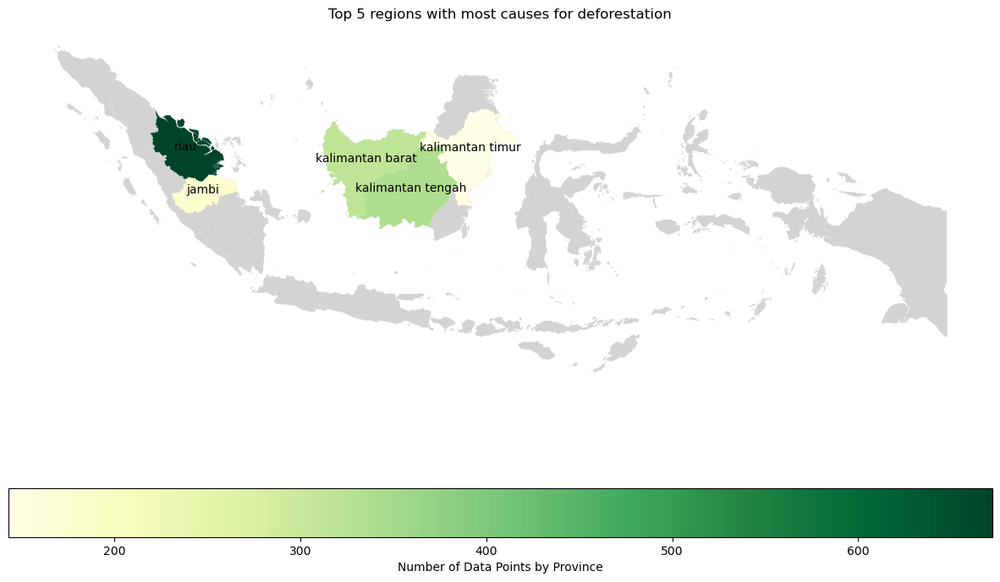

In [20]:
# Regions Map
indonesia_map = regions
indonesia_map['province'] = indonesia_map['PROVINSI'].str.lower()

# Aggregate your data points by province
province_counts = gdf['province'].value_counts().reset_index()
province_counts.columns = ['province', 'data_point_count']

# Sort and get the top five provinces
top_provinces = province_counts.nlargest(5, 'data_point_count')

# Merge the shapefile with your data points count
map_with_data = indonesia_map.merge(top_provinces, on='province', how='left')


# Plot the map with all provinces
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
indonesia_map.plot(ax=ax, color='lightgrey')  # This will plot all provinces in a light grey color

# Now plot the provinces with data on top
map_with_data.plot(column='data_point_count', ax=ax, legend=True,
                   legend_kwds={'label': "Number of Data Points by Province",
                                'orientation': "horizontal"},
                   cmap='YlGn')

# Annotate only the top five provinces
for idx, row in map_with_data.iterrows():
    if pd.notnull(row['data_point_count']) and row['province'] in top_provinces['province'].values:
        plt.annotate(text=row['province'], xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
                     horizontalalignment='center', fontsize=10, color='black')

plt.title("Top 5 regions with most causes for deforestation", fontdict=None, loc='center', pad=None)

# Remove the axis for a cleaner look and display the map
plt.axis('off')
plt.show()


<a id="Weather-Data"></a>
### 3.3 Weather Data

For our weather data, we decided to utilise Visual Crossing's API  (a low-cost, easy-to-use weather API that allows users to obtain weather data from any GPS coordinate). An API is preferable to an online CSV for our deforestation dashboard because it offers real-time access to updated weather information, which is necessary for having up-to-date data. Given the budget constraints and the project scope, we included only historical weather data.


The variables of interest are average rainfall and temperature, which are necessary for understanding deforestation impacts such as forest fires and droughts. We wanted a broad timeframe to offer insights into long-term climate trends, which is essential for assessing the impact of climate change.

Initially, we registered for Visual Crossing, obtaining an API key for data requests. When crafting the query, we had two options for specifying location: GPS coordinates or address. We opted to provide a GPS coordinate of a central point in each province provided by Geokeo (https://geokeo.com/database/state/id/). We recognised that weather there might not fully represent the entire province or deforestation areas. Nevertheless, with 38 provinces in Indonesia, we deemed province-level granularity sufficient to mitigate errors. We iterated through the provinces and years to retrieve data and then saved it as a CSV.



#### 3.3.1 Integrating The API into the pipeline

For seamless integration with Docker and the weather API, we create a standalone Python script to retrieve and save the weather data. Furthermore, the script has been adapted to receive the API key through the terminal, bolstering security while providing greater adaptability. The code below is  an example of the script, which is saved as weather_data_processor.py on our Github repository. Please note that the system was originally designed to save the output as .csv and parquet files directly to Google Drive.

In [ ]:
%%capture
# Retrieve API key from environment variables
API_KEY = os.getenv('VISUAL_CROSSING_API_KEY')
# Check if API key is available, if not raise an error
if not API_KEY:
    raise ValueError("No API Key found. Set the VISUAL_CROSSING_API_KEY environment variable.")

# Base URL for Visual Crossing Weather API
BASE_URL = 'https://weather.visualcrossing.com/VisualCrossingWebServices/rest/services/timeline/'

# Define the range of years for which to fetch weather data
start_year = 2002
end_year = 2016

# Initialize an empty list to store the data
data = []

# Define the list of provinces with their names and geographic coordinates
provinces = [
    {"name": "Riau", "latitude": 0.5004112, "longitude": 101.5475811},
    {"name": "Central Kalimantan", "latitude": -1.499583, "longitude": 113.2903307},
    {"name": "West Kalimantan", "latitude": -0.1322387, "longitude": 111.0968901},
    {"name": "Jambi", "latitude": -1.611572, "longitude": 102.779699},
    {"name": "East Kalimantan", "latitude": 0.7884397, "longitude": 116.2419977},
    {"name": "North Sumatra", "latitude": 2.1923519, "longitude": 99.3812201},
    {"name": "North Kalimantan", "latitude": 3.0235817, "longitude": 116.2049306},
    {"name": "Papua", "latitude": -3.9885728, "longitude": 138.3485219},
    {"name": "Central Sulawesi", "latitude": -1.6937786, "longitude": 120.8088555},
    {"name": "West Sumatra", "latitude": -0.5827529, "longitude": 100.6133379},
    {"name": "Aceh", "latitude": 4.3685491, "longitude": 97.0253024},
    {"name": "Southeast Sulawesi", "latitude": -3.5491199, "longitude": 121.7279646},
    {"name": "South Sumatra", "latitude": -3.1266842, "longitude": 104.0930554},
    {"name": "West Papua", "latitude": -1.3842356, "longitude": 132.902528},
    {"name": "North Maluku", "latitude": 0.6301215, "longitude": 127.9720219},
    {"name": "Bangka Belitung Islands", "latitude": -2.7410513, "longitude": 106.4405872},
    {"name": "South Kalimantan", "latitude": -2.9285686, "longitude": 115.3700718},
    {"name": "West Sulawesi", "latitude": -2.4974546, "longitude": 119.3918955},
    {"name": "South Sulawesi", "latitude": -3.6446718, "longitude": 119.9471906},
    {"name": "Bengkulu", "latitude": -3.5186763, "longitude": 102.5359834},
    {"name": "Maluku", "latitude": -3.118837, "longitude": 129.4207759},
    {"name": "Gorontalo", "latitude": 0.7186174, "longitude": 122.4555927},
    {"name": "North Sulawesi", "latitude": 0.6555692, "longitude": 124.090151},
    {"name": "Lampung", "latitude": -4.8555039, "longitude": 105.0272986},
    {"name": "East Java", "latitude": -7.6977397, "longitude": 112.4914199},
    {"name": "Riau Islands", "latitude": -0.1547846, "longitude": 104.5803745},
    {"name": "West Java", "latitude": -6.8891904, "longitude": 107.6404716},
    {"name": "Banten", "latitude": -6.4453801, "longitude": 106.1375586},
    {"name": "West Nusa Tenggara", "latitude": -8.6529334, "longitude": 117.3616476},
]

# Loop over each province and year to fetch weather data
for province in provinces:
    for year in range(start_year, end_year + 1):
        start_date = f"{year}-01-01"
        end_date = f"{year}-12-31"

        # Create the location string from the latitude and longitude
        location = f"{province['latitude']},{province['longitude']}"
        # Construct the URL for the API request
        url = f"{BASE_URL}{location}/{start_date}/{end_date}?unitGroup=metric&key={API_KEY}&include=days"

        # Make the API request
        response = requests.get(url)
        # Check if the request was successful
        if response.status_code == 200:
            yearly_data = response.json()
            # Calculate the total rainfall for the year
            total_rainfall = sum(day.get('precip', 0) for day in yearly_data.get('days', []) if day.get('precip') is not None)

            # Calculate the average temperature for the year
            valid_temps = [day.get('temp') for day in yearly_data.get('days', []) if day.get('temp') is not None]
            if valid_temps:  # Check if the list is not empty
                avg_temp = sum(valid_temps) / len(valid_temps)
            else:
                avg_temp = None  # Placeholder value indicating no data

            # Append the results to the data list
            data.append({
                "Province": province['name'],
                "Year": year,
                "Average Temperature (°C)": avg_temp,
                "Total Rainfall (mm)": total_rainfall,
            })
            print(f"Processed {province['name']} for {year}")
        else:
            print(f"Failed to retrieve data for {province['name']} for {year}. Status code: {response.status_code}")

# Convert the data list into a pandas DataFrame
df = pd.DataFrame(data)

# Group by province and year, then calculate mean temperature and rainfall
grouped = df.groupby(['Province', 'Year']).agg({
    'Average Temperature (°C)': 'mean',
    'Total Rainfall (mm)': 'mean'
}).reset_index()

# Pivot the table for average temperature
avg_temp_pivot = grouped.pivot(index='Province', columns='Year', values='Average Temperature (°C)')
avg_temp_pivot.columns = [f'{col} Average Temp' for col in avg_temp_pivot.columns]

# Pivot the table for total rainfall
avg_rain_pivot = grouped.pivot(index='Province', columns='Year', values='Total Rainfall (mm)')
avg_rain_pivot.columns = [f'{col} Average Rain' for col in avg_rain_pivot.columns]

# Join the pivoted tables
result = avg_temp_pivot.join(avg_rain_pivot).reset_index()

# Define the CSV file path where the result will be saved
csv_file_path = "data_weather/historical_weather_data_annual.csv"
# Save the result to a CSV file
result.to_csv(csv_file_path, index=False)

# Print completion message with the CSV file path
print(f"Data saved to {csv_file_path}")

In [ ]:
#Change to parquet file
uploaded = files.upload()

csv_file = 'historical_weather_data_annual.csv'
df = pd.read_csv(csv_file)

parquet_file = 'historical_weather_data_annual.parquet'
df.to_parquet(parquet_file, index=False)

files.download(parquet_file)

#### 3.3.2 Docker integration

Docker streamlines the creation, deployment, and running of applications by enclosing them in containers with their dependencies, guaranteeing consistent functionality on diverse Linux systems and facilitating easier deployments. To manage project dependencies, a requirements.txt file enumerates all necessary Python packages, simplifying installation during environment setup. Additionally, a Dockerfile has been meticulously prepared, providing step-by-step instructions to construct the Docker image, which includes selecting a base image, designating the working directory, transferring essential files, installing dependencies specified in requirements.txt, and defining the execution command for the script.

**bold text**![trello1.png](data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAvAAAAFCCAYAAACXTOmZAAAAAXNSR0IArs4c6QAAAARnQU1BAACxjwv8YQUAAAAJcEhZcwAAEnQAABJ0Ad5mH3

```
`# This is formatted as code`
```

gAAP+lSURBVHhe7J0HeFTXmf4HF9wNmGpjwPTeOwLRkUASQh1QQ71LqBdE7zbFNrZx773FsZ04cYodO3F6sum76T1x2qZsNtlk9//93/c798zcGd2RRhg7thme5+X0c+8d3Tnnd7757rm+u574sJyZXnqP6T12zk868ipzy9aLKqqzJa/77JxX6Pjnllf9t0tex49Eb7X92687I9Hj73V9KEQm/w6Xguufudx93oFjdavH3tu6/d2qR3vSi29Zpz3yehLbvGv0yFvRC37ddg7Kd/T6oxKJru+i6z10g9ENiFOedbrRDWzbtf0N6NNTqOspbRMir3qqY34dQ1p1jEIauqEbmTq2fqCN1XEPhdaJXO7juI53vGcd9+t4hHK36Umh9UP7ilTuPiKRVx8nQuRVJ1KFO4ZVJOdjFVr3bOrsHM99vwTu7cjU073t/77wO+bK13So3OWuOuY76vWddeTRLqiNjheBdqrr3bJ9u+pD/jGtW3Gc8sr3UmBc674snLzG4m501Ojo0etdQvqIt64PSR95KzrcOx3260gYHZbDhyLXIQ8dVB1SmTyEB4N1MAIdcKlL/gG3DgZr/4Eg7T9gtM8t5Fvtt3Vcobtctc8VurTXag+1P6z2ULt7p92qfSHaK7t37ZVdfiEPYmi106+9jvYEaddOo51WndTugPx5AXVCO1Bm1eHInRdWOwLqCFXHLm/tCKjdLZSFqq29O+0MUae0eqktjFqNWvzaEaTmkLTNa24JqCmsOrpXM+qoGA9Wo6rdr4amHtTYLvUu1YVVW1c1tAaptke1SG29I8TroBor5HXRdqNqTzVLlVt1zVJZ1wQ1OmLaLZYZVfjVEF614RRo7wtAc/cKmtxUziQYTphEPfO7E9u45S87HkYeE/ex44FJPagc+T3ouJUDQsdUJ7ooPCSGlgXrhEdepDqB/rsK+SdQ3oNYx1snPeRV792q0HO/MUTuMq/2oQqt706HKrStVaT13l0KumdC7j23zvgePobvDsTQnRdWnnXwHVOZtL8/ytZ3tWF58HfcybvBFfrlrgcxHTTWdKfuxqhQeY1r7rye5DUWewgLAreuxyIlIKSPRiDUO2qFdK91JLyOdKvrw8gb/MMpsCAI6JDqiEoXBYe66lAEOuhSl/yDbmHB0I3cCwGr/RTgn9JFgCvtqf2uENoXpIOA+e61l9rbnbAAcLSnWwHunQXBbhXyIIbUriDtdwSwp7AA8JSCv3tRYBYGoQuCTtXe3mvnXtkRTrowCK+OcNoRULundocRoD5UXASEk2sx0Kra6VeLI7MIcOW3BavZU50eAvC71Yp6KpSFqEkFuHfUiAVBWGERQDW4VB9WHd7CIsBqe49qC1JdI8BfFbwwqG0wqnNk0wGZBUGNW/WtUq0C3Kts2qoZMmVVfgH8/WoyCl0YeMq0PUOA95pYzoIA2l0h3j35hao7UPfK61k9AXwQKLyDOnECwB6kbgDMUWid959CYZkKBXfKq62XQtt1J6/2VKT13l3yun9U9v5zyX1fRiwA81tVELA7aX+e6xg23yj4+63C2BFcB7JQ70879fxjTUDusnB1vMXxLFTh8iNR6LjsEqA7IDe8hwig7Sm0szojiAeIh1MA0t3QHqpQeKe8QT2cvABeBcjuTm4g71GAdLeC4b1ngKdCAV4FILfqAuzh5AXvViHQrgKcU97QbhWA94gA3i2F+R4A3gvarRTSQ+HdypQHA3wvIJ6AjtAT3K0A4z2pe4CnJd/ECe4m9AJ3aleQegR4F7wHIL4rwAcJcB5QZxiAJ6xHoBBotzLwHgzxnuBuBTB/ywDvVwDku4d5B+AB6lQovLsB3luhVn0H5gHp3SkA9qEQbwUwpzyB3UstPQO896QRmneWBNgOCBMb1WUSdAtwbtUF1r3yuldPFvguUPIOqrcAH1r+/lQoLHvJq104ebX3kldbt3pb/92hsPcQ7z+XvO7PiAQwPlMFwXUYedcN/o6rMHao/Hmo1wXg3Qoed/ztXXKXh5czzp01cSwOIwB3V8u7hwDbntK2AfUK4AHg4RQM525gD5Ub3ClvSA8nT3C3Anh3J09QDydA+lsFeCoswCPuCeteArQHIB5w/i4AeGuJ7wLwuwnvVi5odwtA7g3vRhbeewvxfkB3x70EGO9JkQK8TUcC71a9scAbgA9AfM8A/xbgnXKA3RvcrQDwXtDuFsDcDe/hAd4L2L0UDPFudYF4gPpZA3gPYA9VsHXeC+AdecK6l7oFeK8J420WYDsI4D0nQbcA56HyT8q9lwEAB+BtPsDjXw7wClLdALxn/febuoNhNyyHyqv+CbnpxpNy6uabQnRzhAptF6ozaRMsnp/XeZ+pukB5b4X76p0G+CCgjkDh2wR/z4Pg258f0iYE4LuT99jkljO+nXWFQLs7H8DdI8ADtnuUBXjEexTAO5wCUB4K57YsVO46EMC7N/IGdytvcLfyBPVwAqSfDYCnDqhcAG/j3UL8wS7qAu/hAB7qjftMzwBPBQDewLsXwLvhvRuIB4x7gbuVN8B7Q7tbnrDuJcB4bxUM7Aba3YoU3ilPaHfLE+ANxL+TAO8N7xAA/cwB3gJ55ADfgP4C50c3n2DZXwSMOgL+/FBjqNhfWLV3FRYFVNCCoZFgb/3pLch3Y4WnW4ynvODdKCzA34BJ7Mwnn9AJzEte7dzyahOq4DYBgD8zkPfDg98Cj8nbJU8o6UFvCXoAThFBl0dbPa5X3YgUGQR3r7MLoD2fiy13y6veCbkRcLx73yEpr22XMoihUUeEcrcJpzNpEzgfnt/Jk+GvoWd1/xn4Ze+VcPeMzXPVCb3Xzlj2+xZGXaD6jBXyXcfY0SXPq10PAO89Jlm5x7DgcSoyhUK5l2ydkLqAcytPcPcLYz3Auyd5wroVYDuceoRylVc9KqQeALw3Cg/v1FkAdytAevcAT3kDu5fc0O5WJOBO7aN6AHiF9nB6WwDeQHxXaA9VCMArxHvDu1VXiPeGdrc8YT2cOilvWPdUDwAfDPEuWHfUij6acdzmnfukGcduRroVdbsD+I723dLpiPF2iCDvBe1WfPi1DSDbDjFkujuQb0J+I/ps6Ngt9VADjsG8sADfgnYA6haELc2d0goxZB7BvQGQ7JYXkPdGhPeahjbJ2lYtKTmVkhZGqX5VSGp2QCke2rQ1nMp7VPLmctlSUK0Pu9JCH4D4YID3Q3wXaHcLsF7nra4Aj8ns6LGTmAjOdOKh7MTVnbzaueXVJpxMGwPwVphkPcXJ2SvPBQ8OYLwbAL4LUHkppJ1N22N7tulWFv4ihMBe6Wz3ZxXZ+d58002yZ/8hmbUyW4ZNS5LhMze+6zRsepLMXL4VE/Jhuekm+vR7X0t4uT+L7j8P/z3ivlfc90xIufs+e8tyf+c85Afpt6zQ77uXPNp1A/De41A4hY5tPckDyj3lrueqDziPDOIx3jMEiHvJE9hDBdj2Ungot6FVaJ3QckeA8EjVBd6pIHB3xyHnoVa/kNcrAdK7h3hvWA+vngDeG973e4G7lRese6kLwFO9gXgveIcA6JQ3uLsVCvHe4G5ldrKxAO8N7F0UCund6S0DvFvhIb4FbZtwDTvaO2Vvc7McaGiU/Y1NsqulTVrQtglAHwrwOwDRO9sA/B07pbZjh1Tt6NCwGaDdiXwF+Tb0rTLg3g643kELM+pUd+6T8p0HpKpzvwJ5B/IJ86HwrsAOtbe0y+76Rtm7vV46G1sU3rd37JVG9BsK763NOBaAvb61Qyra2qS0rVUqW9sVtNuQT8u8H97fIsCzz+0IVyQVyKDJG2TI1IQeNXTqBtUQR4PPsngeQ6clyMYtZcKHZI0l3rrQuNxpPIE9VN7wTnkC/PUK8M5kcEbymsS85NXWLa824WTavFcB3quOH6J6Umg7V6jyatOtegGAvdLb0adVZP3eeupmDDi7pf+EeBkwMV6umrT+XSeeGweAHbsOyM03v8MA71ZIufseO2tyf+9C5Adpj3TvFPp991JIGz+8Uyh3yXv86U6h41pPCgHysHLXc9UHlEcG8RjvbQgYf+cA3sbd6dD8EAHCI5EnvFNuaNd0AOCD4P1dD/Ae4G7lBe5WXrAeKk94p4IBvluIB6y/UwAf2IoyIE9gDxXAPGKIf5sAPgDxgGsch+Htpfny8aRl8s1l4+WHC4bL9xaPks+tnS1PbE1WoCfEtwKkCe87aQEHuKfsbpJp+8tlwKFtcsHhHBl4qEBm76+QjF1N0kLIx1xnAb6DriMA99SDN8msUw/LwHs+JBc88HEZcM+HZdotj0nyoVOAdYA/gNoP7zjvnY3N8kBehryyYbF8O2asfH/hCPniqunywdR1cqK8FH3ulHqejwPw7YD3OoB7ws7tMml/qfQ7lC8X4twGHdwms/fi3DobpVEt9J1nBeDpElO1vVWmxGTI5WPWSf/x8REoTtXvbdTlY9dJTHyugjt95w3AuwQ4t/IGdytveKc8XWi6ThS9ldck5iWvtm55temqwKSKNt0CvDM5h8n3wwPA4gTzEAYDvOMfr/GzKzco+RUKW+Hk1H/L/Tg62QUAe4DAiNR9nydd8TNT1z69RIBvwqA2cJJZJQ+ekvCuE89t6LTEMADf8zUGPosIPhOv+8UqpDz0nn3Lcn/nPNTle+mSLbPl7nRXhX7fveSq343lnQodf3pW6LgWTqEw3tNY3EN9wHlXgMcY7yXA+NsP8JHIA95DdZhyoF3TvQV4lwjgFtytLJhHKkB69xDvBendyQXvQZb3MAAPQO8W3iFPYA9VF3B3q2eA300R1s8SwO8EvFNe8E69GwHeG9ytugJ8K6B8T2ubvJSySn4yb5j8atZA+dmcIfKzuUa/mD1Ifjl7oHx15VQ5VV6sbjWdgOyKzg6ZdKBMfEe3iu/IZmhLQEc3y/lHtsqsfRVS19EpHZjv6CpT3blfZt78iPR56JPie+RT4nv4VegVEzrpybc+LqW7DqI+4BiLhRuqKuSza2fJL+eY87Dn9vM5g3GuV8n3F10rT2UlSGtzOyB+F+B/pxS0t8jY/SU4D3Muoed2wZFsmQuQr27DQoFWer+fe+T+7m5ZgJ+2NFP6jYuTqyau99SAoLgx4L2dIsQvXZ/nALz7QdbeADxAvXcA75oAXCIUnzx5Qm48eRLi5I7JDHldJg1n0uJEyEk/eCLzEvoFKJh+ARvaxt1fqNAGE659yLXLcbQM9TxB3k7SXnkBOGB/N564UY4DfixshMK8AfrIRZC66cYb1YXDuEUE+tbycHLDlpdsnZB2PNYpHIu6Gcfj365LWw/R7/qmG28KA/GUV/2u+d4K7cvoRpyr/u0923SnkH5O3qjX3d359ATw/HJfOQ6r+AlcRXM176zUkRdan19S1mM4aHJwP5Fo4CRzrNB+uwK8+zq9rytYkdZzKeT+UYWUue/XsyrXd8+v0LJw9Vxyf5eD5f6+RyCOK93IP9b0qJBxKygdTmFgPKzc9Z02XcAd43pPAoz3Gt4pQHc4eQN6T3KBeqQCoIcCfFiYJ8g74G719gN8byHeBfBQtwAPOHfLC94pT2B3yxPa3eoe4D2hHeKLpAj2up2kJ7C75YZ3A/DcI36PS28J3K0A5pECfOdOb1D3kje0uwWQ7qDLjIH3NsA4Xwz1cvJyhWGCMSHeSyz/TswYubmqUip27ZKRB4sCcHyYcEyQd8T0YZShfPL+MuG+7Y0de2US4Nz36GsOtEMEeSubh/LRtz8t5YD4Y9WV8m/LJ8mvZw6Qn84das6FoRXSP8cCg4uMZ9Pjpa11p5R0tMvVBwpd4M5zCjk/B+Sn7SsDgO8QvhDKvfuMO27kDe5WPQE8Le6Xj16j4nzLPDdoh8rO/15lvREBPgYAT1g/M4AHpHsBvCsdBPCcAMIB/BEM1p0AilbcCG079sne/YcwqRpIDq5rJq+jR49h8OHbAN0TWldx8tiFAaIVfTa378EX9iDyQ/sMkQK62YmlpX2f5JU1y4FD1+NcAPLItwBvIB6TbpBCJ/TARE8IOHn8JAa8I5Jb0iSdOBc+8Eh4eCsAT8il9u4/jC/tfuncfVAnP56/rRMETo40n3Vc9cLV9cMWhTSvoWPnfmnH8fZjAjHnEFIvRARf/m3zy1rk8JFjCsTB8NgVDPkZHsYkyi03Q8u6Krg9z4k7tNQ27pTSmnbdfYV57jrdK3Bet95yM+7d41LbtFPvzXDX2h3AMz1qbprMWVMgo+alyYyV+TJ+8WaZtHSrzFiRJ0OmJgaB+vBZm2TcoiwZPnOTfmHdffUkHmvE7BSZjn6vnr4x6Fy6t8AbeX1OvObefX4uhd5PVEiZ+x48Y/F7Fi7frdAyrzohcn+Xg+X1fXfnhQj3UXfyGse6yhmr/IqkDuVAeMRywzvkgvczBfgukN6dAN3h5A3oPckD0HsSwNxLngBvBfD2A3wE6rZeF1gPJy9Y91KEAA8wf2cAPhjePQHeBe1M220wtzd1Sl5JI6Cj3QXq4RRsfd+9l6yxSwrKG2VrYZ1sK23QbRq9IN4L1An/Xd5aC9Ffviuo79Xz5htsuRjhOXBXG4I2j6nA74Z1R/64J7Cb/d/dL3DiQ6J0gdE4xvcH8zPlR1OvlJ8Bgn8yZ4j8eOZA+fH0/vKjKZfLj5H/45lXad6PJl8uv5p4iXx69UxZtqcC4JZtYJiwfjBTfIcIzEgfyHDSWSiDAMvxu2ok7oa7AeifAqxbUEf8kVcNvNs4xbJHXpNlx++RVxMWy5tYOPwE5/ZjatZAnONgJ41w3lDNI8T/eMG1cnNpgczaXwM4xznx+DwnDW3cOcdDOD+cWx/E43fWSRvmbPcuNFYBoO/+QdfuAH7AhHg1lK3LqpeUwg4ZMSdVrhi7Lgi0rxi7Vs67Zpn4hsXIJdetkiGYewdiPnbXORO5AZ4vegqCd5UXtFs5oO4F8C75AT4wCWDAD5kkOHkTsMfMT1dYGYtwSsxmhVxrmb8F8EVxwr8JEFEGIItLLdeJ9eQJY3kmPNFCaicw9rsPUDt7RY4Mm7ZRrp2VIuszKrSPW0/dpFZZ9kmLvz0PpmlRPoVyQltxZassWV+AL99hueXUKbVu34w6LNedZDAhsz7rMjRQcFwt08yjtZnnyPO7BTB5+pZTAN8DMn9tntTgxrr9tlvQr9kK8FaUncA5Ed5vQv3bbj2lZbchn7AbBB2OCFS81qyCepmydIuMnpcuk5ZslrLqdu2P56DbDKK/Gwmi6O929os8fg567reaOD871qd1nPX4WdyGkOfMhQbr8HgsX7RumwyalCjXAUh53Mr6HfqZnEbf5pg4Htrchr5vvw15KGNeSXWbLIorkN37jujnedutt6DNLXq9BGVCPtuwnztO34Ibs1NWbyrVe4bnynOIRDw2/1bcbWVxfIH+DQmszLfX0rNYjwuTG2UnFlsJmZWyJqUU91C53iteMBsO4BlnXlnz9fLUC5+Uex59UW6++2l58MmPyF0PPy/3PfYhiUkq1y87B4ZRc1PlyM0Py92PvCAnbn9Clm+qlMvHrJErxqzVUP3ZUU/z2IbWdoQULfp9R6yQdZn18qk3viqzVuXrlz1SgLeuXO7PidfKtH5PXHV7JXxmQQqT73WfRyx818LmW3mVhdYJo2BwtzLjgJFXXojwfe1JAQgPp+Ax1LsOFVqvt3KP3YExPADvEQI8BSB/5wHegnhouhdyu9R4qCeAt/KEc0dh63iCenfyAvZQhQB8EMQD1MPAO+UF75QntLvlCe5UV3in3PBOWXgnANMHvrSqRdJzayQ2oVDWppRIXFqZwjzb9gTvRntx3vslu6gOY+FGGTIlSfshSLO8J3inBX874C9rWy1UJ5sL6jS+pXC7NLbs1HI/vKM+Abuwokky82s1rKhpk+rtHZKPxUdtY4da4mlBDwX4cPAeDO5GbS6Ab2M/7Tvks8lL5fdbV6s1+2fLx8nP18+SX6TFyJvVWfJmZbr8InWJ/DxhDtKZ8ofyVPlB8nxZtT3eADyAeNBNZbL5g6dk8M3lgPd0GXtHvVR89F7Z9qE7ZNAp5B1Mk6uOVsjgu55VMPc9TIv7K3LB7rvlvOsfA7y/KuefeEr61p2QC3beKb4HPo6812XoHR+Q19bMlN9Mu0J+lbtWfpmxVH6xYZb8uihBfpWzVs/rp0tGyZulyfLz1ZPlzRkD5Zmk+XLZ4XxA+mYZf0eDjL59u4y4rUZWPnZApt3TKiNvq9VfBhY8sFOG3VKJeIZct79IagHn1gofCvB8QJWq49aMHvBOdQfwVwLWN+a3yv1PfFgeeuoj0rjnlM7F/HXdQPY6uXZ2imyt3CO1O07K8pRqad53q8Q687mFcVrk7XNzDIPj3tb6ngCeeXYHmgDM822tgPMewN3KFzr4G5g3EG9BnpM2reNjF6RLanaN1LfskuWJxWpB3N68U8sSs6okeWu1Wn0J03NW5crV05PxhcGqGUDMcH16hVTW7UCfmAQxUbLfvQC46cu2Slx6ubR07FGga+nYi/r1uJAdsim7Gn+kXepmQ0hLyamRvNImfCHrkb8bf9hdkrS5SvbuPyLbyloAoO2SW9osW4sa5OChowqzVdt3yAbAHeGUx+Ue70UA/4SsSrXYckIvrmrDSr9FCirwYTbslPWo37Zjv1TgfE1+q2Tkb5d9B48ClG6UhtbdsmlrDb7srZK5rV6v0Q3xCpYQ62YXNeKzSpV0tG/t4MCyC6v8Q7ieQzjPRinBsStxjpwQeSyCaCmug/3ws8gubtRfQPg587oO4LoKK1ukorZdclDGz+IgJiUCnAI8NG91nsxaka0PbM7F32IWFkkNrXskv7wZ19qq183Ph+0T8flVA8S5IODnyc/qMCZTKjMfK9ecWtmF8yXg7ztwRBcjvA+q8PeZvyZPhk3fJGm5dbqw8YLmUBHcCacJWRWSjL9vMf4uvP6NOA9ee1vnPtSJDOLZF88pHvfWBiz+NuO+WZ5UpH9nL7eccADPFffQaUn65d1x+A75wY9/KQXbD8mrn/mqwvyu6++WrJKdcul1q3VVPwGLsM99+Vty9NTDWqfz8J0GyrHST8huxmJ0k4xZkCGJuS2ybGOljJqTJkuTKgD6VWrZX5JQJq37b5M3vvh1mdkLgOffmH/rFHz+/K6dQjnzuGjmLyfb8PcNZ7WPWLx/9R4Okc13yd7vb6vw/fSHNu5Ou2QB3R33g7k7z+/nbmXrQDbOMDQO6fjlCrvmuwHbypR7y6v+mcqO5SYdgHgrF7B7CeOMhfhuYR5jQ08KBnUrQrc7fhaE70NPigTgqS6ADnUpB4iHd5WJRF7QHpAb3oMgnuoB4r3gXeUF7W69BXhX7UEZ4J2AmohxnWNxanYV5vtWheaEzAqMu7tQ9yAAvDtwN+IigKA7d1UOYChBRs9Nky2AcII04TsU2EO1c88+zGntOG455rcKMEKFhhu3VGKO24Fj7PcDPI/HvEXr8mV1cgnm63osQFoxv7ZJEhihuLJZcovrpQ4gb/zyzTlyMbFT5cR3mdAAu3GTcYsAz60XW3FdTbv2y4nyEvnupiXyv199Q96s2yq/BBT/bneN/OetB+SPdxyV3zYXKCwz/M87rpfftxTIb1Cnc8t8gFuOWrbjnrxeXvnpt2Xr87fKJUdz5PZ/+4TseO1JyXvhNrn2tmpAfRrqFonvnkcB76+L77HX5Lybn5XLMprkkoK90uful+TS4v1yacEeuWDf/dLn/o85lvlX5J6MDfKriRfJH08flr88erv88c4b5M2KNPnjbUf0PLng+K/nH5FfZa+WX0+9Ul5fPlqG7cbxcF65OP6OTz0pez79jGQ9f0qKPnyXZD13MxYUGXLjF1+SlY8dFN/+VLnsUJ5sbW8KssJzm0k+DNsIVW3n36BccrCQI8iHB/iWLgDPeZrW9l1H75bkvDaZH1csR295WMYuzFQ455xLd5lDNz0kn/nCN+TUvc9IZdtxeemTn5P04h3iG7pELhuzGlqjczt1+dg1chHCi0etVGv9RSOZv1zr9Qbgma4koHMnmoYWfE8Qd6DdHffLBe1ueQK8hXcrTtRNgMcJizKFe1rTYrsHoE1L/CZAO63zhMxlCUWydEMhAH+3zFyeLYOnblQga27fC0hrl8TMKpm6bAvgcReAw0AGLfCsO35hhiyKy1fLPQHz6hnJCmI8xuyVOQozSzcUyDh8+LTWDpqcKKk5dYD5ZpkaswUwcxBf9jyZtDgLH1qhLh4I44TMeatzAZi1CrIE9xysqhfFbZP0vO0yF2U1AHae+4hZKbISX+BtgOgx8zPwAXfKiqRitZovSywCqG5UQGwHrE9ekoUbZgva07UiSc+bVnwLF5z0ueg4jMluJkB6ZXKxnARo0RLO89qBPirqOvQ6WZ6Lc0rEYDEe18fFDz+PvLImBfaJ+Nz3A7YZHwso7Nh9QOasztE6/LyHz0wB0NU6Vlj6u58EWOdLDMp4HqwzC58hFz78pYOfB+MrN5bIRHxeczBI8m/LzyoX+fyMW7DQWJtaLmtTyvRXkeX4HHbguEvxOU1YhM8YfabiM52Bv93QacmoW6b3SiQAT0s93ab42Wdu264LA/4CwHPi37odYBqpNZ9tOzAYxuK8+ItP0pZqXZDwOsyCJrh+TwDfduC03HDrI/KVr39XTt//rHz+K9+SW+97VjqP3iUZxZ1+gKfrzBtf/IZ88d++o8qr3i8dh+6QJz/4SXnq+Vfk2OnHpKL1mNxy77Py0Vc+Lw27T8lLn/iclt/3+Ifk2Q+9Ks+8+Cn5wle/rW40kQI8r4cuVVtwH/I+58Lq1lvMZ7cY9zS/i/ylxt3mjIR72DPPLVe+H6rfDgG4gxSmzA3owWmAtcpJd4F3ytZxiXk238YhN3x754dCNeUuD5VX/TOVezxHugvAUygLBXe3MGa5QT4I2t3xCBQM76HygPHeCjDuBerh8v0KAXOrUHinupQDwt8ugA96mZNLwQBvIP6AB8R7wjvlBe1uBYG7VYTwTgHgaX2vbdyhYzjB+dChQ7IbIL0utVTdYPYf8HqJU1d4p/bu3ScFZQ0yfMYmnes5N6fnVoe1uIeKb1ndg/Opru8AvFdK8tYqxxjYqb8UWHinCOS0svM8+SsBXyBVVNGs4J6CRUga2k0Ht/CXXQVKLATiULe8BosTLCo2IH/ztjrwTblsxLEacAxa6bsD+IbdB+WubVvkx3Ez5W8vPgZoPyi/bSk0sH7zHvnTXcfkd50V8suMWPlNfa786d6T8ruOUvn9ivFyZ8IktcCfdz246PWnAMnPyk6EM+5tk1u/AgCn68zOBONKo242SN9xq/gefUN8j78ufdtuk4tLDsil23YrzPftvF0u39ouF9Air77wAPhHX5OdJYXys0mXyB9v3if/98ff45xukB+N7yt/vPWQ/M93viZ//fjz8rcvfRrnuEx+ObWffG3JCFnYuEGPt/X5W+Rrv/mp3P7VTwDU0wD0p+Wp//i8HPrsB+VjP/6GzH9gp+bT3Sahc7t0uAC+Fguv7KLtCDuwaAI3AuAz8/i36wrvFLekrKrzBvjLx6yV+l03y6c//3X9tTyzdKf+Ck4Q7zcBAD9+nRroXvn0V2Tq8hwZhPn3Qx9/Qz726hfkuZdek7SiHZJfux/x1+X0Ax+Q1em1cufDz8sDj39YDXB3If78Rz+twH8pgL4rwOfiHmwBYxorO+GdO9IUVzaCu7JlfTp5s17vL+4xn1+6XSbHZOk+9dubWs8+wJfVdMhtt9ws+w4cVoDcuKUKq9edgOFahWICId+2Rkv5bIAoJ4z2zn1qtY1PL1c3GVoKb3Ygg37hBHhaiwmwtO6XVrcBIjNww+9TsCXUEsjGzEtTSy2t0dNwwbSIE7bZfseug7Jwbb6CJC2y05dv1f7o3sFzorsPBxZa1gmztFDnljSjn62ytbBRlgPQF8cVYHI6pgsOHrO6vlPWAGDp4nEQE86S+G0Si3qEzskxmzEwHlEL+WgsMriwoesOrb579h2WrG316Je/PuyXqQB9WrVZxvZcCNBizGvhZ8pfGvbjnCdhUUBrOj9flvM8eSye9xFMrLTOcwG0A5/vQix2+Hnyc1yfXgmQzlFfdIIvIXoh/haDJyfJePQ/CedKCzsXDFwQcYHVATikSxR9z28BPC+JL9TFCy30PAZ/kRiLRUxCFgc+A+q0xtMlZzva03WIx+LCiJ/hAUxs5uFcF9h1I4I3zyM9r07vJV4f7xEuhHg+Xm1CxevkMw/sg7/+5BQ34HOu0Gtah/ugvnW3HsfdpnsXmvVSCeh++dXP609tS5PKZWvFbgXu2x98TlILOoIs8K9//mtS1Xpcjtz8kLz2xlfl29/9sSTnt8nGvFb5yje+K48++zH54Edel5//6rdy2wPPyide+5JsLtstH/jwa7J9502yNnM7Vv5f77ULDRcm1BYs6LjA5HctBotaLnz4K0po/bcsfP895SoLguqzLUB3F3mUBYA9VABsd7q3AB8iC95eeeGBPLSOW171w8nWD9cueDwP9Yc3ceYbnRHAM+yFvOGd8gDy3ggg3iOoh5MLyt1yg7tVl3JA+NsL8MEQ74d3KgTgDwDOIwJ4yBPcrSKAd8oT3ik+pKr+7/uloWWnrNlUgrmrViGYsEvw3kvfcj/Ae4O71e7de/UtnSuTzHxJMN6xc4+WWUjvEebRB7dSrKhrk7zSBqmqb9dtGFnmBnj2SXeNhevy1OKfkVcjKQB+Qnkq4D23pEGvh9eSlFWBORxz5cZCScWcw/w0jL8FpWSIQgBYg75AqaMzGN5DAb4RAH9HQbb8KHG+/OX2w/JmWar89cNPyO8PNckfjrUD2nPkZ6smyk9jx8pvqrPkN7Vb5OfLx8tv518jtydP14dAJ9zVJB8HDD/+nc/KM//xRUn7wE1y19dekcnIv+pksfS9IU9dVvSh0TtOi++xz0qf+16WS/N3yxWJNXIldFH9SbXC9227Va5IqJbzTr+g8E53m31FefJzAPyfTh+R/37tI/KXZx+QX2xaKH9E+k+0xhcnyV8/9pz8cssqBfivxoyQOc1YOOCYeS+elvu+8SldUMQ+tFfykW565RGZdGejPPCN12T5I/sV4PtggZG0o14BnltLbm/qUFenRXF5koW/Ay3xucXbZQvyvOCdCgfwnKuT8lrkwIn7ZUlimUxbnit1nTdJ55G7ZGLMFrW+XzFurbqFH7rpQXnjS9+Usuaj8uFPvCEHTj4gdz70QXWd5VxNF5wf/uSXcsMtj8o3//2Hsvv6u+WDAPzXP/c1+cSnvyS3P/AcjmlccroHeMZbwTlNKMsHt1RIUVWjLFibi/uuSgor6mXuanJfte4f3x3AV9b2AuDpvkGozQY07MYXPD6jQuEwv6xZZgC++ZM+YW4ywIbWVY3jQ6KFcNXGYlmwLl8KKlsV+vNLm/1WQrrQzIjFHxELAVr1Dx++XkGV0H0Icfq406qeD4AnPNLS2NTGc8kAUAYDPK3OyVtrdGLn4oF9EuhHzk6VjfiyEfIIsrT8sk9a8Oke0ty2V63UrEu/dgI8rdBVDsCvxPkTVgnfBH1CNj8LuqTQms7zsgBPt5n9B4/ij9KmLjt8kJcW7NFYfFQ17NDPYyE+C/ZD9xw+S7BrzyFdlDBO0Gf7pesLdeGwtbhRxi3IkJrGndoPFw6dGCz5awXPeTfaLkG9RRD/Vhbg52MxM3HxZv3FQa20gGKeDxcTfKh1DxZO/JWBvygQoOliw589LcATgnldXLSkAZBp/SfU87PkZ84+jmKyz8iv0/Pjw7K9sfwSpLlY4y8biRic+ffh9XKRQR99rzahuvmmk1KBRRB/FaijKxcWU1zo8dp5/3FxxV9F3G3CAbyFeL5EaQI+N1rkL8dK/ZoZydKy7zb9QnMA0C+oA/Df+M4P5YEnX9IV+KPPvizPfvhTci9W83c//IJ85JOfl6996/vyzIdelW/9x4/kAQwAL2NVPxmLnVvvfVbB/vT9H5DvfO9HMmv1tl4BPGUhnotEPq/BRXLoYuWsCd+nnuQH6rdDgG5PhZQFQboKcB0UOvICeDe4WwGSvWTBOzQdHqqp0Hqh8mrjJVvXq03wWK5yAXxAzDfqDt7DArw73Qu9FwCeCgfwofnvlAW+O4APdaXxAndqL+UF7lZB8G51BgAP8TzKqltlWUKB/rqbllOt50prPB8sVYhn6AL2UO2Fmlp36q+KyVsrtS13oXFDe08ATys8XWkIhmm5NQrzXg+w8ni0wK8GjNc0dKhfeyrOeTOgkZb7gvIm9eEvqWqR9Qhp0a+obZUaLAg2pCMfYN/Wvhs8UiOLsAgorW5RVx8Cu1UowPNNq0erq+Xbm2LkL8c69EHVPxzvlN8f3yW/21Mtv7++Vd6szpBf5q6RNwsT5A/bt8ibsdfJT6f3l5rcRYDyLMkGFJd+5B7pe32OVL58v2R+8GYp/PBdcvOXX5aajz9o/MzVhaZU+tz7JAD+M3L+jU/LJcUHpA9A/fxjT8hl2TvkwqZT6kZzCdTnno8qwJ/34MflsU2r5dcA+D8cbpHf7aqU39RtQbxZfo/0b7ZjgRFznfzxrhvkF+kx8utp/eWVlWOl/74MBfj4J49K3BNHZcNT10sdziXl2ZOy9OG9Cu2VL98nc+7r0HPrfyhf8tqbpdWxwHMhVVPfhs8SrFbfqu4x/DsQ5r3gvb65HX/fDqkEwE91ATznUwL1PY++oMC+cH2JLNtUpb96f+lr/y7xWxrVNWbApPWyPKVK5q0rUoPb65/7N3n1ja/Kmsw6qd91k7zw8qfly6j/4FMvyXe//1O5/f7n5JOf/rIs3ViBOfw1ncerOzAPV+wxz7e5/OHDAbxfzIOsG431fdcyC+5hAJ7w3iuAJwzRes6fsiYuzlRrMf1tD2BAIpAybzFgj+FOfJlpVb5mxiaFXoIh3VDo+sKQEO62wE8DVA6bnqw+9vSVyya0AtAJv9uwQBiDNoQuWlUJwsuw0iVc0sqtLjRoTxeaOStz1WLMyW0aFgX0sW4CjE9HfBLOi6BLKOKr6gnwBGZa6PfuO6xldCmhZZkLhOvmpquFnHnLAMqEYgImXUfYB4/FRcbSBHMurGtdaHhdhFmKeVyYELZp0eYDrLyGTIAvAZ4LAcIv4Z/+6IRhXjvPuQHXTPcQpqcu3awuQPzcCfD8LAnzrGfcfXh8sx0jz3U2zo9WeEKd2U7yRikEzE9cxF9IDqmPeSoWLzzeBJzDnJU56pdPn36eIy30/HWFfxO1vm/bjknzBrX6E+L5CwjdgWoaO3UFy4dmCQeEyiD4CyOeK68teUuNlAPa6b7DxQshPFIfbvssQlpunT5fkIFz5GKDlnxet9cvAt0BPMU8fvlsGUH+stGr9ecxDgzciYZtuQNNadNROXrLI+ozPylmq4L4vuP3QvfJ4oQytcbvvv4e6UB5Yk6zZFfslWtmJsuC+BLZe+xeFfvgzjd8sMaeQwDgD+p9EXoNVvyseb8R3vRzD3EXOmviPe0hvddd8VCFy/cUwNqvnsq1jnmWxZ0XgPVQ2TJHQfCOcsqrnS0LkYXuQBpQ3KMC7bzl1cZL7rpe7YLH867wTjEf43w34G4VBOxewpjQG50dgAesUwBxL3UL7DbOrST9cpVDXUC9O3WB857kDe5Uj9Z3yg/wVM8Ar+Bu5QXuVhEAvCe4WzkAb8UdaOqaOvTB05b2XWjPfMC5qhuAB2BTtMATkjdjnmQ7isDeo9U9RIR47ibDc9KdZDxEqCc4cqFBv2seg1Z3uv1kF24HMLXrQ7CE+iLAPBmFdQmahMuqujbZDvBnHn8poOtHx84AvFu1ugC+FYsEpj+VHCtvrpsmP5k9WK3tP1szRX6eMFverMzQB1ffLEuRn995s7x4+iPy2o2Py3cPNEtMW6pa1a++pUquOFGorjIDbiyRoacq1GVmxr3tMuXuFrnw+lzAdIYMP1wuo25/Wh9O7XPPR+S8Wz8ovkde0R1oGD/v1LNywdFHxXfvy8b/HfVGnX5a3lg9Q34zo5/8bO1U+fmqiWbbyA2z5Odx0+VnKybITxYMl5+vnyk/WzJSfj1rsDyWGitXHi5Qt5iLj+XLRRDPpz/Ord/JIvOLANKX45wvvAHndjRLJuwrVd92/trCv4FV9fZWhGb3mbLqZiyKmjXdRU1dAZ77vdO6zjm0ZgfmyNOP61zLOXlybLYsSSpH+Vq/MW7H4TvlnkdekIee/ogUNxzR59q4YQUfbN1/4n51g6X7zNMvvir1O2+WU3c/JZOXblW3mYee/qjcdNdT6mpDv3gL7+EAXh9adeROVzcAzP0Ab8Kw8B4O4A28U8EAz4mB1nA+fFmOm7lyewe+GPudyf24PlzKrQCZRzg6jMGVE0VDy24IX15AOq2t3IKyBUBNoDWT5DGdBAjMtLyW1rRpnCDZCDCjhZdtCWl84LKpdY9akTO31QFa09T6T8hvaturD1yyb251yYmN4E7QJtB27j6g58x+eDyeN32FmUdfb251SYjmg6h8+PTQ4RsAz3v0YVGCLH3eCRF0UWD6yNFj+IN06vkSaGmtZ38EylDwIMQQ5Omaw8+DoN2Ivvl5Hjx0vZ47re/c3Yb1zXnt8G9hSSjjMXnuzGvDyv0QJrF5a/L0+YJGfCY8L14Twd1CFx8E9edr2Qn1oycg86d09s2tH+kaxV8l+DlzhxlCOxcmtLCzLY/Lcv5NeB1sy7+lPgSLa+DfkX2yHuOhPuc9icek2wfdZsznF8l2lMHi3/sozov3C0Ufca96VE8AH6nYlg+1nHf1Urngmlj/XvHnX7NMxZ1nCP02zUXAxSNXajsOLjafffBc3H1HCvAU/+a8x73Kzpqc+zicvO55dxiRANZ+9VSusgAfgPguoI6yrnlQKLxTWjdE7vIQ8Z4LxM0Y2bNMu+7l1c4tdx2v+oHxXKXA7hLGoUgs71YcL93xLsK42xu9dYAHpLsF+O4VwFu54R2ye8AzzxPUw6kLoAfkXeYN71SP1neqG4APhfezCfCe0O6WAnwwxCs0A4b37jPw3huAJ1RzNxfmRfLQapAA5VZewO4lWt3V9QVQTf/1Viw6+BAtQ7OrzG7Z3oR5GXW5iw0faGVdvuFUd5VBPVrkm1vBQTsD/u+hEM9jENwZ54Ost5QVyffmXq17qRPifzxrkNlKcsoV8pOJF8kPGsvlwYe+Kbff/105fd/35Jmnvyn5tx9VP3PfoQzdicZszehs18htJQ+kQyg7sln6HsmRzM46ST98i1z44CeMewy3jbT7vzNOPU63Gcf/HYo/elo+nLJaX+D0U25lyfOba7aN1O0kuY0k0zjXX6D835eMlaNVVRK7p95sI0nXHZVrS0m7X72e82a55HCOpHc0qvXdDe+U+4HVxlYwExQE7qr2sABPgKY1nIYxGs2oQVMw9wLaCe8WsrmLzLWzN8nsNQX6qzrnbW41yefh2IabUdBYNwXgP3ZRJspS1GWa8zj96NmGm1DQsBe6G01PAB8swHkouLvlhvfeAjzFCY2wRcupsfRyMsRkgLKTJ0yZCZl/g5YxT+ECE7CNMyT02wnnGMT8QL+mnPVYTqAj4B3CIBuXVq5uObRCc7tAAja3XmRdnh/bElbpF20f5rTnTYss+2ff7JO/AKiVlttI6vkZgOQEf/w4zofghGukpZpbKLIOren0T9+997D+2kDLPx9mpXXawk4QdEAWcnhuPJ7ZktLsd04xzkWD1kVo6/D4uv87xDgBl5ZpbuHI6+PxM/Jq9XwIpaHgzH5M34E8Qju3krR1eU7sl32yLncKGoWbl88WsJwWbJbrdpv87LQPs5Ulxf54DaxD2eNEKrOwCMCn+Uy61utO7IPn4Za7z1CdLYB/O9UbgH9H5LqPQxV6v7vVU3mQ+L2z6qncLy8LfAQKhXcKfXVRaB2XCM/uuB3Peifbtrdyt3f3R7ngnekQgFcYjwDcvXS2AN6G3oAeToDzcMLcEBHEWwG83fBOcX45U4B3g7qNh+YH5A3vVOTuM1a9AHgvaHfrrAB8MLzTnYZtTdoL4D184V0AHym8d7HKA7J7C/AU+7HbRLr76LRplBP07XH820oyhLgjTejDqwF4B+SHSK3wnbvlqS0b1br9q9lXaagCHP+UL1C69aS8+JEfy+nT35C77/6WvPrKj+W2ux+QmXtKFYLNC5MAxaFC/nkIl+ytlta2TtXik/dJH+4Dz7euWoB3i/mPvCpzbnxQ6tt3y976Bnk9fj7OC5AOkPefmyO+3IkvmPrhguFyb14mIBuLmLYdMmUfzo3nRZAPPS8KZecfyZalu2r0TazWdSagUFAPI24t6QJ46wMfDNHrFMrp624BOxS0Wc4dZWhkY5k+4Ar4Vh95lDF9KcpYrukxa7QeZX+dd/u+W4VzofFDu3/Pd6sQaHfLDe9QBeCd8gN8MLyfcMKAuk4UbrknDSuvemcmu1Cgn29RZav+EsA0QdxdT8W6mHytQidlt+XO5IVM7laABlqo9ad6F0gQstkvLd/0CaeV2wKju56/vkdeRGJ/LlmY4rF4TnxAkw/IKgS7yrtTaF9WFpr50DA/W/avC6mQekbh4fi9IAI8B5oBE9a/qwF+8NQE/eXl3QbwvDdD0+EUWt5jG3zvVOHyoRMuufPd8vw+hwrwGyT/eOBSaB2XCM/uuDdMRyJ3+0jlbuvuiwoZg93wbgGeOgOAp84uwLtlQT00bQUw95SrDiA8IoB3QN2dZwDelHmCejgByt2yoB6aDsgb3ikvgPdDvB/YbdwR4DwcvFtFBPBUGID3AvbdnnkAdbcckLcAb+CdIriHygC7G+Apur/4wTyMrGuNlRu+vUA9rAjj3ci/77sVwDxYwfAeAPiu8G60W1rQT3vHTnk4N12+sWyCAjH1i1kD5VfTr5CfHdkrTz3+bXniyc/JQw9/Tp577jty5+n7ZHtbuyzbVyP9juQ5sOwA89EsjQ88vE1W76mTZlr86bbTukO3+Fx1w51y1b0fBqjTEk+rO6HdxPvd9xGJPX63NPDXB0BxPcLd9Y3y4qaV8r1FI+VNLCh+hfP65exB8utZA+QXswfLl1ZOk9sLc6QBfde3dkoLALy6tU0W7amUyw/TTcZ9biYcfKhA1u6sk0bAO/d/D4b3CAG+iQqxwMdkdAH4f6UI8Evic7oAfPg3r1Le8B45wGNyO3rsxl7AO+WeNJyJ420QrefWym6h3i8FdyPPydhRbyZ6A+/BAG9l/dtpke4JZHotFzjZvFCo4q8J3PtboSikrDuFg3iKv1TQyt9bK/i/Rme2kOCvG1wIXjszWb9g5ue2d5d4XsNnJevD4O8mgPffi36ZX47Cyd3GKx2x+F105Ab4SCA+NB0QxgMAcFBoxXQvFB6wI5FX+57k1Y9LLmgPgncK0P1W5AXuFrrdeSbfBdeqQN2eFdrWDe1WIXUA4JEBfHcC2APMKU9gDxWgPFRdod0tb3i38vKDV4j3A3woxPcM8JQnsIeqlwBPl5lA2oH2MwZ4l7oAfHiID4X3MwL4TitvcKe6wjsVDO9W7n3guwd4qGOXtKBOEx9qrauVx7duko8nxchn1s2R1+PmyRM1ZXLrLbfKXvydDx05IjefOi07dx+Q9rZd0tG+R7btbAOo18rU/WUy6kCRzNhXLmt310lxZ5vWIbw3t3WqCPHtrR1SuPuwrL3hdpl+6lEZefoZmXrqMVl9wx2Sv+eotAOGW1sA+wR+uq0A4pvQ9kR5sTyxOUk+sWGJfHrdXED9Krk3L0v21DVIHc6joaUTIM093DukRbVDstubZPmuGpm0r1RG7se57S0DuNdKUVurus0Ew3sIoIeTC9yp7QyRz+cR5qzaIpeNXiNX0nr+rxYWEpePXSerkwsA73zgORjgw0N8MLR7wXv3AK/CoO/onQP4MBOTC8w9y9FOJ1IF9+7hnfKezL3lCRNvp7qBpy75PZV1o3AA/94SAd4trzpdxV8w+MtKSU2brEkpUa1NKX3XiK5hPCd96Rj+tsG/hLivtXfX/Zbk3Gf2PnXH3zHx++goEoAPVdfvt/f4oLJjSoQKhuvQcSw0HarQtpHIqx/IBeyh6i3AE9K98roDeCo4HQLYQWU9KbStG9zdctUBgL91gIcA5m55grsVoPxdD/CA8x73gaciBHiFd0oB3rjKnFWAhyKxwHvBO9V7gA8F9uC8UHhvp1zAHqreArxVIyC+Ydd+6WjbIbubWmRXS5s0NrZIZW09YLVN6rmtYE29bpuoD8ICrjvb9sjOtt3S2N4pNe0d0tS+Uzr563zrLj+4h6qjpV062TcAv5rPryHsbG6TjuZ2aWlFHVUA4gnwtbimOtRtb2yTzvpmnMNOqeFLKdGW52Pg3QrnAahub+qEduqbVitaAdooY7oF+WfkNhMC7xbgKT7sml/Cd6PkyoK1W2XBumyE4bXQkVdZj1oTKhzPpfnQ3NVbZHlivhRV1ivA++G9W4D3hvczAPjegrit39t2bjmTEybQoHym3QqayFwTKcp6knGb8ZrMvdUFIt5OeYGTFcq7CPk9tguj4+8U+L2tsgDbe5AlxNNXnr+uGDcp57N8F4jQzpC/8JzUl52FXqeXeF1eeW9ROA+37Dm64++o+J10FBbeQ+pZdf1+B48NQXKPK14KqRM6JnnLNaYFyauuW6H13G1D5AJ2L/khvgf3GQvp4fLfHoAPrRsqB9gB2N4A75Q58gTziBQM725FAvDe0O6WN7hbhQN47uoSDO5WBuo9wd0KcH62AN4P71aA8UgA3u/3fhYB3soP7laA8sgh3g3uXdUV3gHmDF3AHqozBXhCObe6bEb7JiwiKKbbOnYrrLe2oy9/HHX92iltAGla3BnSVcYL3IMESKelna4yxuJu8gJy4N0lbsfZ0LpT6nGMBtTpCu6OANtGjKNtM/oDtNPibl/WdLYBXiEedbZjocP902sBzZHIWMd7UktAAG3KQnio/BAO0W2GxwiCd6gruEN1VDC0u9UjwFMBcLfCwB+RzrSdW84EpZZ2Z6JSyzvzvOWfSG08InlN5h4KhYe3WZ4AZcXyEBHc3fJsF0YG4N2Qd5aAL6zOIlT6Zfs8s77pJkTrthEfnn53yTxX8Vblfe0RKfR+cyk0/Y4J38tu1U29rt9xr7HBEceU7hRSJwDXPcmOdaHyquuWVxsPuWA9nAIQ74C8A+deshBvod0df+cB3hEgOxjiQ/IdecN5OAHQ/aEBcy+Ap95ugLf61wO8gffuAd4F6aHw7i4jsIfKA9rd4sOrkQJ8FwHMIwZ4wHh3elsB3gF3N8AHSUF9px/YQ+UGeO6GQxl4jwzgu1dXgCewW3mCuxWA3MoN7KHqFbxTPQA8pTvTQKH5oapzq7E7cUHgqCEgvk01VDUqAL9fLmh36ywAvOcuNF2FQf8dkzNZYXIMinejLhNvRPKazIOlk74DA28XyIcCUk8ARQX1gTq9A/hQsHMDXjjYC21zJjobfYTT2Ty3t6q3s++3qtBzi0Be99y7RfY76lYPdbp8z7kTjef44AjjT1iFlPvHq7DyGu9CdSZtXHIAPRJFCvF+WPcSoDsU4L3yIpML0M9UAPBew/shygHxELnz3QDvWd8T1MPJG9hD5QZ3t94WgA8D7qEAHwzvIQBvFQLwXcDdygParXaqLMA7UB6pdnLHmFB5gLvKG9rdCoZ3l0Kg3a2zAvAuUA+nUHiPGOA9gd2Ibz41CgZ3T1B3ids+ekG6WxbY3XFPUPeSB7x7Afx2gDYVBN6OasMpBMQDclnrPS3zAfGlU14KAvewAO8N7aEKhfd3EcA7kxYmRpV7IrN5Ieoy4XoosNOMOy9kIg+Rf9J3QOAdA3gqBJ7c6tIH6r01gI9E7jY9tQ1XNzT9r5b7fM6m3qnjvFWFnqeHcH+Fve/eK3J9l72+5z0CvJcwHr19AO/WGbRx4DwSdQH4M4F4gHcorHvl9SwPGD8jvX0A75UO1UGrsLDulRdeodb3MwZ4AHq3AB8E75Q3vIcFeAvxbnB35XvCOxUC7VYG3gMAH+Qa06O84J3ygncIIN6TugC8H9ADwB6qfxXAv1XrewDeHYAHlIezuCuwu+WAeTgFgN2tEEgPlUK7O94DvDcZeD87AB8A957gnfKCd6pKBUg/CwBPueFdAd5zAld5Tf4U/XKtvMrPRE5/Jx0FHcPJCxH9g3uSuiPcGOyacOPJmyKT7gv/zon70IeTV/0buQOOS9yrvmdxP3fKq8xLtn6oelPXLa92vdHZ6uNcl/NZ4D4K/mwcMd+R573XG53xd8r57nqWdSN7HNdxT4bqhJX3uBGR2Nbp54Srvy5jl8przDvLOu4Wxm9VaD6f+3AJC5lI5Ln4cekGD4Xmh68butg5U4VboHSjoxQWHB7qcfESkseX8anO0uLksAoLDJUrjYUHXwJot720L6DyLyBC5Swc+Mb0LjrQnQ5jYRCsfS7tdbQPi4iAQtL7D8leL+0LL77k0cQPYtFAeS0cjLqUeSwUTB7LDmgYEMpcCwe33PlcTGgc9TsRdu4KaKejXSFxLeMCBNrh/IrAN8Kat8JCu4127ES5XUyw3B3anXFsuTvthP5FRKcJ27hwQLyt0y4cjNTth3F1/4E6TLodiwjKLia4cOALqcwCA/UZ52IB+VwsBBYNjpDf7Cgov323NCOkAnEsLFQmPzjNRYdbWFCoGLflCG1ZlwUHFhltjhC3L35qUNFv34ahcvK7LEQ6HJl09wsPk7cdcSPGrTqkjsLiwx9ioRGQzcMCQ333Keu6Q4WkGwKqVbWJb8eOTtmxYwduALc6paODcuJaZ6dLTBt1utJat9MJmYe4rdPJPPS3g/065VpHhT6Qr/FOc4xOJ2Ta1HPS/jKnLsS05nWJd8rOnTg+QhPfiS/YLg1tPWpnJ/L8IcuD1WnlUbZzJ1/gAKFM+2KeZ73utFt2qXa5QhMPqrPLaCe124Q2zesKJ7Y3bRFq3J1vy0IVmr/HhHoegba7cR7+Mq/6XWSPGdx/4DoD5aZvdxtTj+HuoPyusvXCxyFcC/vZjXM1/VGh5820zbPxnuq4y3qSPWeT1nPZHdwH0+YcTb69F/z3jauev74jU+Z9ToFrdp/DnkC/ED8vIxMP/g443x9/2igoT+ujrfv74dduzbP5GrK+hsxjmckP1Am01/NzlyPuz9OxwtQ34rGY74o77Yw4RgSHHBd1/LJ1tU9nnKI6kIY6nFD7dmTGKo55zrjn9GVl8s0YyFDHRYaado3B7Yi7Qv84aevpsZ26moZY1y+2teUm3o6Jzpa1I1Q5ee3tHQg7nNCkWd7WhhB1GLa1OtL0Dml14gw1bstcdRhvbWmXNsqdp3VsPZNubW13hRDaBPJMfgvznHzTzqnT0iYtzRDKWhiHmhm2mjx/HciEqIf6zY60jcZbEbY6YaC8ualVmhpbpAkhy5hm2NQCIeSuISyjTDyQ1rYaIg9ljQgbGpsdBeqxTWNTs1PeIvVOudarb5Lt9c1S32Da1Tc0It2IsMlRM9I2DjGO+nXbm6BGI+QxvV3zoDrkQZp24qZ+g9QiXlvXIDWqRkcmXeXPr3fUINW1gbhNq2y8Bvm1jRpyRxVV9fagdCWFvKpqprcjzTjC6jrNNyFU5ZWukwonn2FFVa2Uq0x+RRXyK5GuoGqknHFHFZV1GpY5+YF0rZRCZYwjj9K09oF0uYlrCJWW16hKyquDhX5Lyqql2J9n0qUQQy1zVGTD0ipVcSnSkEm7wpIqKSyphExYUMx4pebbsgIth5wy1tlWVIGwQvMYbisq17AA+Yx3SRcihPKgXKTzqELWY3mF5BeU+5XHEGX5rI94bkGZ5CKtcuJsy3gO0y7lueI5+aWSs63Un87OL9F0DsLsvGInbZTthCxnfCuFcpWNo80WhFvyGUJOvsZRxnIrprfkFstmVZFJQ4ybPA/llUhWTpEq0wmzUJ/xzOxClckrNnWYl2Nk6hVKxtYCVSbltNE04yzbQm3TvCzU95UUl0pRUZEUFZf4VYi8giKGThrxIuQVl5SbUNuUSHFRqZSUlEkJ6jAsKkF+KYSwGGFxabGWlRaxDtuhjfZTqn0ztMdkuarE1ClBGcV+/HVwTFOnTNsWl+KYKC9BaMV6xU45+yopwTkgLGU9hGVlZRq3smUah8rQR1lZuaoU8VKGVjwG+i6FWF5eXoE81C1lyH5NmYmb+rYfXotJG9ljmnSFlDti3LYp8/eBMhxLZetUVGKQYLzSOX4pyk3f5eU8fxO36YoKtg/kl+MY5liOeB3utJabazTnZo5j6pnzMv0iX+ubtPlMmGY+6vr7NWWBemXa1n89rOf0bcod2TKnDxNWSAXPC+WB/kxbK37+5txtnmlvPk+ky82xK3CulTjXCucY5czX8wwcT89B++dxA+XuY7Idr0fLnTamnnMeTlzTTluTz7zAZ2f6N32Yc0Adp19b5j8npz9zLmgbVM/pS8vQRo/lnA+u11yn05dz35j7qBL3KkKnX0rvcVfcpB0xrnmmD4ZGge+YHpd1nO8NVYqxROVva74fzNMxpZTfS8j5PvH7Y/qgnGOwP6e9HS/Yn44b7IMqNqEex1+nAv2jHs7NjCdGZnzimEExz443pk8ez4x9RQg5tjFdhvGRbc2xGPrjHDe1rqlfpDJjmVusx+NwTOVxioqKnbaIFyKkCpwQMmXoCyGPVVRo6jHfqrAQ5Vas77QttCoo1vMuYAgFyoqQVygFCG2c5QXbkHbqbnPibMv4tnzUR8h0fr5JM9+WB8oKJT+vwKQhf5kT13as48jGNUQ7d34e0tvyTL62dfWRn4u6rO8oV7VN2/D88nIRz9mm9bQvpG1d1qFMmwLJyc2XXJSrWIYwJztPctFe83LyJYdCPZWTZr6/zJ9GW6bRPic7X7IR35Kdq9rKNPKprdCWrcwz2rIlB2IY0GaGqJO1OVu1GXU2bwkNcyST5VnZkpm5VUO/0D4TYQbyNczaCjkh8tIhU5Zj0hlbJI3K3CKpUBrqaUg5+VonfbO/bmrGZklJz9J4Our762agLcKUNJZt1nqpaJdCIW8TtDEVIaTp1AxJSc3UdDLztIzpDElNMWUpaZRps3ETylKyJAllSaiTlJImiYxvStey5JRMhBld5arDdFIylS4J1MZ0SUS+X1pmlJCUbuIbMySR9aCEpDRZn5gqG5KgjamyniHzHDHOPjWkEk19Kh5141gP8bgNKY42SXxCiioOWrc+WUPmr1sPOXlr45G/HvlQPNuhbE38Rq0bjzjTazdslDWsy3g8yuOQjkuSdRuYhzjqr41PMkJ6LdIsX4O+V0Er0HYV8lavQ79xybIOWrMWaVWSrFqTKGvWoT7KV61NlFWIr0R8JUOk/SHq2viKNQkmD21XrGU8SZavToA2IM28RFmOOlQs850425i8DVqfYSzSy9ZskGWIL1u93sRXIYSWropXsSyGaZQvdfK1zkqUU0jHIFSxDeotWREHMY9xhugD8RgnT/OXow60GHmLGXfCxcvXyaLYdSbO+sxHmnlWTC9ctlYWoQ7Fugttnr/eWuRByKN8nAAJvpzgOWkrCDNEmpOcTuSY6BkvK69C2gIboYBxM4Fzkta6CoqIE0wQ90/0aEPoYpzlfqhwAFBBg7J1NI4y7c8BEX8dpNkOssdhWtuqADGVVQYQkbahBS6ehwrtDNgC4irRBvWoygrTttLpQ4U+qzQNIc4yLXfizK+srEadan/9oPY4TmWlkYmbPO2PbWwfTj+h58N+bX9VVYw7aYjpqiq2K4cqEGcdIx6D583+WN/UM31Y6TGd49rj2f5tm+pqJ81ym691TL72hTrVVTX+PO3LOZapE1DgfGq0nP0zX68P+SyjqtGX9u2E9tzsOZm+TH/6N6owde01VVfWmHNivp6bc641NVKD9jWoS+lx2I7HrDbnpH27Pg+2r66udcrYF6/NuSb26/TNulqP/dm2TlyvQ+sFxH54LeZ67N/A+XzYzmlvhOPyPCBNO8fT89bzs+fu5POYrOvkmfM29fXe0/PjdZhj8twq8FmZ8zYy9XgvsS+WBZczbsvs/aP1ne+ePW/tB2OIrc/vsa3r7wfl/DvqgobfD6eO/n2ddiqkeb7mO2SP5UgXQ2acYXsdX9gnQjO2MG7SZvEQqM+xzIxV7NNpg3y7oAksONz94Bi6uOVxqkzo5AUWLezDjKlMBxZBZhFi8kxdu1jw9wOZxQ6Pb84xsPhBn1yocJHi9GHyeX7oF/XKuCArRh5gn+00rYuScrPgoCGGiw5NOwsZXcCYOBcXrFOshhhnkcLFheYFZBccdkFg6/nrI0/zGXflFTv5fjHf1ndCXWggtIsP5umCQvPMMZjnPo7WQdk2QDsXCVofYrxoG/qAmCbE60KCcYpxLgY0NGldODDPFRZA/gXGNpNvFxlcDGg+QpuXl4846uUxzsUA0rpQ0NAsEHK4QHAWC/4FBEMsVnKhHCw6qFwnzNFFgVkYZAPoc3KwOMgx4J+NOBcJW7diUbAVIetgoWAWC04+wi0ICfSbERoxjgWCLiZMORcMWZtzVIxrPS4CnDwuFLgQ2OyqY+tzYZDpLCb8CwXkp+uCIZDHci4cCPjpmciH0tK5MEAeQrMocBYATlrLmA/4Z1kq0pvSnMUA0ilYHHBBYMR85FGMQ+yHYpx12C41LVBuFgWbsXDYjEUFhIVBMsqTGHJBkYIyiPla5tRNZtqBfeazvgV/hkmOzOLBLAASkjMlAYuL9VgwrEd+Ausyn6CviwIsDlDGRYFZBDCOugB9LgK4GFBhMWAWBmbhEe8sDGx5fGKKfyFhFgkQAR/5ukhAHkMuCNY5CwcuEnTBgDrrElIB9lw8oB4XCUhT65BHcfGwDgsDXVhYoR4XC2y3BmkuBtZy8YH81Yhrmvk4JuNWq7G4UDHORYMT1wWE5iGOBcRKLDCYx8UC66zyi2Vm8bBiHWAfWsE48jSOdlrGxYOzmNAFBeJcCMQC/tmOYloXDiiPxUJjudZJxGKA+YmAfi4YsHjgQkLbmjJNO6EuKlgPWgrgZ5slulBYL7HMc8RyQj4XALooQMj6dqGgiwXkKcBzsFdoJ7xDtGwbmLfi5INJxJGxrnIyNJOJgWr0Q3HSwISq1mGE1vKnkykmXp0kUcdOjoGJ1dSx9U3/ZlJVsRyyUKAAj7gejxZETNy6oGAeJ19Ag06mbKMTPNpoWwMKFhw0j/W13Ejr2zKEhAden83jpMr6FjosyJi6iBNCkG8gypazzIC7lYElfCY8FweqDFxRFg4JagRQ078BF+dYPIbTjn2ZxQHOkyBfhWNZkNeygNhvtQNi2t7Vj70GA3umrjmXwHnba7NtA/WNeP7m2sz12n70uAqpTh7raX2WmTxT3+kXnyPrKKy6+jdCWbXp0x6fxyWIK4zzHN3CZ6jHc/VXjXY1EEN+Hv7Q9m+FNuY6zbF1QYC6/jSuSc/B5rE+/2b+uAn1vJ2wGuduFyCUjZu+zOes9Z1zNcfjZ4qQ12PLeF2I++89exx7jra+P99Iz1dDc/48tmlv/r4K2qyDcoa87wLfDXOfGFi2xzXXwf4C52Lqc1HFc2Cf9vtu+jJ1GddjaB3zHQv6PiLNe7WinPXRr3N804b3POs7IWS+t/yeOuMM0gaWOZ4E+jXnwbbMt2MNj4dxRMc1U49jmRlnnDFJ+2Kc5bgmZ0zUeKmBbQV65BnoNuUmj7JQT9i2wG3iWo40QwK19uvvB0KeW7Yef3EodRYD9heKMoaQgXgK7QG65U5bQq8FcgPwjBOG7S8QJk6Lvh/ibRsnHgBtJ4/Wfv4KoL8oGJn8AFgTujUELLvzbL6mUd/mUQUM3fUR97cpcKUZOvX8bW0aME7oLgTQm7gD6AUBYKdYX2Xz0EaB3VVH0+46Th5DtfQ7MlZ/A+2E91xHhHc/wLNevgF3AreFeGvVN3UcgAesZ6v1n/AOZaOeylr7acUnvAPm0VYB3oHwUHC3aQvoGlIAd4YG4BE6MK51IAvp9pcAC+o2nxZ+5jNNEd4zCPAOpBPYLbzTMp+x2QB8OkNAO6E8MxP1Mxgn1BPkXdDOtII7hX4gAr7COOBagdyRaWPamnwL5gbeFdzVok9rf6DM5vnlQLtCPJSEPIV2BfYtfoD3gzmBnVZ5phlHmOCC8iQFd8fSvykN5bTwZ8kG5BHe45HeoNZ/pw3yadnXXwQ2OpZ9AP+GjRkOrAPONzpWfYppl6z1nsAeKlsWl0BYZ9rIADnAHZBt8wjtBsoJ8Abi16KtEcGeVn7UZz7ihHbbB9MEdgV4R8yzAK9y8hXOAdn8NcCCul8K5gbYV1JM++MW4FGO0Na3AK8QH0claegHd0h/KXABvIL6WgPjyxmu3aCgrmDOPNZx0svXGpi30G7iCQGoX2XiAUBHGhDOeIxTJ1bzTDkB3QC7gXgD7QxNfAlFgFd4xsRg4d1acQj0ajFyQgvHxtJtwNhMeFaYIDjBsRzSOPMR56RrJ0dbXydu7cNMmCrt24Tav1Me1IZphkFCuRM3x3dgwJnoKWvRtABgAMOARSAdqO9ub0FEy3F8tUAqqJg2fijSNOIO9Gi+P00gc0EqyzUf/RC2gkDNAFWgX4Ka7RPlenx3uU2bczXHMjBIUGSdYAgmqDJtj2nLjQWX12XrcRFg+6QIRvYceb16HeyDfTrQyr5qHEuwBVLtywlNnOcXsCTbazMw6ZyTA6duq7I7bvoyx1NV1+K4RuzTwjz7qamqC7pG064a+YB4HhfXWYPPSq3yNbZvcz7hj0+xP1PfgD/K9XNwrs1pY+Vua9vZ49iwpsZdN/R4VqZ/Sq8XeTbNa3fXs/dK13M3qq5ie35m5u9n/r7mvKz076/fi+BFmeY7dU3c1jEQzTL7/dXvLsYTxnkc+/3S7xa/O873JxB3iXUB8Ho9GjfHMsdjP450vGB+oB97HPd5uI9r41Zax45NSNsxjTL9u/rROua4WkZQd6Dbxq2YNnVM/8GLCpM2IWGd4zDrOe0J/07aylraFdrRtsQCPOGd+QrvAHa2c0SIL4cI9HZRYOGdUE9Qt+2NZZ/WecK8U651kE8oJ8gz7oQW/tVlB+V+0HfqumHeQLaJW9Cn/BDugLcfvpnn5FPuNhbqCxw3IwvwtqyQgF9o2rO/oL6cPFreLZD78xD3h47cFnpbRmkbhOpC5OTlA7gV6lFGeFfrO/JzHaA34G5gXq3s1rruQD3jBvQNvBPcKVMH7fKKNJ6t7QLA7xYBnm0U2GmFhxTinb60jNC+OVdDWuKzGKobD/MJ4W63nQDQq5x8BXgnrm0YZjGE6OpDOfVotVeAJ8wr0IfEAegK8BSO7Qd2WufVbcdAPZUKsCfcG0s84wB1QL5a2yG12BP+CfZqoTfQTjeaFOSxjYV6Wtq1HuROs94mQjrSCvIEeMK6A+wG3tEn2lioVzl1FPgJ4KmAeYouPBBhnABv4N3A+gakKVrhGSYA0KlEwHqiuugwDuBn+UYL8MbSTuBfj1At+HTbQTwe8M4yLUfcAvt6uuzYNBQAfQPq62nZT0hTQNc06sf702yXBjB3LO+EdYK5A/Gso2BPQNfQwLsBdAPwfks8wZ5ttYx1DLxb+PZb4W05pJb49Y5lXQXwJrCraw/kwDjjBuYN0LOuWt8J3gR4C/R02XGVE7xNvoFwP8CvIcBbODcQ77au23x/OfIssNu0X06+gjnjNg9pf77KscI7FnjKpI1V3sdJQ6EdE4dOAoR4Tk6YAAnCOlEx1ImNkwknGBO6J0K/BQuTLd06FKa1rZng1Drlr28mZZPv9INy/6TulFHaB2TTdrLTOs5x1DrIMtYBkJSrZQ9CXZ3EUY99G5gxgMK+TBkneuZRKEd7PQ+K/aEuXUOYr8fUctOP9qHtjAxsGUjiMRhXOHL6DUCPcz62DQCsUuHKASyUG0uwyVMYdODLgB7TtX6Z45j+TbmpZ2XyWde0M9Bm+vaHTl+EQebV1JjQnrM9L3PuZgFirpH5qIdrqa2tQzuAstMP+9VyyNZln4HzMsetRRtbl+cY+OxMOpxYX2FXAZRpxmukthrnwTg/NyePgGquEWm2ZYjrUoDn+ehnhDjgnWIdC9Ludvr5OGkb18+K5TyWXlugnT0ndx96PrhGk7Z/H/M5MeRxGde2rn4CYM805dTxX5vrfHgMLXPJOQfbrwlZl4ubepwT7kNV4Fz03PQ45u+t16dpI/O3cv62KLMAT3FMYBl/FbK/YJkyC94GtG0/9nuk3y//d9KK/bAuztu53xTgXd9htdBzHNF6zj3h7ovfZ2f8MQrE/WU6FrnAnuMNQv/4wpB1GMextL7th3V1XESdMtZzQoyXPHczdpm6DK0RRK/NKbP5CuYOqJvQ9Ke/Yjh5tr3Wx9itRhO0M4sDlDEOQK/QeFe5fyVQQCeMM9Rjo0+F9kCeqUfgdyBe6zOPaceij7pqtddyVz2WqwuOqUd4Z34p2jNdQMAG+GvowDfTFqYVxJkP2T4J5hbQ/YsBhFqP0O5KW2DXtO2PdZhPVxqmtdzkbaOFHqGVrW9A39RhaCFeQ82zadRVkDeWegv1zFc/fAV7QL6CPUMjA/PGhYZx5hlYNxBP+SHfWQQYeAfIA8aZtpBvAD1gaTfWdptGHQvwzN9Cyz1CSC3wFPIslCu4O/KDukumzPSvdQDeWQB4BXuk1eceeRnIo1+9SecotAfcawIAr5Z4ADzrp0NpCvkmnZFlod4BeLXUO1Z2QLRa3m0aIvhrPxb4Ce0EdZZp3MB6kIuNFRcDgHeKgE73GQX1NGNx37gpAOzWfca43NByb9IG8AnzAHfks0z98yFa9xMV4g3IW4s7LfEbGFdgpwzAb0RcoZ916HJDKzwBngBOeEcdA/EMMxTg6VO/fqMBdq2D+n5gVys84ybPD/CJph5DAnsA4gn8AbCn1BKPcB3ar9MFgimnq806xAnofmAnzLPMn0e//RT/IsDvZoOQYt5qB+pXx0F0sXFAnu4xCuwMVbS0G6i3rjNaDuBnaADdADvhXa3ogHTKD/YOuFu/evrF0w/f+NYbgF8GGF+KUH3oAdQW4BXCXXCueU7IPHWLUX97A+lqRSekI20t6jErkGbIfCePot88XWlYrr71jKPcADwmV2t9N9BdhcEjX9ZviJdlyxbJkpj5ErN0oSyFlsQs0LiGVktZviBQtgxxpJlHsZ2JmzCQNnlMq5Yxn+EiDWOQZj/aF+LuOtqWcT0Wjq9xlMeira3jnI85HtsGjmnPVc+H7XBMPa7Tj7uvpbFOnj3mUuf83G21f9PHMqduUB76WoZ+eA7u67Ttly1f7NSx9Yz4+S/F8Zhv8zTfnzZlsf40+1+gfQTqMM24UVBbCucSyFsoa9etkq1btyhk1gIGLaAppAGKFOCdPIKRgcY6TE4FkrQRN/qKJf7++RnqMWLN9QXOxxzTlrnPS/O1bKFel42zL3+5pgN92PbaHxQbkta4u67mOefCPm2/fgXSeh08niPNR16s/7xxbdqnbeP06+7DibONaevUd/Vp+l8gsctNG3OO/Nx4nEBfsc694j4Xew7BfZn67rZd4tqGbe1xzL0daGvuJ9blPa3XpH0Ha83aFZi0MxUoLcgzrottB3AVuhEnHJrFQA0AZZtsSMAgiGuyx9XvmcYhm2e/yzzfkHoxMazHOibur6ftA+ce+E467Zw8/zjmSOvYMsTt+MNxxj1umHOy456Tdtozzz8eukJ/XW3H/szYGePEg+WuY65tyRLkUa6+/PWduL+vJUY8J3fcytR12jvli5fMQ0ghjXyTtuEChIw7dRfP85eb8zL1bF2Tb+qrtL4TLp4vK1Yuk7S0NIVhuuCom4xCvAkpBWfIWtsJ6Vu3ZEtc3Do9xiL0tWgR5O97vkk7eX658hYumos4pHGTz3MKauOKmzpztZ1btt6ChSa9QPNN/0aILw7kLVg4R/sJaoM8lTseovkLZqvYRtNO3rwFs/xlmp7P0Naf46QdzZ9l6iOP+fOYdoWm/SyZ62ie0x+lefNmOmFwOxOacptmvTlzUZ9tUJ/hHIr50GyUzUG+kSkzeTZuyphHzULeLCe+YPECWb0uXqE7PRMgnwEwd6zwzFNoJ3TTlx1xC/qJG1Mxx8Zqv7PmzHAJfTvxmbOny0zGcRyGRtMD5dAMrTPdhLPZJqAZ1CyUzZrml/bJvNnTZDply5A/fdZUjTPPn4+60x1NQ3raTJRRrGPjM6ciH2IdpDU+Y6pMhbQd81B/6owpWsaQZSYOufO0HeLTmTaaonFTV8v9aVsWHPrFNOq58yZPmyxTpjmhTbvKVSx3ykx9E05G/pTpNu4W65r6k6ZO8ucxrmI+NBFxasrM6TJ/8TJ9UJYLAX0o1oI8H5aFjOU9UWJRppZ1QDWt+FxApWHBmLElX9I25+kOMOlQGtIpm5kHZTkh8lMRpmTlSSqkeZDm4V5NzczTMI3lTr1NUDLyqE2uOowz1Haow7qMJ6dnyybc87bMp5YVx/JONxla3+M3rJOR1w2WK/ufJ/0GhOp8j7z3hq70yDubiqT/0Dpv9Zy8+uuuT1sWro5tP2jIpZjU5mDSLFSLLkGdEGYspdbqai3HNQpho0YPcfo9P2z/lPd91bPsuXmVnaki6c993ND64dpH0m9vFcnn5nWePZ1Lb86Vdb3q89wGD70UgDFbrY5c1NGKrbBO6zjiFuStxTxhQzzGGXvPRK5I64eea2+PE9VbUU/zhBkjBg+5BIA3Q7ZuzRXucqbQXkzru2OBLyTcG3gn5K9dt0bHGdO/PYb7WF55XmmbZxUuP7TcxkPLQ9VdP5HkRaIzbefW2ejjndR5ctWgSwCPkwDlaZJJGEqjm4xjUae7TIZ9kJV5W2VpbKyMGDVY+l/l1V9U73+dJwMGXiRjxo+WpSvWqkVfrekE+LiNgHbAO8EdYpyWdP6Csa24Umq2N0ttfYvzMieEzoueaqBqhszf3irV21uCX+LEtCuPL2wKykPIlzxVos8KHKMSab5ltaoO+SrnxU368qYmp8zEbagvclJwV4Av15+KV69ZgS/IRXL5lT6PDyKqs60r+/fRz7q3MjDn3efZ0BX9+shlV/hkxswJ+pM43VysuwIfCrUQz/x1catlwKC+cnm/6D1zLov3JO/N6TMmSEFBkfNrDcAdsq4j1v2HIDYwOs6c87Lj3+QpY4QPXxYXA+LV6l5sLPGO9b0E8L5q1XIZOPhijE3Re+Ydl4XfcBAckq+w7BLT/ZnvlJ2p2DfHGd4DYyeMVMs6XW2CtqcEuG8ivGdky5KlS4PuGa8+o3r/ixDPe2D4qCGyOHaNrFhn3Wkcf3W6zADoGW5I2Sxl1fX6RldCu4K7hs0K7H5Ih+zbVN1xK63rLnMg3MYJ5YT3CoaUA+VWTBu541aNGvot8LS+p2emy9CrL9cL7X/VBVG9jeIgdMllgHGAMhdMg4ZcErEUljHpsT1vTK/+z4Y44F2G48QuXyJ8KJVARmu7gjxUW1svmVmZMuyaK/V8vPqI6tySTq5X9lGXD/rm64JPf72p1IUfLfNZWVky7OorouNMVCqOM1z807XE+rIbtxpjeafffGpqmlw9vF90nIlKZe+Z6TOnqIsMLe3qPgOp5T0zW9bGbcDc1C86zkTl15X9ufAb47jPWDcaPoBq9o9fvT5FisrrzNtOCe0A7BqFcVrfEdbRiu5Y0B0Yp/W8GuUW3Flu47YO61tLulrTkTYg7oC8A+Z+gHfyyv1q9IcK9HWI1zQGHmKl7/v8hbNws/fRL4fXxUf11jVg4AWYhIx1e/7CGbJzd6d85KMvyxe++CX54he/rOEXvvAl+XyIvvLlr8h3vv5N+e43viUff+kj0tbaJFOmjVGIJzR5HetsiIPkyFGDJT8/Xx9SpV+8gTI+AFknCxfPkUtxLV5tozo3Rciim0NeXr76uRv3GfOrDR/WXLR4rk6q0XEmKivOO8OvHYDF3WZ9MJbgrtZ3fWC1HGPlbCwMo/dMVAFxDLn6mv6yLj5BIT7gA79VUiD60vO+8mob1bkpGjzpHrxg6UrhzjO0wlvxwVL6ntNiTut5LUCc4F4NmDauNAbm/VZ1B8TpChMUOvLDuiMFdJtGOYHc1qFYbutVAM41BKwHAN6K8N6goXGhAbzT73D02KujFo63WZdfeZ5cduX5UlCYK9/93g+kN/+++ptfy0d+9D358pu/lL//7/+Tb37tW7IxZb1CvPmpyPuYb0VmwrxQ0tPT9EFVu/sP44VFxTJx0qjoPRNVkOgWwZ+tExPXq4sVre/6kqiqauEbSUePHRadWKMKkvo2D+wrCQkJCux8eJWWeLrUcC/1iZOvi44zUQWJc1O/ARfI4pgYdaNxAzx3dBk9briORV5tozo3ZXlmxpw5skp94Y3rDK3x3CUme1up1Da2K8AbEdib1cJeDYAnYFfTCh8K61AF47TEQ5WowzyWcQFgId7Cu7ZBXEWLOmDcprWO2woPWNd4nbHS0/JehjymfXzjHi3wBYAxPrgaHSTfPnGSuvRyn2RtTZc3f/t7hfJ//t//yUd/8UO5+d+/ouE//vd/Nd/975tv/krSn7hXrjrcLlcebJWh1++UrKcfkO/++Q/ykx//TFavWSZ9L357/m684WnhT07ZJDW12812l1BNbZ1sKyiQceOvjd4zUQWJDycOAIzFxa2WOt4zzp7wfGaisLBQRowcGAX4qIJkJ9b4+DjdltL4wZfofvP0jR83YUR0nIkqSHZuWrh4oW4tqe4zgHfuE8+XHY0YNeRt/XU6qvee7DgzdeZ0WRmXrADPt6PSjYZhbmGFbG/qMC4yDrgT4hmv2t6kMG/iBuLd0G3jCtuoE/xgqmljywn1QQ+kspzQDrE+8wIuMyjX/gzEByzyzeIjvHPv9sLikijAv80ivE+YNEK++OWvKpj/+R//I2Vf+Jj0e/EO6ffyvdIfYc0XPyH//c9/aDn//fA/fyczbj0qV9+wU2787KfkY9//d3nka1+Skcf3yOzT18vv/vlPef6Dz8s11w6Uy644+1AUAPiNUs0HWbl1JGQBfnx0Yo0qRFyoDhh4oT7cXFdbD3Dnfu/l6n5VWFCEiTUK8FEFy06s3B6SAG9daLh3fE52noyfODI6zkQVJDfAZ27OU8s7RYDny45GcIerKMBH5ZIdZ6bMIMBzC8lEZ+937uO+XvKKKqSusd1AtwPxAZC3LjR8mNUpJ2wTvrUu0wRwA+n+PMI30nxQVQEdeeyH9egqUwkoZ58sK692gB1SazvyGLKtG+jLa0yer6SsVPgmU7pDnA2AvxITM30Vvcoo+q1FMnnzgzYftnf5e028FgJ8Tt5m+Z//MVb2R3/4benz3K0S++UPyRN//rks/+KLcj7Sj//oO1rOf3tf/YjC+31f/bxse/ZRGQdwz3zyfpl480HxNRTKwc98Qv76579K3PqVckHfsz/B2UFy0yYCPB9KNNsB1tRs1+0Cx0+IWuCjCpYf4NetllrcJ+YtyHz5VzWgrDgK8FF1kZ1Y16+PNwBP/3cCfHGZZBPgo4aCqEJk5ya/Bd55ORMfaE1MSjVb1EYBPiqX7DgzZcY00Rc36YOs3ImGL19arxb4OlrgHRcZdZ0hxCtkUy1SCsjOK67TuLHUO7LQD7C2qgBo2zrGut6s7QvKtpv+kS5DuqiiXqG9EvWtS40B9oDbDONlGlo/+EYCfImUAuILi4siAng+hEkQvfjSrvU4cXOngGsxQYeWWQ0feZVcfW0/revO5wd70SU+fbiTx+AXz3zYgTrMe68O4rwWXlv7jlYHzUXavvKaXPzRu+SZP/1C08/88RdywUt3Sce/va5putMsvedGKX/+SdnzykviaykVX3ulwnviI3fKNYfbJf6h27VuTl6W+M47+5+NHSSTNyU5+8GbhxHNi5sKZVwEAK9/24vN35Z/974Xma0wuZjj35zpCy70yYVYgPDeYvr8C8w9Rl3K3XpQn25C1qeRfv9scz7EvkOPGdW/TqEAbx5i5cubHICPyIXGjAf8u/P+471h4n30780y3iO8V3jPsJz3A/N5b/Ce4TH0nkFoxhSkea+hLu9F7+NG9a+QGesdgNe3rJq3ozJOC3wkLjQ6zjhzCOM6ziDO+4D3DO8FO85cxnvGGXcuRhuOM7xvOCaxHtvwntF7CPX0/oveM+8ymblpwSICfJ7CO/eD54udkjamgWeGarl324D493fPTYzrOIN83jf+uQn3B8s57thxxtwzZpzhvcN7hveenbfsmGPHL5Z7nUNU74zsOBMM8MZ9hg+x5hVVyvamHQrwNdx1RkHeAfj6ZqltaJXNBbWybP023WbSgruFcwvwhP7CsnpZlpBvYB/9MK++qU0y8qpkRVKBWvHr0Ud+SZ2sTi6S4ooGrcO+aJW3lnse27jZ0PcdAsBXYjHBcl9JKQC+vFQKigojAvhLLztPlq5cIhs2Jer2h/yC8MblTc8vQgLy80uLtR8zSZo9xTnJMi+nqECS0jb5B1q25xdn8LBLZVNmmixYMgdfij6yev1qTfMLYvsi+I+deK2eh/lDeJ/ju1G8Tl7HwcP7Fbj577mf/oec/8FbZc6Xnpe7fv8jmf+lF+TC50/Lsz/+Dy3/2z//IXNP3yAtH31eaj70jPi2b5M+u7fLhofvkNd/8gPJ/8Ajsuzem7VuXv6WHgGegwnFz5t/M36GNvSqT7GM574pZSNgzGwLSHFHmkIF+O4nVrblC36y8rJl5typuk1pLhaLk6ePlXETR0jalkykC6W+o1NqW9tk2aoY3D8l0rH/sKSijPfZslVLZfykkZrPvz/7TExNktY9+6Wpc7dkF2xTYHyv3RPvBQXfM2aHqp7vGeMDvy5ujS70uAc8xYVfUWHPLjTmnrlE740pM8bp955/+xmzJ+kYlZmbLSmb06Vl9z6pqG+QletWSHFVpbTs2itbC/Jlzfo1Ert6mYy4bpDea+Mnj8T4cZ6MGD1YtpWVSk1zi8xdONN/PV7nENWZK/w9Ex6mWGcAJlb6wKv7jAvgcyOwwPOeGYKxJT17s8xbNEsfos7GXDNzzmS5buxQycjZovdGfXunbG/rkCXLF+m90IYxJCsvF+NMgqxYu1zGjL9G75lJ00Zj7jlPd1PahvmRY9O0mRO6vW+jOnMF3zN2bjJpr/oq1OHffQFdaLJyFd75IqeMjGxJTk7vEeD1nsO8kZKVLrPmTZVhw6+U7MJtMnv+NIwVgzQ/I3uLNGKOqW5qkTUb1iq/tO09IFsK8pRROPaMxD2SXVggU2eMB+ecJ1cNvkjiktbr/URjZnF1lY5TE6aMwjgUvX/Olvi3NfdMYE6KZJwJuNAkK7xb63sMRICnBV6t47S+q6sMwZxuNM0oa5UthQD4DQB4wHg1gN48tGr82k27VqlDfnJWucxZlS3rUovUZYYQTpjfkFEqKzcWaP38ku2SvKVc1jgAT6inZT27qFa24jjWOp9bXIt7rlpKaxpUmwuqZPO2avrAE+DLpLAoMgs8V6OFFeXSeeCo7kl+Zf/z5dqRV+lkedkVF+gXYOfBoxg0h8mQYZep1YIhb+SrBvWVho4dOnBe0a+vjMLAysmZcH7NiP5y6MZbMTlvVQvZtNkTZc6C6fiCXYQvyGCA3wBJ25opbfsO6LH4h/M6v3ereLOFAjx93au//Em57MN3yrBPPSyXf+hOqfnSJ+Xv//ynlv/9f/8pc28/JvEPnJbTX/i0jLh+p1zQWSNjbtwnL/7Ht2T5vadk89MPaN3MzSly3gXd/+3GAJivGz8cn/kAmTB1jAy95gqZNJ2A1F/6hRnoeMPz3AnwtMDr6/ABYtzPe1s+feC7t8Cz7aAhF8vuI8dw8xbhbzpDnnrpdUnfulnWb9wg+4/dJCduv1c6DhzBwjBWlq9ZJqcffFInYr7yeXvbDmkGmOnE274DfV2hfc6YM0nrHj99rzTs2Im895fL1btB/JzHTRol1427RoaPHCgTp42TQViMTZoxQff+D/d5Bx5iXeNY4A28m11oSiIAeAzK+HvuOXpMF2fzFs+Sj3zm67hnsiRm+WIdJ3YdvgH3zGHA2hJZm7BO7nzkWcnBJDpr3iwpr6+X7Rhnyupq9d64GhPzJZf6JCF1o95vTTt3QXswLvGdF9EJ9WxrDMaYMQDuq4f313uG4wzDazBPdDfOcGIlwNNtRl1oAPJ0p4nkIVb+ysL5qH3fISzmqmQ65o8nPvSqjjmr41fJ4ZtOyw233S27jx6XpSuWy2IA/K33PyZZWAzyVf1Vzc3Ssf+QVDU0qlFg6DX91CDF+4+GgrzSYmneuRvHuFS/F17nENWZicA1BvPI6PHXggOukgnTxupijPcM56qw47ozNxHgMzbnOS9y2qrhxo1pMrKHh1jZL7//BPKiygrljWc/9oZCesyKRbL3hhtlz/UndKyJWbEUwLdSbrv/CSkoL5dps2ahTZXOTRxvaEy4BufKLaIJ/vc//SGpxL3EvurbOzDe7Jby7fU4H3POXucTVeTiZ8h5ifPTUMxFk6aPl8HgTN4z144kH3Y/zhDgV/ANrM4bWQ3EGws8feDV7cUBeFrFGSZvLZelG/Jl/pocmbQoQ2ITt8nypAIprGwwu89oG/OCJ+5Cs3JjoSRmlSns05WG4L4quVD7WJ5YIKnZlbIisVDrLUWdkspGtfDTvWZDeonErM9TuF+XUiQrcRz2swnnsCGjRFYkbZNVyPPR+l5aViYFhZFZ4PlTEG9KDnL8IDg5ltbWym0PPK43dhomWQ6MvOn5xaCli5ax2x54QuoxqTbs6NQvC4HsCAbVleuM7zZBnm02ZaXpIiEhNQkfTIVa1jj4ZuXmyL5jN8qTL70m65M36B8i7Bf7XSjeUKEAz38//8ufpPz1D8vmVz4glZ95SX751784JQbgY++5Wc7rqJLtH35W7vzyZ6XjYy/Ic9/5hjR+9Dnpf6hNPvHTH8q3v/VtmTVnoqdbE2Vv2k1bcyQuOVnmLJ4nOWU1etMX1TbLrAUz9ReScG157imAH90Hni9zAsTTskof+J52oWF7lqdtzsTirVMXeCduvw8w3qGWibySYmns3Im/7U0SnxQvMSuXyI13PShF+LvPnDtFSqqr5dHnPyH7MJgSHu3P2PxZcgTuVy4MZsyZrIvA0GNHdebSvzsmt01bsiUxI10WLF2Ie6YaA+RYya+olRlzp4WFXwPwhLE1+hCrdbvinvBFxZH5wPMXusycrdKOMSR1S4bc99SLCldldXVqQKhqasYEe1InVVrbT933qJSjbEHMPNmyLV8e//CrsgOLQrrs0V2C9yCtrodvvl0OnDwlJTU1ukh4rxkC3s3iPcO/+8bMLNmQmipzF82V7NIqmTprkhTWNMrcxXP0bxGurQJ8XJx/G0m3D3xPAM/2HMM2ZaRK445dam2/4dY7dcwpqqzUuYRzz8ETp3T+WLR0nhzHOFRSU60W+4KKMh1n9l5/Uo1J/OWX58q5qm3fQTUs3XDLnWqIii76zp74d+Mzc4kZmZKctVnmLJojeZW1aljKwb0zF3MVodirrRvg0zbn6gucuJWkAnwEFniK90wi5jYu3lI3Z8gdDz8DNtmh9wwXgmVgm4Mnb5E4zE38dfjEHfepNX4+7mVa5x/54Mfl0I23qBWefXGBSoMmob2utQ1j0GHA/xJZviZW5yreW909IxhVz9K5CeN2XPJGQHCezJw3XfIqamXyjAmSi3Bh7GIdK8yY0rUtx5nJ06c5vu/mRU7LVq+XpSu7WuCt9Z0qrW7APdEgKdkVsiguV33ZC8vr9WFStcLTyk7Yb2hR6/nc1dmyLGGbWuHTcioV0vNK6yQzr1ot8FwAbC6olpziOoX4EiwEagH/tKyv3lQoC9bmqKvN2k1FkpZbqWJ/VHZxrZRU1XMbyWIpUwt85ABPl4eGjp06yI2dOByDXzmAfpdcf+oOTK4V0rpnnwwfMQAAf1BO3nm/HMXAx5+Y6tra1QLCL0Zda7tqzvzpah2zAJ+Uniw+n08yMHk3os9tODf+zDln4Qy12nYevF4GDLoIg+h760sQDuD/+Pe/Se7Lz8rkh2+WvI89K//1j/9xSgDw//ynLLrzpD6s6msukWm3HpFtzz4ii5HX71CrnPz8a/L//k+kraPFDB4AJ69jW9G6QSsYfxEZgQGHQDxyzFBduXrd7JT5snAXmiQH4AMWeO4oEsnDZTw3LuSO3Xa3HAFAceA7fONtOqDxZ0beF1zsLVgyXxYtm6+D5KasdBk7YbQC/MPPvayD6LWjBmlf1j+a1rHmXXtwHZdEJ9W3QZyMuEjiLzRDrr5CRo29Wi3ro8cP18883D3j3kayttb4wOs9g8VfUYQ+8FyQcWHGe4FjBhd6nGRP3fsoQHyhVDc3S8vuvTJr7hxMkIvlprsf0kX+5OkTdZHIibXz0PXqPsF7hv3lFhXpwpF97XB+Jezp3o2qd+I9wXGG31Vaq0eOGaaW8ZGjh6pVNdwYZSdWu42kH+CLCPCRbSPJ+Ygwzl9oONZkZG/GnHJM9h+/WdYlrAN4NWP+OCILYxainhmP+KvupKnjdJ7hPcNxZvT4q+VSzEkEx4lTRumCkWPV9ZjHOE9Fx5qzK/7t+QvfNWAGjjO8V+gCxe/noGGXhh1nmM+5aeGShZK+JU9SMswe8OmZ2cYHPoJtJHlPTZxynRw/fY9a3Dk2kEOO3XaPrFi3XBd4/KVvPuempfPl2Ol7JaewEG0mSmbOFnng2Y/o/TZu8kgdZ3g8Gj5oaCDE04iwaNkCiV21VPvlNUbHnLcujiMcZzg/DRx8Eb6z18hVAy/EHDVMLfI9jTNqgV9HCzzgfc16tcDHrIyXnIIy8xCrvk2VvuzGAk8/9Jr6JnWb2VJQK0vi89Sf3e4mQxcaWt0t+K9NKVIL+pbCGrW6LwOsE9LXpBQrlBPC16eVOHmFqJsvxWqBb5G4tGIsEPJkZVKhLE8okDUA+Kz8KvWdX5lcoHC/YuM2WZcKLiwtLZXy8gopLIzQhcaxwBPEaO0qwMDHn5U4uVqAv+HWu9TKse+Gk/oT08k77leXCFpY6X9Ytn27/qx5EpNz+74DmFz7qG8069e2tMrsebPUms8Jmv72tLzvPHw9VsjpcuL2+9V/2vo+eZ3ju1EW4A8fPejgeeDfX//vf+X7f/pPhMZ1xv77f9DB1z8uRR98TIpfeEJyPvCIbH76QWn9+IvymV/+VP4X8H7HHXfI1cMH6GfodVy3+JnxPHTgwyDjDr3qU1oHbbgLDWGMb2CtrKAFvjbih1iNi9QA/Qn71geekMnTxsqRm26TU3c/ImPGXS0tWPDVt+2QmXOny9IVS/R+WR23CgB/nVoxCPi8b9r3HdRr5UBJtxz9xSYzTX95eC/dC+8lBe4ZMzExz/obhta1crvQ6Mu/9CFWswuNAnwEVkwei4uEm+95WH+942TOn7Pvf/rDagXdjsmRfsnjJ0+QtRvWKsDTkjZxyliddCsbG6UU9ygXhlyA8B4pwwKU91FWXg4m3dv0GYzoLzdnXwoxzvjcm3HGADy3kSyToqJiKcC9QpjXbSQjAHiWE7AJ7Pc+8bxMnTlB543bH3pan6XYjnGEc8r02VNlIS3wgLa1CWsxHo2XioZ6ady5SyobGmQnFn7DRw7GONMH993VamQqrcG419Cox+nuOqI6M3nNTRwjuv+szdy0YPECScvKlU3pmyUF4i40CUkp4JmeAZ7lBED+unL7Q0/pgm0HFnn3P/2iuvhWYRyhIXH6rKmyfO1yOQ7+oIvM6HHXqeGScxPHlc6DR/V4djzhYrGyvkENUHzmhmMVof6KK/nd6P6coopM/BztOGMMuvaeCf/5mvsJAD+dLjQboURjfV+9QZasWK8AX9tgXGj4wqYagLzfEg9Ip496YUUDYBp/V/q/OwDP0Ly4ycD8loIa2Va2XbY3t0tRZYOm80vrZOPmctm0pVyyi2qktKoB6TJ1i9kM0C+rMQ+msh3zU3MqZSvyc1C3sHy7FJTVSU5xrWwrr5OkrFJJzCwRX1lZmZSXVQDGItsHnlaOmOWL9GcmTpBZuVtxcvnqI7gZEyN/zubPTnSPSEhJArj1V99VutmsArSv2bBGNqQk4EuQppYN/qx9OeBzIICMkE+rPBcBG9M3ycaMFF0IFFaWK8jzYTR+WfhzFM+l+y/3u0u82fjZ7juwV/729/+Rv/3t7/LXv/636h9Iyz/+qaHNo/4L+v2f/ix/+DP1F7/+9J9/lm/+2zelsbkeQNsvrOvM2RA/Y557SkoyYMwBeOch1oKCbREBvP6dBlwgSanJ+gAiB8z1yevV/5R9J+PvzL877xH6tXNRyIXcpswUXbTFIo8Pl5VU1wDyJ+v1Dh85QEGME7OxynsfO6p3XhxAFeDjAw+xqg88AR5gFgnAm/uujz6sujk/V90ZOJ7Qus77Jy4xXt0jtmHcoWGgGBMlf9rOzNks6xLjdIygVY/5/PWO7fkGWFrYyjGx0ip2Zb/ocxPvFpm/g7MPfHGp3ie6D3wxfeAj34WG9xWfraELDRf5nG94//BXgATMOzrOAMY5nxRgniFocQ5LzkxVdyw+b1WEfPpD85fh6bMmSSnGndySIv01p6f7Nqp3UDpGOC40AHjrQpOStkUBPpIXOfGeobj5xtZt+cg7X5+pycU40X/ghfrgKjdYoEsnWYQPOPMeStuSIfG4z2iI5DN5ZJaFMfP8c1FcUpwaFvhrDj0O+NzfmAnDAfDR++dfKTvOTJkxQ33gl6sLDSE+QWJWAuALsShr6FB4r6519n2vN6CuO8IwDenuNExTumsM5MA7XWp0AYA65YwjrAX405Jfh3gd4rqPPMqYz91uquq5dWSjPsDKlzXRDUff/OrsNsOtJLnzjMrZEad6eyMBvlytY5Fa4K34Exd/EuWDqQNwo3NS5S4CLGOaAyYncvbHD41uG8y37bkzCQdYHRABd/52Qy/Rh8vYL/NYh3VZj19GggGPbft5r8gOFMuWL5Ci0m1SVJIvhcV5Paq0rEDKrMoLNUxMWqMQxNX+221B5Dl3AfiqGscCn9/jQ6wBEeINLNnPwsbt/WLuJ9xHSPN+4d+df2/WI8wxn/cZ04xTpu+o3k3q6kJTqaLbVTHgLBKAt3LfJybPhhwbOFZcprs+8Hh0BTP3DO+LC/UY5p4x4wWtNKzHdj39ihDVOyvzt6AP/Dp90JnW98JC8xBrbm5+RABvFPibsk/3/cN7gfOJf5zBHNNlnPHfM3acMfcV86K+y+8y4W9qAT59My3wAHhuI5mRLUl8kVMv3sTqvk/8ec69ZMcZZRzcB8HjjHtucnEJ0nrPYJwxjNRX4/7yqP4lMn9fB+DXbXR84AMAn1vIh1h3KKj7Ad2RG+AN4DshZAFeX9YE2Rcv6UuYHMBnnLBf5eQplFNOfVPX7vluVFbToKHmQ7oPvFPOMgX48jICfORvYuWHYH7y6qN+svySUIybMift/1IEfuqwCq2j9TQv8JO9lW3LOqFt3mvi58tfMd6KuMpnP/wsvI5xNmX/VtyFpq4OAF9VZd7ECoDfBoAfN2F4hBOr6Yt/z65x+3c3f2ceL/g+8P7b2/vNpqN6d8g+xKq70AQBPB9i7XkXGrf074+/s4njnnHF3fdI8D1jxhjWC71nTL3offNuk/l7GBeaIizythUUq2iBJ8CPnxgpwHe9T7reM5GPM7ae7SOqd5PM32b+ogUK8MYHfos+xJq4MTIXGiv+nYPvE697JvJxJrTM9hfVv1bmb8KHWB0feD7IupZvYd0gS1bFy5b8EqlpaHNg3VjSFeZVtMi3+qFd44R5gLwCvO7dbh5kZVrBG3kWzHV/d5U7bcA8APvBUlh3gF0t9DZfRQt8CQC+vFJ/shzVCwt8VG9FvIneirz6fHvEG56DzybXi5z4IGttbS0Wfdt6YYGP6lyR3wLvuNBUAN4rK5xtJIt6B/BRnRuyE2vc+jgpxpxUiPtkm+NCk5sTfRNrVF4KAHxaVo7fBz49c6skJUffxBpVV9lxZpLuQpMky9YYeF+KcPHK9ZKYuhXQbfzZK+sNmPu3iCSsM2ReiNT6TiBH3FjTnbgTqhCvAIxTFt4tzBPGVQrrDqArvBsLvE1r3WpTr6y6QXz8ibK8rBwAXxQF+Ki6yA3whHZCWDUBvq5WCgp7Z4GP6twQLVUDBl4o6+JWS13tdl30mZ2LaowPfERvYo3qXJKdWNdxH3gCfHGZFBSVRQE+qrCyc9NC9YHPUXinDzzfyJq0MbVXLjRRnRuy4wwt8LHrNhqA5x7wCvIJErt2o+SXgG+aOowlncBOgK831nYL8n5XGT+oO9Z3J64h6zjWeLrNEPS1DOK+8ArzjKMPa1E3aQfeNXSBu8134F23kSwpLZOyclo8eucDH9W5ITtI0geeD67qm1grDIzxIdaoBT6qUBmANz7w3Ae+oqJCd7ri8xNRC3xUXvIDfNw6LPLK1KWzAOLLnHKiAB+VhwIAv0Ays/IU3FO5D7wCfO984KM6N+QG+OWAdfq+0w8+dk0iYD5RYlZtkHWJ6VJcUSu1jW3i3oGGod0qUqHc5fuuvu10oWGaoO7kqwsNZPII4RbSLZQDxmlhR3m5LWcbp8yAPMMGP7wT5NmG/vC+EkysZRVRgI/KW3aQ5DaSdIegBd68yIkW+Mi2kYzq3JLfAr9utd4z5eXlUlFeiXunBmAW2S40UZ1bMhPrBboLDV/eRIAvLChWgFcLfC984KM6N2TnpkWLF0rW5nwFdyo9faskJaWBZ3p+kVNU55YswOs+8HHJ6kYTuzrRCflCJ/NG1rUbUiQ7v0TKquoV4gnzNU1tGtY2IF4fCOkzTzFd19Cuoe5co/mtUu1I3+zKOK35atXHAoCLAYZQBRcCWubseqNptHFZ/3XBAOliAmW+MgB8eUWlPlzWHcD3GxDV+112N6Dgv7vbAs+3avJFTtXqGlFYUNiNBZ4P8fDBnqjeHzKAFYncPvC1NduFW9XSCs/7prttJPtp2wvkCohhVO9d2b9h6N84nOzEyjexlpaYFzmZbST5IqccjDMjPccZHuPyflG9nxTpfWPnJrrQZG7O04dX1QoPgE/swYWGO8x0EfqzutKv84zQD8cs7iRjFHiQVXdXi0Ssz3Yqn9nvHmK+Csfxahd6nvocnEe9t039HYXkuz8vK686dkyIRF5cciayfXX5u/O8rAuNvok1VAmynJb4FfEIaY1Pkw3JmZKQwrdLZ0lC6mZJSt0iiSkBbdiEfCpls4rp9Y42MI2269ne5iczvlniN2VKPPqORzo+OUPWbUx30hkaxm3MgJCHcL3N32jy10Frk9INwFMFmFi9AP5K/OGuuNJc9IBB3FYrqverrsTgaf7WwTd8AODpz2zexFpTzV1oCjwt8HxK32yZxa20zBZaUb23Rbjm35Qwb/7O5+tWfIOHXW62VXOJkwy3lKUPPBd9dJ9RF5oqAHyxN8AT+C7tb+IDcS9eFdV7Wvwb8p7h35STqf07814KvV+oAQPNlnxxAPgSQLsFeMYJ8F7jDGFv4KALZeS1F8p1Iy6QUddG9V7WddCI4RdiXLlQLnfGAorbMIa7ZwzAL5D0zBwFd0K82YXGG+A5Nl3hjGEco7oIfQbEsS8QXoWQW0nynTXcjnTQ4Iv13JjfH+X90N4vpq00D98D6Aqk+3NbSW5Jya1KEe9HoQ+jkLasj/ZuBfUfmg7Ndyu0Tndy1ee19cffREN3HmQ/K5u25f34/YdMHTMmhPLG260rcQ9xjAj6+wcBPN/EaraQNK40xhLPOCGeMM+tJRcvjzNaGS+LYtfJEsRVgPzFy9fJomUQ8hfHxskipBfGrpWFCBe4Q5QzzvIFy9aqWG8B81VrZf7SNbJgqSmbr1rj10K2QbnWQd15yJu7dLX4Svkip4oKKfQAeML7APzhxs3uL7PXDJY5cYOiep9q7rpBMjVmoAwbcQlAPgDxAYDfpFZ3us9QtTV1UrANAD8+eGKlVYGvUJ88c6osWrlaYtbgRl+zNqr3tOJkwYqVMmHaBAyMfXE/mG34Bg+9TEaMHiLXYty49rpBTjhY99fmvRAXT4A3u9DoTjS4b7jHdyjAc7IejHFmzfiLpXjWJVIx+6Ko3uOqnHORFMy8RJaOAeRgEucCjX9r7qlt7xP3PTMQ+fwF0LjQlEtxUalCPN/K6vUQKyfmCaP7yuY1l0jr1ktkV/5FUb0P1LrlEslYfYmMHtlXrsC4YMaZS8PcMxfrWEQLfDpf5MSXOPFNrAR43YUm2IWGFnXC5rhhA2XuiFGycOQYWTwKGj1OYsZNkNiJk2XFlKmyZtosiZ85TzbMWyzJi5dJxvK1UrQpS9rqGuXogQNyw5EDsrelSQpTUiUWi4cRMydI38kjoOHSdwrCqddJ35ljpe/s8dJ3DsrmTZELl86RCzMSZG77dtl2wx6pOnlAyo7tlZU7auTywky5cFOc9I1bJn1XLJC+y2ZL38Uz5PwFU6T/9PEy6ZoRMnPAcJl91UiZM+g6GXHdKLlAj+Mcb/JIhKMgho7s+Uy8VvqORxwLYK03FZoGzcQ5zh5jNGO09J2O9Cyc8yymef7QvPFy8YoZ0n/DQhkEXRE/X/qumysXrpotV62YLZNXzpfZKxbK7Nh5MiNmlkxYPFX6L54gFy4aDV0nlywYLTNjBkva2vMkc00fSVnZRzYuh5b1kU1L+0gy4snI3wglre4jCSiPR946lMdRMdDiPrJ2UUDrmHa0ZmEfWQ1pHspWzzdiOn7JebJs7vkyehQXebyPzD0QAPhpsnzdRgV1C/AK7g7A051m+WpbtkEfcKV/vO5YwxBiGUOCPEGfcYYxuiUlwB/5S5BmnG0Z10UA8wn/iFO2Pd8Ey4XCEuazfAUWDZCmnUXEImgh7scFK7AQwGJAAZ4PsRYVB/vA80KvGtxX5q8fKhvrxkhy/WhJ3h7V+1b4+25qGCOrc0fIteMuA2AZiLcAv2mT8yKnKuNCUwMwK9xGF5rAxMp6g4ZcJjFr42VrRYvkVLdLdlVbVO8D5VZ3SFZpI1b+ywDoF+lCzQ/w0KixV/snVgPwxgJvtpGsMC40tMCHPMRKsBsKeK+ce5k8uf4yeS7hUnl2Q1TvdT0DfQB/y0fiLpOcGZcoxBOg3AA/auwwvXcMjAHgrzrfPMRaaOCdPvB86Dk3JzdonLmi//kyZtRFUp16iRwuuUj2F14k+wqiej+If0v+TcuTL5ERw/nyowDAc6wZyXvmOnvPGIC3b2LdlJalSknfKgkbUwC6AQs857EBV/WV2cNHycaxsyVt/ALJnLxYtk5bKjkzl8u2OaulZFGcVCxNkLoVadISny07UgrlwNYaOVW1V1649Un59me/Jb/9yZvyq+/8QF5/4oOyt7JBViYlyuUr5otv6XRohvhiZ4lvFdLrlohv/TLxJa0W3+Zk8TVVy5QPPC43/Oz78rH/+oO89vc/ykf/9Gtp+vqnpf+jd4rv4A7xNZQByHLFty1dfNnJ0jd1g0xZuFTWDJshCQNmSPLA2ZIybL4smDRPLsCCwLdipviWQ8sQXzoXoVuzzfnEQItRBwsC31LkLWc7aO0CnN8i8cUvFt+ahThnKD5GfHFM4/zjkU5bIeeXpsglDVvl0sZsuQChr26z+Gqy5Krt+RLbUCqJVUWysThH4vPTZGl2ogzdiuvdslR1TdYiyS8cIsdqfHJDuU8OlPhkTyGU65P9OT45WAxVIr8aeQh3lPmktcgnjflQnk+aUK9pq0/qtwS0fXNAtZk+qclAPtNZPqlK9Ul1mkk3oh37KEo/T6ZMMhBv7wPOTVP0TazmRU7G993AOGFdXWmQpm/8slXOA66E89UG0lk3ZmUA4i28ax3CeRCwA8xRd/EKilDupC28sw6gnO1iUEZApwzoI+5IgT8W8E4rPwWAXwiZFzlhcg1yocGk2g+D5ORFVwHeR0tS7XWSWB3VuSBC/NK0a2Tg0Iv0HggAPB9i5TaS3BKQ+8AD4AtdAI96dLGYuXCBZFe2KsBvLmuM6n0k/l2zShtk/NQJ+lbKQc7EOm7KaJmxYJaMmzxKho8aFAD4davVB54PsJaXcReaYICnVYRWtqRJl8hTGy6Tp9ZfKo/FR/V+EkH+YUD8qnEXyyWAMYI675Fxk809M9a5ZwzAXyDx3EayKOBCQ0u8excae88kx14sh4ovkr2Avj3bono/aS90oOgiiVt8iS7WBg7BOKP3zHXOPTPa3DODrQWeL3LiNpIG4FMzt0hiMgDe5UJzJRaH44cOkqTRs2TjmNmA+DmSNgEQP2WJbJ0eK3mzV0vRgjgpX5IotQD45vgt0plaJEfyG+T+zpvltWdfkR987bvy4299Tz7/oY/L8bY9siExWfovJ7xPE98SKIYwDUheBTiOAwwnrgAEbxBfRYH0u/MWafjal+Rjf/yNfPav/ymv/fm38tJvfyptX35Fhjx0m/j2NomvtkB8JdkA+Ay5NC9DpiUkyoqx82Rd/2kSD4DfMBjnfc18WTt2vgxcAEhXgOfCAYuGGBzXiqDOvKUoj0F5DM+P9ZCORZlCPNqvwXmuBcSvxDWshgjvBPtV8xBHmLZSfAVJgMQUXEOa+KoyoEzxNRfK0COtsnpfiyTVl0kiFh0b8tNlVXaSjMpeI76c5dJvy0pZtmWWdBT3laMA9X2A6T3QLkB5J0B8JyD7EED9EKD+IOB+D7Sj1CctBT5pQJ3t2QBxqMFCuxPWAdoJ7tUAd1U6IN5JV6QA4gHwdahXi/o1aN+C/os3ny9XX32h/xcdP8BzG0m/ld0lwLeFcwI+Q6bdMtBure4mvUzTNo8WdccC78hvkYdohSfcG4iHFOAB7QR4Wt4twNuQlvdY437DkK44FAC+qw88B8l+uNjYzOFqnfUCvajen0qqQViFAXLspYC08wIAn+IG+CoF+IKCAkysxoWGb7G7CgPqysQUya3p8ATAqN77IsTHrInXSZHW1BFqGRsqo8ZdoyEn2iCA55tYHYDn9qNFhUV+gKdv9FXoZ0/MZQp6XgAY1XtfH0y8TMpmXyyXAcauGkwL/CDcK8Oce2ZIAOBxPxDgS4rNQ6zGhabcALyzC43eMwMvkPz1fdVS6wWAUb33RYAvTLgIc08A4Hmv+McZ3EMBFxoAfFa2gXd1oQHA0wLvADz93umnvvja0bJpFAAeShkzV9LHL5CsSbTCL5O8WasU4CtikmT7qjRp25At+7Mq5XTtfvnw7U/LN1//N/nJN78nX//U5+X+Y7dIJo4zLBbwu2SqA8kOSK8A/K4FCCcBfjMB78VbxXdkr8S8/CG56+c/lDf++z/lC//9R/n0X34nL7z5Y2n40idkyMMA+N2N4tteKL7qfLmiIldmb8uTZUvWyYohMxTg1xPgh86RpBELJWnUApk0Y570WQkQX+lAOS3yCu6OYpFm/jIH5C28r8T5rQS8sy0BnuIvBgxpjV+LOAGe8fTVgHFcQ16i+AqTAYsA+Lo8ueKm3bLoyTsk4dRBSW6tlU2VBZJctFni8zfJrPwE6Z8XL2MB8rn5o+UI4P3wNp/sBUzvyQHIA9oJ8TsB2AcR3gDAPgJ4pyV+LyEe6WYH4hvQhpZ0QjzVyJAQnwVAh2h9rwXA23hlqoF5wn4t2tXieC04/o6a82XuHHoVBABet5Fck6SuMQrqLki3IO/flQagrflOmalnYD0GgE1YD5LCuIkrnDsQbl1jFNDR1m+FZz+QWtkV1gnnBtpZrr7zsQ7cI+73rV+Gv09ZqXkTa6FrFxoFeGh1bhTgzzkB4Dfib37teAD8FQGATwHA80VO1dXV6kZD14gC1y40HEgHD7tC1mzKlJyqdk/4i+q9L/6ysjopRX1JCV0jxwxTjRgz1ISYXAnwfCCM+8Cr2xXAvYIAj4VfoQvg6T4zeNAFctPKS+TpKMC/b/V84qVSM+ciudwBeHWFCLlnLMDHKcCXYWwpNgCvD7HmyjjHAm8BPi8+CvDvZxHgSxP5vI0BeN4jwffMkGCAz8wxPvDcB14fYg1sI0nr+0AA/MpREyR1zGxJGTVb0kfPl6xxC2XLxCWSO3W5FM5aLaUL4qV6abI0rsmUncmFcqKoVR4/cLt8+gOflH///DcA8V+Sp+94QIq3FcuI5UvEt5DwbgF+hmN9Xwh4Xy6+zQDfoizx7aiXyx+8Wwq+9Dl57ne/lC/+7U/y1b//Rd74r9/L4z/7Dyn//Msy6JHbxXe4Q3wd1TKgpVwWVJdKbMpWWTRxqaweME3i+0+V9VcR4OdKwvD5shFaMW6BXLGCwE0gB4wvB5QT2ulOQzFNV5nlDsTTtYeWd1ra16DNasgC/GpoHRYj63FN65iHa1i/VHwZ63Ad68W3BcoHwJdvlgsPtsialx6V4lefk6S7T8qmXU2SXlckqWXZsrE4SxZuS5VROcmyMm+p7Np2iRwHvB8GtO8HUO8DlB8uRbzMWOMPIO9kkU+OVQDiq31yqAp1EO8gxKNdE+o0o00TQLwRMN/kAL26zFhrPMDdutPQGk/rOy33tOBvx3Hb6LrT3k9WrxwSAvDTJBYAb3aeMbLgTmj3x1dRxq3Gwj1DwnlwaHzUrT+7wjvihHMD7gbG1Y0G4SICPGSt7badcbNxoN+BePPwK0CecM/6zKcLTewavom1TErLyqUAE2sowK/KiQL8OScCfF1XgO9igecuNHyI1U6sBPihl8vq5PQowL+PRYBf5QA8d6GZOG28TF8wW6bPnykzEI6ZPEqt85R1oaksr1QrPO8b9zaSBPhBgLEbV0QB/v0sP8D3I8Bf7LhCmHtm+vxZMn7KWORfpG5469dzG8kKY4EvKpVizE/ZOXkyLsQCHwX497cI8CUOwPOeGT91rN4rdpwZi3uI+RxHFixaKBlZuc4WkkYJGKNGOj7wnMMGDrxIYkdPlLQJcyVj7FzJHDNftoxdKNnjl0j+5FgpnrVGKuetl+1LN0lr3FY5mFkpd24/IM/f9LB89rlPyhc+9Cl56vQDUlZaIWNWLRPfAoD7IsK742dO0S1lQ6z4smh5zxBfU7n4bjwiU158Vvb++zfkk3/6ncL71/72Z3ntj2/K/T/5tlR84WMy9sm7pe/JPTJkd6Msbq6R2Nxtct2qDJkzdrHE9ZsqG/pNkwQAfMLQOZJw9TxJvBoQf+18Gb8oRvpsAHQT4lcBzmn9X+6IlnZa0mltt37vzGNdQjpdZQjt6v8OqKfFfUMM8pG3jr8gYBGSGQfFm8UIwNzXWinTnrhHdn/909LwuY9K8kO3SsqBNsloLJa0qnxJLsmWhbmZMrdgk1QUjZObAd7HAdKHERLWDyJ+lLBei3gxQuSfBKjfCMi+HgB/fQ3yAPG0xLcD7FtQRpBvBojTH74FanYgnpZ4ir7vNqQbDa3vDei3ntBf4JPOOp/cfGS8bFh/HcYPcy8owE+bpg+sWlkwNy91snFCvbHAW6D3P8gKxThWc3WLIYA7EO63yjvpJYBuC/QK+YR3AL+Fd8K57m7DtAPp1vpugJ75Bu4V6rUOoX6tAXi60RQUhrjQRAH+3FQ3AF/rBni1wBf5t3eLAvy5oWCA7ytTZ0+VebExMnfpYpmPcBwmWj/AcxtJC/DWB971IqcowJ8bCgX4CdPHy7xl5p6Zt2yJTJ45yQ/w6kJj94EvAMTTAp8T8IGPAvy5oVCA5z3Ce8XcMzEyEfcQ840FfqH/TawpaVskLSNbEpMDFnjrQjP/uomyftJc2QRlTpwPeF8kueNjZNukWCmdsVqq522QpmWpsmtDnpzMbZSHWm6Q50/cJy/c9rDccfCk5OYXyvBVS43lff5k41dOcLfuKQTidABvYab4theJ79AOufihOyTlM5+Qe37+Q3ntL3+Q1//8W3njz79XgH/qF9+T5i9/UuY/eZeMPr5bFu1okDXbtsnY1aly6fKtMn9MjMRfOVUSrpwpGwbMloRBcyVx2HwA/ALZNHS+rJy8WK6MXwHwdizxBHY+UEufdsbpDkNrOyF+FcSHU5m3ng+sQhbgaYGPx0KAAE9458OsyWvEl7HeAPzWJPEB0K+87Qap+vJrcs+PviFtX3lVUp64EwDfLlnNFZJZUyibinMlvihHcitWyoltF8vtgOnjAOtDAOwDDJE+XAhQJ7AD0I8Dsk8AyE+VALIB8Cf4sCvg/jAgflepgfg2QHgH1J5n1EaIJ5yjnd+1hkCPkNb3RpahHq33bej3UGtfeeD0EklKHCuXuQGeFvjViepCE2yBdx5ideUR5ukuo3FCvAPvFuI1rlZ441ZD+aFe80yZhXha19Wa7gC6AfZ1xrIOkLegTsu7sb4z7oA+4/SBZxta4OlCQ9/UQsBYFOCjCgfwKakbpa5uu7rQEOCrq40LTRTgzy2FAvyUWVNk7rLFMidmISbWxQD4MQ7A0wd+lbpaBVngowB/zqkLwE8bpyDGe2bu0kUyacZEA/C4bwjwtLzThYYPsVqAj7rQnFsKBXjeI7xXzD2zWO8h5qsFfuECSc/gNpIA+FRC/FZJSOI+8AGAHzDwIpkycqIsnjBbVk6ZJolTZkvWlIWSN2GxFE5YJuVTV0nt3A3SvjxTjmwqkdMFrXJ3w365pWWfdFQ2yoa0DBm8HMC7aBoAfoqxvvPBVe4+QxcVWrGTAdO5G8VXmSO+XXVy/m3Xy6wXn5Qd3/yyPPKrn8j9P/sPeRj63F9+L9/5+3/Jx3//c2n84idk4SO3yCLA/uryYpmyfIVcOD9OLl2VLwtGx8h6AHxSv1mSOGCOA/ALJPGahQD4BZIyfIFMXYpjboTiCeM4B7rI8FwswK9jHl1nAPDrHGinqwwhnVZ3WuLpRrMeaUpBPlZ8m9YC4AHvWxLEV5wl5x3eIcmvflge/Pl35dlf/VD2feMN2fj4nZJ8YIdktdRKVnWpZJQXSnHNFrmh9Dq5DyB9O4D6eAaAnALAHwVkHwGAXw+IPwEovzHfJydR76ZtPrmtEmnA+4k6nxwjxFf4ZHexTzpRdwdFkEe9DrRppTUe7ZoB7i3o02+VR0hrPR+EbWUb9HFy/xB56sE4SdowKgTgp6vl3UK6H9gB29ZlxgC9BXjH6m4t7wruZrtI5gUA3sQJ6jbPD+4u8SFWQrxxhzGWd41Dfiu8k2/2iTfwbvPNA62OD3xFeYUURy3wUVFhAT5Z6vRNrFVSWVXl+MAHHmKNAvy5oV4BvFrg6xTeK3QfePrAF0YB/hxTxACPscbsA1+m8G7exFoeBfhzUL0C+EULJCMzR9L4IifnTawbNqZ1AfjRw6fIlDFzZOKUiTJ/+lRZO2ueJE2aLZvHzQPEx0jV9DXSsTxNDqYWy/7sSmnKLZHM9EyZvm6lXKo7vADWaXVfTHhHaLeNpOsM4ZfW6uJ0Oa+pVC4/vkcmPnGPlL3xihz796/Jzm98Vlq/9hl5/s2fyK/++Tf53f/9XV789Q8k/5PPSuyth2VNTYVMio+XS6bPlD4L4+SyNYWyaEyMJBDgr5wpG/vPliQAfMKw+ZJ0NeB92ELJHLJQ4ictk6sS1mDxsEx8cQB0Qjut8bS8W4BfhzhFyCe0E+Dp406IJ9DTbWYD0gkOxOvuOXHi25qoO+L42upk9gcekdt/8h/yqT/9BguPX8iur31aVjx8iyQc7JTMlnrZUlMppdtL5VhlrDyefYHcD3i/HdB+EvB+NN0nN2QCzgHZxwDeJwHZtxZBAO2bAOOnkL6tDGmA+831KN+O+jU+2VcOiC/xyS5oJ+oT5jsB8TtQX0EefbUA2gn09I+nZb4ddTpQl370u9HHXScmyAceXCPr1w4MAvgpCvDcRhKgDrlhnlrO0IFxfdAVZUsI5gRyB+CNK0y8scCvNvlm20gD7WqtV3g3eca33cTt7jK0xquPPOA8xgXvBHR1oaGYx7S/3HmwdSX+RmUlZVJZVqnbu0UBPqqwAM8XOakFvsbvQlMY+hBrFODf94oU4O1DrHz5Fx+S55tYq6tqMM4UyYiRUYA/l9QbgI8HwNuHWLkPvHmINQrw55oiBXjjQsNdaHIkNW2zpKaah1g3JKfJtf5tJA3Aj7xmqowaOU8unzhGBk0bKxPnzJJZ06bKirGTJHnUNNk2foHULI6TivgUSVufKLNXLZerYgDni6cA3iHdlpH+7oR3us048E4ITlktvrxN4qvJk0v3NcnE+2+WzI9/UFq/+JoUfPqjkvfGy/LoL34gv/rf/5H/k/8nv/qfP8tN3/qsbHzoFlndWCOTEhPlwkXoZ+Zs6bM0SS5bC4Aft1QS+k2TjVfOkuQBc2TjQCw4rl4oydcsklSEWUMWS/bVMbJo2Vq5IHMdwBvwTYjnFpDq4w7FAeDjnZCuM3S3oatMAoCd/vO0uMdBhPdELAISaH3HgmBzgvjyU8RXWyiD7rxZOr/9FXntL7+XL//tT/LyH34pFZ//qMy796QkHNgpm1sapbCxVg5u3yJPFIyVDwDeH9zikzsB8KcA7scB8CcA8jcDsm8CZJ8CuN8OwD4N0L4Z8H0a0K3pSoA8AP6mBkA8wqMA+v0VPtnLh14J5MWAedTdifYEeetS0444/eNbke5kvVKzLeWhxvPlodtmyGN3zpDVyy/E+GG2xVYLvPrAcxtJA+xWuv87/eAB68sI4YDyZfSJXw14p5BWK7ymCe0G6hXaEVefdQfKFdothCuIA9qZjz4s/BPI1WeecK+Ab8CeO80oyFs3GrXCGxmIRxyhswtNRdSFJiqjsABPCzxf5GQAvqa6NupCcw6qdwC/Rneh4RaStMBXV9UagI9a4M8pnbEFni9yQty9D3wU4M8N9dYCT2hPScmSlFRuJblFLfBBAH/VRTLimmky8toFctG4ceKbNkIumD1VBk2fJJOvGyFLhwyXxBETJHnWfIlZslCGLJgp582bKL5FkwHsU42rjAI8QkI83Wa4wwvdTzYuF99WAG/ZZvF1VMm1tx2SDc8/JAWvfFDWf+QJSfnk8/LYz38kv/2/fwDeRf6J/1978wdS+ux9sqJlu4xL3iQXxKKPxUvkolnz5PzYVLlobZHMmxArSVdOl2QC/FVzJWXIfNk0fJGkAODTrl4kWcMWS/6gJbJl7HIZl4TjpwO8CeLWv50uM/EEd5wjtQHpJMI6re0OwKvbDOKJAHdex8ZVxved8F6eLX0OdEjCqy/Jh37/a/nG//yXfPm//ySP/+L7Ev/KB2TiXcclcX+n5LU3SntzsTxStVJeyrsaAH+ePLzVJ3dDtwHibwLE3wyovw3wfhsg+3ZA+F0A7TsA5LcCvm8HyN+G+CmEt1cj3oj6TT65ESB/tMYnBwHx+wHkCvGoQ4indjguNXSvaUO/BPndgP39WAjsp09952Xy6OmpctfxARK7pA/GH3KtAfhJBPg1gYdXKQX4NYnO9pHQyg0atxZ3v8sMwhjmE+JdkK6uNMhXOCfIrzLArr7urrhCPPMI4stphUf/rK8WdlO2EHHjJsN939ca9xoH4C3Y65tYObkagI+60EQFdQfwdfVqReXDiNzfO+pCc+4pchcaswsNAZ7wTjcaLv7c+8BHAf7cUK8s8PYh1iLzNla+1Ck3CvDnnCIGeMw7CxbNl3QAfCoA3ljg+RBrOsaZYAv8NddMkVHDF8iV1wHKAfC+6WNlwITRMn7oYJnbf6AsuuZamT1pvAyZNlp8M6D5E8w+73SVWQZ4J7S7H1rlVowE4aw48RWmSZ+mYhl0fKcsevx2SXzhIZnz7N2y4eMfkA/8+mfyn//v/wDu/0/+F/D+7T/+Ug5+4hmJ390qIzIy5Ly1ALHlK9D3Url0zkI5f2UWoLpUpk1eLcn9ZsqmfrNl0wAA/NAFkjoqRlKHL5aMYYtky1ACfIyUXbVEEmetlMvTAd6pKx3LOgBerfEOwBPeNyCPVvpEB+AJ+3Sd0TfG4vibAO8pa8WXnSS+UixGWqvlmgfvkMPf/6Z85W9/lm//46/yxl9+J8f+/Ysy7oUHZejpI7Jx/w6pbq+Tu7cnysfKZsnH8kbK81sukMeyffJgrk/uBMTfSnhHeAcg+07A9p2A7zsB4ncB2u9AeDeg+3boRpSdRngnwP2WZgPxJ2iJB8QfBpTzhU/7aIUnxDsg30lrPELCeyfyDlShbq1PDrGPA/3koVPD5eb958nSxcEAH/CBd6zuBHZHussMINxCvfqxE9ohtcTb9GoD77bM5BtrvEK8ysA93V4U5BmH1EJPWAeMK8xbIW3BnqCuD7c6eRbeCfmEdwV4DpZ8G2t0G8moVGF94OlCU697wFMW4KMW+HNLvQV43YWmskohngu/wijAn3PqFcCvNwDPN7BaH/icnPwowJ9j6q0LTUYWfeC3SBr3gc/MloTkNBnhbCNpLfBDhk6Wq4fNl/7XzpDzJo6U/mOHybhhg2X2Zf1lbr+BMn3kcBk/doQMnjBczp8+SnwLJhmLO1/QxD3eYwnyEOGd2zbSnzxtjfjyN4mvdptceahFZt5/oyx44g659tHbAO8flJd/+yv5q1rdRf77//1D/u23P5ajn3hOEo7tk+GlxdJn40bxrY0X38rVOE6sXDJ/qfRZmwe4LpOJM9dL8sBZkjZgjqReNU/Shi6UzNHLJXPkUskCvG8dslgKAfCV/WKkfMgSmRu7Wvpw7/ZNsQBz7iYDYKc1Xi3viKsA7BtRTncZxgnztL7zAdxUnAO3wCxKF199kfiO7ZUNr35EXvz9L+U//ue/5et//y958c2fSPHnPipDsUi57uaDsnlvs5xoTJePV86V14qnyMfyr5MXsi+UJ3N88mi+T+4jtCN+J2D+bsD23QDwe0qMBZ4Af0+pTx6o9sm9APRbaJUHpD8A+L4TAH9Li09uAsQf3262mTyCOgdQZy/a7YFojac7DUGeO9XsQV/covIGQP+xVvR15BK59/hFcmKXT5YuOi8I4KdMD7jQuOHd+MQjTigHiNt8Sh9KJaA7kG4farU70xDAbZnG/WLaySOAIySQu1/2xDx9OyvyCe929xnbDy3wboBXuEe+biPJybUw9E2sUYA/N9UdwNfW+33guSd8YWHUAn+uKXKAv1DWchea6lr9ha+igi9yqsaiLwrw55p65UITH+d3oaEfPONRH/hzT2fiA08rfOAh1lQAvHmIlQDfHwA/aPBkGTRkoVw1bLYMGDFSJg0dKAsv6i8x518pc68aLBNHXytjxwyX0WOGyRVTR4pvId1nphlwXw6Ij51pQvq988FPQi+t1VU50mdvgwy746iMfvCkDH74lKS99lH57H/+Qf7hwPtv/vFXeemHX5eODz0hsadPSL/2JvFh/vSlpIpvHaB51Vq5EAB/0WIsCNYVA+CrZOT8FEkcMleyAO+ZA7FIGbZYNl+3XLaMXCZbhy2R/CExUjIQAD9gqdRdivR1y2R0/Frxpa80cE5LPEE+geCO+EbEk2PMA6+EeNVypFE/la4zgP+8ZPFV54hvZx2u407Z9e//pm+O/XcA/Gf+8js5+d2vyLqPPiljHrpFVty4U/a2Z8hLVZPljYoJAPjJ8on8kfLhvL7yDMD98W0+eRBgfS9A/l6E9wG47wWA3wfQvhcivN8LYH8Y0P1gDaAd8XurfPIk4P0h6DR0CiB+YyOAvM5A/KEyQDza7YXoE0+I3+NY4w9UGNg/Ceg/tRuLheN9APFot8MnMSEA799GUl/UFOxGY2Re3GT3hNedaQjxfgs8xLgTGgs8YJtpxhEaSI/XfeTN21mDZX3eFegh3VrSWt5dccL7kuUG4jUPcK+AjzJfaSkAvrxSiqMPsUZFhQH4TY4PfI3jQlOj20hGLfDnmnoD8OusDzwAvrzC7kIT3UbyXFNvXWhodbc+8EXFpbI1OzdqgT/HFDHAYxxZuMi8iXUT38SavllS9U2s3EYyYIEnwF8FgB84dKEMHTJTxg0ZJQuuvEqW+/pL7Hn9Zc7gYTJ23AgZPfZqmQQOGjrpWgD8RAD8VID7dEA7wd1ux7jAWK2z1gOgsqTPjkrpe9Nu6XvnEbnq4Vuk4ouvyzf/+l/q7/4/8v/k3//wK7nny5+Sjpc/IE2vflQmPPWQ+PZ1iK+iHNCcJb71Ceh3nVy6bIVcuBJAH4/8DVVyVWy2xI1YIpsHzpctgwHvVy+VLSNiJfvapZI7bKkUDV0m5YOWSnX/GNkOgG+8cqlkzFol/fkQahrAnBCfQJ93C/DQJuTRQp9MAdwpPoBLeN/KF1Clia+pSHzH98jyT7wgj//mp/K1v/9FvvTX/5THf/k9Kfn8x2TOB+6TmDsOScO+FHmxcaR8vqKfvFF2nbxeOlFeLRwhL+Pv9xyA/QlA9cOA6wehBwDuDwG+HwCk3w/4vh/x+yikHwWcPwbwvh8Q/zDCpwHtj7UBwK0VHiFdabgzzWFA+kG034f+/ACPOMU3uR5vAPCj7R2H0fdJLAIO+uRIu0+WzA8B+GnTdGcZA+20tJsHVhXYNW6g3UI9Q91ZhiFFaHcDvFrSjXVereZOSIg3+8IbSNc6Cu9OnhvWFdjNDjO2rfrFxyJNoUzTkLHQ42/GlzjRD57+hpEC/IbKkRJffq1fCVWjutSJVOsrRkhc+XDthyH79qoXiXgea4qHyarCIW/pnMKJfa4tufotneO7Xt0CvLXAV5tdaAqju9Cca+qVC02c8YHnGFMGiOd9EwX4c0+99oEHwBcVlqobTVFxGQA+aoE/19S7h1gXAuBzJRkAvwkAnxIG4AcowC+QawfPkKlXAeCvGCgxF/SXlRcNkvnXjJSRk6+TUeOGytRRg2TEhOHSZ8F48S11ATxfhsQdXeg7nr5WfNtSxNdQKOcdahIfAH7YI6dl77e+Kr/4B73dRX7/z7/Lx77/Tdn18rPS/qmPyIM/+b4887ufS9rnPi59Th0VX30NFgFbsBhIlvPWrJfLVqyVC+LyAfSVqovjSmXF+FWy+ar5snXIEskZHis51y6TvOFLZRsAvnRYrFQPXS61BPjLl0jLlcukZfgqWQOwuyhtlYF09XlfbLQRcQJ8CvJTAPibAO/0e+fDr5vjxZfHXxM2i6+zWq64/5Q0fOtL8un/+r36v3/kdz+TPd96Q1a//KQsfeBGqd+xTZ4tGiJvALg/WweAr7hWPl02Rj5VMlw+XtRXXgBYPwXAfgxg/QiA+2HA+sOAb+pBQDvB/T7EH6g0AP84wPtRQPoTgPVnANxPdKIuQPx2ADyt8CdRzv3h6UZzGP1ZiKc7Da3x+9H/kWpAPurdshuLhVMXyP0E+AOo23i+zJsOngkBeOsDz5c3KcSvsbDuADzibjcaC/HW511dZzRu4N2GCt+Q8Xk3oG6t6vYhVesuo1AO+QGecM4daBDqg60K72sB7JSBdtZnnC41ugsNfeD5gpVREQA8ITatcaLk754rRfsWSs6OWQq0BHFbbusyj8Br8xgmVAfKk2pGa/vCfQskfxf6279QMlumBAGytnH1afNC0xT7a75lvRx+DKvx7eO0n+7bBvrurl5c2XC9jozmydJ0SzxCc46s012796S6AXj6vdP/nfvA0xrvuY3kpgzJre6QLeVNUb0PlV3ZCoBPjdACvwr3TK2UVwQs8F4Psd4EgH8WAP84YC+q959eBMDXRgrwceukqIguNMYHntqanRP4pc8B+G3rL5Try/rK/sKo3o86XNJXypIujBDgaYHPNfDOt7FCiRtTQgC+r/QfPFEGXrNYrrtmgUwaNEmmDLxGXWdWDB4h8yZMkEEzxss1E4bJjJGDZMy4a+SCOWPFt2QSAH6a+FbOFt9aAHwCQDiFrjOJ4qvMFl97hfhuaJdJT94jp3/4H/KfAPe/QV/7/a/kps98TNIeuUs2v/S8PPjLn8pn//5nef2vf5D93/s3ufzhO8TXXA9w3iJ9klPk8rgEuTw+FeBehkUCAb4K0F0ns2dulKzBCyV30GLJuyZWtg1fLtsQFg5dKpXDlkvD1aulYcAyabw8Rlr7xcquQaukcco6mbEhzjzQuhHATuu7tcCnAOJTlplroNJQJwuLEVrfi7AgqccC4voOmffRZ+WRX/8E8P4nef3Pv5FTP/w3SXv9eYl97A6p2VMtT6VNlzfi+slny/vIG40Xy+e2j5A3wD6fKhsinyy5UD4EqH4Gegqg/gRA/TGCehVC6CHEH0L4MICbovWd4P4kYP2ZDp98cKdPPgAIfxq6FzB/q+MLTzcaBXj0SYCnP/x+ADzjR3CM62t8chx1H7jxcnnugWHy4E2A+f18udNwmTJ6mFyBe8kA/AUyafo0WbHO7ANvIB5a5fjAI25DBXnKAjwgnTvQqP+7pq0I/faBVkK8Y4lX0eqONEHdgXZrdVdrO0HdecuqimnWIbwT5J081l2APG4xSc1fhr9bWWmFlEIFEb7IaU3JMGm/PUle+PphufeTjfLMl/bJbR+qUqgn6FqYZ7z0YIwcfARfqPrxamG3ZQwpQvae+9Ll0c/skBe+dljuQ3+1J1bJ6qKh/jqhbWw8NKTlvfJorHzyB6fkxDNFmuc+JsGaoTtuy9xxljFu2zPddjpRWm7dIJvbpsrtL9VI7s45/mt1t3P3w9D9ub1nFM4HHgCvb9WsqFKIV4CPWuDPOfXOhca8ibUC4E6ANw+xdrXAE+CfiQL8+1Yv9AbgHRca/iK8bVuRwrz7RU6clwbg/toYe7nUZQ6QitT+Ub0PVZ0+QNJWXa4AP7AbgDc+8AslI8sA/KYMA/F8E+tI10OsFuCHXLdCrhu3SsZcM09GDR4vk0eNlPkTx8tEAN3FsyfL0MkjZMGowTINwNeXD7IupBV+ivhWAOC5owt9yDcDnAoB29sLpS9gd/kLj8lDP/uh/Pr//a/85L//LI994/NS8OidMvOmQzL43tOS+JnX5NHf/lK+9Pe/yHf+8d/ywC9+ICOeeRAA34CFQI6cn5omQxOTpX9yLhYIWBCsr4ZqAN31cs2KfEnBoiN/wCIpHLxUCq+OlYJhsVIyeJnUDl0hTQD41quWS8vlS6X9SgL8Sjkwcq2ULFovV/NtqrS2E9yT6P8ObUI8FVCf6sB7xipcD2A/N0l85Zni21Ehfe89IWVf/6x86s+/lS/89T/lsV9+X4q++AlZ9cy9UnmwTp7MnCtvrBoin1k5VD6XcaV8vqGvfKHlavlcw3XyeuVA+UT5efIhQPazgOqnAdxPAdKfBFw/XgtYR/gI0o8wDXBXeG9A3TZAO+D9eUD7hw8ghJ472keeOnKe3ImyU3yYFQB/FOCvAO/AuwV4+scfa/TJHYcukJeemC4vPzVGHjmFvJbLJX/1AplwzbVY/BueUQu8PsRqtpF0v7CJ4E6/eAV45NE6r77vBHOAuNZTGWu7TQf7tZsyutEsAdT7rfKEcoC7Lde0QjtCp9y41xDoLcw7VnrUZx27+4wKEO8rK6uUsnJMrMWlEQE84frIY9nyse+eVIt53cnV8onv3ywHHt4ihfsWys57UqT9jiS1pBPsP/OLO6XxVLyUHY6RnXenSMcdWFG2TlPIpcU8tWGC7Lk/Hf3dKMUHFknDTeu0D1q62f/Oe1Jlx13J2qb4wGLpvGuT7Lo3TetxAVB9bIXWIfjf9FyJfO5X9+D4GyW9ebK2O/DQZiwklkh60yRpBoSzbvUNKxTKO+/eBKVI5fXLcQ4ZUnN8pfa5/cY1mq49sVryds2W5756UF74xhGpObYSx0/BuUxF/lytw3PP3jFTtrRNlzYsbNg/+93cNu29CfHhLPCbAhZ4A/D1UlgUAHgOklcNuljGTpoiM+bFyLS5i6J6H2r6vCUydvJkHR84sXYP8HYbSe5CU+W40AQs8LxnuF/8vEnXydIZEyRm+vio3oeKnTlRJgOIOI7wnukO4HUfeEA7H2Cl6E7DXWgswBsYu1BGjx0hU6ZPkclTJ0X1PtSUaZNlzPjrDMAP6d4CP39hwAc+2bHCJySldAH4AQD4wSOXy7VjVsnIaxfJiCGzUGeyjJozVa6cDUifNVGunj5WYsdcA4hH23HDxDd9pPgWTBDf8hniS5wH8F0mvpxEfXC17+FWiX/xUbnjR9+Sz/zxTXnx+9+Q+qfvl3n7WmRAU4Wcf3iH9HvwTkn/7KfkgV/9VD7333+UH/3v3+WBX/5QJj33mPjaW8RXsE2uzMyUUekZclFGGQCelvdaAPd2AHeTXLyxXuImrpWCAQul+KoYKRkSK6VQ+aBlUjdkhbQMWy1tA1dK2xWxsmPACtk1ZLUcGA6Nj5MUAN9lKXSlIcAvAsjzwVtAPAE+fTngHQCfuUZ8W9bjPJKxIMEC4vpWGfniI3Lyx9/WLSM//PufS+u33pANzz8qdTe0yLP5c+VzcUPks2uHyhurr5YvrBkpXwQTfqH9Gvli21hA/GB5rbqPvARAfxZ6xoaA76cI64R2xOk28ySAmw+s0uf9uR2A9l0++dB+n3z0mE8+csInL91yqbzy4FR59vhAOc0tJQnwWBAcAcAfcizwan0H1J9EX6f3oo8HJ8iXX8mQTz4zWu67oY+0bJ4qqbNWhwV4A+rWRcZY4RXqVQbaDbjbMJBnoV0h3ubhM9d8xNUCjzJ1maElnWlIQR3lfjiHjLuNgXdtawHegXhjsXfvA292pVELfBkm1oIIH2IlwB96ZIs8/7VDallfVTBY7n+lSa3nhOGbP1iqMH7Dk/ly+0dq5LWf3AZwXq9ge+r5Mvn4926U408XyPpyY7Wm5ZyLAEIy4fmej9Vrm70PZEoTwP/UC+Xyke8ckxs/UCwnny2WT/34NrWCP/+1w3L08Vx55Ue36C8BhOebcOzP/PwOOfpErtzziQZ5/HM7dRHxwX87qAuHV35wSq39racT5NUf3arn/SLA/EPfugHn3yQvffsYYD5WfzW4++P18vHv36SLgKe+sEf7IJh/4Mv7caxEefLzu3HcBrn/1RZ56PU22XHnJpz3aW33YfR37KltuLahQZ/de0LhLPC6C43jQkMfeMTd+8DrIMm9dkeOlNHjp8h14yZF9T7U6PGT8TceERnAr1sjtTX1Ug5493KhsTB2zZgJMmLidLl2wrSo3ocaMWmWDBkxIiKAj4+LCwD8tiKN52QH9oH33zOjrpPrJsyQUeOnRfU+1HUTpsvw0WMjAnh1oaEF3vGB5zaS9IEPBfhBgyfI0GsWy8gRS3Q/+BFD58rA4bOk76zp4ls0VXyzJ8mwqeNkzbhRsuLawTJs6JXiu2aQ+CaOlEvWT5FrqpfKxYUA3sI08e2qkSkPn5LG1z8sh954WSqevlcW7G2Sy4uyxLctXXw1BXLx0R0y84n7pPqLn5ET/5+9sw7M4tj6/wKFFm+LO8E1QIgQD3F3d3d3F0iIB0Jwd3ct7lBatLS0SI0WqtRvvff7O2f22RAobcP93fu+b7n54zxrs7M2u/OZ83znzDtvYf0nd/Daj19j6UdvY8K+rWhVVoLn4mMwKtQfA/xCIPmmEmAnEWyTuaRDcssluJ4GdeNQBHXXRvQL+ojtZoS4HkaI72aIZJrP6mGK7BdNkNPFGPkE8tP6WGB6XwvM6GeJvNHW0LG2knXv9tzxVudhgPckgPcmCAygBkm0B6QCanSsqIH1+YNYfu8WXrp/F7XvXIHH4W1InV2KQ2m6uOLeA+dtexHE98V5i764aKyGS/YjcSllCC4UDMUref1wJu0ZHCJQ30W2gy2FIJ5sC9lmAm32uLNtJihnvTt73lk2s5cA/GCFhGMNZPMlHF3aFxcO+OHa8UhsqngBswjgqwnWGeDZC88RaVhSwx1cFxVRnvM64dxBD7x+NgwH1vdFJbFrkL4lnMaZY2S/vr8DeCPVQE4ccUaeZ+87S2eayGdUU5bGsIe+0VvP61TArswzxDdGnKGpIp+Rve8qgFfJa2R4lwGe0who52WCcoZ4Gd5Z8y7Du9J5VTFlGwF8lKhgQ5rZiVUBeJbQOLHOPGYAtr5agnn74lC03E2AOwMswzp70hl+2cvO8DtzW5iA5CUE6fZxcmdYlqKkzrYUQM5e8jWncrDgQIKAe24Q1NE+O6+WESinCxjn7Zwf5zt9tRcY8NeeyUVKvaWQuex5vRIxlYZ0DlXUMDAX2nWW+czfl0CNh3rE10wVcp8DN+qEx3/2zijR+AibPgX7rlcjd5Hsta/fEYlj79AL2mCFOXQMPnf2qu95rUI0UvgaPTNGI7BQQxxzNqV/6c1ascyNjYXUeOF71fTe/S3sDzXwjgTtSQTwcYgjEEtMTEBwSBCGDe/3EMD3HzwYQ0eNx5CRY1vsKbShowjKBg8S34c/B/gHceA5ylVMVAzi6DsjAH7gwwA/aOhwke/jjtdif38bOlqdGn39mwXw7IGP4DCSBPBKFBo/34DfeeC5DLZ8Z55e4+/BgCFD/hLgGyU0TTTwbu6/78T6AgF8HwL4AX11oNZfG4P7TEb/Phro3lsTbYdNhKSrDklnHPqMGw6rEWow798Tg57vgDadOxDEd4Oamzq85tjApMYLvdOCMbQ8ExaLq+AwfwbGZ8eik78jgbIZQbEtpBCC4eRwdKnMh+7mFQg7ewy+r55E3q3XcOH7r7H/y4/hePYwWs+vRc/sJEyOCcULYcloE56HNgFZBNgE8h4E777TIEXMRI+wKriPsEJc1ylIet4IiS8aI/kFI6Q/byzkMzkvGCPveRMUNAK8Jcp6WaCytxXiNawx1MEUkiPHg9dqAvFGsgfelwA+lM6dve+1Oei1ZxVi3jiDVR/dwrK7N5Bw7iBS5y3A0SJfvJfSD9fce+JVu7541aYfLlj2x2XTwbhsoo6XfYxxIW8sLpUMxKtFHXA8W8L+TAm7CdJ3ZRDEM6yTbWGj9ex1Z9uu8rzvIXh/qUzCkWoJJ+dIOL2kNc6uH4s3TiXg8zsb8OaxQCzPb4NaAvjKGFnzznIa9sovoDw21BD8r+uPq6cjcPm4B1ZVT0airTW8NRzgos4A3+9hgB83VnjfjSxYLiOHi5TjwTeFd3me48LLHVZlQGeIZ+Bu6qFnk0Ge4J218LQspDCN4E7GYK8yXQJw2eRRVmVoJ3hvnGdIJ6N9dUzktEITzx54NkN5PymSO7FSBRvSzDjwCsAfeXu2kLMsO5Im4JtB9yBB8ZqTWTSdiQYC49xFjmIdpzt0axbWEWjzdPHB5IcAnvfdTWCsAPzcPbFCpnLwrTpsfLlQAPLK4xkC4NeezoVH+mjhAa/Y4C/kMhvPFwpIZ4nOfoLwiDI9kW7xoWQhc9l5ZQamrfIU/wywDIY7ox54q5bSyQC/6ECigHn+V4Fhnc956eEUnL27CCmzLASwb36lSDQ02GNfstKDppWo2hgktm04ly/+MeDrDi7WfEoBXtbAC4AnS0hIQGgoD7DysAe+BeCfbms2wHd7BOA5Co0C8I944FsA/um2JwV4EX0mNEIejZWsBeD/+6y5AN/ogSeAd+EwkmSuKgnNowDfr/dIDBmggyEE8AMJ4Pv1now+PbXQjaC+zcTJeNZIHSMmjYTpqCGYOrA31Lq0xzPt20Hq3hl9po5B0CwnJK0Ng0GmP8ZG+mEwgXpndwJgO4JhOxMCeJr3JRgO90ar1Ag8X5GHkavnYcSuDRh9ZDdK33sLd3/9CW/88A0CLh5Hp0V1GJ4Vj9EpqWgVmIFn4qahTVQxJB+Cd78SAutqSCmLMWjmPngGFSLqxSlIfd4QaQTvGS+YILsrWRcj5D8/FUVdyV4kgO9lhtLeFijvaYFqgviqgVYI1bNBHwc6R1tNSFbcEZcgniPScLx4f2tIUS6QssMhLSzFxGPbUP72ZWz97D3MfO0cShavxO60FNzJ18B7yQTwHn1x2WEALtsNxBXrAbhmMQTXrCbiuLkbzoS74rUZo3GlvBPOM4wXSNhHIL83h0CebAfNb+WOqiq9u+J531NMsD+dALxcwtFaAvgFEs6tehavbtHAzbNp+Obj/fjH3ZU4s2EcFtL+NbESqgjga+IlzE6VsJLgf+88CS/vUscbJ4Owb5k78nxc6Lo94K/tCLdJFhjR/xEJjYhCY08mS2WUUJIM8QLsWVojgF7lbRd6dhnQGeaFqUCeAZ3Xc0dVXqfIbRq38TLlw2DOgC6nZU87w7oyVXnWjWQwV7zz7H1nvfsUo0e87wTxHK1G4gg07IEPbaaExjKyL+KqTbDoYBLm748XHnKGVt7GenCWjtRuDUXabCv45qoLwOWOqgzQ7J3nbdwJltMrHT85mg1HjmFJTtEyN2TNtxf6eJa9sK69ivbjxkDmPDsUUV6cjsGc86mm480kYI6pNCIg1xXHZ0DnKDmzd0VhAZ0je+L5XPjYQUWawoPP58LrOGoN58PzFXQOcVUmYlq1MVDky/mET58iZDv8jwKfp1/eRCTUmorrb9gVjZASLYSWaKNmSwi8s8YJ6Q9r7PleNb13fwv7E4CXNfAqgE9MpDIT3ALw/2XWbICnj6SVlSyhYXCXR2MlgA9rAfj/NntigFfFgWcZDU8Z4B+V0PxfBvjBw0dDbcSYx277n7L/C+fw/2NPCvA8EivDu7OrF9xEGEm3hyQ0MsCPwlACeLbBfTQxsLcm+vfWwuC++ugz3BADp0zC5CljYDRmCAyH9seYXl3QvisBfLcOaDWpHyZGGMJumht6uBiijYE2JGMyU11INjwYkjkkDxsCYoLhCF+0IYB/tiwL7eZXQVq/GDqnD+P411+I8JK3f/wW3i8fQu+GMowvyEDPJIJ2v2xIcaWQYsmCpkGKrIWUtgRdKndgyrqXoVW3FT4a7kh/URdZ3YyR9YIpsp83QW5nIxR1NEJJ56kooeVp3UxR1sMcFd3NUEMgP7OvFarUbBFkaIUBHFLSUgOSxSR5hFYOM+lP5xzvBak0Bf03L0LO669g/+cfYOvbr2HRyvXYnFiKa0nWuJs/HG8nDMF17/645jgAbzgMxHWyt+yH4YaLDo5ZeGLP1BicjffAG3VquFZPQF0t4VCRhJcI1PfnE8wTrO/Mk2UziuZdgXf2vh+qlHB8poQzCyWcX/sMLu+ajHdeycI/Pj2MHz/bjnfOOWLf/GewmPavJoAvD5NQGy1hLeVzYnVfXNrvir2Lw1Do440IA2+E6RPA6xLAa1ph5ICmAP8MRquPhYmlHEaSPfByHHiaNolEIy/L8C4AXAXjcgQaBnpaL7arTOV1V+BdBvgHJrzxAuLZC6/AuxxpRnjuOY0C6AzrtI4BXotAXYSN5PW0zNuEFp6mIowk61ObG4WGjcGbp46JQ8S8Eq2FPeoM3jzf1Djto9ua5semrFO2s/1Zfso8b2dTIsEo23mZp4/bpuzfNB9l3jb2Qb62qvV8Hjxtei5KJ1xe/2j+Tef/dvYHAO/q4vxAQkPG4QFDQpoP8FyhsIZaXh4n5vsNHvpQmj8y3ncA66TJlDxEfmSPpn1SG9R4Tv8ekyue4eJcH4XSQcNGor/asIfWPWRU4fL5NK141UY0vW//+9Z8gJc98Anx7IFneFdp4J8A4JXnPpCf+/BR4t6I5aEjH7pHfF//1bIwiPJ6XJ5Parxv0zwefY7/zfbkEho5Co0YiZU98E3iwP8VwPMz6DNgMPoNGiq+L/z+PJqGy8ofPZv+ag/eXX6GnAe/s1z+Hpf+cTZq/CQx/avvm3Ie/L3g835cmkeNz6nvoCHo3Z+ukfL/o3I/YtxEDB+jLr4pj9v+f93k72hzAV6OQvOwB/73Gvg+PUdgUF9NDO5HRgA/qI82BhDAD+mvj0lDTKE1egq0poyHruZI6I9Sg4l+PwzS6QVpaE9I2oPRzmIsOtgS+OoSBLMxwFsQFAvvuwUkTztIgW4EVX6QUiPRqiQD0twKtN22Brk3r+Prf/5K+A5c/u4+HA5vxeiaAuhU1qJdGAF8UAGBdDkBfCWk6BpImcugtvAQvPZdge7Wl9FmwUHoxVYgeZApcl4kcH/eFAUvmqGgozEK2xqipKMJSp+fitIXTTGjexOA72eFhr62mDXKAQkm9tC0MUHHqRMh6Y2GNJWuwXUqHc8dA+eUIveV4zj28Qc4Qee6fcUm7E6qx5nYKHyQp4H38yfg3VR13ApSw1vug3DTdRBukb3vMQrv+hnihJU3dupFYJtFLE6nB+DG4sG4vkTCuVoJhwnSXyLIfolhvUTCbprfQUC/myPOTJPhnb3vh1k+M5vAf7GECxuewWv7tPHexUx8/9kRfP/pVrz7sgvObeqEvQ0Slue2xYyQ3ki1aY1ZEc/h0CIfrJ+RilR7HwTpsPfdFUH6TvDRsX88wLMG3oJBneHdWjWVPe5NAZ6hWshnGOAFyDO4E4STGRD487KAeYJt0SFVBfkiAg3ty/Oic6pqXkC9gHzZ685TBd6FdEYlkdExkkNMis6qjeAud2IV62kqotBERkQhmirY3wH8889gql//xwI8mwKpTUG16Tpl/aPrFFP2abpv0/RN5x+1x217NJ+maf5o26NpHl2nLP/VuqbLj1v/tzICeIfExwC8q7MYFj82lkEsVgC80MA3E+DHTNSE+uQposIaOHQEJmrrw97dT1QyTStUnop5peKh6egJk2FobgMzW2eRB0MXT8dN0v5dZazs33Rd021DRsrreb9ho8dhsq6ROIdH91GWm65rul4s/y4NV8YjMNXaEVOtHMR1KvsxhGsbmMLayVO1zyPnLc5nPCbpGIjKl8+PbcwETXGvRJqHjvX75f8Jaz7AyyOxxsel0PclVozGyuEk+TvTHIDn6xozUUsMrmFq4yTui8YUQyoDTvRhtcJQagQyzAzle0b3Z5S6xu/uxcP3R55/OM04aOoZi/wN6CM+Yqx835umEfOq5UfXsymNiuFjJ0BD11BcB69X19QlkJPPSdmP8+a0f1eo+lftySU0UaIDa2gIy2iiBMD/lQdeeRbs0QqOToZ3cBRcfILomU6g+z6q8X3icsDfDflZP1ivPCNrJw+hi2U45rLhRGDoQN8pLnv87B5Nr7zH8noZ8v0j4mHr7C3243eaz4vf7wfpRtO5j6Xz0BLlxtLBjYDBRnwjmubP+yjLnC9vn2JkRtdGDZz4dLj7h4lypjQc2fjbyN8zV59g4VnsP5gbH5SfKo+/iz0JwCsjsSoeeJ4+TkLTt8dwDOo9mUxDALxaXx2a18Gw/kaYTACvP8QEk9V1MXkKwd2kIXB0VMMQBwJdjbEE7BMIesl0yKYQ+BpMJoAnmDc3gGTLMdWtIHk7QAr2IID3h5QSBak0F51XzoPlmcM49fV9/IZ/god42vfxuzDcuABas6vRL4dgPagIUsR0SAnVZDMJ/ufj+fq9mHbpfay8/TGM9l6EtPgInp+5B4EOicjpZYSC501Q8qI5pnUxQ1ErQ0x7zhgzCOBnMMCTlXcjgO/FHngb1Pe3xYJhTlg8yRN15v6IsnMn+DNEx/HD0dpwNEZFuyB9/WLsfuUVnDlxHifnbsGR5Pk4GpWPN1L08G72GLyXr4s7063wfuIkvBc0HHcCR+LD4NH4KGwS7sSZ46SDL3bqhmGLSRQ2WSfjSLwbXlvQBa+vICCvl3CIIP0AwfpBsgOlsuedAX4/zXPHVYZ3IZ+ZQ+mXSri08Rm8sZ8aDpfT8f3nh/D9Jxvw9llbnNvYAYcWSNhePwULcxMRbtgBqVbtURnuiRhTH/hMckDAFCcE6DnCX88B3tp2cJ1sgVEDBzzSiXUsjEX8d1k6Y2zBAC/DuyyDUXnfBXjTMqVliBf6dgXgBbwznMum2wTcGeZ5P7kDq2qepg889CyHeSCfkWU1D8tkBKgzuHMeZAzz7HVnTTxv0zZWAXyUAPgHEprnqXLuQgCvadWLAH6IgLrHwl6LPXXGDTbzkIHoNfA5dOkiD3zAH0E5Dnyi8L7HEMDHx8cjhAD+rzzwotKiisfRwx8hMSlUkQ8RHi1ze1cUlNc3Ajx/sAWQ0VRZx5UtV4o2Lp6ITcunF8MS0Sk5sHJ0h4Wdi9CvDVAbLtLzsXh/rjAZ6kSFNUJ1fJpnU9LxPKcbrT4ZHv7hGDl+UmPFp6RV0vCU81CuZxil4XNU0ijr+TzZE8zetMikLITFpaLPQKoAVNsGDx9DMBCI1PwykaZxPzpnzofzHEvAysDAlfIgVf56JhbU0PEV85xeHFu1D5+Xco5Kfv9p4+M31wNvwR54jkLDGniW0cSpwkg2oxMrlxE3v1CEE6hoG0wVAMVlgO+Fs1cQrc/ASGrojNPQRtmshfQcw9B30AOPZ2NZoHx5XrnHvE0BN24YJmQUEWx5iQbCENV23k/Zh5fFPad55V4r5ZSnJlb2cPIMEA3BqrnL4REQjt4D1BCRkAFTasgx9PF+XE51DM3gFRQpl88mZepptycGeB7ESUShCVcB/F9r4Pl+8nvlReBeUj1XfBv4exNCMM8NdS4r/Mz4HQ+OShKNNm5I8bvPz4e/F9zgjkjMRByVM/bgewZGIL1gBgG9jXAYcDr+ZnCjgPNi43VsnA/nzetyplWLxoMJNeKH0bXzsbkxN3zMBOGd5zScTxCdh5mds3jHtfRNxHWMoTLJ6fl8eF/eTyzTuXLZG0/n4RkYiep5K2Hj7Cm+Fcp3jY3PbYLmFEQnZ8OayjWXUc5D+Vfg72J8j5rViVUAvOyBZ8+78MKzB/4xnVj79aAGWC8NDOw1CQMJ5NX66RDE62HEABNoDLOE/kgHTNUJhbGBPcy1hsPOajC6mxC8a08icGevO0E7m4EmJEMtAvgpkMz0ZYBn/bu3vdyBNTYQUlYCnptdAYuXdmDZnbfx6W8/E7z/iu/pt+7qaegvr8eoGfVoEz4NUhhLZ6ogJddBSpsLqXgttHZdwsHPvsX+e18h4OSbeG7lCUizD2DCtDVI0fJEUTcDTOvKwG6BktZGKGljiBmdTFHxAsE7WQVtq+5ujll9bTFnoAPmj3DGygk+2Goch71uBVjjXwAbXXOoUeNkyfxFBMo3cfvABVydtRMvJy/D0aQGXEhxwM34QbiVqo53CN7vLY3F3Wk0TZ2CT7JM8VmuOT7ONsLdPEec8QzCVu1gbDGKwCazaKyeGoEtAfZ4Zc4gvLlWwqvzJRwnUD9EwH54BkE72V6CeQHwlTK8H58l4fRcCeeXSbiyqTVuHBiHD66k4YfPD+D7j9YSwJvg3IY22DO/DTbNS8KcgmykuvZBor2EZIdJBO4O8JlMpmNPJk+9tGxVAN/UA98WY9R5ICdFQsMmS2MULzybkMoQbIspmSyZUQG4mCrecwZ0hnpaz2lpKmCdoZzSKlAv5DONJstnBMBzOl7XCO8ypLPkhj3vDPHCBNTL8yyrYW28FCniwBPAN9HAc+XbpWsb9FXrCPPggXBOo9ZoklqLPeXmnMLTIRij2038A8MNOQXgnVwckZCUJMCdo9AkxCcgOJij0DQP4Blc4tILRUVn4+KFqKRsZFNFx95TWxdv2Ln6UMWjK7yrDgRppjaOYj+ugFx9gxFP+zIQWxD4Z5VUCU82V9JcSbKniyFPx8hMQLKjpx/MCfDHaehAy8AERpb0glIL29HTX3halX3YQ8XwNXaipvDsuvmGiOkkHX04eweJRoelo5u4DgF86hqwcHCDvZsvAaUBVb4ucKF0fMwJ2nriHPg6CspmIiAygaBFTZy/tqGpyCs+s1CYBsEi58H3gStf/neBPWb2tC/vzyO6iUYKXetUawdYOrhjopYe5eEnwIAre126VkeqtNx8Q+kDYimOo9zz/6RxxdpcgOc48NxvIjYmXsho4mITmh2Fhj2ggQQ4Mam54l8IBpes4ir62FmJMpWSOx0OdD+mWjliet0C0bCTG2AM3qMIlk3lskD3neHLnECJPZa8DzeUGNbGTtJCHj0rc1sXAWFjJ2mLsudK5UCJEMDPl8uVsSWBOuXHf7dqEqzb0rMzt3dBWHwaNURnwdLeDfNWbkFBRT2VOy0kZZXA2tEDWnomcPYMFM+R34EZ9YswxYgqTroGtqbX/LTakwE8D+TEI7FGIIyj0NDUtxkaeL6X3FjiBlRMSi669+pHz88cGUWV4p3m9y5nWo1oIFfNWU7fonzh+U7NLxVlaQK9X/x90afvT0ruNPFOMcjzd8Y3NEZAczKt9w2lxmhqnihXmvQeMvAb0/eFYTyvrE6sT8gsgm9IDAIjE+FD+ybllMCTzos9fQkZhcidXkvfogBUNiwT58UeeztXX3jRMRKzihFPacxtnUXZT80rRXphOVXwFuId7zd4GL3/U5GWXybAnK+Xj8v/OPB8UnYJAii/0Lg0en8SxfkFhMfDPzzub1XmngTg5U6s/sL7Lnvg/6ATa1OAp+kQAvih/QwwRs0cOuouMNUJhq9rFUpS1yGI3lcro8HoYTgR0hQCeF2Wnag87yY6kEwJ3qfq0lSPAN4YkosC8J6QEkPQuiQTw9YuQv5rr+LiP77BdwTv7IG/8e19RB/YiAm1dWgfVggpmCy6jPapIegneC9cjucWHETa1bu49t1POP35d8i6+C56rz8Lac5LeHb2fvgm1SNvqBWmdzVE+fNTUdbBGNMlA5S1M0FVF3NUdTVHZRdTVL9ojvo+Npg70B4LRrhgxURfbDVNwDLbRGRbB8DFwRQekVa4dOg4fnnzM9zd+DKuFm7CmbRlOJsWjusJQ3AjaSRu5xni/XnhuLsoBh/VueP+vCDcb/DH59XO+HSaBT4p98al8FBs1vDFRoL4zcahWGcShmVGUVhLYH+iUhNvrH8OV5dKOFVDsE4gf6RK9rwL+QyHjqyjbbMlnCPQv7BcwmubJNw6OBz3rjHA78MPH63G26d1cXa9hJ1LpmDDghosya9Aob8rQr26wcdVDb66DvDWtIe3jh0Zwbu2LTw1qW59DMCPHj+e+EEVB56gXYZ42fsu4L3JVEA8TUWISPakM5AzqPOyahunlcGeYZ2A/iFYl+FcWado3pVtDPsM6qLjKq1XwF3x3jOwM6wLKY2olwjiGyU0DPBUwYY0GchJVMAMb12fQf9hnaDn0heWoQNhFUEW3mJPndFztSQz8euPUTovEoi3I4Dngv4wwCcywMfFIyEuDkkJsgb+ryQ0XGEwiLv7hYmKNYwqFheCVYbp3NI6UdlF0/oEqsi48mGPZmRCJqbVzqOP9EQBWs7egbJXjKCOoby4ei7llYPIxCxkUOXGMGVm4yQqNa5MLQiseJ499gxsiZRvJlXkngER9MJYorBiNpypItelSjG7pBo+wdHiPNjLy+cRmZSJwsoGaqHb0znWCu8qn8f4yToC6HKm11AFmSq8c250XVxRCzinipdb5QwEITHJ6Nl3gNgnIYsqZIJ9//AE0WhJzpmGYNqeUVQuXzdV8FMMzQQEJmYViWU+f4ZQF+9gsS45Z7qAegcCfz5WdHIOopKzRQOE7xs3Lv4nIL65AM8DNHEnVh7wSwA8mTwSa/M08OwB9SPoyCyuFA0Zvj98T/hD2aNPf+GBZ8BPpOcWQPeVoYhBvFf/QaKxw/eYJVcM7Xz/0gvKhPSA4YbBhnXE3DDInzET/mFxolxE0v3kssbyJz4W3/OIxAzhrc2i8wiKThaAzmUpNi2PQMpYlCMu09x4yyyqQEhsqvC+c1kQHlx6xj4Ec1zmeH0c7cfX+t8C72xPAvBN48CzF5698c2JQtMU4OPTC9BngJqQwDDAc+ONnwU3/Bl0Q+kZ8TeCvzW8vmDGLCGdkTXlo+jZFYiGGZcBbtQlEVSHxaULgGd5HMMx58MN85S86dQY9xEOgRSCbX7uXCaDopLFv20hsSmiccnlixsF/O3jbwA3BMKoPLATIIjKI5cvPi6XDfFtpG8MH4/LXkBEgnAIsFSGv0OcF0M9lzluMPA/flklVD4pH543oG8Qw//8VVvFO8Hfhab36u9gzQV4/o5o6Wg1SmgUexTghQa+2zAM6snwPpFAfjKGEcCPHGCESSPtYKobAGerNMRFLsOyma9gQc4yeFroQ81EA63NCNj1COL1yQwI4k1Y+07gbmkAyVxf7sTKGniW0IR5o01KJHrUlsB+31asvvMO3v/lZ/xM8P4TQfyaty7CfPlCdIkpguSVASm0GFLUDEipsyBNXwGpbiu0dl/C9o++wfs//oKr3/6Astc/xNCtr0JaeAjP1u2G/fT1yPbIQHFfU8zoQBDfwQSlrfRR1toAFR2mopognq32BQs09LbFvP4E8MNdsGqSP7ZZJqHYPEi8P2pm/ZA43x2nqEFx/+ibuDFrP86mr8TL2bl4M2kcbiUOxa1cfbw3Oxgfba/EBwui8fnaFHy9JRNfLArE53UO+LzKHh/PDMS5zBisUHfASmoorNP0w3q9YKw2DsdyizisdInFgVxHXF7eH9dWEaQTqB8jkD9WSyBPU5bPHCeAP83ymcUSLq6Q8AYB/NuH+uCTa7H44ZMN+P5OPW6fHotja57HpppUzE6ehnS7EESaeCPQ3BzOvv3gYa8JHy0GdxW8a9nAY7I1XDTMMeohDbwK4Dn2O4O5AHACeDIB6uxJJxhvGvO9UU5D9Y8slaFlFeDLXnvVvpyGTI42o5onCBfwTusUaFfWC8kMg7qpDPHsfVcgXgH7Rt27gPdHAT6aPfAPh5FUPGhsnbvwC9COQL4jBo5qsafVBozshO592qNTJ3reBGfK828EeFcHEXkmLpaHxI9DYjyHkeSBnJpUrH8B8AxVyQSn7MVkOQFDF4MNV4ZcMfLf3cH8tzdZ+eylwiPPf4uz11mplDldGsFYLFVQfmGxAu64cmNITyBQGzZmvPBMJWaViL+1GOAiCPZYzqAAL3veuKLzCYkWAMcwzJV6DwJuBuuCilkEblni/HPoHPnvNa7cWboRHJ0kQI2Bn0GdvbnsGZ9eO5/Ae5rQZgdRGgb47r370YtqhdQ8GQS4Mi2tWyAaHewJ5GtJoEqbK+6efQeKNAyatq4+4ppDY1KFnjejoBxFVQ0YT40XbmTwfeRj2zh70UfDWoAD/yPQ3I5w/z/WXIBnE51YE5JFJ/moKFkD32yAp/vNz5UBiK+LGygM8+y54PLEXtDIxEwhV2DvNnsqQyktS7T4nxm+R7wPN+iKqDEWTeWF9fQMWvzsGOD52TFMsad94LCRwsOvqSf3ieBnzB5blilwGeIyx41E7rfBZY69pdzAcPUJEWWCYZHz0tCh50NQN2fZJvHsuAHI/wDZEeSxXIvBn+VaLQD/eIC3spaj0AQHhwkLC42Cr6//w//0/QnA878c/D4NVBshvN/8njNk83xidrFoRPP3RW6IVwsPe25ZnXiuLNuSpTORmLlwjQBnLpepuaXi3xR+/lzOuCHADUFTWyfh/eYGgB81Avnbxe96CpU9nmfI1tQ1pvITjsLyegHlHgFhiKNvWUh0CsIJ4Llhz3lxeWPg574cLB3jxkMslXH+F4EdDOwwUABe+aawFIgbDPwvHJ8Dfxu8g6LEN4u/DxUNS+m7Gy5kZhNZIsb36m9S7poL8BwHnj3wbvzvZCPA+8hx4Af3agR49sD36T5ceN8H99bAsD5aGNVfF2PVTKA93gmWRqHwcsxFUvQqLKw+jbVluzAvpx4eVAY72+milSlBuy5DPAO8pgzwDO6WRpCsDSE5Ekz5OBFQ+aJzdjxGLqhBzKnDOPjZx/jit99E59U3vvoIUfs3o1cmAbtbmhx5JoRAPpqW2fteuxGtlx5E8Mu3ceGbH/Dpz7/h5j9+Qs31uxi34yLaLDmKgdU74Jm9GKUxVZhmEIDSF4xRTuA+ozUBvEQw39YY1R1MUdPVHHUvWmJ2LxvM7WuPhWouWKkegJ3mqdjoUYQoqwCMmTwB+gFTsGz+dLy94ggu5m0ggC/H5dgJuBnXH+8WErzXuuHjndX4+toRfHtpD769uAFf7S7Bp/P9cH+2C76d64535sZiUXEBirRsUdtbH0uHO2GNRgDWGoZhrXU8NjplYLNHIfYkpeFsgwmuruyAV+ZKOEnQfnKWhBP1sp2ZJ+H8EgmXCPJfJ4C//dJz+PiCOcF7Lb67nYZbR8dj5fSpyHQLQ7ShF0J03RBh6IlwPU/4WBnDM3QMfM0thRee4Z297x4aMsA/3ImVAZ47scoeeGEE4wzpAsYZxFXWCOcE3Lwsos1QWiF7UUlj2OvO0C+2N4FzefoA2pV1TdPw9kZvuwB3FbSrvO0KuCsgz2EmhcRGtU6KjOI48PSBIIAfpNbzdwDPxhfduQtZ5xZ7eq21kE097tkLgGcJjZBDsBQiHokJBKkhIc32wLMsQel4xR4prsTYa8TeSa5kuSJjKGLw4nQl1fMEsDLAO3j4ExzVCFCOoLQM5v7h8t/EDOaxlBdrpXk/9oaz1IG3xRAsMSyzl5s9bOyxZ+jj7ayn5sqPvehWVDnzX9f8V3kU5e8RGCHyYpBLo+3sOZM9wvHiXwQGZuUa2MPO58XQwHlyHsXVc8Rf1r37DxKaVP4bm8+H/65PpoqV/25nTy1717hjK1fUXsGR4m93hktu0LAnmCtpvjd8Tpwfe3rZi+tFlTRX1AyFDPDcuJmorfd/DOCVMJIE8NF0X1WdWMPoO9NcgPcJjRbPhyGLr5OBiJ8vN9wYcvhe8D1j6QNLDNhjzppgzovhiOGf03CZ4+fJMiqWKHFDTgF4hibuGMjwxo07/jeIwYjhmwGOpU6TpxgJ+GNvLXv1ueHlExqLVDo3ln9x2bGnMsAQxufOcpvZSzeI/Lhc8rNj6RV3emIwY+kWS7L+WyC+2QBP5cbauslIrOyBD6P3wtfvLwGejcs/S0+4wcsNcpbBcT8H/heOG0787vJ3hp9LZFK2eMb8HvI3h6UzDMfsreZO4/yvlg69m5wvNwr4nzD+p8YnJEqUI36unCeXMf6e8L8zXEb428Hp2SvP3zZuMDJ8c9lxonea/znk95Ub8yzX4vPkd5nlWJyWyx+XO10Tc/pmhlLZMxTfJ97G/w7w+XF55HLP0jt2OLAciBsMXBb5evg7yhIdKyd38b6wQ4G/J1ze/i5l7skBXiWhcfGCi7s37Bx/L6FhgB9AAD+0tyZG9dPB2EH6UB9uhikTXWFtFAI/l3xkxK3GwsoTmJ+5ElsqNmHbstOwjkpAR2eC9KlaBPATIRkRxJvqEMATvDPEW9PUiQHeUUSg6ViQjAkr5yH/0lm88s2X+Ing/etff8Tsiycwkuo8yT0DklcWJP9cAvgSSHG0Ln8hpDnb8cLms8i89iHe/P4XfPbrb3jnh59Q/sYHmLjrEjovPgrN8o1ITpuDWrt0zPTMRcVkL1Q8a4gKSR8zyCoI4iufMUZVR1PhhZ/5giUaethgfn8nrBwbgO0mKTgR3IDLcw9hz8IdqKuajiVVWXilZBVeSW/A1SRT3Ih8Ee9mqeODajvcXRaD+2fW4afP38Vv//gUP33wKr49WI6NMWYos5+C9eGWWBrrhRifUERNnIp8ur/zh9tgPTUWNhvGYptjJnYHTMOB6FocSlmE4+VrcGH1DLy2QQ8XFrXBmQYCd4L5swtkeL9A8H6F4P2N3a3x9rGe+PRaCH7+cC7uXw3HtmobxNi5IsjUEZEG7gjTcxcQHzLFFf7aTggJMkZYiDm8tBzgpWnXCPGuky0f04mV48A7wpjgnaU0/M8uD9gkpoo3XQC87FVXAP3BNtm7rkhmBLzzsgrQHwC8PC/LZpRt8jyvVyLLMLgL6YwKzjnGe6PnncFdtU2JUsPed94mRUbzSKzRCAsngH+MB56tK1knqrBb7Om2LmS/e/aNAO+E+PgkGeDJBMAHE8D/hQZeMfaKc8cthuKJOvrCW8SeIbFMFSZrUEdP1BQSGd6mriWDGFc4rJvnNAypSuSZUZQX76+uOUUFbeOpstbEpCkGBP5TxLE4H96HIZvz53TcmYt19+zdZw8t58HH4cYCS2UY6rjzGOvi+bz5eHyOfB4M45wfe7s5HRvvy3kyKLAkQ4mWwnnzPrJ2Xj4X3o+j8YhzoHR8Drw/r+PtE+iax0zQgjqdL58je+Q5H86Xz4G9uyJKDZ2H3DFO7jgnn/Pv7/l/wvh8m+2BtzITEhoOIRkTEyOiFzXXA8/3jq9dlI3GZ6XTWA6EZp2um+8Bp+V9eDtH9WDQYU8mlwV+7so95m0jx00Sz5b34fVNny8vK8+P7y9LuLjcis6DlDdv42NwmeHnw3lyWeFyxc+K14tzHy5HoeHnJD97A1FOuRMja/k5uk7Ta33a7YkkNAzw4SqAZw98WAT8/Pz/UgPfeCxax8+Unzt3SmYo5+fKz4+fPc9zR3R+BhyJhp+nsl7Jg8sClwnuBM/LPM9pOE8uF+zpV8oj58XpuSzK5WG8SK9M+bvA77XId+QYcR5cpnhZ7nehJfJUyjCXG/7ecZlTOsxzOi5nvJ2N13FZUr4tfL28nY8lfwvlfbgjLJd53q4c8+9ifA3NldA0BXgnF08xtXVw/h3A9yeAH9xTA8N7T8bo/vQeD9bHpJFmMJzkCjvjUIS4FWBa+gbMLtqDEv9KLMlaiiuH72DH5stwjElHD1czgvjJspTGiGDeUiWfYZB3MIfkaU8A74tnStKhu2kZGm6+hls/fQ8OHrn/zpvQqZ9DkJ8uA7wvAXwgAXzYNEjxVZCKlkBauBsj9lxExc1P8M5Pv+Dr337D7X/8hPyr72PSzosYMu8AnKevQUVgMWoNY1Btm4ZKl1RUDLRBlWQgIL6cppWSEapbG6O6nSlmtjfD7K5WmN/bkQDeHztM03A2fik+3nsdv9z4Am/s2od1pak4klmNSwmOuBXWA2/H9sedAk3cm+2GTzZm46sre/HTNx/h1x+/ws/3ruDbw5V4Z34otibYw3/QcJh3GgD7IRPgb+KEJHMfLHZPwg77FBx2ysPJ0CqcyVyIC9Ub8cayfbi57RzeOfgm3j95Hm8frMRbGyfj+vLn8OZKgvb1Eq5vl3Bjn4S3D3XBnZPa+Oy8M946H4XqJcmIcqHvgYULIq1cEGvoRQDvhuApLgjScYS/hhMi7G0Rn2gLPxN7eE62EzIabx1buGtZY/TAgQ8DPA/kZO4gD9ykgnLZ2/6I513My8DOJkZrFQAvmwBxUxnSlXVCRsPLNFXSCHAnAFdkNDyiqpDPMJSzN53nCdKF5p2hXbVOnvKyal4F8DwvR6GJikR0dDTC/0BC0/F52fr0aIsBPZ9B/xZ76kx+rm1FwW7PnVebPH8F4J1dnEUUGtbAsyXGJyI05K8lNIpxZcPGYdfYi6QYVzI8VbYrHVc5oouyr7KPnIZ13jIYN93ncfPKMZru+2g63saVp0ijWsfLPOVjK9uVa3g0P+X8lGU2lkgo+/9+P3lfJQ/5WA/WP5iSNR5HNiUPvme8/CCE3f9MB1Y2rlibDfA8EqsA+BjxjYljCU1I8zqxsinXLF+r6hmp7tWDey7fZ2X7456VfI/kPJR55RhN9+GpOAabKm8+jpLuoWfTeB7KecnHa8xHJZMRaVXblbQ8VY7/32BP1olVDiPJ+nehgQ/nOPD+D//T9ycAr9zjpvdZWac8A7bGZ9lkfdN8eB1/Z8T+nI5MyUPZ3jRPzk8+Ji2r1jXdTzmuvM+DZeU8Ht6ulGn5HJRtyrkp379Hz0OZV9Kzyesf5Pl3sScBeC0dFcA3kdDY2v/eA9+/23CodZ8oAH7MgClQVzOE5ghzTNVwhYMxwaF7PgoSliEvYglmhM7HvoXH8c6VT3DuyLvISlkNQ49Q9HY2QSuOn85aeO7IyvIZWwZ4U0heDpCi/fHcjBy47t+CLffexUf//BnnP78D6yULIfmnQfJIheTNAJ9NAJ8PKXw6pKQaSNOWQVq6D5MPvoYF732BD37+Bd/985945YvvkPDKuxi36Twmz9mLxMx61BqHo44AvsI8ERXOGagyDkZlRyOCeAZ49sLro5ogvqbVVMxsZ46GTlZYQAC/anwA9tjm42LeZny8/w18ffImzs9dgeUFsTiZ5oVbof3xTkRPvJ88FHen6eHT+d64v3Mavrt5Aj//4zP8+vO3+PG9M/jmUAX+sTURd5fHoN5wKpJbD0aKngP8IlLhFZeDiPwqTM+twcr8edhfsRqn5m/HuRV7cX7jIZxfthnnlm/Eid1ncHznaWxbvRSL652wevZQHFnWFdc3tsXtTe1wYW5bEXJye/GLcKtNQ5vpy2Djn454OxfEWXog3sgXUfruCBUA74wgbSeEmjggLsQRQeYE8JoOoiMrd2z1nGKH0fS9eBTgWUJjSGmbArmwJhAvryMQZwjneYZylQkwZ6P0DOVNO6byeqGbVy0LUwG7AvKKV17IZmheeNnZGNBVHngZ3mm+yTbej7dzJBqJve9cwYaHPwzw7HVncFfr3Q7hE9ujWK89puk912JPrbVHunYH6A959iFvfCPAOz8IIxkbG0PzCQgJDm62B/7vbGpkg8gGkg1QTXnd49L+zqgSHTpctmbrTzkdVbhDqTJm43kFJv7U2GOoOtYTHY8hYSRDBFf+ZH9yrOYDvBwHPiE+CTEcRpIsjhp+QkLTTIBvsf+7Npis6fvA78cfvRNPAvCWBPBhYZEIDQ4TXvjmhpH8/zGG26aArCw3XcemgHnjMs8/kub/gj163v9p+08cr7kAL6LQ6GjBzdMfjq6ewgP/uIGcGOAHdKfvTI9JGNFHE2MH6mKCmhE0R1pi6mR3OJqEIdApC1GeFcgIWYIdyy/h8sFb+OCNT7Bv+2X4+lTDxiUNU8Mi0M/dHK1NJ0MyIrPgkVgJ4h3MCMwdISUEo/3MYvgc2YWNH9zCzjtvwXzhArT2S4bkngLJh+DdJxOSXy6koEJIkWWQUuogzVgBacVBGBy7jrV3v8Ynv/yGL3/7DTvvfQn3429h+KqTcKhYg+yp/qgZ746ZRnGoMEtAuV0qqpyTUTfGCVWt9VAp6QpjmK8hiJ/VxhRzO1hiUS9HrJsUipfcZ+D18r349OB13F1zFocK67Ey1xznw7rjVuCLeC+mHz5IG4qPygzw2ZJAfHW4Hj/euYBff7iPX/7xCb6/vhvf7CvBV5tSsH9hIRJCE1BoH4boxELYBifAMToDzkVVcCmfA/95a1G+8wjWH38Fc3ceQ8HavYiZuQyZkSmIzymHbdkcDE5KRpfgELwY5I/xsTawSjaAfbweTAO14eEwGLFmnaHp5oVuSZUYkVKOSJcAJFt4I9nYH3GGXoiY4oowHVeEkoUZOCPC3hGBhvbw1nYkeHdEgJ4zfPUcMVZN7SGAHzV+HAwJ4A0I4BVwZwmN0LgLb/sDL7z+VAZ32ZPOUk6GchFGkvcTkG8nh5Ak06U0QhfPaTkdG2vbjWUZzUMwbyQvKzIaxdsuvPK0zB521rzL3nZZNsPreV9OL8JIRkVFCYDn8G4DB3dvBPjOVEEP6tUO0w06YocdWwdsb7Gn2nbZd8QKy44wHfacaLxxI04BeBcxEmsyQRgP5BRNAB8vwkg2dyTWv6sxnPQbOQ7DaTpu1BiMJxtFNpDW9Sf7Q2hhiB5G4E0V0eBx48nUxfzQYbz+jyu8ocNGYujQERgymvZRn4zB4yfL+7EUgGH+MfuwNeY7mo+nDjU6pryeGgIM84+kV0xtBHuKOUqFOoaP0sCwUXK86MEjRgiofzR98wFeltBwJ1aOAc86eB6JtbkSmhb7v2lc3rncM7CPVr0P/F4Mo2V+T/h9eXSf5gM8lxlLKiOR8kisQkLDGngC+OH//wDPGvlHPdFc7lgq1bT8saSFJShN07GxJEpIa1TL3GG96fb/TeN/EpQ+MP8T7xJDOx+PG/v/ieNxns0FeC0dTbh6+MkAT/a4KDQC4LsNw9CekzCyrybGDdLDxGHGmDLGBmaTPQXAe9skIcy5FAvqTuDG61/jypE38caJ66gpXgcnxww4BWfAKCoFelFxGB3gjg7WBO8mLKXRg+RkDinAFa3So/HsrOkw2bEKyQe3QbeiFpJrEm0ngPdMk73v3tkywIdyB9ZySKn1kMrXoM2ao7A6cwN7PvsOX/3zV9z54WfU3riHSbsuQnPhS4jyT0Net4mYNdoVswngq00TUWGVgnI6t9m20ZjV1xwVkjbKySqkKaiWDDBTMsGc5yyxuJ8LNmhF4ohPDd6qO4CP917FzfpD2JeViQ2ZXXAh+FncCumN92P74G7GUHxaYYj7qyPx3dkV+IkAnuH9p/s38N2rK/DdzjxcXVGA2IJpmJpYBLesUjhllMDMJRS2MVlwK50Fj5oliFyzB8suvI79N95F3bFXEbHhICyW74Fp1Qr4RaaLhlZvb2e083RAazcXuk9ukBxdIdna4XkLfYQ79kS9ZxskeGrATNMcL6RUwz4oEcnWvkg1C0CSsTdiprgjguA9nEA+dKo9Qs3sEajjDH+yAD0XBBm4IpBs/JChD3vg1cfByNJR9sIrnnb2vKu87zLA81TlbWdAF1p3HrWVQZ7XyelFZ1aVcUdUEUaS91FgXZiseRfG+TDo07yQzKjgXejgacqQrshq2PuurdrOAC9v53UW0DJkCU1kJKKjeOhqBnjZA8/gxgAfMKEDthK8b7TugPUt9l9hDPLVxh0wuFdbGeIbAd5FwJgA+LgYJCRySMDmS2j+jtafbNSosQgcNwLLJg7Gyxr9cFGjL7ZpDETa+GHQGjUafUf8HuIZmtUIpPuY66JrqA3a5bihbb47uoTbore1voDroUN/D9UC3AkeersEoEtmBdo2bEK7WRvQNa0Ufey9MIQ1sZzmd/uNJtifgF62hugSZUfH8sCz2W54IdgKfU11CTT4nB493hgB6SPGaENbIxCmU6bBznAxrPXrYaidAnV1G3FdDPdN9+OKtTkAz2EkRRx4VSdW1sELgGcJTQvA/y2Ny0NfgtYpo0cja/xQ7KT3gN+HM/ReLKL3w2fscNHQZa980/2eBOA5DnyYaiAnIaEhgG9OGMmmxjISAbMEmew1HzhE7pzKGnaGcGU7d5Tmfg3cOZzHZuAoVwzo3HGcO5hyOFEeMbW/2nCRF0eD4cGRevcfLI7DI7byGAG8nfPjfHm9Ardsj5OuKMfndCxv4fNTvP7KtsctP7qvWKZ5HiSM9e+sr2dNPEdJ4gYIp+M+AJxW5CWWH39O4j5RWs6fGwOKDPDhc5XT8DLfJx5fgfuamNo4i35GyvEUiZC8Ly3T9NHj/ZU9CcBrTtGGq6cfnNy8CODlkVht7X+vgR/QfSiG9ZwoAH78YH1ojDCB/jg7WGh5wdE4FL626ShJX4+Lr36GT+/9gAu7L2JD+Uok+mbDPyQNluEJ0A5LhHl6MTzKZ8G6sAjDArzQ1cEMbW0N0MrNRozE2ikjFnrVZRiSSJDuQODumA7JJRWSOwE8h470yYHknyeHkIypgJQ+B1LlOnRafxx+F97Bqa9/wJf//A3nvvgOAWdvode6M3DJmYOcYboobj8c9WNcMMcoBrWm8ai0TESZTTJq3TIwzzwE1V30MEOaRBA/WXji6yQjzH3WAosHuGLzlGic8KvDzXlH8PH+a3itdCUOJ0zC9nQJl0I64W0C+DtxfXEvZzQ+m2mFr7dn4/uL6/HjnVfwy/cE8O+ewvesf99QiOLSaTBKKoRBSiFMMophlVYMQ4dg2MXnw3fmYkQt2YTawy/jzJ2PcenuZ1h67iqSNx+G67KdmLpoB8zrlkEvPpnqCAPYTp0MIzMdaFFDaJK1DvTNNeBu2h/Fgb3gmeyAvmn50Ne2wQCvJAyOyUWwcwAyLAOQbu6HREMvROm4IULXBaGmdgif6oxggvnAKc4I1HdFiLE7mQfUhz4M8GPUx8PE0knuxErQL2vhWU4ja9wZ3hVgVwZs4nlZC88ATiCu8sI/AHfZ+85gzgAvAzt72WW5jOKB57yEdIbX0bLcQVWGeUVaI6LT0JS178LzrlqW5TUy4PN6KYrgXWjgw8MaO7EqAF9u1AHbCOAfB3ot9nTaRpsO2GDTERMHtMNzXR8AvKurS6MHPi4+FklJiU81wA8gUFEfNQZzCUzuavbGJ5q9cE9lH5Hx8r5JA2A1ZhT6NdmPQXnwhAnoQuDeqsIXUo0/pGo/ldF8lR86xdhj0KRJArwf7EcV5mRddOahtdedgLT+FE1PyrbhNFqtOYauqdMxeJLOQxDPDYEB2promOAo8n5wLDI6dqtyXzwfYAm1MdRoaOKJHzxiJMaOM4Wlfi1cTbbBxWQr2RZhribb4WS8Frqa0fQsuZPegwq4uQDPH0lLS1Nq9CU1AryQ0IQ2LwrNH5kCI4/b1mL/WetL5jR2JA5r9Bfln98D5Z3g5fc1+6BugprwzDf1xDcb4KnccCdWBngOIckAz554BvjmdmJlaOQOw1r6JhhI89wRlAfO4jEVOPyjs1eggE6O/sQdiidpG4hoUhzBhTt7MqjzOAwc5cjC3k2AKndu5/05ao1veJxoCDAg82BzXJlzh1LOj9fLI++qC7Dn/bjza1P5GwMtp+PQpXz+3PGVx6vgzqb8DvAyx3dnIOcRe7ljNOfNYM6gPp6X6VxkQB4JDV1DTNYzEmMbcMQsHjjMzsVLeMb5PvBxOC1fB4+PwHnxfNN3iO8Z3ydOyw0aPjafO3fU5U6xHAqT4Z2XOawlT7lxw+NhmNm6wNLRne6dlrgGXRNLcQ3ckZs79vJ94I66fAzleM2xJwF4rSlaKoD3btTB29o70Xemx0MA358BvpfsgR8/WA+aI6fCQN0Wllqe9L2LQGJIPfZsu47793/DF59+jwOLdqHQPQaRPjGwj0rClJBoGMakwi63FGH1S1C8+QCiFmyAXloBxgcGov2EUXhm0ngYUHmyyqlG/+AstGJodyJzJHMh81Tp3/3zCeCnQ4qrgpQxl77X69Fl00lEXf0Al777CR/9/AuWvf85tAm0tWfvRI6pD8q6DEFpn/FoUHfGfAL4mWbxqLKIR5l1AiqooTDLLQ2z9bxQ2X4ySiV1VEhaqJX0MaedGRYPcsN2o0ScS1mKuwfexPubj+BSpAOOhbfG7jQJrwV3xbuhffBBwgB8VDQR9xd44tuDVfjh8kb89NkN/PLtHfz86jJ8srUA9dWlME0pgWFyEaamFsMsYzpssqfDwDEM9onFiFy0Fvmb92PzpTdx84uvcfPzr7Dh0ltI23EMHit2wW7BZujPXITOuVmQYoPRNtgPXX298LyHC55zsUMre0u0sTLFc/QOSvEzICVUYIxVIPT0XNEquhC6HsFItPNHtk0QQbw/4g09EKPriih9N0QaeSJcn6PTELwbuBPQeyHMzAsThg0jgG/1AOCVOPAM7gTtDO9GDO5kMsyz950BXQF3NhuV910GcwHi7HkX4E7baSrAXaxnwJchXgF3Ia3haSO0yyAuPO+qdE2NtymdVxUPPGvfFYhXSWjkDmZhYQ888Kx/Zqszbk8A/3jQa7Gn0zaQbbXtgEkD2j4E8EIDH59EEBYnID4xMQHNGcjp72gsDxhGAF8/biA+1eyJu5MJTjR64v1J3fHexG403wN3aPmziS/i4IQ+0B81CgNGjJMBefQ4Ae9SXQCkSgL4GV6QGOTZeJ6thiA+zgFDxspQPZQ9YmMnoVP+LEibz0FaSwDPEL/6KCQCdzG/gYB+0zl0SS0V8hreRzQWJk5Eh2QnSLUE7BU+kMq96RgqE8eldQTzDPFDWSNPFTcD+agxerDWb4CL8Q7Y622Avf56OBtvhJPRRjjob6D1Wwnkt2LK5AiCgQfa3ycBeCtrc5UHPlZYbGw8lZnmd2JtagwQTT15f8eOeX9n60fl22z0SJya1Aef0zvxgeqdeG9id7zPRvN3J/XAR/ROVNJ7wxp55Z+pf6UTa+NATs30wAugHTpShPjkAY04Rr9nEMfqj4ejR4DwSvPAcTz+AlfCDOwcXtHR3V+ML8DpOZY7h2vkQZA4FCQP/MWjM/uFxoowtBz+UQ43GwsXryARWpLz4VClHK4xOCZFjPIsh50MEuEpOYQph8Ll82MPNQ/WxqEeLRxcxejLIuytZ4AY84C38eBNHAYyMCJBhDzlsSX4Ojgdj0fBUz6+HGo2SIxlwQO8RSVniTCrHPKWt/P5+obFirErlLR8PjwWQUBEorh3fE78DnEEJQ5ty2NP2Lv7irCUXrQP5xtA99I/LF6cK4c/5YGjOC0PipdJDSIeJ4Gvl0PicmhfviccUtOO7guH1uV7yKEyuWHAz0d5Xn9lzQV4/o5ocRQaL3/hfX9IQjPwgQeex7Lp9+IQ2QPfRwPjBulCiwDeaLwtrLR94WefiTk1L+HNN77CTz8Bd258hOrwLEQYWsPNIxC6QRHQj4jDVHrWzvkzEDl7GSp3HcGCo6/AZ+46mObUYpylE3qOGIGB+sYwjsmCVcYM9A4lSHVLlQHeiaZu6QTwOZACCiCFlRGc1kLKmk/f7w3osuUMct/6GG99/wve+MdPSL3yIYavO4XY8Hw09J+Iuj5jUT2WgFzXE4uMo1FvGosagvhyq3jMsI3DDLsE1Donod7AG+XP66BYGkcgPwlVz+pjwQg37PMvxa0NJ/HBzoO4SvXPZaeuOB3WDgfTWuH1oBfwbngf3E0aiE+ma+PLVaH4x7E6/PTWQfzyw+f45d3juL+3FMtmTocl1UF6ycUwTy2Bedo0mGeVwS6/AmbU2HEhgE9ZsRlVe49j/1vv4v1v/oH3v/oW26/dQvrOY/BesRN289ZiZEUVWuXT/UiLhhQdQo2ZIEh+VGe5OUCyMyezp+UEAtQiSDHT0Mc5CmZD9ShdAbp4R8LBNQQ5DiHItwtBmrkf4g08EKvviRhjb0QZeSGSliONvRBl7otICz9MHDEcnZ9vAvDjCOBVnnehY2dgJ8AWUWbYhBee52UZDX8zZM+5DPIKwDOsK2DOJuCbtvE6hnQB96r1TSU17LHnjqkM5Ox1F8aedUMZ0GWIl8FdeOFpqkC/DPdW0KJ0UmQkd2KNJYDnTqyyBl4B+NoWgP+vMwb4LY8BeNbAJ8QnIi6eAD5eBnjWwD+NnVh7EawEjB2Bd/UH495kAnftvrijOwAfmIzAhzYT8MHUEbijNxD3rMbhvtVYVEwegT7DqdIhoO5jpid73qt88UylP3rU0weqnCCawL1nQwzUFiSjfR19sCr90MveSAD8MLVh6OkTSbB+vBHcWy3aJwP8qiNoPW8XWs3fLba1Wn0EvR19MGwQVUZ0vO5uU+nj74/2tcF4pioA7WuC8eKsCHSuDUVrOkYnOla7umC0nu6FfsY6dI4MwaOFTMbFeDs8zLcg3GM3gpx3wtGQwN1kEwIcdsB16ka4Gm+Dg9FyjB07Vcht+N40F+CVkVj5Xxv+vjRq4P8FgGfI4AG62NsXEJVMgJBGcOFJlfjEf+nv+RZ7MpM7rI7DTI2huK/bDx+wt128EwPxgcVYfGitjjuGQ3DHaCg+o/k3TUfDfdxIIS/j/Z8I4C15IKcohIZGyB54FcD/lQdelBFq2HKsdx7QjcdjkMeAKBIDbbEHneO2sweZQZQHAptet0Bs53lNgi4eGC2boJQBXhlJlaGUQZQ9zgzqrn4hIpY8j0/Annt/Au+EzEKq4K0FaPMYEDxSMnuxg6NTxNgTvfoNEh7owQTMPMASQ3XvAYMRHp9GQJ4g5CvxdB6ptI3hmQe54zEqOBY9jwjL/ybwYFT8DwJPPahRMGPWQuSVzRRgweNN8AivPEAVhywtKK8XsM4NAP4HgBsoHKOepUF8HwrKZwsvOnv0uXFh5+qNrOIKcR4si+H0DOQ8jgYPgMYAzufFcM/3Ykb9InEs9vpzg/vuXq0AAP/0SURBVIHvA49ZwfecIZ0bKDzAFT8H/jchKZvOxc0XfQcNbXxef2VPDPCefnB0UXVidZM7sTaV0AiAf2EIhvZggJ+M8YP0oD3SDMYTHUUEmvToOTi05wY++fRXfP3lz9iyeBvCORyhnj7M7J2gT8/WiK7XPCkbrkWViJ67AlW7DmP/azdRs+8EDJNKYBKUhL46upConHYYpQajgCjYJZegXzABuwuBuyMBK3vhWQMfQGAaXg4pcRaknEWQ6jaj387zqHnnM1z7x884+uX3cD3+FlymL8VSA3usHjoZi9T1UGdiiyrLQCyxjMN8Avhas1hUmMeh1CoWpTZxwhM/0yMDDXZUFkeYIKK9GiLbD0O1rjdOV6zC9XnzcC1SF1fsuuCq8/M4E/osTia1wY3gbrgT0QcfpQ7A/XI9fLcmAj+cmoefv3gXv379Nr47PhvrG4phkV6OKUllME2dTgBfCouMMljnlsOpuBqWPolwiy1E7vpdmHv4DI7cuoMPv/0eH37zHba+9hbSth2G/7LtMJq5EB0q6PrriyGVUgMnPgxSiB8kH1dIztYE72Y0dYEUlAIpgjv6FqObWwzsRhqgrT/dO99Y9PJNRIhXLKa7RaDAMQyppn6IM/RGLAF83FRqhPIye+etgxFvGwKNUaN+B/AmwgNPgM6dV2kq4sCb28sjrPKyCuQVTbysW1d53tkY6mm90MIzxDOEKxDPYE+gr3jWlfU8ZS/9FJo+AHIZyvWMaZ0RQT1DPK3jxoHwtBuaQ9HBC/kMp6F5XkcAH4XY6DiEh0X8zgPfAvD/ffZnAM/eVB7Eib3wiYmKhObpAngBKyPGol59IH6bOw0fBVrhnpsuPssKxf2qLHw5qwgfB1vjs4wgfLWgAt/nReCIpQY0h4/AgFFj0TWEPkAslSnzxJTVRVhx7RRerI/CsIWpqH11H2ac3w31pfQRqvBCxwQHDKF9GOI7FjVA2nRWeNrb1GxER7c0tCJwb1O6Eh09M9EuZz6kFYcgbX0FXalSGDp0FNTGjUOHREc6ni/st1TBb/c8RB5YCt9dc5ByZA3aVQch8qWlMFlfSg0Id3QNtKT9RmLEaC3YGs6H7ZRNKEw9hiP73sHOTTcQH7APqeEHcfSldxHuuRv2euuFnEZbI1h47VkK8GQAb0plJpG+L7GIieIwkqooNE8goVHAzDs0joCiAF4hMfAIjEQ4VaSB0amNMbMft2+L/XuMQdxw+DCcczHE99UZAtjvudM7QWWf34fPSxLwUZA1TePxVX0Rvk3wQNWEoehD7xF74f8VDzzDe3BQaCPA/1UnVi4DXIbYC86DrDGos3RGz4QBkwdtKxBALA+6Vih07zywWnrhDDG4FkMse6q5AZBI4MkDf/HIugyg7E1nMOcB3GzdvMVIvznTaoU3PpAaBzySMw+45O4XipKaeWI9D+bFx2SA53EMWLbCkpfolGzRKGBQZghmqGbpCkMwDwTHsMwSGz7HTAJFr8AIoW1Po2Nzg4SvxcDUSowmnURQzv8osHzFzS9MLPPgTjwqKzdC2DvPywzznHdgRCIm6eiLkYkNqMHB59B/8FDRIMkoKhcNB07PjQwGfb5HfB+4kcANGG5A+BGk8+jZvJ7ztHXxoustEY0gvh6+53xNfEweMI2vJYm2s2e+z8AhD5WrP7MnAngdLbhS44Lh3dHZA870LB+NA88A3/cFakB0n4QRvTWhPkgfOiMtYDrZDX6OmZhX9xJev/YlPrr3A/ZtPYGYwCQ4GRjBUUsT5rb2MAiJgjFdn0VyLtwIVhngq3cdwI7Lb2DP67cROn02DMOyoebgiTYDu2OwtQUsYtLhk5gPm7hc9A4kUGUpjQOZO837EZiGVhDA10PKXUwAvw1Ddr6K/Dc/xpXvf8aOT75B4PZz2FXSgBNmTtihaYwNBIqldp6ItQ1Eg0MSllskos4sBhUWsZhBAF9uG49qpxTMcs/EgsAiLAykMjTFCfbUcInTsMRL5atxbkYdrgSq46pjZ1xxfhHnA9vhXOwzeCekJz6M7ItP0gfjq0p9fLcuGj/dPI5ff/4KP17fjv1Lp8EmrxKjUsuhmTIDRmkzYJpeBrOsMtgWVMJ9eh1sAtPgHkEN460vYemxl3GcAP7etz/g9hdfY9nLV5G48SDcF25A34oZVLeVo++uNXh2cR2klChIwV6QPKkucyIodSCjBpkUlgkpugRSbAleoMaBzUQLdPGkRlBgAgF/LoZFFiDRPxHlHlEodAhDylQ/JBj5INHUH4lWQUixCUW6fSTSXaKhNWbsQwA/atxYAe48uJ4M7DRPy0pnVJbGyOCuTB+EhBQdVNk4nWpewD1BOM9zxBnFUy9vl/ebMpWAnaBdDNgkQFyRz/A6jv+u2i6mtI32Y0+7DO7srVfBOxnDu7ahSkITFxMvAF7RwLcA/H+v/SHAuzojOSkF8XEJjQDPEpqnTQPP2t0xI0ZjzYT++HVZHb5eXI1PYl1xvzxdwMr94gTctdfA5zT9ck4p7gdb4fLkvnAaORy9xqqLDqtCiz7DE8kE0eUv74br9pkoPrUVdpurIU2n7eyhJ8hvm+cOtdGjMUhDF89WrYK08QzZKTybPBPtvbPRJn8Rnilaig4B+Wgza6ssp9lwGs9WLsfgiVMwcLI6Wk33hlTuBa8ds/HKvbeRdXwDnp8VjrXXzyLp6Bqsev0MzNaX0THd0SHeAWrDRmDcOAvYGy6HjfYGlOWcwt5tN7Fz41vITTiCBXUXcHD325iedVL2yBtvxdQpRfRM1YWUprkAzx9JK0tTJCUmiYG/YmNiRdkJD494IoBnD+FUG2cB7PwhDEvIRARVoma2rgiISoGZnasAo/+L4fyeFutJAO8xfDDueJng2wXluF+SSA1bc3xRk40va/Po/XAnoNfHF5WZtC0J37poY/H4AcJrzw3iJwV4hnaOQMM6eDkKjf/D//Q9BuDZ2MvN+nAe2ZQBl7Wq7IXmUaDN7JyFVps7pzp5+sMzIBz+qpF2ldFTeYRjBnaGUgsesZXA3djCntL7yXIZymsKNQx4QDX2otu6+AhPNctVWD/PYM9SHV5mqQlLTBh2GWxZD86j/XL+DNZ8jKnWDgL6WaZj4+QpQJ7PkTXkvN2RzpPzZG8+jybLsOHuHy7m2eNvYmUvztvW2Yvgg7eFCZkNy4C44eLhL+fNsiKW9vAotaylZ/kLAz7n35egmhsXPJos78/3g/PnRgMPaMYSGHu6br6X3FjwCAgT0iMejZZlOdaqUWI19YzFvwAs0eF03ABgeQ1fCz8D9tSzhKjp8/ozezKA1yaA92sC8F4QEppHAL53VzUMfpHjwGtivBoB/BhL2BoEIStuAQ7uvYE3XvscW1YeQGBoKgwcPWGlT89ZczKsrO1gRM9sKjVorFLz4V5Si9h5K1G5bT9WnL6Alz/4GJv3n4B1XAkmR6ZjYkAknAh2nVOL4Z6QDb/4bDjG5qJfAAGpAwGoEwG8NwF8cDmkuNkE8EsJ4Hegy9YLKLn1OT789Z/YcesuXjp+BV9t2IrLPiE4auOIDdR4jLPzhqm5NwFrHFZZJ6OBAL7aMhYV1nGosEtErXMaGjyysdCvCMuDyrA2aiYybaPg1m0U5vlm4OL6E7g+fzbeCBqNa3Yv4pJPZ1yIbIs7wX3wacxAfJEzBt80OOL7M8sI3r/GP+9fw+vLC0WjVCe/AeNzaqGeXg5dMuOsckzNqYBtYTV8ZtTDKTQLHsFZqNh2AEsOn8GJW+/j43/8gFfvfoLKQ2cRtXon9Brmo1V1IYbsXoPIK2cwausKSFkE5ALg7SA5W0ByI5APIKiPyIUUP40aOaVoH5CKKZrWeMEjntZTIyi2CK2SazGWID7FN54gPlpAfKqZP1LI0qxDkekQiVzXOOR6JWLKePWHAX78WOFtF6EjCd4Vr7sAeIZuBnbVVPG+C288TTk8pBJVRnjeVbAu9lOZAH5ar8C7vgrShQkwV0lhGObFNhnUGdgbIV9ZZoBnkCdw586uYmpkLQO83MGMhzhvAfgW+3OAT2oE+Pin1gPfCPCTBuLH0iR8nhOObzcuFAD/xcxCfF4Qg7u2kwTAi2XfqbhCAO+sAHwuAXqlN3o2RGPTmy9j241XUXFuF6rO74HTtpl4psJPSF1Yl87RYtRGjSGA10O7agL4LS+j1dKXCNgL0MklBR3d09Fq/h4C/YX0ActHq4V7hZf+2aoVBPC6GMAAX8oA7y0Aftetiyg4uQUjF2dg2WsnELZvEZZcPQ6zDTMojQc6sMd/qAzwDoYrBMCXEsDv33kbh/a8g4zIQwLez574AIf2vQ13881wMtpCAF9Mz3TCEwH8C2TWPBJrQuJDEhoZ4Ls/McCHJWQJgAklgA9PzCZI8oJ/ZBLMBcC3yGj+k8YA70kA/6GPKT4Lt8OXNbn4gt+HCrKqbHwS5Yx7bvriHfk8PwpfO2pgCQH8oH8B4LkTawRLaELChQ6e5TRPEgd+0NBRVGZGCDkIlws2JToKrxfLNOVljh7D65QoMg9vl6O7DB4m972Q5SZyRBX29g9QozScXpU368l5O4/FwNpxBwL4qOQc0WmW9d8Pzk8+jog+I85pOB2zybFVeXHe8jo5AgzPP3pOynXwPO8r50vnpqRV7S/S8ZTW8XbOj/+h4M6lfJ9E/pQvp5XPRdbsy3nS8VT3kuc5j36DhzVeh3K/lOM3nfJ6kTedIy//0Tv+OHtSgHejRkfTkVhtqMH2KMD3eH4QBj4/HkN7amDcYAPoj3dCoEsuFjccxclDt7Fo9iY4+0RjBDVKxlMjzMrQhAB+EqwsCd6Co2AanwHb9ELhbY6ZuwLTNu3B4uOv4MYXX+PaazcQmFkBi8JZsCmZA4dcAvjkQrgm5MA7PgfB8Xk0nw+1IIJ3xxRILhxKsoxgdBak9GVoVbsX1kdu4ehXv+Dqp1/h0iuv45frN/Htpi14i76bpwMCMZcaTCb2fuht7Ydgm1AstozDAvNY1BLAV9vEo9ohBbNcMjDfKx9LA0uxNqIKq+PmINspHq5dBsK/x0gcbFiLj6/fxftbluFahAMueY/Da4EdcS9wIL5KHImvKy3wjwO1+PmbD/HrDx/i02UF2GdhhByvSDgW1EGzaDYmZlZCO6MChjmVMMurhkNRLfwq5sAzNh+efmko33IQi4+ewyUC94+//xG7r99GxrZDcFuyGr1mlqLVsmoEXD6FuXfehN7ejZDykiCFeMgA72YNyZfqtBC6R+EE8LHU0EkoxrMhGZig7ySkNBIdR0qie5c2C61SqjEmOg9J/omo8IlFsXMEMq0CkWkdglzHKBR7JqHEPx0GEyc+4oEf9wDgCbYVrztDOMd1V7zuiuddgDsvCyiX4V32xqtAn+eVdWK9CuZV6+S0fAw6FuUh6+RlkJfBnaYM8UaqZZGGvfLspX8A7rL3/QHMiyg0XLEywLdIaFrsjwCeO7HKUWgeSGhkD/zTJ6EZRJVww0Q1/JgVjA9tJuJ+aSo+L4rD/Rlp+KIsFR8HW+Ez2nbXRRefjGqPQxr9oT2KKk4Clq5hNkIeo726EB47GzB5RR4C9syDzeYqFJzaivxTWzBkYaqA/A6JTuKYQ6mS61A8B9L2V9G6egPaptWjzexteCZzLp5Jn4124dPRNrkO0rIDsoQmZTqGcajKcePRIclJdIo1WjtNSGU8ds6G58458N1N+1JDwW37LGiuLCCA90TXIKsHEhqDBbDT24Sc+CPITzmG7Lgj2LLmTdTPOI9Yv71YUHdRaOOdDLdBRyOU4P1fk9AkJyaJ74vciTUOoWFPFkaS4UFIaEJiERqfCVe/MLj4hiI4Ng3BMaliiHhO87h9W+zfYyyhMR4+DOfdjHDffQruuuoJeP88NwxfVmbi8+xQfEww8AnZh/qD8Mn4rqhRV2sMsfqkHngF4J+kE+ujxuDYuNx0XmUPbX/MclP7s21NjdNxOdbSN6bK1Ux4pQXI0jv3uPSKNTd/xZ4k/ePS8joF5h9d33T5cev/6th/tb251lyAF2EktTUbAV4278cAfFt07zoQfV+gb0rPiRijZgxL/VDhfV865zCqpi+CW1AURrp4oZezF8aRWRmZwYUA3trMAgaB4Zgal04AXyQAPmrucuRs2IGVZ6/gs59/xe0338X0WSvgU7UQRqmlsM2eAZfUYrgm5sFdQHweQjPKEEwQrJcwHc/zoE5WcZDs0iEF1+D5ij1IO/kuDly6hVe37MW3J84Cb93CNxs343ZmBvaFRiHaMwQvuoWhlVskLO1DMdMiGovM41BPID+TAL7eIRXzPHKx1J/gPawa2xLnYmFSA4KmuMJ34Hg49h6J7TMW4Iv37uPLe1/g3Z37cTk5Hlfdh+OmbT985j8aP9T74+cr2/HD7dO4OysT5yeOw+GeQ7BK1xTxsZkwL56NyXm1mEAAr5dbA7PCmXAqqkdg1QL403W7eSZgxpaXsJ4aIHe+/gduffENGk68iuBVWzGmvgbSrDz037kMNe+9iU0fvwuTlzZByieAD3aH5E0Az4NhhURSw4YaOqHUyGEvfFQ+2oTnYISVH3o4E8DT/ZNSqwj8F0CavgxS5mwMiyhEFEF8pW8cprlEINuGAN4+HNO8kjEjMBNGkyahUxOAHz1+/MMx4B9jDNzyvOJRV0H5I6YA+uOsaTqhc+cpe9gJvuV5lUyG4Z1NBfMyvKuWxXruyCrDuxZDvJhv9MBzJ9YWD3yL/ZkGXgZ49sDHqzzwTyPAs3En1pBxI/Ce7gDc0+yN97X64H3dgaKj3odmo/GB0VBaHoAPtPviM61eqJmgJvS+Q4aNQW9LfRF9pm11oNx5tdQDrSv9hWymQ20wXpgVjjbVsge+h7OxqhPrUPQIoI+56MB6THRcldaflDuxErS3WrwP0srDtP2kCCfZy4WARtWJtZunmejE2qZKPgZ3XG1XEyQ60PJyG5q2ouO1LvWRY8KL0JWjYaRDMGyyHa5TN8PFZCOcjTbA23qbiERjq7tOrHMz5U6sqzB2nBkGjxgu7k1zAZ4/kkJCowojGU3fmDgqOzzexL/SiZW327j4IDKFO9blw8EzoDGm9+P2abF/n4lGLVnDpCG4r90Hdyb3wp0p/fG+Hr0DU0fQOzEKdwzU8L5OP3ys1RtvavaB19h/rROrpaUFwpU48KERQkLj5xf4sFSvGQDf1BQP9eO2PakpMc4ft00xPpYwguR/F9D+kXH+fH2PXU/n+uh6xeTt/C2Qz+/B8uPTN8d4///fPBRrLsALD7z2Aw28bF6/iwPPZaZb137o/cJo9O0+HuNHmsPZKh6pkdVICCcwNTODgZsTtIJCoMbfFgJ4UxMzuGpOgK0pbfMLh2FMOqwyCOCn1SKiYTly1+/G9tdu4nsAN956GzMWrEPigtUwCM+AcUIhrFOK4JhUAFcyT4L5gIJaJNYtR8nK3ajadADJDasw1JVgVccDo5MbsHz+OlzIzcens2bjl9ev458ff4ofXjqA17PzUOkThlGuIZB8qJ4ISIa6RwzybSOEF36uRSxm07XMd8jAUq8irAmpwpbYBuzJWIwlWUuxKHMBShNnYseinXj/9Ov48PLb+ODKLVzfcxJXa1fhrdRU7Bw/GPuG9ca9SFt8kBKEK+amONZHDUd7DMGJPsNxcMhozLZ3RWDGNOgSsKtnVUIruxrGhfVwKCGAr1mIkJxquLnFoXrrIZy89SE++f5HvHTzPaRu3g+D2fVoV5YIqSELGoc2Yvm9t7Hlk/cxdf8GSLl0TcFudG0OkPy9IIVz59UcAvhMgnmC+NA8tIoowECnSPR1joeUXA4pYyZaz9yMtsteglS2SkTz6R+SjwC/JJR5x2KaUwRybENQ7BKHMv90GE7UaALwzxDAj4ORucNDoM4dWhnojbgzqwL2qm1KGkUWo2zj9Qqoy2l5WQZ1XtfogSfglj3psjHMCzkNb1N528XIqyKNPPoqz8uhI2UJDUM7wztHn+F5TR7IiT3wXMFGhEdikFrPFoD/L7e/ktAwhDHAJyQ8vQDPwMIjSy5QHyQA/UOORKOhskk9xPQDWvepZi8cn9wfRqNHoT/BCkehGTJmPDpH2QmolioJ4FnvziAvjEM7ktUFiLjtauPU5X0YCtQ10LGwAdLmsyqQV4WQZFvL0WkI6DedReesKjHY0xCGWtp3kMYktE9zeXC8xmOR8bE5lGWNH54PslaFkeTKeiRGjzWAjcEcuBrvEKEj2VjzzlOGeGcjjgm/FXqasXRP6BxVINJcgH/QiZUAnuA9inXwcXJn+X8lDjwDBkORgIRGOPr3wEKL/bVxGEmr0SPxsgY1WqnccxhV+Z3g94GM3gcOt/oxvS8zqUGrNvLBAGdP5IFngOcwksEqD3x4lBiJ9V8FeC4zrE/X1DMRZYzLkbKN59kT3XTdnxkfj/NizThLVx6XRrHGwYwe4+n+dxo3YkX8+ibr+Li8nsNDPu694u18DazL53+3xLJILy8/mr65NnqCptDYP27bk1pzAV4eiZUB3q+JBl4eyKl/YxhJ2aHQ9YUX8fzzA9G/70ToaNrA1dYH3k5usDDmweyGw9J2KuzDgqBFDcjRHv4wnmoBVy112JtMFQA/JTYD5ulFcJ1ei5A5y5C/ZT9OvP0hfiWAv/LGTeTWLkbFmlUIy0iFUVgqtGMKYJxYBOvU6XDMrYV39XIkrdiLRSeu4vpX3+MftF/9mo3oOcEQTvq22OfohI+iQ/Htpq345f5X+O3rL/HV7l3YHpcCM5cQtGb5iG8SAW0aXvBPRoBjJOZZx2KRRRzmWSViqVM21vvNwLaoeuwleD9YuApzM5fh2MJ9KC5aga1rD+OT86/jrZ0n8Gr9euyPL8O+mDzcWbgJZ8PisK5/P5yeMAqne4/CXmkA9nVUw5Gew3G83wic6kcQP1ET5YHhcM6rwsT8mZiYUwWDwlkC4INqFiGscCbcCeDn7jiOtz79Cje/+AZ1x8/DdsESPF9I8F4YhFbz82B6dCvWEcCvv3cbetuXE4xHyADv706Nk3CCdgL3MAL3kAxILDkKIpgPK0Avl1gMcqfrz6yHVLwYvdYfwahd59CGQF5KmwMpsgIv+uXCzTsB+V7RKHIKR5FDNKa5J8JQfUITCc0zohOriP1ubt8I3gLKyRjglXk2Bc4FkKukNmKewFuEf1RtU/LhqDIM7bwvw7zQuhN0y5509rDL63hfMa9az8b6eA4tKeK98zqGdZpXvO46xgz6Ko88rRMe+FiqXCMioloAvsX+WELj4ig6JMbHP90SGsX6E+hOHjUGyycOwgeavfGxMAIUMh7Ahu2oRn/Ys6eRYEXZj6GaB3ISEK8MrMSDOQmTlzvGOwjw5hFbG/djnaiOEToxxDPA80BOHPudjebZ8945uwaDJrMXvelATqMxcMpktE91lo/Hx1COR8dqVUHwHmItNxY4Tr1qPx7Iadx4SzHyqovJNhHznQd0UqZOxuugr5WEYax9/xcGchIAb8ka+CTEsAc+OlZEoQnlgZz+hTjwijFssD1uW4v9Z60flXP3sSNwmhqtH9H7wO+A8k6w3dHsIwY+4wHQ/qWBnOhbY81RaEKjEMYe+OAwWULzBBp4LhsMzQzYrNXmjpgc2UXf1EqANAO9rI8fiTEEnNxxU47GMkzAPK/ndCIf1byi++YBoDh0ogdBBodU5OOzfl5pWHI61n0PpveMde8Mw46eAQQEtiqdPb3jlIbzFmlpWWlAcB7yvg++CU3XifxpXmjeaZ734QgyHPUlPD5dHpxJtZ5HlNU1sUBoTCrG0jVyugfHoe/VwCEibCbHlGeI79V/EIGCGQJome8Jp+e0ik7/0XOUr1c5N/na+w0aKu4ld2BVzq/pc3lSazbAE5RN1taEq4cqCg1r4F0I4G0fxIHnOqxb93bo3/MFdOjwPMaPngJ3U2t4mxnB1UgbroZa8DLShbexHnztCdpDAqEXHCE66rpojoeDoRH0fUOhHZ0Gk9QCOE2rQWDDchTvOozLdz/DzwTiR199DSVVs3Hg8CIc3FmMopoMaIRnEGjno29cJcYULobtwr3IOnAZ6966hxPvfYKXdu5GpX8oNNTGoWCSDuJH6WJfVCr+efU6/vnTT/j5nVt4d0kNFmeEYQyDrQdBsG8KAXwGWgVlYJJ7LIrso7DcKgErrVOwzqUAO4PrcCB5IY4WrcLJqk2YWbAC5zYcwdp5G1E+bSGOzd+EUwS7B9zysdkxCZu9/HE+yQ/vZkTiNW8vnFafiJP9x2JPOzXs6qyGAz2G4Ujf4TjdfyReVRuLveaWyI3PgFFhLUbmVUMnvw6OJQ0E8EsQUTYHnt7JWL7nFN7/+kccuPE+QtZuRf8igvAUgvPiYLRdXASHYwTwH9zAnFuXMYKuT4qnOos18EFBkAIJ0AMY2tkI4APZWE5TgL6ucRjimwZp2hK0ql2HcdtPQ2ffy2jTsB1S1kJIMVW0byGG+1LjJigaSW7ByLIJQZ5dOPRGPxqFZpwAeNbBK6DOo7AqIM8eeBnYm0A8TfXIdGlehIgkEx5zMuGFZ+Nt7FVX5slkr7oC67K3XV6WoV7Wwsv5MMRz51QZ3hniH6xTNPCyMfBb0zXHxMoAzx74wS0A/99ufyahSUqSAZ7tQSfWJhXrUwTwbP3JeFTJ6HHDsXXSQJzW6Cs8kPs1BqBYfQimjB4j4F3xNCqmeOJ72RqiU6w92ua4oW2uuwgb2cPJWGjXRZpH96PKcsh4DRETvmPxXLSr34B2M9ehY+Fs9HYNwJCxEx+C9wf7yY2GHi4m6JjkKI7VLtsNnaPt0dvKAEOoMmwK77LRPgTxI8foQFczBhZ6VUIXz4M7megUYoI6h7hkj+XDf8M/EcCLgZxkDbz4zvwLYSRb7P+OcTnnUYcNxozGjAlD8BK9B/w+nNboh430foTSezJiFI9i/PB+zQd47vhsJSQ0YSFyHHjWw7OEpjkAr0DjRG19quDMaHmsiKDCkWAYqBksx2noCG8z/xOlpW8iwiMytE7U1hPLPPIoR31h+OZRUJVRSTkc4vjJOo2DM+kYmIr+F+zZ50YCR1thzbs65a9OjWwezZVHamV45/PhY06hc+Lj8AirnB+PiiqWqezzeSmjlvJ58vF5P006p5HjJop47pw/R3dhWOd9OOa7G4Elh7vk/BUpDV8Dn2NGQbm4pkmUD4/COpSejbrmFHEvzOxcRLhIDiHJoVi5gcNhMnmsBU7LDQ2+dj5nTs+NA17P18vQz9fOefN5c8NGi84tMbtEDIj1Pwrw9B3R1NGECzWoHJ3dyRjgfWBn/yAOfBcGePomuU7WhMk4+k71Gor44VMQOUwDYcMnI2q0DqJG6SBsyGREj5mELEdthEe5wMrJGY5a6rDR14OuVxAmEcBrJufBvLgG3nNXoerwWbx1/2vc/+U3rDtwBvV1Zbj39ircf3sRbpzPwLyFQTAO98GzzjHonDofVosOIHfjcTQs34T5CWlYNV4bYd3UqHExEt5aJlhu6YJS10jcufQG8N3X+HL/etxaFopXdyUgvSEPHQJTIXlxGEXZM93eJxl2ztGYZR2D7TaZ2OdRhmMx83C6cBVenbsTF9cfRVXtZmzdfBzrNxxEUd4CrImuxWGXEux3KsAW/0zsCfHFeZ9RuO6vjdcDonF+tBZOdh+OA12HYVeXIdjfbRgO9xlOUD8KlwaPwbXJWtju54/4zBKML6jBqIJZsC6ZSwC/DLG1SxEcnoeN+07jrS++Rzndn1FVHCrTkwDeBdL0CDy3pATux7Zh0e2riDqxG88VE7CHe0MKDiBIpwZKULYM8ByxJ5AsgK6VlwngB3omYVRoDqTqtZDqN6L/puMYsfMMWs3bCSl3CaToKjwbkIdJYSmwjYqGuY0TzMabwn2CJcYPGkTlQG7M8fdj9LixBOkE8CqpDHdGbZTNqIBdAXFlnYB6M9rG29kLL4w7pTKoy2kfgneaskddGM0rIC+AnefJhB5eALwM8wLY2VtPUyGfESDPAM8gz2YtPO8C4mlZ7sRKAB9OAN/SibXF/hjgHQnguRMrj8TKAJ/0e4B/sZ1csVKF/biP8t/R2JPInVOHE8iPUdlIMtYE8/pH4V0xBmYBzVQRDR47HmpkCkj/Hqab7EeVMJsawclgqrQHs1yG9xs2Uqx/3D5svzseNSDk/f78eAzocnSZ8Rg2aqLwuA/h6yK45/WPpueKtd/AAaJc/BnAs1lamYl+ExzlSnjghQb+9wA/cMhQke+jx2qx/3vG5Z3LPcvM+D1Q3olhKnBv6nlXjIG178B+zQB4OQoNS2hY+84AH0YwzxKa5gA8e4aNLOxErHSOUc7hDjmE48xFa0UoRS5j7K3msIccFpFjn/PgThz/XRkBlff1C4shaNVHWkGZANuIxExMq50PN79QEVkmIiETYXHpYkTS9MIKOHj6g0NAcl4cY53jvJfXL0ZwdLKI585eaR7kiGOl84BKHKqRB2HiY6UVlovzSaVjhSdmNHrrWQLj7h+K4qo5CKbjcCjM4qoGEcueR4x1pH0SM4sEvPMIs3xtA4eMFCElOd8cWp9VXAVDuh/RKbkoLJ8tQmemEqSz552vJXtalRisihslHDoye1qNCBfIy7au3giIiEcCnX8KLXM4Sw5tyYNExVP+fG35M2aKKDt8H/jay2YuhE9IjHgO/5MAzx54Zzcf1UBO3nChRpsAeJUHnsGtW/e2SLRxhrueFYa2exHeXcYisuN4RJHFddNAQi9txL04GbG9J6HceBDmRfRBtI8e3PU1YaOnh8mu/hgdlYZxSQXQLa6D16INmHvmKoHqd3jj8y8xb806LJ2Ziu8+2YTvP9uNL9+twIcXnbFvtQ70HA1hHZWJqtwi1Fm5or7fGCxu1werOvWH9YsjEE4NiX3GpviQ6tbX5q3E/iUb8I9zR3FnJcH8IVd8f3chbt7YBc+aWgL4NEi+6TLY0rSXawziTAOw0SoNL4XOwpHiNTi97ADeePkGrt/6CDkrDiNj8ylUrzmCrRXbcCxyHo55lmNv6Axsj87HkQhPvB7cDzeCRuM13yBc1tbBq4NH40Svkdj//DAC+OE42nskTvUbhYtUl9zS0sJNT3fszCpARGkDRpfMg+H0BQiauRrpi7cgLrUcKzcdxL4bH8Jm0XK0TgkmsLaDlOoBqSwanZaXIeDETuRfOIoxSyohJfiiW4QPXqB6QQomYA8qIHDPpesjkA9kY5BngC/EIO9UjI0sglS3jmw9Xlx3GEN2nUXrhXvkUJyRFRgQkg37hHQ4RkZBZ6olhvafiFE9x6N/z+7oSt+OBwDPGnjZ+y5GXVUBOnvgFfjmKZsC8Ip3XqxX5mnKaWWJjQzvQt+usqYdVR/SwHM6YQziMqQrAM/rZYhnL7ssoZEhXuWFpzS8zCZFR8nh3Z6kE+s6y+ewxvwZrDVvi7UWz4plMa8YrXsordkzYvpwHs+KtEo+vNx0e1NbZ/UcVpu2/tM0LfbvsT8CeFeOA5+cKiAsLj6BwCyFAD60iYSGygyl692/z1MF8GwMLUpHPsX+CNx/Z1SRNcI1V2qsQ39cuqbG6YYTVKtsCGu9m1Mhct6PHu9x6X5nYwSsK6Z0bPu9UYOAKtYevV+kZ91KVKx/CvCWZkgQnViVMJLxj8SBl8tXr769fwdjLfZ/2x59H3j5ce+E3DAbh159ustl5q8A3orDSEbLnViDw2gaAT9ffwz/izjw7PVl6A1PyBAwyqEMMwiuOY45D6jEHmweSMjJM4CgtAhxtI5jqCcQsDLYRhKkc+z2CIJoBlz2NudMr4G1k6fYzhDPI4oywDMQx1EDgQdZ4tFGTSztRehIJ89AahRUwJ/Al8+DvesibXqBgO3e/QcL+U16/gzkTq+l850o8guJlQef4gYEe885XCPv60MNC47jnllUKYDZn8Cd/y0om7VQnBt7/jneO48KK7Tr9P7zKKrspdebaoVkgn0Gf457zyDO8M+DLHnSebPnnQesYi86N3L4OriBwd50jmM/d+UW0Ujh+8gDWaVTQ8OeIJn3Zc89H4fjvvPAT2l0PRzjnkGeGyr/8xKaycID78RhJIV5w8aWO7H2EHVSZwL4nj07IN7cEQ7jpqBtu47o2akb3LuOQfQzYwTIM7yzxXTTRJ76BKzw7YoFgZ2RYjIYvkba0HQLRP/ITAxKKoH6tDnwWr4TDS+/gcPvfozd549j/qxQrK4Lxvf39+Pn7y7j+8+349PrcagsM0T/KcaIiU3HutwcLNc0wBKpB5ZKPVH+wgh49tXAzkFj8IauPj4pKcVvr7+FSxu342yZH97bqonPryfjl29fAX68jT0nN6NfVA4kDwJ4fwJ4/0w8756AMJNA1NskIi+1AdmL92PNy7dw46ufcO3rHxG49BBSVh/DgY3n8Pq8Y7iYtAKHQqqxK7EOe1Nn4FxcEK5HDcHN0KF4I8QPr1tp4+rEkTivNgpHew3Hwe7DcazPSJwbMApX6H1719QEn0SE4JOG+biw9RBKV+6CY81K+M/ZhLIdp6jROIcapwuRte0ldM+KgxRl+wDgK+PRb+NsRJzeDZudy9AqJwLd4+i9yfaAfWoguoSlEMQTwAcXErTnySDP8M5e+TACeJ80GeArVkKqXYPxO85AZ/8FPMOjlGfMR/vwEujG5sA5KRNm/iEwMrOC+mgdqHVXR68XHwH48eNhLDqxPpDMMNArXngB6QTSivadpwznAtYFzKvSqNYLr7wZzdOy4l3nd1Bo2gnCZXiXoZsBnfeRB2WSIb0p2AtYV3nfG6eGCsTLUy0enVXuxCpHoWEPfHMkNGsJond4DcCxZEOcSDfFwSgN7PAZhMMJujieZoqjtH67R1+C8nYE8u2w1a03jiTqY6trTxWAtxdAvj98PKU3wdEkQxxPNcH+sHFi+zrah9PwsXh5DcH9Du+BeHNRGvaFjMFabgzQ/k3PqcX+ffanEhqCdjkKTYLwxoeGMMArnjFO2xovdGuPAWqyR5Ur2BZ7uqzfwIH0IWwnnvVfAbxFowc+ViWhiUN4RCRVrEoceE7XhsrMc1Rmhjz2eC32dzYZ3vsOGkTP+Vm5zPwFwFtZW4qOqyGhchx4MZBTMzTwDIx8vOCYZCHjYNkLe9VZSpKcUyI6V7LOnWUxeaV1QlZjaG5LaaYTgDuIAZh4pNNcAuPw+AxYObgJjzd7pKMIesMIyBliGcgZdNnDr6U/VQByFsHs9Jp5cGaApzTBBMQMyjyoEqdjjz17tScQlDOIRydni7xGjJsowN2bGhLswU8vKId3SJQAfXt3H+SW1goNPXu9uVHBDQYG7OLqucLzzqDNnvS8MtkDz3p0hnQ7Am0emCm/bCam0XnxYFEpedPpnLLpOObinHjUVv43ggGe7xn/M8DnZESNEb+wWJF/dGqukPl4h0SLY/C18fUq3n1u8HDEDG60sLyHJTjstf+f9sCzhMaJ7hd74GXjMJJOjR74zmS9enRADAGVr4Ex2nfsiu5tu8C30zhEthqF8HYE8p0nEsBrIKGHNtLU9DHTejTW+rdCtUUrFJr0hK+3HUZHpuD5uBL0zquH/txNSN1xFPO3rcOW1Z5YXzkM6+bE4Jfvr+K3nz/CP79/Ga8cz8UIa2tIU7yRlT0HO+dux7LIHCwZokEA3wP17dQwrxuBct/huG5ti69XbQBuv4fbm5ZhRepg3DszHt/dW0J53gJ+uo2br22EfQaBu3saJJ9MSH5ZGOOejFL9UMw1TYJz3mI47bqADXe+xFs//II9H9yHfdkGNNTtwbtbr+DdZWdxPnU59sTWYVfmXBxPn4mryem4nmyO25Ej8VakJ970mITrZsPw2qRxODd4FI71HomTfUbhlYHUyFCfhA8cbHE/Nxs/7juIf779IT65ehPzFm9FWNUqFG89hdzyRXDyicHIbJbGELxHWkGKoWmaF1rXZ0HvpTXwP74dvWfm4blYD7jk22POEg0sXuGMkNp8PJ9YQgBfLHvig/JliA/giDQE8NRgGRtF26cvQue5G+F9/CoM9r2KVjUb0SqpFiPjiqghUAiD8CSMd/KCpb0tjA0NMXKgBnq+0OMhgB/FYSQZ2Bne2Vgew6CugnMB5arlpqCuAHzjMgG6mKcpwzqDvCKb0TOVPe8CzHmZTMhmVPMcSlLZLkCejLczsD/OGOYVgOd0vCw88DLANy8O/EpjCedL3PHNuS24tTwH5wqccK7YBV+eXo9bK/Nwd+dMfHJgIfaFjsVKQwmvTPfAL7fP4tUyHwH07IlnMD+dZ4f3Npbiuwu7aDoDp7KtsNG+K9bbdBTp2DO/wbaTOOa+kLH45uWtOEKNBPbmb3J4ntZ3fOi8WuzfY38I8CIKjRxGkiU0SQRmj3rgZYjnF6Q9VUL9MFCNO4Zx560W+9sbNcp69+tDz5ZAS/Uh/EsPvALwKg08d2J9WAP/aJnpi4FDWsrMU2NUZnr1603PlsuMqjPhXwK8FcII4IMJ3h8M5NQ8DTwDLI8g6hsaK8BYb6oltAymCpkHe7t5O2u7XX2CBfyOnagpBlyyJeBj6GaPPGu+AyMSZLDm0TetHQnAZa+8s3cg7Fy9xciivB9bGEEwj0bKDQDhSU/NgTFBsKWDK/ypIcF58nmwNIbBnxsU7DnnkV35HwOWpfDxWXbDHmz2nvOgSqyR52OGxKYKrzZ7zPlc+J8EPn8exTWKGgK8nb36DLzcQXWyrjGdU5rYxvp4luswoPM/CJzONywGPpQfa//5uKzr58aKg4cvvIKj6PzzxEixI+l+8b8KLI3hfyC4oy//QxCdnAOf4GgB8twA4kGl+F7ytfG/DqZ0juyBb/pc/hV7EoCfrKMFZzp/B4J3e2cPAnjVQE5NAL5nj/aIs7dHdpA3zKkR5NxjFGI6j0NYm5EIFV74CYh5gQC+pw5S+hqhWMsAi926Y5aVhNkWEhYEPI+cGB04R7hgHN2PUWHpiMqLxarKMTi2uBW2zxqIzctKgd8+wz9/+QL4/gy27ShFbwtvdDILQc28nTiw6RTmli5GnUcQ5vcZieUE8bue6YczA8fhTmQsfjp0Aj9dOIYbS62xvaob3jvvhh8/34af/nEZP352BDf3VSKD6t4uLimQPAjgvTNg5pqM+ZrBWKdL39Zpa5Fx4T2c//onsh8w8+Q12EbOxLqCjfhsy2t4Z8kpnMhYhh2pDTiQuwgXc5fgRv4svFGcgFtJxrgR7YlbQeNx03Ug3pw6BlfGjxWe91N0rgzwb07UwoduzviyqoLO8zLw5dfAe3dwac0KlBYUILG8jhqJmeBRR9v5EFyGEbxH8GBDBPDpPui8rBxep3fCYPtStMkIgUGGPeYuHIFzR3rh9hupuPLGViSvWYr2MdMJ2osI3llOk0fzBPEhhegdkosh8WWQpi2A+qo9CD99HWrrT0AqWIpeyVWwyJgO86Rc9HYLRV8rFzi52cHV3hzaE3Tp+RPAv/BAAy8GcmoyYJMM8AzgshdddEhtAvEyvMsx3B+AuwrmxT4M7exBl032wNvIcE7wzVPZCy9vE5DP20yabFNtV9Ir4K6s57jvDO2KtIY7uaoAPh7hHIWmGR74lUYSLlb444vjq7GPveZWnXCu0AlfnFyL7R79CMJfxL3ds6kQZmKLcw+8v6kcX5/djA+21WCzUzeVh72DkMQcjNXE1+c24XCcDl6KmIDX6qNwfX4iDsVo4lCcNl6bHYVL1UHC0//JSwtxhlprl2uCcSBKQ5bpWMme+hb799mfeuBVnVjZkypr4EOpYn0Y4GXjfdhYVtO2xZ4K42cpP1sFuv8c4DmMpLlo6IlOrKooNA9r4B8tMy3l5ekyrke4vDQpM38F8ByFhsNIKgBP8/7NBHg2BR5ZUqJIOR71BnOHzEe3DVPJ/th7zFPZoy2n43llP2UfNl7P+3Ea3o+P+eh2eV7Oh9PysnJskacqrZDA0DJvU9Yr59H0uEoaNuW8lH2UeV7P1jTdg+PIHWB5vZKfso3PUzkP4UWnNA8tUxo5r4fvA+fV9NqVc/n/MT5O8z3wBPBufnBw9hQQ70QNLNsmnVgFwHd7DvHOjqjNT0S2lzNix2khstc4RBDEhz47FuEdCOC7TkZCDx2k9jFGznAL1JpORI1FWzRYStgaLmFPloS1Se2R4dgbVnoj4Gw2CrPTuuDUyuewb8VU7FyzEMA3+PXHW/jm3ma8eWUrVq7djkICzsPHrmD/tpOorluF1MJSZAT5oUbXAKv6jcHx0dp4OzUVn21cgHub3fHWutY4v74zbp0JxI8fb8R3Hx/HJ2dW4WphLhY4JsDAIR4SQ7xbOuw8M5FnFY9qpzzMWHwIOz/+Gjd/+g27bt1DacVauNtmY2fuBnxOAH9z2Sm8lL8S23MW4kTBMtwo34I7DTtxY8Eimk/Dm0mReCdcHe8E9cQNl8G4bjgKr44cjdN9CbL7jcYbYyfjA+KAr2fPxi9v3MQ/P7uPn65dxEd7yrFzViTSY30R6m0LC2MTdHA1hxRKAM8WSQCfE4AX1s+C6ZFN6FaXj+EpziidrY6TL72A9173wndfHcDPP76F828chFHpDIL2fEj+BPD+KoAPzken8Hx0Tq5Ah/LFMNt8CNYHLqPtrO14LqMBRjnVcMgpxaigBLSy9EV/Cyd4e9sh3McG1lNN0L9/z98DvLm9gG+W0cjSGTLRSfVhj7sM8bxOnlfWs0SGl8U6AuzGmO+0zICuQ8YjqioAzqZ43RUNPM+zpr0pvCsAz+seltBYiGU2ltCwSfIIiQnC0zFIrRkeeAL4V8u88f3lfXhnXQnO5Nnh5SJnfH50Bba598ViTQmvz4nDB9trcTLDTHjjOc1nh5bhaKI+1po/I/JZbSLhpahJ+PLUOhyMmYyXqOBcqg7GZ0eW4d21Jfhgaw2+Or0eLxe74HD8FHx+bKU4xjvrp2GLS0+hm296Xi3277E/9sAzwCudWBOQnJQiRtVsKqH5vSmVd4v9/e3hZ/tXAC/HgTdDcmIK4lg+Q8bjB4Q/xgP/sD3u2C3297SHn21zAJ47sUZERMudWDmMJNVL/v5PNpDToyD5KFQ+uq2pPbrucWketUfzas5y02lTU9I+uu3R9X+1vXF9k/mH1jfJR/SBecz2pnk9mq9YJ4zSNV2n2u9PTdn3cdtU9mQAry0A3p4A3t7JQ3RktXFweQjge7z4LGIdHTGvMgsVWVHIdHFA3HgdxPSdgMgX1BHeWR1RXSchrrsWUnsbIGuQJUo1LDDDaADqzZ7D1igJ+/MlbEuSMN9FQolzK+iP7AubqROwZbk5Tu1NxK41S/HrT+/h+0/34/aVZbj11mW8f/U2bh6/gttvfYjtGw6hsGIeTKsqoL1sNgp2rEV9WTHqbWyxKjkGm+p9cHrJs7i1XcKNnf3w7ukCfPPuMXz5xiu4s24nLgVU46BeGnLMoqBmG4W2BPIOXrmwDKuG7vSNmHn+PVz7/p947esfsGT9AcywT4DvlDhsz1iJexsv4OqqE9g9Yx325C3GhYKVeH/OQXyy+Tze33UM763fhrdLa/B+7BR8GNkN7wb2wU3HobiqPQpnB47A6d4jcXWoOu7Y2+HrhYvx65u38evtd/HdpV346lo9zu3OR1qYO2I8LOBiaowedmYE3mSBlpAiCOBzg9Bm6Qy0XVKJbtkBSKjUxKHdnXDzogG++GQdfvn5A/zzn5/izt39yFmYjW5h3FmXIN6P4N2ftfB5aBNeiNZpdehRsxzamw6gz+pjaJO/FBp5DXAtmYnJiXl41iUUkqkXxlg7IcjPHgkh9vB2scCQIb1FWXgA8GMJ4B0I2FWedxWIc5QZlr48DO8smeHlB8Auw7oM7co6AfE8bQLuYp7Wy8De1NOueNFlE1FoGOAVGQ2v5+2i4+oDzbsAeQZ6hngDAnhZA8+dy5oXhYYB/kK5H746tR7HUgyx1bUvzhU54YsTawjg+2CzU3fc29OA6wtTyVLww2sH8OH2Ovz0+hHcXJ6NNWYE3lbtsXpqKxwgcP/qzEbhbb9UGUAtxCx8tG+ukNYcTTLAzRV5eH9zJU7n2uKbl7fgt1tncLEqQMh4Wrzv/xlrjgeeAZ4HdXqchEYx7lzUmdbzthb7exs/x85dJXSlcqA83+YAvLW1OVKonDC8x8bEEMDzQE5hfwjwnemb0+H5Z9Ceyl2L/f2NnyU/U+X5PinAh4VGyB54//+/kVhb7N9oBOw8fgWPP6F0lhfzjwmL+5ARsHMIXGHDONLWSAwbMlxMH5e+2QBP9cxkbS04ufoKeGdjCY213WMA3sEecyuzUV+VifKMSOS4U52maYi4wZMR3XOSAPjYbppI7q2HzEFmKBpti8IpGqgyGonNkV3xUomEDTEE8O4SVqVKCDJ/Ec7a47FzSQiunKrGthX1+OLeAdy6uBBnDm/CrVsf4tb5G3jr1DVcvnADixetR2r+NGiWFWD8vo1Y8Ml7WPvGRaQnxSI0whdJZa5YXd0NV+b3wVur/PH+kV34+vo7+ObKHXy67Spej1uBV3XSsWdCMOJ1vaFl4gNngvhx0bPRa8lJVF3/DCc++g6bj1xCTWwpaqcGw0MvEgsjZ+L1FUfw8oZj2FO9FgeT63ElbQnuzD2Mzw+8hbunXse9Y6/h7qp9eD8nAHfjhxDE9yCI74+3bIfigjoBfN8RuDxgDD5wdMZ3a9bh16vX8dO18/j29k788MVLuPbyAmoYBaE0zgph1obQdLLCs94mkDyMIAXbQEoPglSajA4FkfCarodtm57FG2f74OP3yvDD99fx269f4pefbuDdW9WYN8cPpvTuP+OVAck7G5IPmT/BfNg0SBlz0W/Wagxfsw9S7TaoFS6C3/wNsKpdio5hmZDsgtHGzAM69vYID7BHUrgDwv1sMGJYH1EWFIDnKDSy112Gb7mzqkoOQ6ZIa2R4f9gDr5gC+GKetimdU5V5EYlGgLsM7wzpsgRGBeo0VTq2KjAvtj2yToA77dc4TyaAntZJUVS5MsCLgZyaCfDsgWcN/KWqQNFB9ZUyL3xNIH5tdjTubK0S3neG8k8OLsLVWZHY4TVQyGM+P7Ic2z37C/mLAPgoDXxxcg0OxWoJHTzLbD7eNw/vrJ+OV2f4iH3uH1+FK7WhAuy5AcAe/aMpRkIn3wLx/377M4Dn2O9yHHgVwP+BB55hr1vP9ug3qAf6q/Uh691if2MbQNZ3YHe82P1Z8WwbYayZAB/Ho7AKDTwD/GM08GQdCfZ69miLkX3bYUy/ti32N7axqulwepYcvo+fbWOZ+QuAt+I48OGqMJJUiXMYyScZyKnF/oPGsE7wPnjiRPQx1UV3J2P0cDBCXxMdDB6vjmEE8o/zrA8dLgP7IG1D9LH3RDffaPT0DEc/cweojZskQP7R/Z4M4DWFbEZIaMg4Co213YORWBWAj3Gww5zKLDTUZWEOQXxNdhyK/L2RYWSOxBFTENtbCzHdNZHQawrSBxgjf7glcrW0Uaarjw1B5jhU3hebCOCXB0jYVSZh5fR2WJnZGadnTcLL21KwclYmXj04E/vX1+Po/uN4570v8Prx13D56GXs3HMcSRU1cMxMgX1pLpIO7cLeLz/G8c/voSI3B1Ga6kgM08fMmHHYkWiHl0uqiaXO47vXv8CPN7/GVyfew+2i7bhgkoHzo92xY6wVpk+2RLixB4y8smFdug5Fa4+jevEeFCZXo9Q/G/Oiy+DunoeKlNk4umA7Tqw5iP1FS3A0cBouRszEzYqd+HjPNdw9fR0fnb2BT3ZdwDsVlfgw1wUfxw3Ah1E98Y7/QLxpPQxXJozC1VHquOPphW9XrcIP507g22t78cPnp/DLj2/g49vbcHhjFNZXWSPZ3Qzufp4YEeqG1nb6kNxM8WxSANSKI+FbaYHlK7vg4lEJd97yw7dfHcXPv9wjex+f3duAc3u8MCfbBkHuPhjlFItWbmmQPNMh+eZCCi2FVLwcQxduRL+lu9CpchM8V+xD0bFLsGSgjyTItw1BZ3N3WLjYIzrYDsnhTogMsMHwoQ974EePZ4C3F/CtQDqDtxzjXV5Wtj2AeJoSjD/kdW8yFZ51MoZ4Hnm1KbyzpIa3MXTzuikq7bvseX/E605TAfaqeYZ1Mc/pyIR8xoCMyq3Ew5wrHvhmRaExfwb7gkfhQrkvLteE4my+PQ5GTsL5ae60HIKzBY7Y4tJDRJ85m+8gpqtMJOGdP1vgICLYcCdWBvBtHn2FvIaj1nAUGs6D9zkcNwXH06biYqW/8MRv9+yHk1kWYl+OXMPbNth0wroWgP+3258BfHJSEhIS5E6sigb+UQ88A96g4QNhQh9Qt5B4eEWmtNhTYC6BMTCwsiGQ7yH+tv6rKDQC4FkDH8+dWPlfm0Txz00YfWeaRqFheO9EgDdh4LPI0OmIxeadsNaKvjMt9re3+WadEKfZkRplzwqIbzbAq2LAhwSHCZBvAfj/fRsqZC9j0cvGAM9luMijPqusVYUvOiQ5oh+BvPDEN4FxMXbF6PHo6RWOZ2dthESQKa07KazVqsPoVFCP/lPthGf+of2eUELjxBIaJw/YObrDQXjgOYykCuDpWyUA3t6WAD4TDTVZmFeXjfm12ZhVlITyqEDk2TggbYIxEgbqEMDrIKWPPrLVTJAzmQB+giHWe8bjTH02dqeOw4aIVjhYI+HMCglXt0m4sKQv1hdYoTjKC3OnZ2JZ/VIcP3wF7757H5d2n8NLW46gsGEhJmQno3NRIkYur0PZ1Vdw9h9f4dXvvsC8OQ3I09JAuZc+6ryMsdDeF3uCanB7+Vl8f/0r/PTOt/j63F3crtqFM15pOGnhjFfGTsG2UXqI17KEjaEzEt2iUBSYhkTPBCS4JmBaxDSsqFqPsJQFmFGyAmvLFmNjXgMOJlTgNMHwq4HT8Vr6Iryz6BDe3vsy7tD5frTlZbxdsQTvTSvAhwl6uBfVGx+whQzA+95j8La7Pm4HeeCjmkJ88VIDvrq5AT/9cBO//HwPX93bg9dPRGLLXCekBDggJDQK7jkZGOxkgz7WurDLoPszVwsb13TB2f0Sbl7UFtKZn2n/n368jc8/2oGXd0diVY4lZjjbIc7IFZ7WoZjgloJ27hmQvHIgRVShS8MO6K3dRRC/DVoL96Ds9DUsv/0xfA5dgpRcIQC+n5Ur3DztER9ij+QIZ0T4WWOImlwWFIAXEhpTOxGBRoF09ryzsReejb3yShhJfRNl+gDeRZx3Wla87gzXDOtCXsPbxHbZC8+ALjquqrzzjcDOnnUVqMveeRW4kwmwpzyEbEblgVfSKVIaKSo6TtbAPyYOfN1jAF6JEsNQzjr2NaZthB6dPeq8rMRr52gzq6cqsds7iimnaRoP/kEaOY68yIOWOdIMGy+vMWsj70v5sueej8fbHjqnFvu3GQP81scAvDMP5ETQLjzwCsA/Ekayc5dW9NHtB0e/CPgn5MI3JhM+0ekt9hQYP0t+plZuvujVt6v8LwtVoH+lgeeRWBng+RvDEB9KQDZgoOyBVzzvo/s/i/qpHbHTvgM22XTAxhZ7KmwzfUd22nfENIOOGNK7HTXU/gLgqTxYW1sK6Qwbd2LlmPD+/kEtAP+/aQTWLJXp7joVrWb4QqohcCdolyp8ZKuk+Vp/tCn2RB9LPQwbKoO48LwTiHcLT0OrNccgbTwjAzzPs607AYmg8Zm5W9HPwlEF8fIxnwTgtbRlDTx734WExlkVhaaphKbbs4i2t8Hs8nTUV2cQxGdi7qwcLJyZh/kz0jEzLRozvL2Ro2eBVDU9JPfURWpfXWSqT0bxcG2stknAa3N34WRxCTaH9cbeUglH57fDsSWDsGeuGSpjHOFvSY2AsEwsmbkRp09ex8037uLw6j2orJ0P46xUtEsLpXuVil57VmHG+2/h5Pdf4+i39zHz+AGUZWWhPigAc+j8FxgFY5NzEa7U7cdXL3+E716/j/vH38VbNVtxKi4bJwO88YqxCTaPmoLQsQaw0dBHsaE55lq4It82CIkuccgNLsKiis2Iz16BkrwlqI/KxqLQBBzPnY6Xs0rxSnIZLqRV4UrJElxcuBGvr9mP2/P2462CRXizaDpuJzrg/fCBuBvZE5/E98X9XA3cSTfHOT8zXMp0wUf70vDdx/vw86+f4aefPsL9Dzfh6pFYrJkbgKy4YASFJMAnJxcadhawt5yEecX9cGCjhLO7JFw71V1IZ77/9hJ++v4NfPLhTpzeFo8VidaoNLNG4Xh75E32QJ5dNHLCZsAtsgp9PHPRJmQGxszZC4vFGzG+egnsVx/ErGvvYfvH3yDplVtoRw2UVrbBULd1QqCPLRJC7ZAU5ogwHyuoEds2BfgHceBVHneGeDM5BCR70xV7CNpVMhqxTbVOTsdgbgMdFaRztBplP+60KkO7DPvCI0/rZEiXPfYyqCsgL0M8e+gV2UwjuKvkM43zNJUio9gDH4eIJgDPFSsDfLlhB2yjj/DjQK/Fnk7jincDNdIm9G/32E6ssoQmXujh5ZFYZQ+80sNbz9wSAQl58I5Og3dUiz1VRiDvRxXIxCk6BOCtBXT9KcBbmyJRdHyW/7Vh6VXTKDT8jeG0URodsd1Objw+rky22N/X+Huy1bYjvMa2F7p4hq4/88ArGniWz7AXngE+gAC+RQP/v2fDhoxGP5MpaDPNi+DdH1K5t7BWFQTy5QzxBPA8JYh/NtsNgzQ1hNSGgbyPgxdarTwEaf2pB+C+5qgM8isPkx2BtOksnqtaicGTdYXUho/5RACvow0XAngGd0eCeBngXR4KIykA3s4Gs0rTMKtKBnj2wi+clYdFswuwqC4Xc4qSURUVjAJLe6QMN0BS78lIG66OvN7qWKATiIvTtuFs3nysCjLGivQRWF6ij4YcD2SGesLP1g122i5ICSzA8tnbcfTgFZw/cQ3LaxfDPDkBz8XTPcoIglSfA/UjW1BLAL/9/l2suXsblUf3oGFGOVb6xmOtaRhW6IVjtUUKTmYsx72tr+HTQ7dxd8slvF65FucKSnEuJxmvRvnhiPFUNIzXRoHBJKwymow9BIPrnAIxPyAD1VFlmJmxCFEJczEtazY25ORhW0kWTi6oxdkls3F27kycnVmHszUzcbyuBqcb5uBy3VJcmVaNi6XxeC3PALeSn8eduM74NKkvvirSwgd5djjgZ4RDGab44HQhfvjuMn779Wv8+I8b+PDNeTiyNR4LZiUjLy8XPr6xsI1NwlhLY0S5aGLHtB44uV7Cq4ckvPuGF765f0AA/Mcf7sbJ3elYmumKCnM7FA+zRskwB1Rp+2OZbyG25K7Ewqyl8PHKxnAC+hFxVdBIycHo5EzoLN2Foou3sPneV8i9cgddpi9Be9sATHW0E7KZxDB7AngnhHhbYvAgHkiuqQdeFYVGdFolCGePO4M8gTfr3RnKBcCr4F7xzPM6AenKPAG5AHhaZoAXnVfJtGmel7UYyGkqGgEM8zQVXnUTAnACdW2eF2nMhckAz1CvAD2DPgG9GPSJvfEKyLOURnjgoxET+3AceAb4zs8/A//x9PGlinXjYz7MLfZ0GntBK406YmCvdo1/eysAz173PwJ41iJ279UR5k7u8I/PfTwAttjf3nxjs2Bi6yg+gqyJ/yOAZ7O0NhN9JXgEVjaG+KZx4LmDY/duz6DaSJZtPa48ttjf33bZd0S8xnP0PWnTLIAXGngVwLdIaP6Xjb3vI8aia7AVpDp/DFmQjHHLsjFheQ70VhfDZF0ppBle0F1ViMELkyFVeuNFbzMMHzwCamMnoGNxA6SNpwW4t567C+2y50NadQStZ25B26y5aFO+VvbErz2BXu7BKoCnYz4hwDu7+sJBeN89RRQa20c7sRLAR9nbom5aqgD42dUE8LUE8HUE8PX5WDKnEEsbCrGIO7mmxWCauweyJhshZcg4ZD0/GpUjbbEvqg4vJZVheaQXFud6Y05hJCoykhHpGQw7PWfYahLAB1Ae1ZuwdcNRbFm9F0WZhege7g4p1gVSFgH8vGJMOLoDeW9exJzb1zD70inM2rAM66dPx76QdOy1jsVmkygsM4nBLv9yvFm5D+8sOYNb9QdwqXwZztXPwrkFlThflY4LQW44o6eNvaZDcdBIDef1DHEtNB6vl8zByeKFWJ1ci/igEszIq8XpJbU4uaYep7cuwZltS3Fm0yKcXjcfp1fNxZElVTi0qAxn5hO8z8rBxbkmuDS3E67XSnivRMJnuV3wTYk27hY640yaLY7WOuKD1+YI6ctvv3xOMH4Cl05Mw6olGaioK0N2aTU8fKLhlZEHr9RgVKZb4qXp6jizpgtuvjoW9z+swzdfHMZHH+zEmUOFWFUVjJlRASizcsX00baYTgA/Uy8I2yJqcKxsC7bmrkCcfRTU1U3Qe4otRjhYY5i/P3pXLIPfoQuY//ZnSL7wLjqVLkcvay/Y25sh0t8KcSF2SAh1RDAB/KCBDwO80MBbOBDA2z0E8ArEP/C4qyBeWdfEdHmgJgZyNoZ4hnfVvIBuFcTzVJHUiNjvDObsYRcATyYgnYGdAV4GdjbZ266APIO+AvDUMFBBPAF8FKJjYuijGd7ogefKlyvXgT3boUiP/9ruKGQVXMm22NNruwjel1l0guEQqmxfaCvKQSPAiyg0yUIDzwDPMB8SEvwQwPfo1QlmDPBxOY+Fvxb7+xtLaUwdXfFCNwb4dn/hgbdAIgE8D+Qke+BVAK+S0CgAX2/SXpS/x8Ffi/39jb8rCRrPolPXZgC8lZXwuisSGp76+bVEofnfMta0D5w8Cc8K3bsPLDfMwNrr55B0ZDV0VhVgzqVDGENA33DxECw3VkCq8EDHGDshnxmkqY+2c7dCWn9SeNzbZc5Be89MtK7ZiOdiK/Fc+HS0rqft7I2nNF0yKjCUj8uNhmYCPH9HhAeeAF72vqs88LaPDOTUvT1iHO1RU5SMWZXpmF2ViTk1WVhQm4tFswjgZxdg6ZwirJhXgmX1RZg/PR3loX7I1tNF1rAJKBxnhAXecVifnIaVmeFYNysbS2oLsLBqGirzshHmFgSbKS5I9MvBvLJlBLMbsXT2AiQlxKNdqD2kaEcZ4KmR0G/vWgSfeQmFpw9g5t71WL2iAQfr63CypAxHqO7c45JEAB+J9fZZuJK4AteLt+P1aZvwSvVinFm5AC9vW4Rzq6rwSnEiXvVzwFHr4TiiNwCXDYzxYXo+vlyyHh/PX4ezOTXID8zEtLxSvLJxDs7sXoYze1fi9N7lNL8Up3cuwakdi3Fky2wc3FSJU2urcHFJOi5tUsfl7RJe3yzh9goJ9+oJ4qsG4J1p1jhX7oAz6zxw9+1V+PnHm/jlh5v44MYK7NiQg9rZpcitmYW0illwI4CPKqtB8YJpWDzLG4dq7HF1gws+vBaLL+4uwL331uDMkWlYtyAWS2bEY256FKoD/FBq7IjpY+wwiwB+S0glDmYtx6rYGvgYumLU0ImYpKEPfcep0PR2xqCEEuiu2Iu4szdhs+8KuqfXYgxBtYO1HsJ9zBAbYo+EMEcEellg0ICmAP8MRjHAm9tDb6qt8KAzrHNISQOORENwLmC+CawrYN8onWEop30ErPMATjRVGgJCFkMme+fZSy/Py8YATyBOwP4A4GUvPcO60LcTxLMX/mHZDC/LAK9MtQxEFJpIRMXSBzMiAgNVceD5Atm4c1n/Hm3hM649put3RI1he1S12FNn1WSVBu2RqMna92fpg9dW/AvzKMCznvnPPPAtAP/0mwB4B5dmArw5kpJTBcDzYE4soWFHwaMe+FktAP9U25MCPHvghYSGTBnIqQXg/3dMyGf0NdG6yJPg3JsgfQbufHMf2cc34sX6SKx6/TS8ds/DhjdfhgXBPQN8+0RHqI0ejQG6pmi9ZB+kDacgrTiEjt5Z6OSUhOeiZqBNwzY8G19FDYMGWVZDaZ4rX4ohBO5DVYNPNV8DrwVXRULjJHvgWULTNApNT0obZWeNmtwEzCxPxayKdDSwF74uBwtm5mFxfQFBfCGWzS3GigWlWLWgDAvLMlDu54RCS2NkW5gj3dEJM+PCsbIwERsXV2FZQzlWz6vChkU1qMjJhLeVD5IDU7C4cjY2LF+CtfNrMT07FaPiPdE6kgA+wQdtKzIwfs1sBG9bipLNS7B03VzsXzcPp1cuxMmlDThaX4UjaYVYaBeBJabxuBhYj6uJy3GleDVenbcMZzcuxbn9a3Bu52KcWzQD53JjcMxHB8f1BuGqoRnuZhTiq8Ur8cXKDbhWUYvK6AwUFpQT9C/B2X0rcHbvCpzZwwC/DKd2LcVJyufwjgYc2F6HE1vq8cqKQryyzRmv7u6Ny/slXN8j4cZaCa9VtcFLiWOxo1iXju2Mj95djh+/exXf3D+E88dnYOmiElTPno286jlIq54LN/8EhJTWI3fpXMyZG4PtdX64uD4W77ySg3euVeLs4elYvygJS+voftWkYv60OMxMDEWFlydKjRxRo++NpS7pWB1C+frFw8PCDsaTdeFlbwuvEGs4BtByYBSmFtXCZskeaFSvxzivCOhS2bC3mIxQL1PEBtkiPtQBgZ6/98BzJ1YGdgZuWSYjT5VOqQq4i3lF084wTrDOcP1YYFeBPG+XdewqcFe87sKTznIYnmeIp6lqX15u9L4ztLPnXVkmU8BdhnpLaHIUGkonRRO8R8bGIIQBvokHXrEO9AJ1IqDr37MtBpENbLGnzvi5sr1IBfs5qmQVeGdTAN7V1Vl44BWAlzuxtgD8f5s9GcBbEMCnCe87Azxr4Vmqp0ShaQH4/w57IoBnCQ1BO8tnBMSzhMY3AMOHtwD8/4axln0Qe+DTZQ+8+YYyFJ3egvjDK+G+ox6lZ7ejO4F88aktMF1fBqnSE52i7Wm/Jh74TWfQqmYDniVwb5c1T0xblyxH2+Q6tA8ugrT6qAD4LunlciSaJ/DAyxIa1UisBO8so3FSeeAfCiNJacOszFCdEYtaAviZ5WnCC99QyxFpclReeAL4OcVYPrcEqxaWYimtq433w3Qve+R6uSDU0QYF4b5YnB2LtfPKsGz2DKxbWI09G+Zi9ZwKJPiGIzsiHitnVmLPuoXYv6oBaypLkDw9CVMSfTA82hMGRfQNnF+GkhUzsWBVPbatm4Njmxbh7IZlOL11KU6sX4ATDTWYGxqPubbROBtYhvMx9Xi1fDHOr1yOc9tX4tyBdWRrcW7zfJyrL8LRFCectBqH1w1NcScqCfdq6vDB0iW4XF+JuXnFKJheh1f2EPwLcJft1E4C+J10PAb47bOxf1stjm2dizPLK3FyQxKObbbEqR1D8f/Y++vwurLs3Bt1UVcXc7mqzMwsMwstWxZaZDEzgyVZkmUxWGDJMjMzlctQTM3pNCTd6U46yUmnO5xOcs75zr33++593jveMdeStmXZliqddNnef7zPojnnWnutpb1/89WYY37/3aH41ulRuNw4FV1Jk3Fq6zT88LoXfv2zOvzut+fw61/swa2z5Ti4q0lAfScaOnahpH2X/FZsQlh1JzJ270d1Sy72V4fixvZEfH6+CLculMh9K8TBtgIB+ALsa83HnqYc7CiXZ5MRizqB+BqPIDR7R6EtIhn1SfFIiwpGjJcn8mOCkZ3jg9hET0TGRMjvURrW52zC4shkzFq+AgvnT4OP2xzEh7kiLcZbAN5HAN6jf4B3X6cx8D1SSF/T67xbgK4DUBXeGR4jUO4qUK77LdjnUgCc63ZmGs0B77DeA/AiBXiB8fkMm1llAzrhfE0vuCuoc50OPCdx6oV4dd/lmAJ8SloqUtI5kUDvRE42vPVAnIjx0E493CJQ3fHsLYB3nInVAHy204F/BDVQgOeXpAJ8DgE+S2Pg1YFPIMA7HfhHSYMBeJNG0gJ4KwbeOZHTH1B9YuBf356CoV1peLMrFZP3FWKiiANYx+zOxWtdKQLw4XgtxMTAj506C89XdOgg1SHdlzFk1zUTLtN9FY81nMBjNYfx2O53Nf6d+4cGRJsY+EGH0MxHwIYIdd9VAWHw8vYTgDeZR2yAj/FYjfq85B6A395UqCklu9WFL8NeuvBdWxTij+yuwV7Z35gehuqw9aiICUNGVCi2CGB2FyThUItAa1cdzuzfhvfO7MRZWZalZqKxqADHuxpw/dROfHh8J250t+FAdzXyytMQlRuH3C056NjVgONHO3DxRBfeP7tboHY/vjwtunIYX757BF+c2YvOQulgJGbhi811+Ky0CV+2deFbJ/bh2+8dxXffP4nv3TqF7753DN850oFPGlLxWYo3fui/Fr9IScJftNTi5wc68EeHW3GgvQPF1a34I7rv1w4rvH951cB7L8Bvx80LLQrwnx3aLh2PClw+loh3T22Q6wvC9aOhONYcil2Fy3F9xzT89OZK/OjTHPz0u234zgdNePfQVpze2Sgdnzbs2NGFxh07kVZcDf+iBsQ0tKNwUwa2FYbjUEUyTrQV4UhXkXSOCuXaCrG/LR97t+Vid3MudtbnoHNzKhpSIlEeGIASPz9UxYWhsTgBRWkbkezhhk3JYSgu9JXfE3dkJQQhIzEYEdEB8PBxxdyFs7Fg7mSsJcCHCsBHe2scPAF+9Kjbs9CYmVjt+HeG0NgAbwaxGleeITCMa7dcd4FxDZdxM2Cvg1xXCvAT4B3gneE16sILhC8WOOd+DZPhPpUJkekJn5ElwXzRSm9znI48AV7hvdeNV4i3lnTguRySmpYiN+P2Qax9Ie7lVx7Dyy8PwStOPdR6+RX7B7L32fc48AF+yMrKRoa8K5xRkznhExzywDsB/tHQYB34XAH49DQzey/fnwSG0Ix0OvCPkgYH8J5ISjAx8DqRk3T4IiKjnAD/BxQnaBq2YiGeqArFkBZmnjFZaIbUU7JPs9DI+rYIPL0pCKPmzlHnnllo3lkbjMcPvm/CaE5YWWgI8Y4SwH+2fj9Gz1lkAF7OOViAZwjNev9glQK8ppE00Ea9KW1Ee6xCbVYCttXnobUuD22WC7+jtQQ7BeB3bS/Hnq5K7OuuwsFdNdi9rRi1SYGo3LAWlfEb0VCai666Yuwuy8CB+lIcFWi9cKQd185049TeZlRmEkIrceHANtw4vRO3jnfj/T3bcUVgfb+02VJXhC4B/7MH23Dt1A7cOrcbn1wWiD67D1+cEJAXgP/W9WP44toRdG4pQ/fmEnx5oAuf7WjD5/s6deDpd68fx3fVgT+J796gC78Pn+6rwif1KfgiPxbf3pSC77eX4/vHWvH987ukQ9KF1NJaAfgj+LblvtsA//m7+/DZ1T14/2I73jvfiI8udOGTgx24erAaZw8X4szhTFw6VohLR8ukU5KNo82BeP/gMnznwnpcPZ6DC8drcflkMy4faMLF3Q04taMBhztbsLuzA5Vb6hCQmIeEkhJsSo9CQ3YkdpZm41B9MQ53bOoB+H2tedjTkoPdjQbgu2uy0JQXh7KYDSiO8ceWnAg0VSYLwIcjbeUqlKVHYlMRWcQdBSkbUJAahOQ4b/j5L8PS5bOxcMEUeLvNRlzIaqQKwKcJwMeEumPMaPPfGAPwT5osNK7rFNgJ3QyT6RnA2ieUxhwn5JuYdzrxGkIjYj0e5zaddA2jUYA34E7oN6E0RgRxXSewyzqBXeHcyjpj9nGbzjyz2HjJ76qBdjruBuzdTQiNiYFPRZqIU5zfCfDyYQl2bzyPF0ZMxPMjpjv1kOqFEdPw0tChBuLZYbPegR4HPsC3NwuNAHyOwJgzhObR06Bj4LPzNU2tnUbShNA4HfhHSYMOoWEMfEKyDmLl+xIREYnx1veME+D/MOJg1jd8V+Lx2nCTSpKTODH/O0Wol31PVYbgbfclWlbrTZgsy6l4LT4Pjx/9yGSj0YwzFrhzcOuZb+EbnWcx3M1HOgqckdU630BDaOR3x2XBfAQEMQuNyQO/3j8UXmtvd+DfHPoMYjxdUZMeh+a6XGyrzUWbQDxj4ZmRxob43QLxewXiD3Zvxc7mPGyJ9UF5gCe2JoRj77ZydeYPNhTiSFMpzgqoXxI4v3qqCyd2N2JLVj5O7GjBzbPdol0K8LcE4K+f7BYQbsepPQ04t68J7x3vwgdnd+NjgfdPrxzEJ6d347NjuwTgBa7fOypgfQgdWzcL2Nbg+9cO4/NTO/GFlPnupUP4o2sC8DcF4G+eUID/7qXDckzaO7AFN1sLcaO5AB/u3IIvz3Tiexf3Cii3IbGgGj+4eUTg/bDC+5eMfb+6X+H906s7cfNCK66crccH5zvw8f42XNlbjXOHNuP84TJcOVGHK8ebcbx7M/a3JODMjhA5Hov9AuH7OxtxVjowl/Y34vKuelzcUYez22txWK67eUsFQiOikVuYicbCJLQXp6Bzczb21xbhcDtz5VuhMy152N0k8N6Qgx21WdgpAN9ekoKqzAhUZkWgZlM8GgTgS1JDkb1yOTZnRqG4gBnxPFGYEYyC9EBkJfsgZqM71notwIql0+C9ehZiNqxESpQX0mLXahrJcWOH6rtgO/CT6MDroFUD4Das356JxuzvPWb22a66gjgdc4oAL9vGrTcQTodej6mknnWcEG7ceau8SJ11Ou4C5j2DWdVxJ8QbgLfdeIbUEN7VgU9OTUZ6BrPQ9AV4A+/Pj12Ip1z34/F1N/HYultOPazyeR9PrLmIZ2Yn4OXXvinP3pop0wZ4xzzwAmN04OOdWWgeOQ08hIaT8nggVwBe49/TM5GVme0MoXkENehBrAm9aSQ5K2uk04H/w8sKpXnbYwmeKfAXkA+znPeNeKI6DM9l+apL3wPvtiYYR31ocDye3nYMjx+8qS78YwL0T+y9hufL2jBcAGXcOBM6Y9cbLMBrGknfYPhQAvKea33le8ZhEKsC/GpUJcegsSYbzdXZCvEaSqN54U0s/B6BeA5oZUaazsYslEd5o9TfA1UJYTjStRWnDjbieHsFToguHmkTtePKyU6c2isAn1kgAL9NQHiXALyA8dEdCvA3z+zC++f24Mbpblw71tkD8HTfVcd34pOj3Qbgrx3BZ1cOoH3LZhxsb8APPjiJb8n+71w+jB9cPYYfCMB/n847AZ5u/MWD+OLcLnx4tg3vHdyKa/uqcPNwPT4/143vXdiLQ9tbkV5Uhz+6wfAcwjsHr+7DZ+/uwSdX5RquyLVdaMO1M7V4/2wHPjzYinf31uDCka0C7rV492QT3j3RgmO7qtEh92tnQxYOtxViZ1MZ9rTW4OzBJlzeV49L3fW43FWDS+3VONawGR0VhUiKDkNtRQZ21+RhZ2UO2ssysbs6Fwdbi7BPQ2cE3ptzsLMxG13SbldNJnZWZWFHeQaaixNRT3jfLMuKJJSmhiBv5TKUZESiON8X2bnuKBKAz0sJEIBfh9T4NQj1XwbXFTPhuWoWooJWICXSC6kxaxEb7iGdQ0eAt7LQCMDf5rCLbHg3IG+WNsTrNssLeKuDTlAngAu82wCv7ryUJbCb3O2EeSmjjrtsSx1COOGdbdrH7UGthHPCvck+w7IG4DVtpCw1raQeswCeaSTT0lMRnxAvAP96L8ALvL8wchoeX/sehmz4OYYE/VT0E6ceZm34UwwJ/LFC/CuaRtK88Hzxg4J6B7FmKcDnyo+rM4TmUdOgHficfGcM/COuQYfQ2Hng4xORRICPcAL810KEeAH0MdNmYPjKhXhtw2q8HrgKI5bMx9gpzB7DAah31tOsMuMnYcyMeRi2JhCvJuTjjYg0jBRYGTtlxh3wrnUU4MfI78pABrEyjaSJgV+7PkhdeE9v39sd+LeeRayXK6oSo9DAMI2tWcaFrzcZaWwXfnebgGk7J3eqRHtdOsoivFBiA/yOKgH4JpzYWYPjnVtw7tA2nD/aiksnOtSNr8oqxMFt9XhfAP6GA8DfEoD/4MIeAfmduHpkO66IGGLz8aX9RgLvBPjPLgtgC8B/fH4fmss24XhXC74vAP/t947ge+8eFR3D9947hu/eOI5vMxPN9WP4zoX9+ELO9cnlTtw63Yzrx+px62QzPr+4UwB+D452tSOztBE/uCmdg3elrMD751f34lOBd+qTK7vl2trx3hm57nPb8fEhWT9QhysnagTcG3BNAP6aAPyJvfXY3liG7Q0l2C/3Z2djMXY1leLM3mpc2lun7vvlzhpcFIA/Wl+K3VtyUZy6Ed0t2TjGbD+y3VqSie4tOTiwrRB7WwqwpznfCp3JRmddFjqrBeK3ZGKHQH/H5nS0lKeisTwJdRWJ2Jwairzly1CQHoGC/HXIzF2FgrQgZCesR2bCGqTHrcFG/+VwXT4T7itnIDJgOZIjPBXg4zZ6YML42x34ydOmacpIG9DVcdelWbehnvHsBrbNZEx2LnfbedeBrbLfiANbbUm7jGkn4Is0PEbKK4ALiKsbr9tmwKq68FJmofxNLBQwn2+77AR43e514NmWDmLVEBrNA5+KhIQEhzzwj2sYxdOLtwjY/YlA3R9hSMAPnHoUJB21x9dex4vDRuPllzjDqh0D74vcXMuBT89Ajg5idQL8o6bBOPCeXpzIyQB8z0ysToB/5DTYEBo7D7ymkUxMRkQkQ2hsgH9Soe6dkcOdAP8HEkGdID9uHOPcCecE9z7Oe18R/idM1rj4cWMnGDHeXeC+v/IE+LeHD8OL8k7c34F3gT8B3j9U4Z0OPGPgb0sjKQAf7e2KyvgI1FVlonFLhrrwjIXvaChEl0B8d/Mm7GoV+CTEd5RjW3USNoW7o8TPQ0No6MCf2NeEk3sacFIg/vSBJpw5sg0Xjrfj/IFWbMkowN7GGnXgb5zZgZtHBKr3dgi4d+OWwPT10924LIB88WA7rp/oxkcX9+Fj0SeHdxiAv2LytF8/sRNb8/Jwdl8Hvvf+Sdl3VMD+qIC8ALtAO5dfypLx8t89tw9fyrk+vdKFjy51yLm34cOLHfji0k585/xuHNuxHVnl2wTgDwu877UAfp+U36Pu+8eX2bmQ6znboCE0nx7pwK2Djbh6iu57vQL8ewLwp/fXo7t1CzqbK7C/Ywt2NhShS+7byd1VuLSnFhd21OLy9mpcaK3CsdrNOFBTgJqCWOxozsSx1k0C7rlo2ZSJzops7G3KF4DPw57GfOxqyMOO2mx01QjEC8B3yHPZXpamatmcivrNyagViN+SForCZcuRkxyOnNw1yMhdidwUf6TFrkNanBfSY7wU4N0I8CtmIsx3KeJD3RAvEB8R6ioA7xgDbwG8FQNvyzGcxhHUe/ZZ0E3YJoA7llP3XcBdUz3qPoF3y3E3se2sZznoVh2tZ4M988Kruy4Aryki3dVxp1wU5A3o25pvD2JNTklBWhoHsSYLwL9pviRf4Qd9HE94nDKubH+g59RDKumsBf0Ez42ag1fkXbAB3jGEhplocplGUrPQDHMC/COkrxIDrzOxpmU4Q2geUQ0W4BOYhYbwLqIbzxj4XgfehPW9PvRljCYQKsRPvwMAnXpAJeDOZzp6/GR5J17AS/Lb8/p9HXgTA0+A19lYA0KxRgexOgD82wR4N1TGbkStQGK9iC58S00O2urysV0hvgjdLZuwc1uJZqVpqopDUdhqbPJ1x9YkAfhOgdN9DTi+rx6n9jADjQD8oW04d7QNFw+1oTwlF11bK/H+uZ1479QO3BCAf39/p8B8N24I1F872aWgf35fq4bREOA/urAXHx/qxMdHuvDp5QMaA39hfxuKk9Jw9bhA+M3jOqiV+lyOfWGJ5Qj23zmzD1+c6sQnV7sEyDvx0eUOfHxpOz6/1I3vXtiF07s6kLO1Dd+zAP7zK3sF3vfik8t7FN4/EtB/X8CdAP/+uXbpTLTj/QMNuHqyBldP1OHdE41493gzzh6ol07NVnS1bMH+9krsrC9CZ00eTnRX4gIBvqsGFzuqcLalEoe3bsKhukKB8VR01KfjaLt0jLbmorkkA63lmQL/udjTnKfwvrOeAJ+j8L59aybaK9LRIfDeUZKC5lKB99IkVJclokoAftOyZUiPC0VmtifScpchO8kfSVHeSI6RbVFE4Eqsc5sPX8+FCF2/HBH+KwTqVyLId3mfEJqnMEkAfqnDpE2EcQ5e1RAaZpiRbRvebdi2M9LYse72cYohMwRzDZ2xwmdMmI3RYu5jXYFvht7YTrzGu9NNFxHmTWgMxWMsb+LjNYSG6ilvAXxKahrSUjP0i7IvwD/uedYJ8I+cCPA/vSvA2zOx5jALDUNoJpkfVifAPxoaDMCvUYDPU3jPFIjPFoBPcgL8I6fBD2K1HHgdxJqKqMiY2wBeIf7lJ+X75nWMGjcRY/oJ23DqwdQY0Uh5pm+8+ar+9mhnbYAx8Ix/X7c+CL5+d+aBJ8DHrHVDRYwAfGUaaivS0EAX3oZ4K5Rme3MxuptLsKu1RI5HoSB0FYrWuwnAh+BgZwWOCawe31uvISWn9jfizMEWnD/UiiuHO1CWlIXWshLcElh/93QXbhzejlsHO3H9VDdune3GteOdOLevBef2tuDdY9vxocD7h+f24KOD2/EJAf7SfnXgmYYyOyoeN8/swbeuc1DrYSML5FUE+WsC8Wf24osTXfjscrd0ALrwsUA8w2k+u9SF717cibP7ulBU3Y7v3pA6NsBbse8fCeR/eLEb718QgD/TINfYho8I8PvrceVEtXQganHtWIOoCecO1GH/9irs2laJAx2V6G4oEuDOk2utwIXdtQLv1bjQVoXTzeXYX1GAQ9X8b0QOOuoycKS9GLuqCfDGVe+uy8XuxgIB+Hxdp/veXp2JbVUZaJFn016WqgNZm0uSUFMi8F6agKrUUJQsW47kqFCkZHkgNXcRshL8NDwmPspNIN4dsRvcEe7rinB/N2wMkHVZhvm5Inj9Kkya8PbtAD9dAJ4TOdF1t+LWF1vrmh7SAeDtHO82zPe46iI7FMaG9B6tMEsb6Bfq0tRlHS7pohPi7Vh3XYoMrPcuKZelDKkhtBt4p9jGkOSUVKQKwDPf7p0Af8YJ8I+c+nfg/R2z0FgA78wD/+jpK8XAcxZWC+ATE5wzsT5qGjDAv2o58PHJCu+aRjKx70ysBuAV4vXH+Bm88dbrGPrOUKceAr0x9DW8JM/UPFvrvy33Afj5CxbI75MZxKoOvH8o1qz1u8OBj1nnhvKocFSXp6CmPBV1FelorMrsCaXhgNb2piLsaBKIb9mE+spI5IesROF6V2xJDBaALcfR3TUK8QT4E/vqcfpAM84JxBPIi+PSUV+Qj5vnd+LqSQH3I9tx87AsT+8QGN+hZc7sbsLZvc24KuuMi//w3G58dGC7gHOnAPg+fHn9MA601CB9Y5wA/n6F9c+uHrIA3oD8F7L84hoHvB7Gt07twefHCOwC8Fd24KPL0pYA/KcK8LtwYZ9cV0W9tMG873sE9A28f3x5pwXwTGfZjvdOE+Bb8aEA/K19dbh8fCsuH6vGu0frcfVIA87tr8GBzirsbt2iAL9DAL5jSy6OdGzGuZ1bcaG9CucF7k82lmF3SS4OVOZjX1MuOuszcWh7EXYKqDeVpqG5NBWd0mEivNN976o18N66NV0APh3NAvAtZSnYVpyEpuJE1GxKwJaSeAH4EJQuXYL4iA1IynBHSs5CZCb4IjrEDTERq5EQ6SYA74nooDWIChZtWIPIILryHgrxUybdDvCTZ1gzsRLeVQLgrmZyJjs8Rid0cgB4deItYHcEccpAvAOwW+65HVJjO+la3qpnu+mUHhdQt5ca/25BvMoOqyG8L3PrWR+SkmwceI7278lC4wT4R1h3CaERgGfce1ZmrwMfFxfbk97NBnh3/xBEZ20W0Cty6iFUZEYJ3HwDBwbwXu7Izc7TrEXqwutMrHcCfNfqb+Lyumdwztuph1HX1z+DnHnfGPAgVjuEhi68xsBvjLotBv520aU1ub6devDFZ2kGKvd20u7rwM93QQCz0HASJ/n9MQB/ewjNUAH42HWuKIsIx1YBxOqyVNRuThNIz0BTVba68CYevgCdDYUC8ZtQWx6B7JBlKPRZjaqEEBxo34zDAvBHd9Xi2C4B+Z3VOL63Aaf3N+Ha0U7kRyZhq/xG3jrfjasntuO9ox2i7bh2qksAeQcuH2rDqZ0NOLu7Wd3498/vxvsc4LqvHR8d6sQnF/cKmB9EV3U5UsJiBbQPKrwz1eRnVw5pjPxnVw+LZHlNgPzdg/jWyV34jJM5XewWKLcBfjs+ubQd374gnYYDHdhSVYfrcp4v390tbRl4/1Dg/SM5/tF5AfgzbXj3ZB1unBGAl2u8yUGpx7bg4tEqXD4iMH9YOip7t2KfQLoCvHRkuusL0VaRg4NtJTizowrn2rbgXEs5TtSVYGdhFvaV5+FAs0B6Y45O1tRdl4MmuefNmwTgt2RJfYF72ddem4XWmgxs25qh8N4kHSuGzjQXJaGhKAHVxXEK8JXJwShZuAhxGwORkOKO5NwFyEjwEVB3RVTYCsSGr0ZssIdA/BrEhHojJmQNohXkvRTgp04aZr1f5t3SLDTuPj0TMhHce9YpgW4ziNUezGoDPLPNELRNJhlCvEI9oVxDYmxoJ9RbQL/CLBXYRXrMgnnddqxnycC7cd+NBOJXGBfexQJ4grwAfKpOtELXwwnwTt3Tgc8SgLdCaOjGOzrwJlbxWSxxXwO/iFSsC4t36iHU+o1JWOzqIV+CAvACXfdz4LMZQpOeoSLAJyX1htC8KAD/mnQEiha/jG2rX0PjqledegjV4fYawmc8LyA1MIDvCaEhwAvMR0RE3wPgBfIE+F58VQDQqQdefJa3PduBADzzwFtpJNf5boAfY+D75oFnDPxaAfiNYajalIKtpamoKUtDXXkmGiqzjAvPtJK1Vjx8UzFqNkciK3gZCgTgt8QHY39rGQ7t3GogXuD9SFsFjnbXaEjNu4c7kB0ah/K0dNw8txNXjnfgXQH4a8cE4E92KsRfONCCkztqcXoX48q34/1zBPideH9vGz48uB0fC8B/fvUAmsuKkLYxBp8S1EUE+E+ZoebSQXwuy88J8gLvn70rEH9iFz491KEw/smVHQLmHaqPOZD1bCc+ONyJbY3bcPrwdnwuAP+Rg/P+4YUufHC+CzcF3K+eqMV7p5rx0eFW3NA0kuW4cKgSlw5X4+KhGpzasxV7BN53MoRme4WG0LSUZ+NASxHOdG3R2PezjWU4Xl2Ezrx07C7LxkEry8y+ljwB9hx135uKBODlnu/Qe52DtppsgfdMtGzJQAPDmgTgmwTgG4sSUV8Yj61FsajYFIvNiUHYNNcFcWEBiE10RWLOXKTG+2BjoCvCgpYKtK9CXIgAfLCXlFmLWIH4aAvi6cJPmzLcAeBNDPxtGWhUve77YoFqlUA6t1WyrqEydhmrvMK7ArtZ59K46gR0IwVzAXFTTsQ6ut8cN+EyXj3Ouw3xPfDO8BnLsVf33VofkppCB14AXkNonADv1N0Hsd4eQpOrqUdtgFfX5LWnMXLcOPlynYsJ02Y59RBq4vQ58ozHynsh8C0/oPdz4DUGPj1T88D3ncjJTgk4ccI4TJs6FVOnTHHqIdS0adMxapRxwPjODATgGUKjEzkJwEdGRveMtXGEuxflN+rZl4fo8iXCnlMPvF5weKYDBfh5810E2sPNRE4aRhMCL28CvHHgKQJ85LrVKN0Yii3FSagqSUJ1aQpqyzNQX5mpLvy2Gk7ulI+O+gId0FqzORpZQcuQv24VKuM3YN+2UhzsrlKIPyI61FyCg+0C8btrcflQKzJCBDRT03H9XDcuHGvH5aPtGipz7cR2Bfbz+5pxYkddD8DfOrerB+Df39+uAP/J5f2ozstDQWKKgPt+kyeeEz5d2o8vLx4QiD8gEM8JoIw+P7ETnxxsx0fnOYBVgPxiu+rDC+347Mx2fCYA37WtHYf2teOLq7vwkYA79aEA//tS59a57eq8E+CvnWyUjkQL3ttdhfMHy0QVuHhgKy7s34qTu7Zgl0D6zpaKHge+aXMm9jQW4HRnhca+n2koxdGtRWjPTUN3WRYONOVhV2M2djXloFtgvUkAvr4wBdtLM9C1NRtt0mlq2ZqFJg4orkxXgK9naJM8m4bCRNTlx6GqMAblxXJf4wNRNHO2ALkvIhNXIjZ7JlIE4IMDXLHBf6kAuyviQwXeBdz7AjxDaaZNHaHvgQH4JwXgpwqwr70tRIYQf9uSkG4dM9lmDNATvrmuoTHcJyBvQ7yGx1iar5BtQ7iBdcK77cL3DmR1hHUed1hX9QK8Ou8il+Vuuj0kVR14EwPvdOCdupcDn5WVIzCWrllocvqE0NgAP2zUKM0FPGbCFKceQjEd3LBRIwcM8HTg09LS1YFnKknHLDQ2wA8fOxGjJ83AqIkCek49dBo9eRbeGmkcsIEAPH+LbAeeyRWiCPB9HHgC3muvfRNLRk/BhknLETZ5lVMPvFYjSJ7lolHyPrz6DYX5wQC8j+8GdeHtGPi+g1ijCPDhoagsTEBlSQK2liRrGE2dwCNj4TWMpjYP7cxK01iIuvJYZAUuQZ73ClTEbcDuFgH2HQLwAvGHBeAPtpRif9MmXb9wYBvSgqOxWXjq+pkunD/ahstH2nBJIJ5u/NVjHTi7txHH1YFvwDUBeOaFv3Was7W2CsC34cOL+3Dr/B4USxsVmdkC2nt7csV/xnh4ESH+c4H4TwTePxbA//SkBfBnCfA7BN47dGKmD8634ZPTBuC7t7Vh/+5WfHl5Nz7WsJkufHiuEx+c3S4diA7cOE2Ar8d7J5pwa38T3t1RiXP7y3D2QIV0Oqpwdk8Vjgmkdzduxg4OUmUeeLlHDWUZ2CHLkx2bcaqpDCcF4A9VFWBbVip2lGZiX2MuOhsF1usz0S33tqlEAD4/CduL09G1hc67wDtTesr9rxd4r9ssHaqyZB24Wp+fgLq8eFQVxGBzkSjWH7lTpiEycB3C41ciMmsq0uLXIdhP3hmfpeq+xwu0x4etQ3z4OsQKxGsojYgAP33q7Q68nUZS4dwB2m9bV2hnKA1DbATcFcCNw67gLRDO1JA8ZkJrDNwrnFsifDMjDQep9jruxj03AG859T3bLNsL7Sb23ZR3WWrHvlsgL8eGpCQnIy01VWNTnQDv1F0B3t9fYCxXByQagGce+N4QGhvgh48e7czP/BCL+Zk5ic79AJ5fkjoTq+aBZ+pR24HvjYG3AX7UuAnabn/nc+rB17gpMzVv+0AA3tPTw8TAxyWaGHiBeU7kdFseePltekPgPXyyG3YsLcDB5aU44NRDoYMrytC5JE86ZSvxqvyevCCAPpCZWP0CwuCzfkOPA+/NNJJ9HPhon9UoCQ9BeX48tmxKQrUAZfXmVNTS/RWQbNrKWPhchfiOhiLUl8cjI2AxctYsQ3lMEHY1F2N/ZyUOdFWqC39gWyl2V2bjQEcFzu1rRuqGKJQlJuPaqe04f3gbLh7ahguHW9WJvyIwf3p3PY521ciyQR34mwLvN09ysicB+H0C8Bf24vrpnciKjEVNfp7mk/9QIJ77Pz2/F5+f3y/aJzC/D59cEl3ei88sB/7DM9ulbJfAe7sC/PsC8B/Jvk+PbpeORyv2drdqakkFd0rA/f3T7XIN7bh+sgVXTtRJp6IB15kDvrsSZ/ZtEm2WTkcVTu+s1MGqXXUlAuRl2Nu2GbvqC9BQmqYDUo+3lQrAl+Jk3SYdvNqckYyukgzsrufg4FS01wrQC6w3FKeiJjcJrYWp6KzIRHNVBhoI73TdBd5rmDJS4L26OF7gPU7KxqEyTzpFhdEoifVDzsTJiPDzRkj8MmzMmoCUuLUI8V2N0HUrEBfsdRvAqwtvOfGRG/oB+OnTsNzNx4TRCLDr4FUL2HvlaUBeHXYOTCWwM2yGEzRxH7c9sHi1cdYphXoBcRv2bWjX/bKt4TVajo46M8lw6SZlmJHGwLqRcdwJ9Sxnx7/rAFZdEug1hIZ54NPkS9MJ8E5Rd3PgGUIjAK8wliHr2YiNZXo3J8A/ShoowPdkodFBrFkmhEYHsd7pwDsB/uHWYADey8tM5ET3vTcG/naAf+7lIfAYNxe7lhVi37JN2CkQ79TDIz7THUvzsWTUFDwvz3ogAO8fGK7uOyGeAO+YhYZ64+1nECUAzxj4coHDyuIEVG1KRnWpwGM5QZJusAB8dY6ZobWhALVlFsB7LcPmmEDsbCrCvu0VonIc6N6CA61l6MhLEJgtxJm9jUgJikBpQpKAcDvOHmzGhQOig9twSeD9ooD8iV11OGQBPAexcmKnGwLwN/a04Oa+Vs1K865sp4ZFoa2iBLfOdAvE71F9cm4PPj9r9Kmsf3xht0C8rJ/oFoBvwwenOzSu/f3z7bh1XjoE51rxsez7+GgH9mxrw54d2/GZAD5DZm6eJbwb5/36qW24fqIZl45uFdXgPeaA37EFp/YW4vTeEpzZXYkTO8pxiJ+1phgd9SXY3VqKnRbAb5dOz7HWEpxoKMGxWrk/5floykhB16YM7KrNlPuZhJatSegUWK8vSEZVVgKa8lPQXpGBpi1paKgw8K7Oe6nAe0kCqoviUJsbi605cajIFXgviEJxvD+yJk5B+DpPBMUvRkjGeAX4CD83RIniQ9cgQWA9QeDdBngzmNUGeMcQGhvgTRpJwrsJizEitN8G8uqwG/jWshyYquVtiLdcdQVuA/I2vBPGXRTAjYuug1etstxesNKCdAvYdZ+IkN4D8Mvd5LdV2lAR3OXYcpOpZkhqaoqGRTgB3imju8TAB8gfkIbQGAee67FxsV8Z4MdMnIrRDMno59gfQrweDRFx2Ddq/GTd77jvq+i/6nP+Ie7hYACeeeDpwNvhM30ncvrvBvjf1/OkzH3//bT1sGswAM80kslJZhCriYG/PQvNi/rOPIm0GX7q1vYHgE492NolIsSnzFiv4S98N+4F8L0x8ALwDKPRGHjf22LgFeDXcxBrKMpzBQyL4jUWfmuJGcxaX8HZWc1gVgX4+nzUlsYizX8hMr2WoIwA31iIvR2bVfs6K3BAtC0rGu3SETi5ux4p/huxKS4BV4+16Syt5/c1KcSfP7JNgf5Ydw0O2w78se1471QXrp/swnu7W3CDcfDnd+PSsU4kBm/EjtoKvHeiU0B8l+qjs7vw6eld+OSMgPvZ3fhYyn4swN8D8KfapQPQ1QvwZ1vxkez75Ggb9ne0Y3d3Jz69YOD9xpk23DjVJvDegvdONuHaiUacOVyGs4fKce1AvQB8pXyeApzcswmnd1XgeOdmHGgpQdvWQrTVFmPXthIL4NPRXpWFo9s24Xj9JhytkfuzObcH4Ltr0qVjFCeQHo+OynTU5iehIiMeDbnJaC1PR2MlBxHfDu9bNslzKYpFtQB8VXYMKnJ6AT5n0hRErPFAYLwLgtPHIiV+HeJCvBAX7KkATwc+gQ68iM47M9EQ4pmJ5g6An+YA8FYM+xIBcgI7Q2h0VlZruwfIuSTIK7QbmLf3cWm77MZxF/AW+J7PpQPgqzMv4G0AnTBvwmUMrFuDWblPXXaKYTN03QXie7LPGIB3kaUCfFqaCaFxDmJ16n6DWAnvZhBrHuITEhxiU+8N8CPHTcKIMRNk3YDa+CkzMGn6bIzrU+4PIULdhKkzdZCmvY+wN33uQvnhmHtb2cGIswny806cJp/zPoA6YuxEgZyxeHvEGFmfMCDQ5H1m27ouIlQO13vcf/nfhwbrwBPg6bwzfMYA/MBCaLjNCV14T4aNHqfvz7DR4/HOqN5tluN94j5u3+sejxo3GTPkeU6R58lnO1zaYl2uDxs1TsvoOyr3vm9dW3b5cZOnDeiZ2rKv0b72UZxCvk8ZPru+HciHRYNy4D291HVPsPLAJ2oe+Kie7xmNfX/1aeTMDHIC/EMsAnzx7DB5Z54YPMD7hsBzzXoMH2Gy0FAaA+/nipLwYJTlCBgWCSwqwKdY2Wgy0CAAz9lZbYCvLolBmp8AvIcAfHQgugVad7eVYk97GfZuF6gV0G3LFyBNDceRriok+IWjODYBlwTYT+1rwNm9DTgnEH/+kAD8/iYNnznYWY1Tu+s0Jv49gfdrAunv7m3B9b2tAt67ce5wO6L9Q7Gjrlyz2NwScKc+EHj/+NROfMylQPxHnABK9MnxbnwsAP/+qW14XwCds6reOteKm+dk+1QrPju+Ta53GzpFn57vxI3THbh+ug3vnabzvg3vHW/GtWONOHmwCCcObMLVfbW43CUAv1O2dxdLZ2MzjnaUYm9TMbZV5aO1ugjdTQLwDflokvvWVpmJw83FOFpXhCNb5f6U5qAxPRmdm9LRVZ2Gms2x2hHqqEhDbV4yStNiUZOVgBZ2mjR0phfetwq8VxbHyrMReM+NwRbpHJVnR2FTfiSKEgKQP2M6Ir3d4Rc3GxtSxiI1fi0SIwjungryNsTHh5jQGTsGngB/+yBWZqGZKpC+ViGc0nzwAt/UEnXXrfAZPW4BOoGbjrmqF9w1nKYH9A2ILxQQV/ecAO9YVo4tIqTrcQP2BtwJ5SZ8pseBlyUHq9oAT+k+ndTJLIekCrynMgZeYGzUmEEAvL+D+js+GP0+2+pPft//r2v7odPdAN5XB67SSaWjynCauDhmobk3wBNeqOVu3vD2D1EoI8QsWLYasal5As6zFJwIuyxHkCEkOTrLNjg5luE69/VsT+iz7bBut0dxX28dc+xtgcR1geEIjIiTYwLBAnRrfIMREp2ESTNm6/X1bctsm3PyXFznfvuaCXdTZ7lg9vylCIlKwkyXxT1wyLqO7bDs2sBQJGYWITW3BD5yLexQjBSo53GCnV2e9bnkPZy/dBXC49J033DZnrt4BXxDorRzxGtmHRsK7fvleI1fRbzWAQM8s9BIR4/hM3xnFOAHGELD92Slpw/iMwsQkZCh60Eb43U7KilTvmA99H5Onj5H7kEqlrmu0U6QXb/3HgusS6dmjfy4b4hIEPCehXlyn/xCowQCZssXrSs2RCZonaXShrf8eLIeIbvvveczmTbbRTt14fFp1jM15+Rxu1zf58uOakRCOuLS8hAp175wmau2b85jyk2ZOU/b5brdFuvan+dB1qAceC8zE2tPFhpZj4x0cOAV4L+B7JmBToB/iEWALxoEwDOEhvDu4xukcfBeBHgrjST1xlvPICrAHaURAvCZUSgvFFgsMgDPMJrazemajcae2GlbbZ4AfhRS1s9HutsilET6o0v27dxmZmnd3V6qLnyX1KuNlXexqQzx68NQGBOHS4eacXJvPc4IqJ8RiKf7flqWh7dvxQHRSdl/RQCecfBXCfD7W3F9fxtunt2J0wdaEekbJoBcgcuHBcTPdKtunezGhyd24EMuBeQ/OLtb9ZHs++BQO26eaBZwJ7zTZW/FjbNtuEUH/ngrOhu2oqFuKz690CWdBuk4COy/e5Lg3iydhEadqOnk/iIc31eEy3uqcXF7OY7vKMCxnYUC8mU43L4JuxsK0VyZi6aqQnTUF+vg1cayVLRWZOCAHDtcU4BDW/LQXZyB+tREdGxKQ+fWdGwtjUZ1cQzaNst9zknEptRoVGXEoYkZgCx4J7hXbWJYUyzKOWC1IBpbckTynDZnRqA4NwIFiQHImzUTsfKbsj52BgKTxiBZAD5hI8G9F+DjQkTBFrzTgb9HGsnlq2934AnXBuANzNtLG9Z7xW0D9Byg2gvvjksb+ntBXUVAl6XttDO1JPO9E8ZtaeYZq6yL/FZoeI0N+HTldWk0JCUlWQGeITQDduAJwzYU+8rS53v9AzLL8Fjf/Y6y2+Cyvza4727t30v2uaXe0yE/xJMbBEz7K+dUH90lBj5wvUB7tjrwBDJ14OPpwN87hIYQQngMi01BTslWheUJ02bCZ0MEyuu3K8BPmTUP0+bM17KE3ulzF+h+G2AITjPmGfeU25NmzNEyrMNtgtj0OQt0n24LpE2TbXX5pSxBi2XosNugyP2sz3p0Y6OSs5CWX6bgRCgrKK+XDkYuRgvQT5s9X6+BIMa2WJdgx+uxXV22M5n7rc9LSMwsqtSOQHbxFqz08tHrYvu8LvuaCGu8HpclKwTeS1HZsB1zFy7Tz6v3xOE8LE/wmyTQSuDzXB+Eoi2N0klYIm1OlzqL4Ortp9fB46zD6+Y5eX08zro831fVoABeZ2JlFhrmgecg1oGH0NCtjknNQV5ZjXwBuskX20p5X9oRLJ0hfu7sTVvky9MN8xatwJ7jl5GQWSh1xmmWHHbC2B4//1QBbnaEirY0IDIxU8vMXrAUpdXb5AvaE6Exydhz4pI+r6ScTdpZ4D3i/eJ1TJ4hz9Z6r9iJyCyq0LIFFfV6r/lOsbPEZ8v7yyXPzfPyXWYHYqbsr2vfA9/gSKyRTmxuabX8MLjreViOz4idxWAR62tdkeP9eJA12BAauu69aSSTb4uBdwL8o6FBAfyC+fANCNMc8JQPQ2jW9gmhIcAHeaA8Jgxl6ZHYXCjAqC58ch8XPkNd+ObaXDkegaR185AmAF8sAL9d9nGG1p0thPhS7OnYjO7qPNRE+WO3wGv02mAURsfi4v4mHN9di1O7RHsE5Pc3CszX41CHALzo5K56hfMrHNxKkD/YivdEN07vwIk9zQLwodjdVInz+1tw/dQO2U+AF1A/3mUk65wAivrwWBduHdymA1AZGnPrTKcs23HrrMD8yXZ8fLwF7dWlqN5Sho/Pd+HaSSl7sgVXjzfh6rFGuYYGnazpxP5iBfiLe7fiQmc5jnbl4ciOfBzvLsGR1iJ0C7A3lWfLPcrDtppC7cw0lqahRTow++oE3qsLcLAiF9vz5T4mJ6C9OBXbt6ShojgSFfmR2FYq9zknHsXJkahMi0FDcRKqyxJRVcqwmTgpFyfwHouywhiU5UsHKzsKFZmRKMvYiMLscOQk+CNrxgzEu6/Gutip8E0YhYQY+a4I8zJhND0A74XYEAPwkSGeiJDtjYHuAvCOEzkZgGcaSZ28SUTg1lh3WZq0kpYLrzBOKGe6SLNOB74H5gnqBHEBbo1vV2g3Mu56r8Nuu+wso2EyFGHcimc37ru9zgmbjHrX5fduKX8LDeQbB14APi01Tb40B5gHfv33MCb1TxHS+jcIa/81Qtv+BpMyf2YgnNDMpa7/AM+E/hBvxf/E1HM8ZsP4+u9jRPJPESxtbZS2vGr+Sutwv5ZhWSn3trTxRJCApV3fbsNxne359x5/JuyHGBon55Zjcd2/werKvzDH7Ovg8m7X9UjrLgAf0AvwDIcgmA3UgSfQBkclKqAuc/NGesFmVDR0oKS6Be7e/rqfsOu21l+d8M21bQrTBDHCJ4E2o6Ac5XXtWO21HjmlW/V4fnmdlA/T7dS8UoHuOvgEbZT1MgG8KnVd6XryeExKrp6X5yC4peSVqKNbWrNNQZ1OdlJWkYb5EP6bdhxEWW0r4jPy5Ty1WCs/EDEpOdIJqUZiViFWeqxD/uZaFArIba7j9W5WMCM0skPgFxKFXUcvIiW3BEWVDcgtq9br40jzoIh4ZAnU8xgdXX7G4WPGY31whLrwC5atQrIcyyraAg+fAHj6BOm9Yp05i5YjJadEz5cg11Gzbafei3TZJtjyGgmDvDZCJp1f3jN+drbB6yBY8pyOkDVQDRbgc+U9YZpaih0/GgUDAXj+h4FuNZ8jHeu58rnZqeII/zffGYGMwgrpFKbKfY6W51GENPl8BGv7vxz+odF6vwjcvnJfG7r2Y9PWZgVuOvJ8VnwOfOZNXQfUhec+/7AYJGQUSF15f6TzxXdoU1WzvAcFUrYYOw6fUxBnW7yf6fJeEsZ5LTwfOwlhcSnyXrVoW+ygzZR3gu8IO1pvDR+tz8Y/LFr/Jvh3wPevTN75Cum8rZJnFZmYIZ2VDn232TlwvC8PogYF8N63AzzTSN4WA+8E+EdCgwH4ufPnwUe+n9fK36q3fAeuFYj3UIB3cOCHPoPIYA9UJEQIFEZhc0EsKhTiBSKtwazGhTcpJQnx5QVhSFw7FymuC1AY4ScgnIsdzZtExQrxu9vK0FVfgKpof7QXJCHUwxcFUdE4t7cex3ZV4+TOGg2Xoft+UmD+QMcW7CfA76zHpUPbNM0kM9QQ4K8dEIg/1YWj3Q3Y6BOMPQLwZ/Y0apjNdQ505cytR7fj1rFO3Doh0H5KoF7A/oOjsn2gWWC8VvO53zot26elHHWyAx8ebUJnbQkaqsvx4dntePdEE9493owrxxvl3A24dER0uFbgvRjHRBf2VOH89s042pmLw125OLajCIcJ8NJ5adycJZ0dDvbNlzZz0VDCSZdSsVvuy4GqPOwVwG/OSsLWhFi0FaagQwC+NH8jSrI2ooVOOwE+KQKbU6JRK/dra0mipvO04X2zwHtpQTTK8qJQli3wnhWBTQLwBVlhyIr3Rcq0KYhfvRLrYqbCJ24E4iLdkRAq4G4BfJyVB57wzhzwESEe2Cj7w/sBeMbAL2EIDd1324G3ZMJmmB7SUyDfwDyZYclqkzLSdtjNgFZZV2A3zrrCuwK6w7a1riKky3HGxmtmGdnnIvtcpNx8Aj2XlrvuYovHRfMU4mVJp577CfApySn642oA/s37A/ya7yBk29/gvR/9f5Cw6zfYev5fcPzL/4NpOT9XCH4l6sd4NuyPMcTn+1hX+1fYfv3fFeIfFzh+JepHeDZcjhG0Cctrvou1dX+FGz/5v5Gy57dYs/Uv8ZZA9zfolgtYPxvyQ0zJ/jm6b/47pkv7TwvEE/Bf2PjHeErKvBjxI7wU+SPTFqFfro/nfyb4h/Br/Gu0vfdveDP2J3CXdmfl/5k68t+U+q9G/xiPB0odOQfbI+yzrcf4+Wywf2R1d4DPysqCyQOfiZxBhNAQ4BVaBdIJ6oSUxas8FIwI5YSg9MJydVvd1wUgLCYZVc1d6oISYJbKH876DRECyw3qyhZvaVIIJeznCQxtbenGHIF81iUcbZY2CdjRydkIjUnRa0jKLlFYJ9wTmAjhHj6BepztJWcXC7gV6rUS8DIKKxEcmahlfQQAwwXQopKytFNBmMvbXKNA57bWT+GMf+xFlY0Cy/LDIfUJa+xgrPL0UQd+iXzeqMQsFArM83rD4lLlM+7A6jW++hl5XkJnai47H1uk01Et17RJytfr5wqUzgY7NrxHdJvfHDYKKzzWyj1s0v8Q8L8bvH4CL6+P17pC7gHPV9exV91q/heAYEl3f9RXBMNBAbynq3T0pOOUbgE8s9AM0IFnXHqEgOzWbd1y71PU/c7fXKehWG8IwPMesHNWJvc+WjotNW275P5FKdzzi5adtlkui/UZ8zlkCMj7yf1lR2nYqLH6PhbLveMzi03P0/vEDhbLZsu9TJL3ge9SgEB4sMA9YZ3uf0ZxJabL/Wb5Jas99D9L1dKJKtnagli5DtbnfwoYHsbxD3y2dOD5jrgsWYWh8tz4d8B6DJtiB4LPND49X8Of2FFhZ4L72aGwQ3kc782DpkE78IyBtwaxJsQlCcBHOgH+EdOgAH6BC9bLb8Favw3wFnHp3ncQqwD8xmBPlCdFoVQAvkwAvlwh/vZY+JrNaWiozECjAHxZfiji18xC8qr5KNjoi9atOehskk481SgQv41pFYtQGReIqrgN8Fu+BkUxcTgjsH6keyuOd1fjxM5anNhTpzO27uuoEoCvwvGddTh/sEXTTF480oorB7bh6n6GtWzHwc46bFwXhF2NFTi1q15j5KnrAu83j3TgJpfMYCOwf+N0F94/sh039jUKiNdI/RbcPCVlBNxvSls3TrTjxpF67G3eLNddjRunWnH1eAOuHDPwfvFIHS4cqsWFgzU4uXcTju8pxrldlTjXXooj23NwoDNbIL4AB1sK0FUt37GbMlBemIn6imzpzGShviQZ9ZtSsHNLNvZtycXO0kzUpSXI/YhGa34SOirTUJQViryUYDQWx2NrdhyKEgXokyKxNU86ToT3TfE98F4m8F6SH4VNuREoydyITekbUZgejoKMUGQl+iFx+hTELV0iAD8D3rHvIGajm8C7J+I5+6oF8fbgVQJ8lByLlGceHuCKaZMdAd6ayMl1rYF3xr9boTQaE69Q7qGMskQA3jjxjIknxBun3oZ4211XB55AL8f6C53pgXoBcV0XGXi3QmJWcOIntiVlBM4V5HXbU4Fd4Z0gb0G97cQPSUlJRdpgstAIdNN13/PBf+AxC4I7b/wH8g//g8J40dF/RN3Ff8Gi0j/H1nP/go9//v+Ff9P/QICo8Ng/ouHS77C49Jfq5A/x+o7WOfmt/6OA/ZwA+6rKX6Hg6D9gZeVfIPfQPyBt799pG2yfTn3XjX/XdU+B8rwj/4DaC/+qbRP8i6T9ajlnqtRpF3h//0/+Hz2WvPu3WFnxF5hT+Au5tn9Vse3hST9FzsG/R/2lf0XTld8hcvuv8USg6Tzc9pkfKfUP8AFMI5llYuCprKxs+YGNkx/WgYXQbIhKVJCl6GoSrCobOwXg29S5XOO7AXECMQQjv5BI1LbtUQBjXcIYgYdwSteasDR34XIBqgSF/8rG7eqC0tVkW/kV9RofTgCMFeCfOmtejxNLp5PlCXAMq6BTXlbTJsBertBkAzwd2NDoZHVUVwukB0cnqtPLcB/CPh3gyIQMhWg69POXrVQYdF3jp/V57UXSMaDjz/8O0B0Ok87Cpq1NApu7NW6bTi4dexP3PFlhkU46PwPhco1fiDrodHt9NmxUh7ZIPltCZoE61F7rN+i94QBWQn9yTokBeLmPgRvj5J546DXxvwns0Hj6BqG8oUNDQv5bAN7LTQc+E+DT0tjxyxYwS8SIkQNz4KNTsvU/Cgx7YdgS7wMB3mXJSmQKSBOy+d8N3ie+B/Z/bRYsd9X/PnDJTh7LZsn9oSNOgCdUs42ug2e047NI3p3WPce0w8T7b9oMxsb4NO1kcexGhbyrdhgYgTy7pArzpA2G4NS271FoZyfPVTpkfN4h8u7wXSKAszxDo+YtXqkdPYI533U+M9Yprd2mrn9AuHH/+d8SvncMj+J/Sh4pgPfykt+iZB3ASoCPj01ERLgT4B81DdaBX08HXn5DjOT3xbtPDLwAfPgGD2xOjERJuigvGuX5tgvfm1KSLnxdeaYOaC3JDUGs50wkrpiHvDAftFRloaOhEJ0iztTa3VwsAF+ILanhyPV1g+fc5ZqF5rSA+6GuLTiyowrHdlTj2K4aHN1ZgwPbt6iOyvaZA004d6gF50WX9zXj8n5ZHm8XgK9BlHz3dDeU48SOWh3sqhlrBN5vHGrDjcPtAvMduMZYdoH0m9zeWy/tbJX6jXjvRFuPrh9rxbVDdTjG0J3tjdLONgF3wn69yMD7eYH38/u34tSeUpzYXSKdjwqcbduEQ+0C5dszcXB7LvY152F7VTa2FKbJfUuXjk4GWqsyUCcdn5qiJOyoyMRugfodm9JQnSAdo5gotOQlo60iBXmpG5ASHYDaQqaFjEdhwkYUibbIemVxHDYzbIauO+E9L1Lj3Yuyw1GcIeVSNqIgJQz5aSHISZbf0TkzEOsinbWYOfCKfgvRYasQK4AeK6CuAB+8xsC7AH2UKHqDKMgTYX6rMfU2gH9K3p+pCu2a351ATpddAF4Hs8q6gXTjuBsH3mzbsp32HuedZS2gpwj3ut86bq87HjOyXHeGxAiY2+E0Gkpj7ye4M4zGWrITwJCaeUtcMSRZAD5FflzjE5MGDPAMn9n70f804S6e38GWM/+CzSf/CQtLfomglv+BE9/6v5Cx/++wsePX2P/J/1JQdin6pYL/STlWdPSfBJKlLanrVfOXuPnT/1uhOqjlrzEs4afY9cH/xHs/+r8R1vZrzMz7OY5+8X8p4Cft+i0u/eD/revj03+mcL7t3X/Dng//J1L2/lY6Ev+O8Wl/ihFyvvju32D/x/8LwxJ/ig6B+U0n/lEhnXA/KetnOPDJ/9bQmp3SEUnf9/cK7/s+/p/qzmvnwvEzP1K6C8AHmomcGD5jQmjMTKz3TSNJgBdAZXgHoZK9WA7UzNWwlhwsc1uDuLR8haNVXj66j2BDkKLLPlIAiOErhCK67XTiCf7sCNBFp7PNcAOCFR1xDmakU0qAJ/TRQafjGSTnJtwFhMeqM88wGZ6X5yI0BUXEqQPOa2XMNMNQCMg893J3b41TZkhHppx3g8A/Bz+yQ8DBuAS92QuWKGwvWuGu0EUgJUibtuM15p0hERwkyTAfhsjQcWVGE+3kyHkJ+7xOgiEBj+3x3OyIZAmEEuwI5dyfnLNJnVqCIs/F6w0Ii9Vtdgzo2hNSCYjeAaH6mYurmjX2+78thEZnYs1VeGccPDt+A81Cw04Q7z1DlAjqXvKjxntJ+CXYz5f7HirvDDuCb74zUjpWLurIz164DCPGTlLoZieLIUkMwQqJSdL/ltgDgzkOgZ22tXJvxsu5Cf8MNaIDHpeeJ/c4A0vl3WKbSdlF2tZyeVfZeWOnj678rPmL9Rrp7PuGRmk5N29/fcbsVNidV45h4PPjOxudnKPvDDt0Gvokz5TPl88rOae4J5SLHU5eg3lOjw7AcyZWhtAQ3uNiE5Bk5YG/PQuNE+Afdn0VgNcYePmeoDz6DmJVgHdHWWIEitMEEnOjUJoXY7nwdkpJ48JrKE1FFkqzQxHjMQvxAvC5YevQvCUTbfUF6BBtF4jf0VSkQM985Ymui7F0/BwUxyfiRNdW7O+sEBivwJFOAfmdW1UHOQnU9kqF+VP7G3FKIP7MgWZc3CtQvbcJl462CvjXIj4oRCdNOtpZpWE2CvEEdQL8oXa8JwD/rsD+tROEelnurcOZQxW4cKwWV4429ejdI3T263FmRw0Odcg55HyXDzfiokD9BdG5AzU4K/B+Zu8WnNxdhuOiE7s241TrJhxsy8aejnTsF5DfKwDfLp2XyoJUbMpNlfuUjm1bBOQLE7C1IAHb5X7t3JyB7QUpKI+OQFl0JJoF4LeVpyAnJQgxwT6oyo9CtdynwoRwFMaHY3OG3HuBeg2bkWOEdzrvRTkbUZgVhoJ0KZcsSgpFXvIG5KQFIW3RHETNmAm/GBd4RL6ByNDliN0gAG8pRmBenXcBd4ozsG4McEeon6sAvPn+6QH4aQLwrt4C3mZiJRvY7YGsBt6tEBkeExHSubQdeAV47rPWtayDesCdxwnqdNcJ4NxP1571ZT9nX9UZWAXWFdyl3PylhHUD9PPouDONpLr1JhbeZamr/Aa6Y0gSAT41DfGDcOAJ1oc+/V94LebHmFf4Cw2hiez8NRoFkMtP/bM66ukC8HTXd77/HwLUf4KGy79TR/70d/4PSk8IwLMtAXif+r/C6W//H42jfzb4j0Q/ROu7/47PfvH/Uxf+DTnHQTnX6JQ/QUzX36L92r/h8cA/UuhmOYbJHP7sf6P4mAH0p6XdF6RjEdD8PwTs/5eG8zRc+leUnfondN/6D93/TMgPpZPwHwLzv8V2gX7Xql9hrnwO/lfhzTgnwPcfQuPfOylPpjWR0yDywBPQKDrNHBjIQZbcJqBwm2EgLEdQpstNwLLrEoRYnsc48K94S6OCFutPnD5LXXuC7QQBBYKwfS62zTps25zbDBi11+0BtDyXXcc+5ziHfRTbGi/tm7ZmaH27nn2t9rZ9zSzPzCL2/eCS+7nOdvi5uW7LnGuGnoufk4NY7fYJ3ePlsxAI9TrkmOOgXNaz65ulETstDCkhVBJmGVrDa7evY7BimwMBeH5JciZWhtAQ3E0IzcBj4O1z8f7xs3IAMT8/7xs7ZnTReR/ssvw8fNZ8blyn+J8XljXPrvfZaHmBYnubZe113huey/Hem3eE55JzyD1nm3Z5XVr17Wvjun3cFuvZn4P//dDzSFm+A3ZZbvN8fPYciGy/Nw+6BgXwjoNYBeAT42+fidUJ8I+GBjWIdb6LDmJd62vi3zmI1VNDaBwB/psIC3JDqQB8YdpG5OfS7WW8dQw2qxPfGwtvBrRmokRAMkoAPm65AHzoOjRWCLjWCczW5SvE031vrytAdWEqYlcvhcuIqdhEgNdsMwLwHWU43FaBQ91Voi04yBlcdxigP7G3HicF4k+LLuxuEMny8DYc6a5F6sZwbK8pweH2SlyyBrteFXjnQNf3ZHlVoV72ibjvyt5qnDxQhnOHq9VZv3SkVpdXDtPdF1DvEoDfVo9zu+XYoXpc2F8n4F5r4H1fFU7vrRRwL8XxnSU41l2KEy2bsK81Ezvb07G3LRO7m/LQtoUAn4Li7BS5T6loqUwTKI9DZU482kpSsaM0HW15KSiRay+L2qgA31iahOzkIGzw8dSQmK25cchPCENeXBhK0ui6M+ad/w0ReM+RjpWoKEugnQCfFmYAPjEUuUkE+A1IWzIPEdOmISB6Edw2voKI4CWIDfJATJA7omUZtUEULOAuMB8p2xGB7grwYb79OPDSzqLVAvAEcxvIBaa5tLPPcN12421A74F3C8gdAd6u77hPAd6G9x6g57YF8grzLGecd1sG5OnCe8n77o65y1xl6aYyg1ktgE8WeGcYTby8eAMaxCoA71P/1zgjIE7Xvevmf6iTzYGmBHju6771PxEtsD2n4M8E9P83Ynf8Rp3yzQL3hOhMgXtty+s7cN3yK5z77v8LJQL1dPaTdv1Gw2JipU0ux6X/KZqlXQJ65v6/R9XZf9asMmn7/g6t1/5dtv8FTZf/DS5Fv9BzbD3/L4ju/FssLftzBXvGwtPd37j9b7Cm9i81Jp9hNpXSzpTsnyn0M2yHAN905V+1U+IE+H4ceH8/Afh8a0ZNE0ITG0uAv3cMvC0bqrhOeHGESMdtZl2xtx3r6j4BMcIOs38Y0CXEzdBtBSM5bpe3XUu7Pftceg5r3T4PIddxv2M5x/1c9m2L53Hcttd1+y7npnS/yC7reJzrvdfWW56yyzkec6zrKO5nOkb+VyIiPl2decfMN19FvP8DdeAJ8Lm5eZqBJi3VZKIZzEys/Az259bPpOsm7aJ93P6cZrufd+YuZSm73f7W7W3H95HbPfutsvZ632OUfR7HNqm++/rWd9zv2MaDqsE58IyBT0a8wDshXh145yDWR06DduD9Q9WB5yDWdb7BdwD86wLwIYGuKIkPRwFDXgQWC3OiUEKIF4AvL6ALb0N8isbCl2SGI9J1NmKWzkF26Fo0CMC31OaitVaAVtTRUCDLfFRvSkfiWjfMfWcyShII8FXYK/C+v7UMh5pEnQLvAu4EeIoAf2xPrUL8CeaL3yVwvbNe000e3VWLzNgItG8tlvoVOC/7Lh5qxeWD2/Au4+QF2Hsy2IjeO9CKi3ukvX1FOE0X/lC1JYH4Q824tLcWF6RDsa++Cid2yP4DAvT7anFmT7WAexVO7SG8l+PIjk043FWMo10lON5SjD0tmehqTcXOlnTsasgWgM9EZWGyQHaSdHaS0FCeigrp/JRlxqCliHnf09CSk4yikFCUCsA35CaitigOGYmB8HZbhezEIGwRgM9LDEN2XCgKUyN6XHeF9+xIgXd5JgL6BRnhyE8NRUFSKPITQ5AjdXPSg5C21AWRU6fAP0oAPuIFbNywCDGBngLv7gLxBHiCu+28u1lyR4gA/JR+AN5OIWnHvpswGQF40WLOsiqgbQDeHLdTRpptOve9UE5paA3hXPazLNft+HgubWlYjbWuTjyPE9wtyHdZypzvVqiMHDfx73Tde114ihBvYuDT5AUcaAiN3/c1zGSeAPOyzX+O8Rk/MzHjvt/TcJU5Bb/QgaccPMrMMRzcOj6DYS1/gtkC9JOzfoZ3En5q2vL9Pl6O/JHWYVvzi3+p4TEc9Mq0j6z7UsSPMFzaJWCPSf0TjEr5E637fPgf6zVMlXONTJZ9/j/QrDNsh2Xs+hMzf4bx0gl4nWDu/31Myfo5lgjcc0Atr5vHeA3Pb/xjjE37UzwVLAD7SGejuZsD76sDVzkQkU4qY5s5iPV+MfC2DKQQSv7zYNJ3oqO+207dLrrVjCO3Jy/qr8xANTiANxM5afhMOt+bLBMDP0CAd+rrKv4tMzafA2ztpWhS/x3DQQ9itRx4nchJYD4yItoJ8I+YvgrArxV49/YJVBfeAPztg1hDA91RGheGotSNyBd4L8yLRnFBNEoLY1FZxFzkidhakoSaMhMLXypAGeU6B9FLZyE7zAcNArHb6jjJUx7aG/LR2chwmnzUlmUifYMP5r49GWUpiTjVWY39HeU40FaOw3VlOCwAf3hXlYL7UcL77mqB91qc2l8vasAZxrDvbhBYb8JJAfqK3BS0bi3E/jYBeEL4sTZcOdKK9w634dqRNrx7VJbHt+Pase24eagNlw5U49iBfJw5XI5Lh2tEdOJrcfVIs4bQXO7cit1bBMxleYWx7wdrcY4O/L4qnNm3RSBerrO7SDoZhTi2owQnWzfhwLZsdLalolsAfndDFtqrMlAloL6JAF+QCM6gWkEHXQC+uSgJnSUC8NnJKAwJUQe+IScBtYVxyErcAPfly5GZEIDqgjiNa89NIMBv1GwzpfIMSnIE5AXgi+V+F2VtRKEAfEGqceAL6MAnByE3YwNSls9D3LSpCI1dAo/o57ExeDFiBdZVGkLD8BnjvkcGGgeeGWiC/VZj8qR39D2wAX7y1GlYKiDOWVftGHcD6SaERmG+Z9048hRhW0NtBPDvcNxlW+FcAd1y3mXdduJ79/eu63GWU5A3SwP2hHpZV8fd7NOZWFWyzUw0AvRDkpNTkJqapv/avsOB9zp7J8Bz4CpTLnp/12idybWux5h3fa21z04FyW3uv+2YqL+21sp++zg7BVzn0q5rt8O6rGe3x32aiUaWbIdLPbd1jGVYnvu4rmVkm+3Yx+zz2Z/lkRUB/qf9xMCbmVg5CytFBz4+Lm7AITQaHjB1phUGY2YPderB02AA3muNh4mBp/uexsmcBhdC49TXT4T00QLrEybPxfTp7pg9MwAzZ/pgyjQT0sZjfesMOoQmIUXDZzQLjUC804F/9DR4gA/rAXjjwPvdBvB04P18ViIrPADp0UFITQ5BenIo0lNDkZUWhnxmPMmMRFG2QH12jIBqPLITQxC6ag5CFs1EYuAalBUkoLIkBVUC+FuZsaY8XZebchMQH7weM4ZNRlZ0BLrrirGtJg9t1fnoKMpCB5eNRartIs1k01KCHdtKsXObvMOiXS2bsUeAf5dAe1VxJsrzU9FSlY+97ZXYL+B9YHsVDndsxaHtItk+3FWNI9JR4ADV/W3F6GxNw872XOxvLxYVSQdik5StxOG2zTgg11Obk45O5mrfXop9bSXYs20Tdm8rlPPK/W7KR1tdmnROUtBZl4kdlVnYViEdmapY1FfEobEsAVWF8QLWUchIjEROaoR85ijkCWRnxgmwp0Vga1YsNidEIs1POCEkEKVJUiYtHAmRvli+cDHiN/qgKD0cmbHBSIkMQFpMELJTQpCVEopMeRYZScHS9gakJ2xAWlwgUqMDkRYpSymbHO2LxDhfRC2bh6jp0xASuhCrQ15CoJ8Lwta7IszXDeF+bgj1E1iX7Q0+q1WB61YhQOS7dgUmTnhb3wMb4CdNnYrlqwTe6bSvFhHYBbTtEBkNoRGgtgHerBtQ5yRO6sATvmWfAroAN+vboK77LYCn1FHnftln17GddAV5R2jnOus4HFf3nc68tY/lCPRDUpI5Eyuz0NzuwL/8ymN4avVeAXjjeDv1iCjwj/GY/3fx/IjpeOUlBwfe31fj3jUPfE8ITcx9AZ6OL3/YOcslB39yQCdTGo6eMFWdYbp5DBfguh02wFAYiuESZtm/s+fUf78GBfCciTWbeeAZA8/sRQNPI+nU10/GYZ+KObMC4bGkGb4rjsN/5Wn4rTwFn+WHsGJBISZPW3oHxA8c4J/UEJqE+GSTgUaVhI3hkRg/wQnwj5K+yiBWzUDTjwPP37BXXvsGxk0cj2kzZmMqNbNX02Y5ak6PeGzy1OmYNGUapk6fiemyb/rsuZhha450YmWpZafPkk6mlJsxB7PmzsPMOSIuZ83tXe+RS49mWepZnyfrUn66Vc/sm6+a7bB0lJ5v7lxd9mjePHNc6s+e44IZdnvSvjmnQ1nRTPksM+fMMUv5TFyfYWu2fO6ee2Lui2473D+9NzzGiejkXkznftGUGbMwgeOIZMltrSPr9jOw27hdPH67WH/KlOmYIt8nk2dMx4QZHCc2Xb5vZvajGapJqpmYKM9w6Duv6XtgA/xkAjzzwBPIKXXgRVY4jSPALyScy7px6Y1s551AznUCtcK5BejcZ4C9F85VK6ScHFewt/ZpCI1VxsC5m3XcAeDpxGtojeXA2wCfnJKGVBF/WHsAnoPQXh6CZ6aFYEjQjwTqRHRmnXrI9UMMCfkFnlrRiZfeeFnegcd6AD4gwAHgM00IDQexDiSExoZ4Zt1gGkimCGSe9FkiwjkzwmjWmOmzNaadqRWZ150DV5mtgwNVnSEyXw8NFOApTy+3HoBPS6UDn+V04B9Yyd/fxClYODcO/itOImDlRYH3c7I08l95HkGrLsNzaav8gK8SiO/NcjS4GHhPAfiUnjSSTCm5kQ78BPM9YwN8zswgHF6xGbuWFjr1EOrAshIUzw4fEMD3DmIVgLdi4B2z0PC9IsDzt2mMvI+j5beEBtJ9JeXGCJT3X6d3TItdlu86l6Nk31fSeCO7Tcd999W9ymp7Zum47045XnvvZ3Vcv+M+OG5z3ZbDvtvuX39lHMreS2xHxWcykQkaDFvcXVY5afvNt151AHiTB14ncqK7LkBOqGbcOwFe4dyCd4K7Ar69zbKMhZdtG8K1PAeiEshlnwK6BeMK+dwv4lL3OdS1RThfIFBuwz5zvBtQl/3cJrAv5UBWVy3L9blLVmMI4d0MYk24HeBfeQwvvvYcnp5fYiY4CvqJpR879VCKz/aneMLjJJ4fMU07cHwPbID39+dETnRR01RZWVnyA3t/B57iHxPzbzM9X1RSprzw7ohNy0V8ZoHOpOm+NkDzaTOFpF9olE66w5SNzPvN/ZwNlYMv2Y5ju07992tQDvwappHMs0JozEROHCzvBPgHT6MmTsDsWQHwW3FcgP0CfJefxvplp3Xpt+IMfJae0mXQ6stwW1SN8ZN7/14HA/CeXh4K7bGxCSqC/MZwZxrJR02DdeAV4AXeewDeez2Gjbgd4EeMGeP8nnnkJM9bvoduB3gziJXwrlloCNwEba5bYjgMU14ruIvM7KzGoeexhStvD4dRcduC876x8OZ47z5btptuw7q9NFlmrJAZ67jtwtvHNA88499NCI1DGkkCvEI8vzCfxrPjXfGNhZV4clkznlza5NRDp2Y8taQBz8yIxgtvvmXBu+mp9gB8gA+yc7KQnpGOtHQB+GwC/MAdeA40ZW5zAjxnY+V08dxOL9iM4AjOdNmss69yOyIxU/O9c5bWpfJHxMl0OPkQQ2oc23Xqv1+DBfisrBwdY5Mm4n9vEhISnAD/gImhM3w+qxZWIGDFZcT4XUZj+bewOftjBHucR8S6S9iS/ynC1lyA33K68acxb064Qj/rDw7gPeUdsfLAWzHwjiE09jszc9xUrJixAkunLXXqIdSy6csxZ8IMBfjX3vzm/QE+MNxkofExqSQdQ2icAP8o624APxVLXDmRkwF4QrkN5otUzEYj0C7wrZLtxY5grusGyimta63TRdd9us39Du68SIFct7mf6SPpujMm3nLapb5O6mSV00Gs3C+aS/ddlpyJlSklrTSSaeqM3QHwFsQT6F6SP4SX5I/JqYdXCu4O8E71Avx6ZAq0pwuEceZeMxPrwLLQ2ADPyYcI7ToNviw5Oygdd+Z13xifjorG7TrBU0B4DNb4h+iMmPMWLUdt226d/t8J8H94DRTgKa81bpoHPl3eF8oJ8A+mRguIT52+GmuX7YbPknMC7p/go+t/hQ+u/SW2FH6K/KRb+NH3/x5lmR9jzcITCFx1CcsW5Eu9iVJ/6lcA+GTECrzHxiUowIeHRfSE0NjvzNujRmCUtD1y4mSnHkKNkk7jO2NGDwzgXRgDb6WR1EGsG/oNoXEC/KOoewM8Z8YmVHOAqhmkaq8zDr43Ft6E0FigruVs4DeAruDfA+0EeHdtqyf+XfYrwEt5najJyvXeA/EsI0uC+wJO6iT7tZxVliE18yjCu2iOAPxcWSrA04GP6xtCc5vkQ1sDW516iOUA7rZ6AD5wvcbAE8TowHNdAX7CsPsCPMUc7h7rAuHq7avx7cFRifDyDdbZLQMF2AMj4nVmTc5gyYmHOFvl+g0bdXIcDnxlFhtnCM0fXoMBeE8vV2RnEeCZA95M5OQMoXnwNGriOMya6Qu/FaexbvFplGV/jB98++9w5cwvsSn9Qxza+SP85If/gANdP8L6ZacQuPIKVi0ol79XM+h1UDHwnh4aNsP3hINYOaCVWWhum29C3hm+g/19zzj1cIjfByPGjh0YwDukkbRlAH5gDjx/V+ykCYwV73t8MPoqv1E851erJ52dcRP12u9Xn5PHsVx/x+wEEv0d++8Sr5/X4TiXx+9Hdwf4pa5rBbJNXLsZmGpg3OwzaSIV0LktSzv7DI/bbrrCPF18rWdBvUC3xsgrvBtp+IsVEqMwr867gXNHEdJd5DhnYVWYt515jYm39osI7/NkqSE0nIk1rr8QGgKcfGE+/8oQ0WN4QcSlUw+nnpPnzGd82/O3AT7AADxdVConx+SBH2gaSYpfILb4hcEvU3ubf8AjxpovIx6j+KVj/2Hzj7C/Np3679XAAf4peHq6IksAnjHwaal04TMEzJwO/IOm0RPHY/oMD/gsPwCfJWcV4G9e+RWO7P4JOuq+q0789obv4d1zf470iOvwXXoRyxcUSz2TZWqwg1gTEzkmixAv6pOFxgnwj4YGD/COaSQ3wH2ADjyBcfqc+frf4FWePpjpskh/e3S+Egtq+Rtk7+upZ/1G2ce5zSXb57KnHI+xLV3evm6XoaE1fe5C3WfO03vcXnfcR/F3kiZXdEo2vNZv0BBT+7fTsS63+d9vnw0b4eUXfFs7LM8Zpv1CotQ04zg1x3p927nfNtcpx2P3Km9vsyPCBBZBG+M0aQWvy677n9ddAH4qB7HSgbfg3IZ0WRqHnQDfX3iNBfUC2brOJQHe2m/AnvBuAJ/Qb4CdgG7Duy0D8Vza6zagz5c2bGi3paEzlhhKYxz4pBSkpAnAO07kZMEbBwy9IJr49lAsHTUFK0dNF01z6iHUCtHs4aPx+mvfVJi/F8DThbdDaAYD8JrJwlrnH6/jH7SjHMs4Lp36w2vgAP8kPDzdFOD5Hz6KeeCdDvyDJ07WNGHKbLgtrtUY+LjAq8iMuYH4oKuoKvwMhSkfCNifRFHqB0jYcA2+y89gwdxYjBLwZ/1BhdB4eujkTXYMPNedAP/oadAAHxCm8G7ngR9oCA0dbL+QSKTmlui4q6yiSgH6BRg9forOWUITibA5cdoshV1u01Di9oSps3qOUxz0mJBRCJclK/U/zmzf1DUDuplhjW0QWO0OAK/HOyBUZ8sePmaClrXrEfZN230cdlln++kF5RqKuj44Aiul8zFs9HitzzZ5XRPkGifPmIO3RozR8FUmjjDtTRFINrOYM+NbWl6ZtBGp94L1WJ8Z4HhO+zoI2NxWM02uYfKMubrNdricNH2OHiN8c53ntq+X7bE8l/Z/OZiUgsdGqmknz1bAPb+8Divc1+p12HX/87oLwE+b2jMLK0FbwVuB3IC4AXkLzAnkWoZZZQx8q+NugbsN9aYM101dG9S1TTnW677Tlaez3gvwdgiNuu2WbHC3AZ+OPPfPkyUBfg4BnnngkxlC08eBp/P+onxYr3Hz0LQwHbuXFoqKrKVTD5+KsGNpHlJm+GL4my/1QLwN8AHMQpPJfN7pyJAOX3ammchpoDOxOvX11bgJUzFu7BSMHz0Z48dMxjj58Ro78S5l5Ut4MACfmWkAXjPRpHPgswD8SCfAP1iSH/KJE+AyJxIBq87Cf8V5zT5jMtDIcpksuS3LwJWX4bW0A5Om0lE0EDO4EBpPJAm0J8QKwMfEO8TADwzgFSoskOB63+NfVTZMcd2GIHvdPg+X9v7+tgcqXjuh5qt8BnPOXgfTvtbBXAfPTZhknYGc/6t+znuJ3wcDBniXefDxD1V4t/PAu3sJ0ArAc+ze/QA+KCIOWcWVcFsbgNS8UqyWuj5BG+ErYLzczRv+YTEICI9FoIhx0AuXucE/NAaBYbEK3u7rAhEgZXicCRc8128QMJ2k0LohMlGdb8K9b0gU/EKj9fi6wDAFXm4HRydhkcDh6jW+6oazHB3zxSvdpW1/1XIBW1fplBDcKXYgNte1Iym7WNoLkmv3R4BcU1BkglxvNOYsWIZlcu0MSV3ttV46FgWISs7S58T/dLt6++k1+wRFIK+0RlM8+8u10NVfuNwV7uwIBYbr592YkCH3Qq5J7snchct0yboRiRnaWVkjny9Azum+LgCrrHu3Ss7Ja+Tf4pJVHvD0DdL22H5IdLLeT//QKP2Ph7d/CELlHvDe8X7+dwD8hGlTwCw0CwjalhSiuSSwy3Ihw2gc4NxluZusG2fdBncb/BXWpd78Faxv2tD4de7nUmDbDFZlOQvOZZ0uvw3qlII7YV2WdOAdXXjHGHi674yD1zzwDKGJT+wFeMI7QykWjpyIziW5mtKpv1ytTj1c2rOsSFOzxUz1wqsC4/wPjA3w/v4+lgPPwYjpAvMmC81tsalOgH+wJF9s4wXWR8+YhXfcluC1Davxhu8KjFjkgnEC8OPG3/njPViAz8qwHHjp+KXRgXdO5PSAim7hTKxYUCQQf0FTSfqvFJhfeUaXmg9+1SX4LD+I2bP8MWZS72ROg3XgCe1xMQmIFYBnGE3YAAGeIEmncL5CiBvGy3Hus2XK9f+fvr7bBB0Clr1/yqx5lis5RddtB3LqLBe5/rlSfrJAwUwNhRir8DlBHVo6nHy3+ztHzz5rP3NcjxNxfgzCG+GI+204tutzm2Dk2A7XKZ6T4RQEF+7ntc6ct0jn2rDLOpZ3FPez08CJ9rwEglln4nQz9sixjr2u90hgkKDGzz1uSu/9dizruD1QDRbg1/uFYR1DaNYHioLg6rVuYAAv109A37S1BfnltT3pjAnyqXklyN9chy1NnfAQoA2PS0VGYYXsq9HUxz5B4cgtq9YkDFFJWQq7uaXV+v5xrpM5C5ZK3R0C8BuQLKCdnL0J6YXlKG/oQGFFvYB3IPI216JoSwMSM4uk3VpsjE9FSXULalp3Izo5G6U121DZtF3rBm6Mlb+jsXo/R8n7ll1ShbDYFKlbgJTcTSiuasI6uaY0ufbwuDQB41Btq0LOx88TkZCuHbO5i5brudwF+hcsc0VBRZ0cy9A6dOpdpSPB8s3dhxCXloctjV1Y4bFW28op2YqknGIFcSaX4OcqrmrUcWp1HftQIveRbfAc/G8D/w4I8xnyueva9+h/AZicgp0Ocy9rtXOxdLWXZp3jmLj/PgfeW1NGGtfcALdx2y0poFMG2tU9t7Z7RJC32qBMJ6C3jKaBpOMuAE4x/aN2AFheQF3j6ZexntlWsZ2lprwN8Sp2AuSYgrwF8wLwqQLw6fqvbUeAp/ueMSsI+5eX9Jun1amHU3uWFaNtcbaGTT3L7EPyHtgAz9zvdgy8GcTqBPgHVnTd5cvtzfUr8M2iADxRE4YhLZF4rHEjnqoIxouJ3hi5YN4dED9wgH9KAN4VmZnyYyjwTpMgnXngnRM5PbAaM3ESJkyZg8UuqQLq+w24rzpvTeR0Cp5Lt2HmTB8t5xguNziA91SAZw74OCsPfPgAQmgINQRuQlVa/masFXhJEujhv+oJpSxjnG0Hd7rPNtcVjmU5d/FyhRqCOmGZrilhhe4l20/MKtJQgYSMfHVO3xo+Sn5kV6mDSvimm0lXlfNcsBzr8R3XEAJpn9fLbZ7Lhlyem52E3LKtCn0c6B+fnq/7eIzlCTcERbq99j67HWq2QGNuWQ1mCLSzQ8AwC4Ln2oDQnmvQzy51Hc/LfQypICDy2gmmvsGRAhhuCrk8Zt8n3ndexzJXLw29IMzxc/Ne8RkQ5M29NPeT5+Q6z2W3cT+xzqAA3jdU3fc1AsVeItc1AwR4+RwbIuP1mXKm8MyiCpTWbtN7RpAl5HI+EoZ4aIhN8RaU1bUqoC6Vz0/4LRYAZ+iHhoHIvWfHiwDPMgRelqPDHx6bKiC8ToE2NjUXnQdP6zk5PwpBPleAnFC/0nOdOtRbGjtRWFkvYLxXOxhsb7R0IHkfhwsYE+CDoxL0HSRwp4gYT79RQLxWYFlTNQsw06lnx4IO/DujxmGlh/yWM1RIOl3sfDGEhh0UuvjVrbsUwHldW1t2IDW/TN8hwjhTPdcItEdKZ4V/37wvvB8MfVkgHea1gWEC4Gv1syVlFWrbU6Rzy8kbmT6aHYxsKc/rYsc2VjoHzTsOaseCHeFiAfv/thCaqQLwq0xOdw44NWEulrhPwNrEuPfKTgtJyO4Fetknf+/qzNvlCfAEeR7nUkB7oYbNEOTdzfms44R7hsYQxtVtt8B9/hKuO4A/AZ7HpZ4N81wOSUxKNg58QhJG9QH4LS6xToB/xEQnnv9xmfHOCDxzG8D3ZqGhsrOy5Uc2Vn5YnSE0D5zkC41O36shbgrsQ1ojBd4jMKRJ1ptkuU22Zd/TxYEYsWQ+xo3r/fc4fwAH48AzhCaN7nsq/3OTqfNNOAH+wZUJi5mKydOWYf7cSKxYUIKl83Mwa+Z6gXs61LfDOzVYB54DV5mBRgHeHsR6nyw0hBoCKh3UPIGoBUtXKzAwHMBVgImO8jyBcoY7EMYJG3SY6XbzX/iMQ57lskShmylsmcq2seugwhddxGVua9TJJCBtbelGQ+d+jTvO21yj8MrwAQIQM21xu1LKeso5uY/hEwwzYAgB1wk2LEeo5nlXe/vqfoL9tNkL1PHlddNNL6ps1E4JOwVsi/9ZCIlOEihrk2tZqjDPcAhOjkdoZmeBrubagDCd3bqsZpuGcBBGF6/ysMIc1itIcvCmy9KV6n4SOtkRYXv87AQzluV5+dnpmM5fsqrnfEtXewoopqKkpkVDTnht0+ct1CXDQxgKwXvFz0hXmNtj9L0YGMQPCuDnu8DHLwxrBEK9KDrwAwX48ZP0eiPi0/V+s2NGME7ILND9BMry+g6ddJBOMZ8XUx9z8CihlB2p0OhkfU+mSAcmXYCX7xrfmVkui9XB5jtG+Ge4C58L4dVD7m116059bsEMewmNUed/Y3waPOT6+V8TdsT4LGJSCMTFGurD+uwUEXLpZvtsCJf3IREbE9I0pIX3nKEp/C8BQTperjl7U5WWpYPPDhZhXM8l4OwfFqvlOICXA3lZNknuAaGaTjnb5X8C+F7x3oTJM2fcPR33xs4Det0EfobN0PFnRyBMOirs7LIOO9Cc24VpotmJYFu8DnYwed94HWyX7n9pdYu+37xGx2f0n1N/AP+kAPwUeYe9Nce7SRHpJX+DAu092xbEW9t2mUUc2CoQ3eOiy/cFOy8K8iwnZdRxtwDdwLyAtwC3htLIuh2Co0CvEC8iqEvHoAfiZd3eZ6/bYpm5SzihkxuGJCWnqEMW148D7wT4R08E+L3Liu8E+ABfdeAV4NMyBOBNFhpnDPyDJ7rqb3ssxWMNAuwtAut1IRhSuwFDCPP1oRhSHWi22yLxXOZ6jJkxUx17rTtggH8Knl7u8p7kgbM9U3xvEvrJQjNsFN8ZJ8A/KCKIEeRvF8NNDNz3Lc/Qm7eHvzMogCe8GyUOKI2kDfAEi7LaNv2XPR1sQgrXCQkMAdjS1KWwQaAgWKTklChwMxaZ/9JnLHByTrFCLSGZ8EUHeupsFw1/YKgCBzwSNhIyiwTqChXM6DKyY5BdXKXQSpAjsGfIOQh+DM8g7BGQ6LhGJmYqmNPRJJATkgngU2fP1/POF4Cnq892Q2KSNC6aHZKC8jqFOl4nXUu65YUCWvxs9j0gLNKNJZRGCIARrAj1DNsIjUlRwOT1ML6b94vXT/AmiLFzEi1QxfbT5NoJdwxt4P0hHPIz5ZRuVVc3OilLwZbt0bmOTc1RsCUIFsj50nJL9dp4v+nSzlm0bMDu6kAB/gUB+DkaAx+moTNrfI0I8BzEej+A5z3jYFWGXhGM2bmieG8ZisRlaU2r3h8tI+UZRkUI52BXjhVifUIx2+KgUT5D+zPoYE3rnNOkw8T5TPjfDB5jezxmDzzVQaUMd5L6PAf3c5/RTI1t53tpDxzlcZ6bA0bt6+bfBDsi3E/3m9epIK1lzcBSDqDtOZdcE+txm3VMO7O1A8H//LCOaXe6dNBnalgQY/L5nxe+c7wHrDdTOiv8D8zUWfO0Xe7jNZrrNKFkbI/rbFPvjdUuQ9AYC8/63GYd+/n859UfwD+FSVOnyr1cq1Bu53pXaBeg7oX1vvDOdbNUiBew7sn9LnUpDYlRKKdbbmRce8I4AZz7DPAr6HNpw7kF8grplsPesyTYW2Vs0J8nED8kUQC+bxpJJ8A/urorwNOBF2ini8p0gMxC0+PAv+QE+AdFHLA6dsp0PJvjZ5z2+hAsOFKJdee3Kci/tSMdOR8eReKN/XhqW4y68m+7L+5x4fkFO1AH3vO2LDRpyEjPFIB3dODNIOk3hr6q/+7XL1uHa3XqQdC9f2z5vhCMXnvzJXnWjw0Y4BlCwxh4DnoeaAgN4ZXQTkhmCER6/mad9TkmLVed1KikbOSWMrxkoQ4KZLhAYUWDQghDTyrqOwSYSzV0hECyqapZocKEvEzRwYYHz1xD0MZ4dV+37TyiAExX0dMnUAcNsn3CHqGdbiRDBuLT8hASlaSOOAG8oXOfOuAEHUL1wmWueHvkaL1PhDc6/fOXrZLzTjHAL/VjBKQZJlFa2yodjmjEWKDMMASGf9C1JzQxFSBDWjYJXBHGV6/hfx+CkVNSpdfFdqKTcxTCeU8YKsFQCMI33d/atl0K9GmFm/Xc7HSwPiff4wBJXgtd3UrpCPHc7CDRuWeoCDsYXB82apy6rcVy/3h8htzf4i1NPf/NcHw/7ia+NwMG+PnzsE46KV4+ARpCs9ZvA9y9zSBW/nbdC+ApGzR71+2Bv5P1HaPrzedCcCYMsow53huGZNe39zm2bS/tOo7b9rotx/p2asq+4rG+9RyP9Wxb57PbtI/bZcz+/s/RXz12vhhatlY6cfxPxCrPdf2Wtdf7nqtve/a643XadX5/6h/ge0JoNIzGQLyjFNatJR1zhtOYGVk5sFX2E9h1my68ALnAuA3vNrCry25vy9J24BkHr9sizQ2vYG6yzNghMjasuyz1UFDX+HcL7HW/tT0k2XLg4xOdITRO3duBz87O7QH4zMwsxMQ4Y+AfNBHgRyyYiye2hGBIs3Hca79zFQf/9HM83xqHwk9OIuP9w3A5vBlPNEcJ5EfglShPqWu+CAcO8CYGPiMjx3LgU5GRloHEPgCveuUpDH3nLfky5xc4f2CdelhECHrzLTqhfNYCY/cBeA9Pd8THJ/fEwA80jSRBQB34jXEaAkDHsrCiTp1fxvgyrphhJFuauxS+k3NKdPAi43HtcAiGhPBf+XTQ6SQSbBnnzc8wfPR4DSnZefSChs4w5KBtz3GFZcbKr5ZtAmp6QYXCOUNQQmKSkSrniZJzEPpZlk4145IJwhyAyFhlgjBDbOjAc9Ap/4PATgSBmv8p4DEOpoxOzkLx1iZ11PlfBbr4/GwcAMnBjgR4hUy5Hzx/ZaOBenYkGOqz3HWNdjb4nwfW4X8QGOvOmO/sTVvUnWfngeEWSdlF6uJvEGj38AlCugB9RkG5dnh4jzgQk0DPTgXTMPI/GYFy71NyONgyTgddhsnnD5OydHNzSqoFdtx/7wBvp5Fc5xeKNfJ8vER04j0GAfD3Et8r/gfGhs4/pL5u18D74njs6yl53nLNfQF+wrSpPVlmFODtdYFtbmsqSAu+NU5ej3HbShEp2zagmzAa46bboG5D+3xur+SS4C1y2DauvAFxjXWXtjUengDP7DRyXGPjFeRZznLkLXgn9Osg1uTU1Duy0DgB/tHU3QHeD1lZOQrvBuCzERvjTCP5oInhM+8sX4DHt4ZiSEMoJuzJx+E/+RzHfvYlot/bjbpvX8aInVkYUu5tQmpaIvAsw2imzjDpJgcN8NlIEYBPs0Jo4uPi7wR40YsCeK++8SLeGvY23h4xzKmHQEPfGSrfCc9ZP5rmvy0DcuAdAD6BAL+RAO/wPdMPwFOEC4Y8EBjp5s10WYjZC5Zg3qLlGgrD7CqEco91QTogkHUYxkAHnHBN2GWojMk2M1XLsC27bYYWsC2Wo3icY0no4LMdhkswFIChATxG0WVnrDnb5X62N3fRMoV8xuvnSydjmbs3ps9l2IT5++JgSF4P49N5nnGTp8Flidk3e+FSPRdj1nkuXg/jhhnaYN8HfnaGLPAzc52zWPM4Y+bZNkMq6CizHv8rwP9IzJq/WLdd5Dg/D69bJe1wcO5c2c//RrAdXoe9zfPzHmtoiFzrvEUrBF7cNDRDzyNtMTyD18LP7wiA99JgAd5HAN5M5BSEdes3wINpJEf85wGeGsg1s/N1t84J64+w0nL2d/xBEz/PQJ/jH179AfyT8v5MxSJmoRGgNtDeGwLDpYaq2M65yITMiCxoNyAu5ex1LqWDylSTBPVFAumaN577ZVtnYuVSId7AO4/ZAK8QTxeesC7rNqhrWklC/RJXBye+t47GwHMip1hnCI1TonsBPB14TsaTlmZN5OQcxPrAiQA/YsE8PFEZjCH1G5B88wC6fngLjd+5itbvX0fOR8dR+tlZuJ6sweNNZnDryzFeGCsQMViA15lYmYUmNc3KBZ9+V4CnzLvm1MMi/bG0fjDt5zsggBdoJ8DHWGkkBxJCY8sOf+A6lwx/4ZID4wimdMIJrwwHIIRoGUt2XRtOCGWOoMJ1O/7YrJuYf7sOZa/bGVhs2aEKPC9nveQAVw4+ZLYZXhvL2Odhu33r2Z/Dvqbb2pd95lp674Ndlut2fVOv95rYhp6LsvY5nrt/9b0OuT7rWN/rso+b67n9Xt5PgwH42erAhyi860RO64PhLh0kAvxLrwwM4HlttuxtZh9iHvXl0sGyP2/fshTvHwf4cnCwXY4iOPLzs2PH0CLTsXQ43s95nfp96y4O/NQpVhYaLys0hmExvbLh3WwT7s3gVcK+DfA2uBuoN2BOiGeMOzuxhPjF1qBXLc9wGQV4U8+E1Bh33R6oynU7hMZx6bLUDFp1WSogv8zVdAgE6hXgk1JSERef4AR4p+4RA++rMfAEeDrw2dk5iNU0kk6Af6DEH4qp0/HNfD+B842YdagEL3UkKqzPPFiKd3ZkIvzKDniebcJjzREYInrbc8lXiIF3AHj5frEHscbHJThM5HQ7wBvxC1Z+dHXp1IMr+xn2Ptv7AzwzF3nI90qiwntMrAXwmgf+/g78/WUB5dcAluhOM8zHjqvur8zDJwHVSQR7QqzoHuMnBgPwHMS61jcYa5jZZ30Q1knniA78QGZipezOBo85djyGjRqrIUrBUcnaybI7NzZw67sk9RlKwv/iMMSKYVx92+XAVmbx4X802A7P0zfu2y5r13Xq96X+AZ554Je4eiu422CuoC5LFaG8Z9tAuq7bMK6w3gvw6qazjg3my8zgVQV+y03nUt14KaNOPff1ceDtdRveKYL7fIV2iv+ZWy37jIYQ3pM1jaTTgXfq3gDPEJreGHgOYo1zAvwDKLrwQ9cuNykkG0NN5pmGMJONhqoJkmWwZqF5Jt8fo2fP6skHP3CAfxKeXhzEahx4zvicnpYpQOaYhcYR7h7HC/K+vUi9Yi2denBlPUM+05cU5gfmwDMGPkYAPpoOvAB8bGyiAPzAHfj76esCSfYAxf6OPYwyWYoIrzM03eiEyXNlv0DwxIkK9X3LDw7g51oOfKCmkiTEe3qtx/ABhNDQEac7zgHPjPfnuAPmfmeIEscopAjAc0wCM/JwXALFAbscD8CBvRwMTJee4yI4IJipHjkBFDMF6XpuqaajZKpIpuDkOTg4mLnaFwnEmTaqdUyEDpi2gN6p35fuDvCLV3mrw66gLfDNCZl64tu5TvgmkBPSCe/2NkFdnqUN+XYZhseYsrItcK4x8xbMa4y7rNvl7LAadeR5bJm0Y7vwUl7DZei8c5vOew/AuxqYF3jnujrwjIN3ArxT1N0A3s9vvbqpToB/8KWZaOSH7JVITwxpjjTZaJgDXoFeROe9LQpPlW/AsBULMf4r5IF/Rb4kvda43xFCE8sQmj4O/IuvPKbtjR05HTMne2P2lPWYNdmpB1mzp/jJs/TCyBET5NlyRmczq/P9Ad5DM8/ExJgQGq4PZBCrU19fEdIJ7fNmhWLVwjJ4L+uG55I2LJmfiRkzvLWMSUHaW2cwAD9bAJ4OvPe6AB3I6r0uUN4jxsC/fk+AZweK/wHhYGAOLuYcABysy4mdOCCZA6A5GJhQz7Anlimvb9eBxcwqxFSidNaZcUfHM5TVIkPKRCSmgxlaWJcDg5nrnQOHmQmIg6aZ8Yh53TlwmOk8mR2Ixzg4mRNAOd4Hp/6zugvAT52qGWhMLLqBcHXSCe6WGN5iu+s2lNsQrgAvZRwB3sTNm/YI7mZJMJf9Io1dJ7jb8C7bfbPQmHAZ5nl3VefdBnkFfdZbSnhnPLyRceAJ8M4QGqdEdwV4f1+BdgF4hxCa+DgnwD+oGjd+ig5MfSNwNb5RtsFM4CTQPmRbFB6vDccLaT4YvmyBlmOu4556AwR4imkk2dFLke8XiiE0DNVzBHiC3SuvfRPzZ4QhzOsUYn1uOvXQ6AaCPQ4LyK/R50zdD+A9NQsN00jSfedETkwj+fsKoXHqv1tjJk3ClGnL4ba4DoErzyNw1UUze68ocNUl+K44hsUuaRg/mQNceyF+MAA/SwDe248hNL0A7+axVh14vnP3cuAJ8RwTQbBmuAyz/QRFJGg8+6aqZnXbOSvqLJdFyC6u1Gw/BG1O/pUrx+iiF5TXI1wgnzn/OeCXufuZlpOTXRHS49MLFOCZT56dBcbWx6fn6SyriZmFmLNgGdIKy/U8nCnV8fqc+s+qP4A3Ezkt1kGsBrDVibeBXGTHqasrz3WB50UK4gLlWkbWWd4CdtMRkO1lBtpVAuSLLIAndBtgd5f31zjvGseu4TE2wBs33ob4nnX7OFNKWse4zrqaRpI/rvHxic40kk7dI4RmvQ5cTeOsmiIzE2uM/LAOcwD4bzgB/kHShKkYP24qRiych7e8l+G1gJV4w3cF3lm9GGOnzbjNebfVC/DGTb1XDDyz0BDgjQNv8sA7xsDr94y8Y1PGr0TU2ssKfFFrrzr1EClu/fvSMTuB8WPmyTMfch+AZ6fPAwnWRE6aC14UFr7RCfAPoBgyM3HqQngsaRZ4vwyfJWfgs/QU/FecgZ+I6wErLwjMnxOIT5E6vYM5BwPwDKFZ67sBXt7+WLM2AGt9guDuaQax3s+BZ8gK87zTEWc6T65z7gA644RuzhRatKVRQ2ECw2I0hSYn7HJb64eEjHwdvMpJwnyDozR/vm9whG4zVeiGiDgNzQmPTdUJsRhqw/a4LzolS533qKQszJ6/VFOZslMwbPT4nutz6vehuznwU7BEB7GaOHXKpI6UpQ3lus+s90zWpMeMDLyLCOscrGoBvA6AtR13yoZ1kcK8ZqoxoTA8xvYV4i0ZaO8FeIV2WVc3folDeI1AvAB8qv64JiQMPA9895J87Ficp+penH/H8d+blsi55Bz2Ntd5brOe37Ou27LeuSDn9n1Spu8+p+6tuwF8gM7Emg2diVXEPPAEeEcH/qVXnsI7I0fo1On9/zE59XUUB6iOHyvi0lrXMJv+ygo0MdXjwAE+Sw0CHcQqAM/Ze4fbAP8KXfin4bmkErHrbwrwXXHqodNVxK//EEvmJFkA//R9HHgPxMcmmkmc6MDH04EPdwL8AyczYHWRS6oA+gVscDuPxOB3Eet/Bb7LT8N/5RlE+V6WY2cU4tevOIzp090V+ll/UAA/by6YOnKNAPEagXgCvAmhEYAfgANvUoy6y3eZiw5UZfrPBctX6zZTijIefv6y1TromCk5NWXotFl6nCkyueR+ps5kms75S1fLcZPqk+tMr8n0pjwfyzAfPrd57p42Zs3Tgc12B8ap35f6B/hJ0zgTq5dAfO/ETcwY0wP0PTBvia67vCMG6CkD6QryAuFcX7Dcy0C47LPTRdJtt2PeNQuNiuUJ8WZdjymQG3A3cM51accGeku98O6OuYvVgee/twXgBxlCs2tZIXavLFao3rEwt98yg1WXwHbn/OyebZ6DUgAnzMvSrBsg5zEuuW/vqk044V+ry+0uWdrO3tUlum+P7HNC/MB0bweeWWgI8PZMrDEOeeBNOMTrQ1+RLyHzBdz/H5RTX1s5hMr0JwITU6a9+vrz+sPJH9b7hdDwneEAVjuERgexOgD8q68/hwDXXYjxud4P/Dn1MCjB9yOsdMlRgH/1jW/cE+A9PNzRMxOrBfAbNzpDaB40Ed4nTHGB19IO+Cw5h/zE93Hr6l/i4ok/k/VbSAm9hptXf4X0yOtYv+w0AgXiF7skWwNapw4O4OnArw/WAawmjCYQ7swDP5ITiN0b4ClCOzPJ2CkgmSnG3uYgV6b+1LSjE6z0mNYAZLu8KWdSazKmnmW5re1Y63YaT5Zh2z1pPR2WLNf32pz6z+peAG858HTWbXe9Z52A7qlwrU677jPrtvPOpR5XeOe6kQ3vdNo1xl3K9UA8xX0K71ZqSFkSyAn/joBO59247r2x8D0S0Oe+IclJvSE0AwH47QLGl2I68KddH+AnHTfx423XcTqoQYF5x6JclYL24vye7Z59It0W4Kd7TxDfsSgPXbJNnd7QgPORrXqMMH9sfTV+2HzNQPiKYvyo7TpupO3WNr6sOIPrqbuxfV4mOuZl4bhfDX7W/aEuzwQ34ci6KpwObpR9H+GYb7VCfb/XYu/7r/xPwgOkuwO8mYnVzgPP0Ig4jYG3B5cR2uQP5OUn8ebbb8qXkZmG2qmHRdMxSn6MXh9qfxE+fn+A92IMfC/AcxArHXg7C40C/GvPIGD1TifAP8QaDMCbiZySdABrdHScQrxJI+kcxPogifHsjH33WXEIPovPoCTjI1y//CtcO/9L1Jd+gY7a7+Ly6V9ge/33sG6JCaVxW9yAcQQugfjBAfw8rPMNUXD3Whug+eBdNQ/86/o9dT+Afxg1WjRSNMLSKNEYUX9lbxPNN873YYnw22+5vpooz0w6IeOkA8PlWO2MDKCutP9VzndbOlLqrue6F8B7a4y7QjlBnGAuoN4D9HThBcgJ84tWcX8vsNM5J8Rzm2VMOkgjddFlH2dR1ZST0hFQJ162GV6jx5lJxgZ8xsdbYO4YRkNAV3DnPo2R98Dcxa6Ya+1jmSFJyckaQpOYkDQggG+fnS7wfBr/dusv8H7OAfzjlT/Bj7a9p8B9IqBOILwRe1YV44DHZgHvOpwJacZxAfCdSwWQlxXilMD+ubAWPb5rWZFC+snAeoX0n+34EH997Ls4vKZSOwSHvCvxz9d+js9Kjks7jcDP/wO/3PuZwjnP+0nxMS1zMlDOG9KEG+l7cErW/+rod/BHjVcV4LnvkFcFjvpslWP1uo8uPT8LYf9saJNcdy0Oem5WqHf8rI+i7grwfiaNJF3UNBHXmYWm1xkz0MYfWM6q+crrzwvsvYbX33rdqYdBQ1+RH0F7Vk3zRagAP2caXFYs0R/X+bLsC/BZWbk9MfA9DrwT4B8pDRrg6cAzD7wAPLPQOAexPngyAL9CQ2MI8JvSP8JHN/4aN6/8CkUpxo3/4Xf/Dp/c/B8I9boAv+Xn4b64SepOVzgbMMDL98hshtD4hgq8B8LTmwC/AW5WCM2jBvAE9+FyDzlD8ILJU+E6ZTJWimbKOoGe6q+egruVKnj0rFkYvnAeRs6bgzFTpS0brvvWoRTcJ2lWs9HzFmPEUjeMnL8MYzmDMHPeT7g9u1BvPWmT55N6o+bM1vONmjtHt3X/XUDegLtJRzpp6hJMnbZKlgv1uRqQ7/tfjP4A3hrEasXAE9ZteDfuOt12gXcBeAP3luMuwE1Qt8NnHI85Sp14BXU670Y9YK5LA/B04dmeGcgq8M6yFsgT1B1dd3YGCO4qKc9takhSkgA8Q2gSkzBqzAAAfk4GPis9gX9692cC1ifwNyd/gFtZ+/Fx0VH81ZFv438c/x6+X3cZ36u+gL+/+BP82e5P8Hfnf4TraXvwxeZT+JtTP8CvDn0Lv9z3GS5EtEr97+Nvz/wQ39lyDn9/+af4j4/+Eu+l7jbx6wLxP+24JW18rHX/7f0/13PwvFxeS9mF30rbfy3r3646hz/f/7mW+5frv8Cv5TzfkjZ/sedTXIxux2/O/hB/efjb+M25P8Z3q8/L9ezGb2X9F3s/xT9e/VN8sukYOhf0hu88qrorwAf4IlOgne47xUmdYjkTq0MIjaP4xcl6/AJ26kGXeZb2l595vvYP62TMXjIfsxfNwxxZjps6xirTdyZWEwOfEJ/oBPhHTIMF+LjYJIV3nYmVAB/mHMT6oIkwNXHqfKxZtgPrl55Fbvwt1Jd9gYrcT3Dm8M/Uec9Peh9dTd9HdsxN+Cw9h6UumRaACdwJkA3UgSfAr/UNgec6AXi68OuC4Oa1fsAhNA+L6LLTbfeZNhkHZo/Gd+cNw4/mvYMfij6eOxwVM8dh7pSpGKb/5XCoS5gWQB++dD5eTFqLb5QG4YktIXiyIhjP5vlhqM8KjJligbVjPbrsAujD3NfjhdJWfKPzLJ7YdRlPdp3HszW78ZZ/BMZOmWEA/7Z6cj7pMLzjthjPZ6zHU5s36Pm4fE6233Zfoh0QlnOsx3eKz2/urCDp7DVg7bI98Fl+QJa74bpoK2bOWKtO/O0QfxcHfupUHcSq0K4ieBvHXJ13jYEXgBeo7oH0lcZ1t2W77gb6zTZFsHbR8BumohSQl/rqxss621KQt0JoeM55TA2px61jFrT3QL8CPKHdtKODWrVNNwzRf20LkHEQ64AceAH4Tzcdx//86K/wdxd+gr888h0c96tVkP6zXZ/gp523FOJ/dfBL0RcKxX/S+T7+4sCXCsp0xPe5luBvBai/V3sR//Len+GTwqMK63/c8h5+vvOjnjCX9rkZ+CDnIP5J6hHIvyudgl8d+lLB+8fb3sN56QD8+we/wpXYTpza0IB/vflLhXVex0f5h3EpugP/LB2Na8k7pY0/wbtJ3fiy8oxCPDsRP2y6JufKw69P/xG+I23zGhw/66OouwM888Bnafw7J+TJzspFbFzcXQG+V/yDcerB1p3Ple/F60Ofxcixb2HkuLd7NGLMm/Jj+ZSUsQBeOnqEd/t7xunAP3oabAx8AtNI0oEXaRYaJ8A/cLJDGpYtyNPUkYGrz4nO6uDVjWu5fRbrFp/UQazB7hfhu/I4Zs70VneV9QYD8LPmzoW3ALyXj8A74+DXB8LVa91/CuDHTLRmSb2LE/x1E8NjhosSpk/AjwXY/9HlLfy9y9Ae/YPo72Tf+TkjsWTKlF6It0Jm3lqzDE9VhZo5QVoierVN1BSBF+PXYMz0mb1OPJ13uT9vbEzFE/vew5DTX2LIqS96JduPHfkQr2SUY+y02b0Qz86CnPv1Da54vC78zvO1ROKx+nC8FupmIN4alzVmksD7pJlYKozmv/KUlY6UGYyMuO274igWzI1TgO+F+P4BXh1422G3XHgCtG6rZJ8AOOPgjdtOODeOeU8YDddtgLfce3Ocx+jAE95F0pYCvAXkCuXLmOed4G657LqfdUx9hXbuF81nykiCuy0rbp7tDElJTUdyCmdiHTjAf1F+Gn97+oc4Hdyk8PvHzdfwmzM/1HW625+XncTPuj5UkGdozF8d/bY66X934cf4Qo6dCWnS9S+lnX+48qcK2K0z0wTgr+Gvj31HB5/aGWQYhvNvt/4c/+vTv9YwmB+3XQd+8jt8kHtQQ3HotjMsh+f51xu/VKhnmM33ai/g3YRu/KO0/560z/OdDW/BRwWH1fFnB4OdBYb9/P2ln+LbW845AV50d4D3QbYAfGZGJjLSZZmZjZi7ALzWkR/rF2Q/jzn14IvPkj+W5gvQPOM3hj6nwD581Ou9ku+QV17/hn5JEuCzGQMv3y9mJtYMJCQ4HfhHTYMCeHc3xFlZaGI1Bp4hNM6JnB5EjRYYnzJtGbyXdiFw5SVNHUkxC43fCpOJxn/FOQGwi1i+oEDBbqyAGusOyoF3macA7+kTIADvD6/1AXBd89UAngNUORCVWWaYFcYenNpf2a+Thk2cDv+pE/GjOUMF3ofi1/OG4m/mvom/mfOGkWz/Zu4b+Oe5r+HwzBGYMtmE0zDr2PAVC/HkVoH3VoFpzsjNmbk5oV/PugFtTvxH53wcIVzu0dvrQ/H4gZsG2E98anTsY7M8+Znuf0yWr8dkSXm5h1KP5xu6bjkea5D2m6TdBlG9nIfnongu2c9Zwt/0XanlbVd94dx4eVfOwW/ZOU1BysHPfId8Zcl1grz/yhOYMytIO4Im5v9uAD9VAH6NgW8BbA2lIbRbMq67AXzCOQew2mkfCc6mHMHaQL1x1o2rrmkkFdJ7oVvDaBTqZb+UVwi34FyBfylTSVrHFejNeQzss41e4LdDcHjOIfrjmpKOuIEOYp2XpbHvP+/+CLuXF+FG+m786sAXGtby850f6+DW91J24Y8aruJfr/9Sw1p+vutjHUh6LWWnOujUF5tPa+w7Q2kuxW5H2+x0Pf5bAe2bmXvNAFcd6FqAP93xAf5czsGBqDez9uEfLv8JTgp4nwyol3N/qfBOuP8LaZdOPB19hssQyjmwla78zwTWeexG+l6N2b8s5+S18fi/3vgFvqw86wR40d0APiBgvcBYts7ESinAM4SmTww8y/LLcvzUCVi42hXLvdZgmadTD7rmr1gpP2Yj5X0w4VG3Abx8bziKAE8XXrPQMA+8fMdwAKvTgX80NegQmrgkHcBqz8TqBPgHVwx7mDHDS7PRGKfUuKW2/FeexoqFJTpTK8va9b4KwHus9Rf5CcQLwHutFYB/fVAAT1CfPHMeNkQlI7WgEumFWxCZlI05C5d9rSGeoMrwmYMuE/A7t4kK679eOgp/u3oifuu3EL8NXKLrv/GagX/asBR/6z0b8TMm4q3xAsbTZuCF1HVmEj+B6aFdaRi9KwdD6kLwdEsMFh6txNT9xXicE/xtDdEwm3FjJ2HstJl4pm4vhpz+FoYc/wSP77mGJzovmfXd1/Bk00k8Jks68U/uvKSx8RNGjcOoubPxdKE/Hm+Pxjs7MvCNlmiM2pmN4Tsz8XJHom6/vSMdT7TH4qniAI2PHzt+osa7r1u+Tzp8F5AYfBVFKR8gLuCKgPspxPpfRlLIu9op5ORgXkvb5X2aa71P93Lg1yiIE8oVyC0nXt12gXPCs4I892kZ22EnXBPajTR+3drWdanDfPCs3wPwPesG2BXECe7cFpmJmbguEG/HvlvHNBuN7dZbAG9vWwCfpllo+uaBr+oH4AnWTMu4361M4Zr7DnqWY9fyQl0SpLmPrvxfH/8eDntXqqNusr3k6YBSDkI1bRVgv3sZdq8oNgNIlxXi0JpKHeBqn4/7WX+fa6musyzrsOwu6UBwnedmSkmzXqRiOwc9yrWe1nEr1f17VhZre7yGK3Fd+EA6IxwoeyNjrzr+9nkfVd0d4H118iadiZWDWLOzERsf65AH3sD7q69/EwtXuSI4IQcb0zchwqmHQhvTihEUl4lZCxfIO2Ge9b0A/mUCvA5izTHwLmL4lRPgHz0NDuDdFdoV4K1BrBsF4HuzXTkB/sHSVIyeNFkAbDGWuGTCc0mrxix7L+uG26JazJsTIs9xpjqmjvUGA/Cz5s2F9/pgeCrA+yvAr/b0HlQWGjrtE6fPRmRyDiJTchXiQ6JTERKTgpS8csyav1RTPfZX9w+tYROnYdXECfiez0L8P8e78dv1Lvj7KHf8S3UWftdYhH8ujMZvAxbidw2F+NetmfjfMR7omDMOY8ZOxrCF8/BkZYi63o83RaDyywuqJ5sikXrrIEo/P4u1Z5vxXFs8hjSG4bVgV4wfPQHDV3vjib0C6Bou8zm+md6EZ8NLMeTgLTydUo9vJtfhsR2XjRt/+gsM3SCsMHIc3nZbjCG1oXhheyJKPjmJmPf2IPb6XgRe6kDIlU5MP1iKgo+O47WuVAypCcFQr6UYO2YC5s4Ols7eWaxbchpHdv8E757/c1w8+WfY6H0Rh7p/LNu/1LAsvxXn4LfyBKZLp7HnnboD4K1BrHTgCegK5rJcbrnvluvOfbY0bMbeb4M8HXQFccK7BeUC11peodzAu+3AG/fdWmq93nI2xNupIzV8RvZxyYGrui3noXNvD2bluomBlx/XxMT+Qmji7gR4kUkRaSZYIlTbaRi5tFNCXk3YoW45s9Nw2y5rH2d5Arwd7+543HHyJornYjktI/W0PSlrn1vzwju0ZZcx9czkT/aSbfOamB3n89KTGu7Dpd1BcDzvo6h7AnxmtpWFJh2ZWVkC8I4TOT2pYRbTXeYiPLVIoS88tRBhKU49DOKz5DNlx2zs5LH6rO8J8AJZnl7umkZSY+BTU5HhzELzSGqgAM/vGjuNpB0Dz0GsdwC8dCANwDsnjHswxBlWmSFkMsZPno2JUxaIXDRkxux3HHRoRNDmrN4DjYFfs36DAXhvP3iuI8CvGZQDP0Ig0X19EGLS8wXS3JGYU4KErBKsD46CX2gsfDZEmpj4fur+ofXWxOkImTQOv1g3D/+7uxq/qy/AP2VuwO+2leB3TZvwj2lB+I33bPzb9i3418p0/HvAAhyeMQxTpUPy5vIFGuPOUJm3dqTj7C+/j20/uAHPM43Y8cP38er2FAHuYBNS0xqJ51PWYsKIsXgjLAmPHflAAP5zPHbwJp4N24Tn/HPxRP0xPFW6C99Ma8TjXcaRpwv/SnIRxo+ZjDfWL8eQbRvxXGs89v34Y3z0Nz/DshNbseJEDbb90U1kfXwCLd+7htd43pZwvBK6GuNHTcBSF8a+n8Paxadw5sjPcOPKr3D64J8ibeN7+PD6X+HLj36N3Lhb8BHA53915s2O0HdL79FdHXgOVLVd915YV62g4947aJVhMeqs95QzoO7owFMG4rnfxLPbEG6g3UghfSlnYrXBnc66BfCyT6GdZXrWDcBzabLQuGMOZ2SVpQB8igI8s0M4OvAvSM81c2agAjyhrj/Yu5f6Tsr0dROBntdHMTTHCe9GhPe2xdmY9PZbePY2gPdDbnauxr8T4jMzMxETF90TA2/c96exap0forLKBPoKnHoIFZFegsVuHvpevP7mM/cAeJNGMkM6fbZJwCw0mgfecSInJ8A/9BpUDLzlwBPeewB+YxQm9ITQPClQ9oTOBjx2Eh34u4dEOPV1k4llJsib5d0GiPKZTsebb5sY9tcHAvA+G+Au8O6+xldBvseBHyDAc3Klxau9kJhdglXSRnRangK8p2+wuvIePkEWwH/9BrW+LQAfOHkcfuYzH/+WG4Z/KU/Ffxxqxe8a8vGvNbn4hzhv/HbNTPxbaxn+KTsc/+Y1DftnDMfkcZMxdNl8HTTK+POwqzvQ9oPr2CtgvemTU7J+AytO1uKNzhQ82RKlg0xfTPDG+BHjMDQoGo8duoUh576Npyr34ZmoCjwTX41vxlVhSPcVdeC/kdncA/CvxudiwuhJeHPtMgxpDscL7Qlo/f576PrhLSTe3A//ix1yzpMIuNCGum9dwet04JvC8FrQKgX4RfNSFeDXCcCfPvwzXLv4Fzi888fobvkB3rv0F7h8+pc4vu+nWLfoNPxWnsLc2SH3cOCZhaYX4G1H3cC65cITzK1Bqyotx6wyUlbK2a57T32rDePUm/AZHXxqueoK6AL18+S4AXmGyQjsaxmum/IK6aIe517Ksv48Afa5Usd23+cuMfngh3BwWSoBPqEX4Pkl+bz8uC4cOQnbl+TiwPJS7F5WpCC/e4Bi2cGU/0PIvsav+3X+V8v+/IT3gyvKED11DV579Wm8+KqJde5x4LNyNQMNlZOdg7jY6B4Hnl+kb7z1PNz85Asvo7Rf+HPqwRdDaVzXB2iM+2v3BPinBMZcdaxEako60ig68HFOB/5R08AB/kl4eXlqHnjCuz2RU9hteeCfVCB7+bVn5d0bJ0DmONmYUw+Lho9iOlr+V+b+AK9pJBlCIwBPB55x8Ks81g4qhEZnQxVAX+MXivSiKsSmFSi4pxSUIyQ2FROmzvraOvBMHTlPOkUfu8/Gf4Sv0Fj3fylNwD/lbcTvtpXid43FAvFr8Y9J6/HrxSPwzzNfRu3MsRgxXurOnYOnSgI1+4v3uRYM25mJiXsLFNwXHK1E2vuH4Xq6AY8T4Bkj77MC40dPxKgFKzS2fcjZb+PxmiN4fNsZPLb3Bp7YvBePCdA/UdiJx9vOmcGsJz7D2z4h6ty/s2IBHqsKwTfb4+B6qg7DujOxRs676nQ9puwvwsvtiVgl535ue4KUC8Y7qxZh7NgJmDlzrQD8GfgtP4uKvE+RHHoNpZkfYXfHD5EecV3j4RvKv0SQ6wWsX35E5yAwAC/P+64hNAbgzQBWC+Lt0BkLynsdeB63lzaom31cX8R2lkt7AunGmfcUKDeuvLrsBHpraQN87zEu6dgL4BPWCfyWbJDXkBlbBHwBeEpDaGyAt0No1OXQMJon4TF2HuoWpGCnAN4egXiCvFMPpzqW5CBxmg+Gv/GyduD0PbAAnnngs7KyFcIU4GU9Pq43Bl4BfigBfoMT4B9iDQbgzUysAvDJaQrwqakMoUlyAvwjpsEOYnWcyIkAHxq2EeP6DJbn99KrAvFvjxiOEWPHY+S4CU49BOKzfGv4MOmgPdMDXPd34OcowHs5htAowA9uIidCPMV0gf5hsQiKSMRy93Xaofi6xr9THMQ6TEC1btY4/OPCd/AbZp9xeQu/XjQcf+s6Cb/xnIZfLx+Lv1nwDv5x/lD8xOUdrJ82CW9PYEaZaXgt3B1DWqPweHOkyQhDNTKsJgzPtsbhmW2xmoXmGyVBGD2HKSF5L6bipfw6DDnzLZN5hk67ZqGR5cH3NRZ+yAlZP/cdPFO3T+otxLgxEzQv/PPWoNnHNHQnTJdP8NwM06GaGK4ThecyfbT8mAmTMGHyXHgsbkbg6svwX8VsRiYDzQb3c5rVSLPQrDwrAH8ZqxZuluuTehqa1R/Amyw0S1Z7WxBvwbnIdtQdl4R6XaoI4oxfF8CmrHVmneHAVQV4WTehMQbQHddtMLdDbijjshsR1O2ybI/rBuAdJnaScyrAL7UAPi0tHYnyw+oI8NSLAvHPyR/I+LeGwmvsfPiPXwLf8YudesjkJ891vSznjZiAl19+SsOnHH8oFeD91+sgVoZBZIq4HhfbGwPvBPhHQ4MCeHXgrUGsViaa/h34XQLwNwT2rjr1ECrB9+OBAbz83mgIjUA7HfioqFjExMVbDnxvCE2v+N3EAdXfkHeJbq1TD7r4LPlMzWBl8/tzX4AXqFzjE6TwzjAaAvwqD2+8MwgH3hYBnhlnbJgnuDMnfH9lv06iC79w8hRcmTMC/+IyFH87TyBe00i+jr+ZLZL1v5d9vxGwL58xDqMmG/Dn5Eyj5s3BM3n+Jo0koVpTSIbL0oTWMBf847XheMt7mZYnvDON5MjFq/B063GF9J4UkgryIjrvZ7+tOeLfXrsB48cKvPN8TFu5dIFO2mTOZ53LPp8Va/9keTCGL18g5+G957OYiJkz1+nMvgErLxk33kpJynUOcA1ceRlrl+3U2VlHS3lzb+4O8IsI733gnEt11nXdLFU23MuSAG3v01AYQjzh3AHQzaRLt++zZaC+d5shM+q+s45sUzbs67aUJbBzdlYD8q5yjOd0w5Dk5BQdZMYY+L4Ab4tu7Dfly/dppx5qacy79cVpywZ4Pz9O5ESAzxCAz9ABrXExTgf+UdNXceDTCfCciTUtQ75n7gT4INe9iFv/PmLWvefUQ6gkv8+xan7+gBx4TuTEPPAMn9EQmrjEO0No7hC/s5x6eNT7bAcE8HPnYM26oNtCaFa6rflKAG/LBvj+jn1dxYmcVk2dglNzRuFvBdTN5E1G/yj62by3sVngfYKUY9pJux6hesSCeTorqrrijpMr0XnfHKy52+nW98yOKvdm3LhJGLHCC89V7zLAzsmcTn5uMtOc+hJPt5/EOz5hxrF3uJeEcobGPFMgnYZm6zwOeqYwAO+sXoTxCu/2dZrxE7Nn+sF7aaemIDWTOJ3vWXosacG0GR4YPYmhM/b57gbwUxTgNWzGgnRuO0I9w2DUJafDLsft8Bpu27DPdYK0uvEK3IRxA+9zpawJd7EAn2Au0qVs06nnsTlLBcrVibdh3dRhObZlBrGa2Pg5BPklq2VbIF7O2RtCcw+At/+QnHq41ffL037uxoFnCE0OMjLSkZGWpgAfHxvXkx3CCfCPhgbrwGdkMISGg1jTTB54DmLtAXi+b09j9ox1WOgSgQXzwpx6CLV4fjQmTlyk3yOvCXTdC+Dd3d0QG5PQA/AxsQkIJ8D3ZKHp8/30snw/vfgEXnDqoRCfpfle6P39uSfAy/cIY+C9fYJ6Qmg8vP2tGPjBhdA8DOKETjMnT0Xs9InYPXsMbswZgUtzRmLrzHFYO3WywK2ZwKlvPUL86Okz8bb7ErwcswbfzPfD82k+eNNvlcD9XOO89+3QKMRPxOjZ8/GWXwReyqvGNxsO4IWSFrwZIjy5UKB/7MQ764nGjZuqOd6Hei/TgbHfFJh/MWkt3lq7TPfzeuxZWHs1VZ31yVOXwGVOBFYtrIDnkjasXFCiaSaZ3cg4747nu4cDv2qNgXMBbRvgFdJXWuu2G28dt9cJ9fa6i2aTcTNlNI7dwLlO2mTFwffIOmYDPAeu2vsJ8XMpaUuB3YJ4grtCu7WkdFInKTdn6erbB7H2B/AcxW0DGr+AnXp4pbNtvtTn+csLz2P+/n4WwKchI50An4W4mHgnwD9i+soAL50+Bfj4XoA3HcanMGLsGIyZNEm/fJ16+DRm8hS8PeJt/R65H8AbBz6hJ41kTGy8xsD358C/+JKA2etP4a1Rz2DY2GfwzhinHmTxGb418hn9buGztX9/BhRCs86E0Hh4+2oueAJ8jwMv3zOvyPfMsJEjNZ79dih8+MRwmuECruNlOVVgfoqI4M44eUfnva8I6RqywvCaaTMwZsp0jJtg7bsDpnvFcBqC/FjpHI2ZPkfqzezd1w+822K72jFgPTnfWJ7PvoZ+yhsR4ieBA1T5LJmWdBzj3a19d5ZnqtKpeH3oy7cB/IRpAvCu3griBuINlKu7rg48Ad0Cdcd1WZq4dQPt6tCLNIe8ALw9gRPB3HbfFdgJ6rrPhnm675bbLttzBcoJ8Ha8u4bLiBwBnukjTXpJqaPlbwP4fmLg5Y/jldefxuRZ0+TiV0rPZLVTD61WYfaC+fJDS7jqfQd6Ad5M5JSexinxU2WdAB9nflilvBPgHw0NBuA1C401kRPD9AzA94bQ2AA/atwE+TI2X85OPXwaN2UG3hk5fGAA7+6mITQcwEqAZ0rJsNBw+VG/HeBfEsAbNvY5uHgPhUfcSKxJduphkHvsSMzzHKogT4gfEMAzhGZ9sIB7AFw1hIYx8I4Ab37H3njrNQPwD7kLT9mzs9Jtpwjw/ZXrV3TWCe4Ml7kHuN8uKTtBgHzCZBGBn3/7/ZXrR9b5BlVHzueYkrT/MtJJkO8eDo5++bVv6veLAXiThYYOvOZ7X8lwGII4odwMSlUpsFsAL7L394A712X/QtmmFjhCvQA3nXWTIpJpH1f3rOt+AjxhXB1147Sb/QbqFd4tuNdtOW7cd8K7tS1lNAaeYTSOM7GaF/5x/QNZ4uYhP9yFmts7KtOph1byfCMEvL1DojFy7LAeJ94GeD9fxsBnISM9XR34rMxMAfgYhzzwToB/FDQoB97DFdkZOUhNyVCTQNNI3hXgH/4f1UdV46bMvAPgXZYvUSBzWb74TgfeykJjp5EMD7s9Bp7w/s7o57Bq43D4542Fb85orM+mxjj1QGu0PMsx8M8fixWhw/HmcIbIyDtzXweeAB8Cj3WBcGcYzdpArHS/HeD1u+aVp2TfcHknpyvI8zvHqYdZJnvQ628a993mGXXgBeAXapiM5aoz57s1cdOCFQbEGWOu0C5QfRvI67aRwrpKAHw549IJ6WaSJkK67qezLjKDXU2bBHndZ4O7gDplZ6HRmHc67yqGyxhopwzwuwvAu2FIUpI1iPW2PPAG2ma4zNEZGDemF/f7Y+7UwyU+a8K8m2+QvPTP6ZejDfD+OohVAD4tDekOAO8cxPpoaaAAz39Zr/F0RU5Gdk8GmrR7OvBOgH9YZQM8wzEJY6PGvy37xohGq0ZPGKbvkgK840ysBHhZ3hZC8wr/M/wk5ri9CT+B9/VZo+GT6dRDJXmmvjljMX3F6+rCs9N3b4CfizXrNmjsu/saP3gKwK9yc8gDrwAvIry98g28PvRVeR9HynfXWKceWo3BW8Pewauvv9AD730BvifOnTBuDUglqDtmm7Fh2wb1nv3Wuh4npC8TaBd4N3BNgDcDVB3hnWEvXPbUswGekvZsx30OHXfKAnZqtoA8IZ6uu0I8j9sOfKr8wCYmJGHUGAPwBtqegGdgGCIySvr9IXfq4VR4ahFCk/IxYuw7GhPfA/D+vQ48Q2gI8PGxsT0/rE6AfzQ0YICX456eq5GVkSnfLyZMjxCvM7EOEOC/SiYITrYyfMyEQddlPaaP+71N1iLndmyLqegGcj3/2esYI/UGe8/+q+UI8Jy9d/jo1zFsVK+4bQD+yTti4DmgNdQhhOYlKcN3a0nAW+rU9guATj3wohO/NPAd5ZCBALzX2g1w8/JVeXgHYLV7PwCvekIHPvM9eumVp5x6iMWOviO8q6zt8VMmmwGr6qi7akYYk1nGctktmKeD3gPrhHjZzyVDX+xtG+CNzHED6Ab+Fd4V6m1ot+pa+w3o2wBvIF5dd0I7lwR3SreNI0+x/JAUgXcqIV4AXn58bYCnfMLjnAD/iIkufET6JoGIEXj+hV6ADwjw08wzmcxCYw9idQL8I6cBh9AQ4L1WIzs7S0P0NAZ+kAA/fsoMjJ868479dxOhd/rcBVjp6YOJU2fp7Il3n679dk2cNguz5i/BLJfFet6v0nEYwYwL1jY/zwS5dhvEud73M/atQ02eORezFyzFtNkuGDlu4h3XMXLcJAV8x32Omjh9trl+h32E+hGah/kPA/Z3Avzt7wulAC8/rJzIKc7KQhNlO/ChvQ68AvzrT2GxE+AfahHgl4dw4PMAAH6uAPy6IIV3V5G7tz9We6zrzULjCHA94nePUw+37nzuBuifku97Kw+85bZTXLczz9BB17h2C+Rt2UCu8fJSzgC7ceo1OwwBXcNoWMYcV8C3Ad4qY8fEqytP0GdZC9zpsDsOXJ1tue7MVKMQb8XHs7yZyEl+WDmItS/ArwuLdQL8IyY7ZKovwPszjaQ68GlIT01VZzVW88A7s9A8ShpUCI2XK3KysgTeOc4mRTPR9JeFpj+AJ3Cu3xCBgLAYPUaQNZOqWEuBUq7rtqxTw8eMxwr3tcgtq4GXbxDc1wYoBNuOti3WsfdxnQOd4tPzERyZiEUr3BSAedy0bco5buvytjYnK/yvCwzTuoRslyUrUNHQAc/1GzBs1DhEJWdhmesaBXZeO6913qIVWOMXrO2NlP3zpE5STjHWBoQiIj4NQRvjtX0ep4aNHgfXNb7aTu/19H4mnpv3a4H8KAwfPV72TdHPP33uQviGRGlnqG89x3v+X6UBA7x819CBZ9y7AnxUrLrx4Q4hNMaBfxKL/Yc6Af4h1mAAfuacOfD02QBXb1+slr8P/t2vdF/XJwbeKadEFsBrDLwF7wbaue4lIE5Qt/O7Gyfdlh3/brvn8znwleBOaFdwt11549rrwFSKZQnpDtvGeZfyum2575SUsweuqhtPoCe0y7oBeiPbsbfywN8eA+8E+EdXdwf49cgUgCeEpael63pcf3ng/YM1jp7tOPXwif+dcfMNvC/A871xW7IIuYx/z0hBcmqSAXiHmVjvBfCE1Zi0XCRlFekxgudC+YJklonFqzzUXV+wdLXArBdmuvAHfQ4Wr/RAeFwqirY0YpnbGj22aKU7VnisxUqPdZg0Yw5mzFuIVV7r4SbtzF24TEGcYFtW1wbf4EiFW7rYrE8YmOWyROusljouS1ZizqLlCtHzFi/HtNnzFaZ5Pf4CzpWNnVpmxJgJ2hE4dO46Squ3KVgXVtQLzAdhxtwF2tZcqe8XGo3NtW0C/4vlvo2Xc3qjtKZFvtRXyY+KGworG+RafTBXzrlEzjFtzgKk529GUnaRrM/Xc/D8vD52IngeN4GXhQLwy3n9Xr7yRb8KXtKJqG3fI1/4K/T8qzx95Pha/Zz8vI73/b9CgwN4kwdeU0gKxDMjTVhfB94J8A+9BgPw0+fMhvu6IP27ogPPEJpVdwxidcopkXzHKMBPMYNYCdqEeIK7Qrq1VMkxDmRlXLtx3c0+u44N9OaYgfEFPC7L+QR6AW+CtqljHHYbzHvWtQy3CfSrtW4vwMtSpO67BfG2M2/SUFoAb7LQJPSkkXQC/KMrQlq/AB/AiZw4Eytj4DN0hs24OAL87SE07n7BiBSAD5N2nHr4RIC/nwPPjCKMM53w5pvwWbYaSdLRy5ROX7oAfFx83IABPjIpE3FpeepOL5cf5IzCcnWss4u3wGfDRnW8C8rrkL2pCqGxKYiS8nS6Cb4RCWmIlvXSmm3YmCDnlroRCRlILyiHl7SxqboFsam56pbz3Juqm7UunfTgqEQkZxfDJygcaflliEvPw6aqJnj4BCK3rBphsakok3az5DqyS7Zo54AAXyptzlm4VP97QKgvq23V80XEpyNDlgHhMQrgvI5NW5vlHJv0+gnjBPilq71QUFGnITS8roTMAv0MawPCtAOQlldm9iXxOhfrdVbUdyAxs1Dd9vECyjzfRjlfVcsOvabc0mppIxultdukg+OOlNwSrJd7F59egMjEzDtCeP4rNJgQGg9Pdw2bsSdyIsyHOR34R06DAfgZc+cowLuu8dPOtZssV7l73yUG3qlHWeSZ2x14gWuRDeg2wNtOeQ/A01VnWYXx3nVTzyorcG3gXdYFyBXo2Z49YZMlO8NML8wT5HvTTHI/y9ngrks5lw5kXWy58VZ9EwOfnKr5dp0A79TdAN6PeeCzOZGTQFB6JjIzchDrEAPPL8pX33gG0+fNxxI3Hyxavcaph1CLXddi2tx5+iVIGLsbwHNA4sjnX8CEF9/EsmkuSAiLQrZ0/uLiozF81KsDAngCNQH+reGjFXojBMSHDhuJ0OhkbGnqQriANIG1pnWXwj0dOLrXBOs4y73P31yLGfMWITwuDeV17aho7MDbI0YjJiVHRWd/3BQBeAFqAu+UmfMU2hnGwoGo2SVV6qIHRyVobD3BmO58TEo21gdHID6jQMGcKewyCytMCI1A8VLXNSje0qjOOf8j0LzjoF5TSU2L/kcgJDpJP09KziYNc1GAd/WSzke9wjnbIWwnZhbp58wp2Yp8gXvW4X8K+N8G3h+eI08+o4mxn4G8shr9XFyyjfzNNXoP2YHh9fMaGe+/xi9Ej9khNY73/vetwTjw7urAWwAfFavroSF9B7E6Af5h16BCaATgPXyC4O7tp/Hv1Eo3b7wz3AnwTvWRAvyT8n05WQCeITMWhMuSjrpRWKcWAAD/9ElEQVSdGtLeZ+Bd9mm8uwXYhHOuWzCv7rmsU3TgDfxbITIOznsPwFvgbg9EZbumTev4Ym5bAL94tSwNtM/iupTv2c8sNDqREwexOmPgnRLd1YFnFpqsLA2foQPPGTYV4C0HXmHstacFjoYLkE1WKHHq4dOo8ZP0GROkXh/67N0deDk+/KWXMen5oRj37FC4jJuBqOAQJCcO0IEfNQ4RiRnIKqqUL7QV6kJnFldijX+IOs502Qmj0QLSZbVtCsexqTmISspCkUAwnesEgWuC78x5C7ExPk3byi+v01AWOvMJ6QXymSYp6BKy3eSHf+iwUQiNSUaqwPO6oHB14tkOY8vpzpfWtCpAExgYb8/rYl3/0Gi9Jhe5VobQ0E2nA09nfL2U33PiMjZEJiC3dKvG2msYz9oA7WDMXbhcP++S1Z4K+J4+gfrZw+JS1T1PyyvVa+C1sy6B3P487KQQ+vkZeA/5eXkPsjdtVVDPKa0W6M8UyK/BcndvBXleP+8Xw43M4Nbbgfv3rUGF0Hi6I54TOVkQzxh4ZwjNo6fBxcDP1tzvdN5NKkkL4J0OvFN9RJ5RB15DaDx7QN3WQhFdc4V1SrZ1UKosbchWB57HZFvrE94tQCewmw4Ay7MNB2i3gV22bWi3Y+FtmKc0XMbaZ0JnZF3acdxvz9Q6hPCekZ6pMfBOB96puzvwjIHP1BAaTsiT1SeExgb44aNHqxPY3w+5Uw++CInDR4+S9+LuAP+aAvwTePPllzD2pbcwXjTqudcxa/REBK/zxajRr+MF+eG9F8AzpnvOwmVYvWa9xobPdFmExSvcNQae8eGTZ87BcldvgWATE6/ZZzx8TIz8Sg+NG+dA0oXy5Ut3mm2xI7DCYx1cpQ7DXUKi5DtPAJ7nY6w8Y8xHyfbkGXO0HGPgZ85bhNkC7rMXLMFogfH5S1ZrDDkHitLt57VxyTorPdfpeTk4lE7+klWe2jbhepXnem1/nhznfwr4GViG9ecuWqF1GKPPcByK5+f2lJlztaPgttZfQ2Cmz5mv4UQui1fq+XiNjIXn5DQ8F8cJ8Br4uXlPF8mSHQ/+R4D3YM6CpXr+5XLer2UMvDvTSN4O8HemkXQC/MOuwQA8J3LyEoB3ZwYaLz/tiK+UzqoT4J3qqx6AnzrFDFxdYVJH2mDuGNtuh9f0uPC2COVa1qwTwgnVZuImy3Gng677LJiXdZUF9WzHhngFegvyFdqlDDPP9OR+lzJzpCwhnu777EWrb3fg6agmxBPgX3cC/COuuzvwDKHJRhpj4NMNwMdwJlbLGXMC/KOhgQP8k3jt9VfwzqtvYeTLr2H0S29g9PNvYvqw8Rg69Hl9r+4F8JRjphSCZm8Glcm3ZYHhfnv9jm1ZZ33uI0j7hUTBY32QOvQEb+63j9swa+pa57LaYuYYx3K2THnrfFZbFI/ZbXOdHQWW6Vu/bx1721zD7WJde53XY9Yn95xH6/WUsdqxt60y9vntdux6/5Ua3CBWk4WGA1gZQkOYDw/vnYnVCfCPhgYH8LOxZm0QPNYIvAvEu9GBHyTAm985mgr9H7+f7N/Ju23/fvRf0eaDKz6vF14aot8LZBXOW/Oi/me3//Iq/d15Sn4LTB54Ow7ehnV7MKsBeFlfIXBNB14A2kC+kW7LfhNKw7AWV8yTegR3F8a8C8gTxnvAXeGcjruBeBXDbFjPLiN1GeNOeFdwl3YV5qXMbC6XMJzGcuWljHHgU51ZaJzq1V0deA5izc5BGifmSUtHRlY2YuPi7gihcQL8w63BOPCvvvYi3nl9GN557S0Me+VNjKET/8IbePWVb5j35T4ATxE2+9vfnwZSdsosFx0kSlfeEXyd+q/TwAHeTOTEuHemkKQ4iJVpJJ0O/KOlQYXQzJ4FL+9AayInP7iKVrgR4O+VB95RT+CNoc9h2MhX71ue53v2eZO0wXH/a69/U9p41mzzu+/1b+CNt57VdLqO5f4zeuU1tvmcLH9/bT6o4nfJ8FGvY4x07KfMmIjpc6Zi3CTOrvumQn1/dSj+LtkOPGPgdeImwjqXNrxbIE+ot51345RbITR0ywnqBHk9ZjvtBtwZC8/87Vz2bBPQBdgJ+yq2Z4O/1FfnnZAv9dRlt8JluJwt+2cvputu9tkztc5ZtJqDWJMFyDiRkzMLjVP3AHh/X2Rm5aj7nqZpJBkDLwA/CAeegEUn8l6g1dcZ7NkeKMgNAvhs6XWNnWh0n+ujbBezv2NfVYyV7s8R7Xs/bP2+zz9QDQrgX3kBQ195G2+9Ngxvv/42hr00FCNekuOvPm3el/sAPD+37XzfT7wf/d0nW/b90vv5X/D8nLq7Bgzw8j5oFhorD7zJQhOPsNBwpwP/iGkwAD9DAN6DAG9loaGWu60ZkAPP7ym+V9NmTYLPhkCFc+7rr+wLLz6G8ZNHIjQmRmBxhJ6bju/T3xyCOQtmY0NEpJ7vqaeHYOqsidgQHY23h72kZfQ88nv6nPWbarfJNriP0Gmvm/f8cV1S3P/NZ4dgzPh3sDExCcNGvGKNIbrzGh8F6f2T74Elq5fDfd1aePsHwD88Au4+67DSy12/Y+72nwpz7xkDP1mB/f/P3n9G2XVc975ogwSYSRA555xzzjnnnHPnRiCJRJAASII5kxKDopUlS7IsS7Jl2bIky3I+DvK59vE59j3n3vvOfW+8O94Yd7wv7+N88/efVXuvbjaAbtmyBGB/mKNWVc2aVWvv7rV+a+65ZgHvbNgEpJcAXl53Lx2wqWfojth36gVoT6VeYk3QrvAZoFx9AfCCeK8TjlMUAF7Ajufd4Xyq2ugL/Rz3ngFe4I4uMO/iAF8jgD9+vBIDX5GbALxDO+9L5DSSxSw0NwN4gGnEuEnKCEIoQ2sABVyRho9Y5TyGHNdsRNMWmMthBa31XU+0rrETjRzZxBgzd3hmP7o+dFk78dDEPLd2Dr+IAO/EKRO/XGznXFjPzPlLPuItziER/9HSFoCPLDR3W8/Oj1j3zr2tR5fe1reHQ3y3vtbLAf7RNnjgOb8Zft54y2/2UMbnxA6qfE58P9fT+ff6virSPmk7wOc0khFCExs5kQe+AvB3mrQL4KdMtmVrthj7HvBOCO/BtAfggfYpMyfZ3qPHBcrXg7/7vW/jju329me/7rC/TePwhg8c2tc27txudY+d13x9B/ayVZs3WMP5S9ZvUDfdR/HODx89yO9RfWUr7qsddG6jxg21wcN6W5/+j9rIsYOtv4/Bg88vAkA7XvcBg3vafAfWs1dfFKfdyMt8uwufHb9GjJk40vbXNNjB2ibbuGuvyx47duqsQ/csPeCg95HxaksvsS5cGfDuoAyYx4ZOAHcAO5JDa4D0mfKwe7vXpZPhHuB2me62SqCO+HFzr/xSjZM4lDMuA7xgnRJgB9QZzwOByoD25gDvQO+6AfC/YAjNzhNnbFf1Y83a9rhsP3bath5patbeUhi77ejJj4wvCjo7krQ2V1Ho33K46YY6Fbm5XBfgN22wpsaiB77JDrWSheZ6AE9awOXrt9rLH/uMXrqjTuo8BDil3qPPANu694jtOVqnep+Bg/0Je7N22Ju7hH+0xdrBkjFk7cjxvRyTXpAXC+cuWeVQOUJ6zNvfj/Gq9x00VDmvyaLCMf0AnXbvXLHWrrzyrrJ71D52Ufm/8cYzT1/mGTFaY0lnCOyzQyhg3XfgUPVjjwwtzEUbZT7vPAc6nCd2OLewywPHaOvZb4Ct3bzLak5fLD3coNutdz/befC4VZ86Z736D5QNxg73z3fVxu16IOJcY84431+2tBXgu3j/kM5drM+jva17l57Wq2sf6+UQ37Nbb/9bubkHnu+UnOebdh70z32QzpPvhM+Fz406JefN57Rm805ljOFvj8+W7xkbfGbDRo/Tdzx28nSfK15arch/nLQ/hCbFwLsoC00lD/wdJ+0D+Cm2fO1WW7Jyg17QXrpmszIu3Qjgua91dfgG3JetXWW7Dx+1M0896zaW2sLli613v0eagTxe9B59HrSjDU2211np+Mkz+ltevXG91T1+wZ648rwd8b55S+ZbzZmzdubpZ63h3JPWZ0AXgf+w0QPsQHWtPfb0czZj7nR70P+We/R8wLbt3WdN55/yB5CVNn3ONL8HPGEnTj1ucxbNsfqzF+2Ez7N2y0are+KC2z1n5599WWB/JwM83wt/E9PnzbRqv1+PnzzGOnWqksz3727B8iX6fpGPjFdbzkKzSlBOSAwALw98CbrxrhMyk7zufhxAH176AHF0EYA8QDvgP9oQhc4kj3yGd0H73CXeDtCHh52wmJznndh2wmOAeUG+9yFAewZ3iespBh4gO/oLAPyhkxdtf8O5ZtC8/dgpO3P5ZXv29Q9sn4PgzhPNgXoX4vonHr9sT730ru1HpwV00w9IHj3zlB0787QdOX3Jjj/2tB1suvARQMfejuOnvf+yvfDOJ6W74/iZZjoVabtcD+C3bN5kJ5tOywOPNKY0knkn1hsBPKA11CGK9HxvffLL2khm1PjJDsp7bcuew8qOsW3fUQl5r5vOX9UmM6TiI5MHm/aQf5tc3UAY47HFDpyjxk/xi2+NNrUhxR96ADheGOZdtWGbspKgs2rjDu2UyUY35PkGGoFfYJiNcoBCHi7YHZNMHmu37tG4CVNj905ykZPvG33mJrMIbejg8SHFITm42Sho0HBeOhzjN56pSiOI3jSfe/HqDbZ9/3GNIcMIWU44Zv76xy9pTTxwxGdyzK68/I7fNM7YpJlzbe+ROs2xZtNOe+9z39DnRZ5x8oGv8QcAxv6yvcxtBfiuj3a0iY90sxGdeznAdxfE9+je23p272Nd2gDwgDcbKDWevazzJmsKGVv4lYJfZZav26JfQUj1yN8CmyKRm50MLXwWfM+kXCTNI1ljXvn4Z/XdDHPbFU/8f6y0xwO/cmVkoSF0hkw0kYXmozHwc7f0si1PDLUNJwdX5DaUTWeG2MJdbYyBnzLZVq7bbstWb7TFK9Zrl+VF/sB+oxh47mt4z8dPGWPzly70a+k+O3nhss1ZOM9mL5htvfo83Azg73+wyqbPnmLPvfmhNThYX3n1435dWWonL162qbMm29LVK6z2sXPW6DC+cPkiAXjDuUu+hi72gI+dNneqHXTOuvTCm7b7yFFB/TS398QVUsAO1FwrNqyxYw7sF59/XQ8Jjz99zde2wI75fXf1pg1+HxqrB4UBZPG6oz3wd+keM3HGRKt94pLtOVYToTRbttjxU+ds4Ypl+rtoDeCjLWWhYSfWeYTRAO5JFqxMEqCuEBmBvB+nl1Z5eTV74afpBVdA28WhGijXi62ME6wniPfxUwXrCdwF7/THi6nEvocHPo1xyS+2Nguf8TlyPyIPfF1tgx09eqLNITR4uxsuPGd/9Kf/yT7z1W8L2gFrPO/r99fa25/6kv3+T/5cwL3lSJNtd8BGJ+S0bT160s49+7p9+Vvft6MO3Fu8nnWwjRxsumif+NJv2ffdzo///O/st3/wE7v62nu2+XCjbKADqDNu08EGO/vsa/bHf/Vza7h4TTot11yRtsn1AH4zWWjwwJMDPqWRPHwohdDoYnJ9gMfrTFo7dswkdR/lopXr7OkX31L+7CP1j9lBhyu8pEf9mFzWbFhT/9hT2szmaMNj2lAHDzmgTo5uYJcNd2pO+d+nAzBp9xoc9hrPPi1AZyObAQ7CQD/jrr7yMT0MkIebh4NzV152QN9t3Xv3V1YScmkDkeTOrj3zpJ2/+oqXFzWWBwM2B2JNSx3A2VUTID/edM4fLvbZk95f7etgDLt0njx/RdAIhALpG3ce0EMJdh93UAe42VWTEi8zOcY5HzYjAi5HjpuscyNjCjt1Hm94QkB/4Lj/nfu6yQ3ORkbkESd3OLnQOT90Woba/HtLWwC+SwL4Ofd1tRkPOsA/0sXr3axHV4f4br3aDPDkPudz37z7oL4L8r2Tw5wNj0759wiQn2h6Qqkmlf/9ykvKlb52825tkMR4vm92LuX73bTrgB7qKgD/Hyu/iAeeDDSRhYY88HtseAHgH3Xwmr66j60+MdyWHx5akdtQVh4bZrM29PN7T1teYnWATy+xLlUWGgd4PPBt2MiJmPOO91TZBAd5Ytvv6lgl4C7CHzYefuQu7z/s15dn/bq7Wt7x2sfPW6ND+tI1K2zH/gPyxFeffsLWb9ti61xOXbpqvYmB93M4WFMruH/88jXbd6JGAD/RgfzxK9ds5rwZfp8YIe/88ZOPyct+sLbeTpw6YyPHDrF9x6tt58GDtnjVcof712zAoDsb4PO9Y/iYQQL4A3Un7UjjY/byh1+zSy9/3O8Pi/T5FL/DkqgtvcRa8sCvcODGA09eeD8WvAP0AeGKi3cAD298ALsyyCwAxJeoLqgXdIenXscC9QTmLsA7olAagXgAvbzpgLqX8rLT5/MpAw1t9CN45hPEZ5B3gE9ZaBzg2+qBJzzmLYf0n//zf7ef/af/bHXnn1XbmSuv2LNvfGBf+50/tO/90Z9a05Mv2OVXPu5PrZ+wpx0wzj//pr3wzqet3uG/5uxVe4YdFC9c8w/9XXv+7U/YM/50i8cdjzogeaDhvL3/+a/bX/78v9jjz7xqj7n959/5pD3z2vt2+NQlqzl3VfNdeukde/rVj9kP/+xv7AkH+UsvvmO13tfSW1+Rm8sNAb7ppDU2APD1DvNNfnO9eQw8sDRw+CiH1MP2ysd/Q1D18rufkdf0pIM6sd/skElISufuPf1C6DfsIzU2Y+5iazp7xc45gLNpDdvhL1+31YHusl269ro282EXzmtvfqCdKx/u0k1wz3h2mTzz5DXrN3i4NtMBkglPIeTkzU98yaHvnD8kPKtt+Xv06W8rN253UL7max+umGs2v3nh7U/aUy+8pc2Bjjed1a8FPBwA1QGTr6uPsA4206l//GnNMWHKTH/AuGjb9x1VWM+ydZv9weIpPbiw7f1jvi5yjuPdB0gv+98un886rwPxACbe/wv+9064DnbqHeaB/Z3+mbHr5uHa0zp3coHzcLPJoRagJ384oSNFePr3ljYDvP/dLL+nh626t48NeLirPdq5u3Xr3Mt6dvH+NobQ8LnzcENYUZ1/Nvzd8DmR951dSdmBdcX6rf7dd9fmTB//3Des1j8r/pboazp/2U6cPGdb9xwW7CsEy+0W56nIL1/aDvD+N7N8WaSRTHngKYsbOeW/mYHDBtnICeP9f5p3aypyu8nI8eNs0IghAfA92+CBd4Bfml5iZSfWxcvXWr82ppEkXnr0eH9wWLvK/8Y++nIoc/Ts85Bt3r1L3vaOnRz4p41V3DvhNkfqm/z6XOPXIvarGG+H6xpcGvVSbM/eD9mDDv8z589wvUbpLVqxRPdUHliXrFrm95OztnrjOr8frfdre4Pt8vsqDwVr/J5LuAwx8njhdx89ZtsPHLDe+nXgzn2JNQvf28TpE2zDjp22afde23XkuG30csgIf/C73ku+fo0RwKcYeIXPOMCH932FgHta8r5nT3rZE5/qgviQ0rH60PPxDtkqXQDxCI2JkJgA+eZe9LJnPTZrCpDnISHqWWiLMqCffPAB8DV1dvxo20JoCIkh7OU7f/gnguvf/8lf2Gvvf85OPHbZ/sgB+qu/8wP7wU//Sv2vf/B5+9t//Ff7+nd/aH/183/2tp/ZH3jfN3/3RwJxvPRvfPgF7/sv9s3f+5H9yV//g33whW/Iaw98b9hfp5jpn/zF3ymcBlD//De+a3/8lz+Xd/433e6f/PXP7a1Pf8muvv6B/ejP/ta+9f2f2Ld//ydWe/YZeemLa6/IzeV6AM9GTuzE2gDA1yeAP0QIzY0BHiAlzOX0xecU5w2YEeeO973x3BUb78CL1xogxxOOB37rviPagAYPPLtbsu08W+EDuBxTbt51QDqH6874Q8FjAuVte49qd048rXiueUgAxPFYV586L+90Q9q9E3hnY50+A4dokxyADzinj7CeTbsOShdg5MUoQJFfA4Bz4DmvZ/ehGrv88juCdx5OeJhgLsATgN+0+6B+BTje9IS85ISEzHYA3bBtn+xj68CJRv1i0OigLw/8+EkROuIPLReefVXz8KvF4brTbuPd5OV/RlD/mD948CvBi+98Shv+/LJjvNsD8Bs7dbfdd/exsY/0dHh3gPeyp5ddut78JVY88Ef98+SXkgPVjf4QdlYPMOzGygPUxWuv2b6j9QJ0/q74jvksTz/5rGCdXzD4vHiHYuzkGfp1gwdBXoiteOD/Y6XdAI8H3uEdDzyhNMWNnPLfTL9Bg/y7nOA363EVuQ1l6Ei/zgwZ6veeNgD85Mm2YvUWed8JdQTkFy0D4NuaRjLCsrp0u3F6RmwxX74nhkQ9+op1dMoQWWpP48Le3YLQljpl23eV7GhsOs76d7ro8/DPr/TZ+HH+rFrTl6Q+5YHnpdUUOiPgdmAG3qenl1l5uTVeNl3qeg70gDzQDtwnr3wR3vUiq9tS6XVEwA6Mux3sTZ0TsC4vu4N7hnfttooux0iCdcoSuDuwl+AdT70Avjp54I+0LY0kcA1I//0//3cH8T+yP//bf7TfciB/5b3fsD/8k7+yTYca7A0H9+/90c/s7U9+yf7wZ//Jjpy6ZN/70Z/ayx//rD3joP0HP/sre/MTXxD8v/XJL9pP//Lv5cX/5Je/Zd9wm3jgAfjNhxrtVbcLwNP/4ruftk99+bfsx3/+t/aN7/1QDw7f/eHP7N3PflVr+vl//R/2z//9/7SnX35XY4vrrkjb5LoeePLAN520uro6a6xvsFMnT9nRwzffiRVYGjF2ki13SB7tIA9EE8eOl3z+0tXyMgNvG3fuV1z6/GWxY+SYSexkuUIxzVNmLVAb4RNkpMHbCiCzBT0hL1scknmJceK0OYpPJ1wHmEVn1YbtNmMuMYkr5C0nCw4eWeLUiU8n3nycA96GHfsE7rwElTO8YAuoZ50c8/Iq47HFGLIe7HKAJ66RhwY84uxuiYd9yuz5Ch0aO2m6HgLWbd2tmwshL7RNmTlfHmHKbf5Aw7mTBYd5+YymzV6o0Bvmnz53sc2av7T0GfGrBeFGxIHPX7rKNvt58kAy1j+zXzacth3gO9quTt2soUNfm/1wb+v9aDfr+kgPB3g88DcHeD4DssrwywcPa+xWyrnxOfK9cv7D/W+HByv+LniBjV8uyGLE38fMBUv17gGfC3+PxM/zN8LfWwXg/2OlPQAfGzkdF7xHFprYibWlB56/wZahehW5fYTrwYChbQN40kgud4Dnerx49UZbQhaa5avbFEJTlBuCn0vLftVdKLPk9mK9qP+R9kJba3LDsRWRFD+bm34+6u/kf1+jHMKB9widIe6dDZgE8WpzkM9wTohMAvf8omv2ziMKlUkwLu+79+X49dw2Y66PcZnmkkFdAO/HJXAH1BOsT5q92CGfePnlAvWcnaYI8YgAvo6XWLUT640BHqgGrr/829+3n/z539nzb3/SPv3l37a/+Pv/Yh9+8Zv2oz/7G3v+rU/Yb33/R4Lztz/1ZfujP/0bO3zySfuOgzYvgFzz/h846L/lcI83/h3X+WmKXQfg8cQXAR4v/h874D/xzGvhYf+9H9uP/+zv7Ns/+GOFyrz/+W/oIeITX/qm2/kH+/0//kuH+z+y6scvVzzwv4BcD+C3bNmknVjr6+vlhW9SCM2hmwI8AjARnqKXWb1OiSd+wNAR6kPIHIIObcAbKSEBYF4sJSwkssdE5hlCY/DQooctjhlLnT6gXBlhvJ2sLdSxxU0BHWVtcT3mpU02lFEmMsjkNWGLdSojjTLJkN0kMubg1SVbDh7g3YeqBYboM4650Mu2sYFggz7a6CdzDR5z5o7PY2TpM2PNtLEmjlkD89PGWD6XsJfO09uxm8f/soRzaivA772nuz1ZNcBW3NfLBuJ579LTunVpWxpJ6nw+nDPCZ6DvRPX8PY3x+fw78u+DOjp8nrTlz4tj7PE58f0U56jIf4y0D+CTB54Y+IORhaY1D3wF4G9v4f+/7QA/OeWBd4AnE40DPI6gPu0E+IrcAZIBfgwAv1wvpvJCqo4BcrzqXgrY03H2wmeIL4J7+bgA7DwEJO+76n6sMB2H91JoTUt4z5IgXh52F/Roz154RG1eZ2xV9QnywDvAH7/5S6wAMXHpH37xG/bsG+/rZdFDTRft01/5bb1gilf9a7/zB/YbX/+OPOtPvfyuffiFb+iF1Hc+8xVBOPLe578uj/n7n/tNZaL5lIM7ITjEyr/+4Rc0DwDPy64XX3hLYE/Wmjc+/Lx96Vvf13xv+Fyve/2r3/6BvfPpL9vZZ18XzBOH/9mv/Y4998aHSj9ZhNOK3FyuHwO/Qakj8cDX19c5wDcK4G8WA3+7yrAxE2z81JnKIgO8/0fA86+DtBXgu/jFcs/93e2ZqsG2rWNvG/2IA7xDfNdHCaG5eQx8RW4BGYmMDWmtP0m7PfBkoHF4B+KJgd+5c7cDfL//MIDnwZCHxdb6bgW53tq5Rt0q53VjgJ/bDODHT5lsywF4h/elKzboZdYFS1a1K4SmIneIlAB+dGSSQfCYIwC5wD1EOeCBeIfmHDJTTjXJC6oB9QHw3uZ9GcpLkmC+FBfv9dyXgbzoUY9273fJ7XGc+n2+PJb+qurqAPhjDvBtfYlVudnlJQ+vPJlgIitMuSwea4yX6GYvfkt92uO4OXQTc5/7i/o6Lo0ptBfsFe1UpG1yI4AnBp5fa3iJ9ZQf//oD/EdvVuEhDy971ske85Y3N3l0vb3YVpTsSW/rbqG3g7QV4Lv26Gj7uvSwax2G2uEOfW3Ggz2s5yPdrKs88RWAv6XF/0+GDRvjUO3/L6Opj7PhQ73uba3ptxng/QbLRk5H8kZO+w8J5slC01YPfPGXKo5b9t9Q/G+Q/2dCs0hR2qpOGyX/EpSvKVwrivWbCdcU1t9W/bL4/1Er/0v8ckl2K6Rl382ENbR2jVO7C58Z18qW/f8WaQnwoyaOdHjJAD/7owC/NgB+2fL1tnLlJluydJ0NHT7Yr1OVmPGKlAWeYROo0ZOmKt592sIE70gC+JkIwO6iMJosDs4Z2olnl/c99cmjnuEcGKd0ySWhM8THq7+kV4Z46XqZvfM5lEagTqaa5JVXG32pP23k5AB/rEUIjf/jrNt1qFWAJ/d6s7qDfPk4IL1UT2VRclupLIxvTW5ov5W5bmavItcXAXzdWb8oxw0zA/ymLZuUOlJpJGsb7KQftyUGvij5gt/yuDUp9sVxedxHwLyFrXwsj1O68dDGpknEvZMbnFh1bjzE0K9cv13x1qR8jI2UAswXr1qvmHXGZpul40Jbs/aP1GOL/2LfrSxtAfhHu9/jfffYkQH97OVOg62xqp8tuaeX9Xmkh3V2gH+04oG/ZWXYcP9/GjvBeq+eb52PrLIH6tfbQzXrrOue5dZ/7oyA+hHN/9bb9RLrimVGHnjCZ4iBP3jgSJti4Pn/4pcw3mU51viEMk+xf4T+//x/OT9s5/9FjhGuD7kOYLMZ3J7DtTZdOzLHA3xRh/HZVtSTHe+nnesCJRsJ8bI+f9fAPNmtyJDFS/uAeXGMjgt2CY9jnwne2eA6pVA76ce1jPOhrvnS+SPo8WI+L/YT4qf18yDh9ni3h5e4aS/b82tUK/NT5vPFBp8riQiYv6TjwrVziH++vLvD/hisIcYk25xfoV5c680kAzwc0r3X/W6jrz+YcG/hex/k9T76m+HeNH5y7MTKS6xL8cL7uS5btcmmTJ9pXfxvhXtYazBXkTtPeODr1a+bA/AiedLLoTMhpTbK9HJrhNUkcR0gPovGlcpkR3Ce0kW6TCUUxoE7e+KRIqCr3UVQnyT3C+ZnR0k7EB/e+AD+yAPvUHbsWDmEhgsp/xjzV62z/Q0XHeye+AjoVeT2lH31F2zzwVrrM6CHPVwE+E2E0KQYeP97AeCPHDrSZg+8LuIJvHUD8BuBjpOXu/lNI/X7RTx7dqIv4qBlK90Q8g1F7bIV+sSH83InL7Pm2HJuXGzKRGYTSm7Y3Jgan7ismy0bQPFyKnbw0pPFZLvfdLlJs47ijTOvq7jevDb6OKYkdSUvv85euLw05laWtgP8vVYzboS99cgIe6yqv625p48N6tzLHunMz9oVgL8VBXgfOH2qPVS7zu56fo9Vvbbfqt44EPLqPut0eYf12LTIdf27JLwmj2snwPMSazGEpq0Az/WCF7wfu3RN+wfwUvO4KTP8f3q6wBkoBkZ5SOdF+onTZ/vxRI3n5XS87mQzYlO1keMcWr0+xcGbMdhnDHZGT5iq0DleGqeNObDJtQNbXD/ITvWJL/+OXjLvPWCwMia986mv2jQHB/7WJ/laGINtrkVch7hWAPrYp5/sWNjXfOi7LrYJ3SPbFevFFmtDsEHGrOfeeF8v+wP/rJNrEhm02J9isEM468Uea+X845x8freP3Xy+bJjGZ8d1lHd9AHYeEFgvIYQ8EGzZc0j7a5DClmug1ua2WRc6fCbMldeZv6+bCfplgH/A+g3qbv0GdiuL18sAP8mWO8BrF1ZSSTrIL1u92RYuXWNDhg2WTiWU5k4XOKaDde1+n/9fT3JIX1GC9wiZCTgPCM/tETYT8F4GdGLiBe+pnj3yeO4VUoOO1wH40o6rjHHoVhiN9wneE4hnaAfOc4hNEfA/4pEXxIcI4IGyogeeE+ZkBwztZ5sP1NiBpku2t+6c7ak9W5HbWPY3XLC99ef9j2SuAI2LXgb4CKE5WUoj2dTQaEeP3DyNZBZuXGQMIRsIN06O2VGUjC7ALbm7udiz4ybZWvA+cSNg0x52UJ3vF2O8Y2SP4cYmT7nfMLjpkY2FXO7s0onHnF1Y53h59sqL2sSHGw4bPbELKru7kneeHTxXbthuM+ctUfpBsr2Q2YT5SElJJhnSQdY9dlHzY5vsNmSUob5myy5lpsFzz82fNVEnCwrr4RivFN4pUmHGg0BAfsvP5lYSbqxtAfhuPTrZyXmT7YMBk+xclV9HOvWxEQ/3si6PVDzwt6IMGzHWBk+aZA+c3GhVrzuwv7zXql7cbVUveYlw/Ope6/DCHuux0SEVT3we2x6AX77M4f1o8r6TRrLtWWj43+rdf7D2SWBztxn+v00aVjzxW3YdUqrWPUdq9T98+uKzgvxdrkeqVzZW23XghJ33h/sX3/6UQJgH+KzDteHc1ZfkRW984inZOuv/19pT4vxVW715h+08WO0QPdkGDR2pDeo+/bXv6YFg+Jjxdu3NDx2sP7BFy9dpbaQ5xWlA/2m3hfOAtLGkj8XBwEP/niM1ynLVcPZpO33hGV1DuJ6cOHXOH1KeVzvXTJwV7CDNWh5/6gXNw3V0/4lGq3ZwJ7sW+02wqzMpV9FrcpgnoxMpadkUbc2WnWmTvIt6KZ9MT6Sv5dcIrl+8m8avCqTqJUXvvuMN2rH6on++bIzHrsf0c83kQYH1Y4+9M3igIlMUDxIf+fX0OtIS4K/3N8O9iSw0KwD4lesjBp5QGiB+5Uabt3CFDR42SH8zMM2vSjoXypZys/5/s3Rppa2ltEeHsnhcbLuRXE+P9lIfzJGPi5LbW/a3pt9CV/bv8nvSg/6/OFYADXzneHYAO8e4Z3DHq15sD2AveNqTlGHeddUWxxngoy/0YozbEpDjoXcdedID6AXw3i9YLwB77svtk+csVjYa2kse+ONHq0sx8AA8N2jyag4ZOcSWOzRtP3rSdlWfsV0nKnLbiX+vO0+ctvV7jtmkWbP0lMrFJP4OygCfs9CwmVNs5HTzGHhuqlyMq0+e001zlt9oyO+NR4qUiOycee7KS9ptE0/OqfPP6KaLxwiPChd/QFg3Xb/RcbNgg6VlDsnEum7csU87t/Kz+YVnX1MWJG56gDW509kIiQcBcq2/8vHPaOdWNj1iu33GsGMnN1NyxpOXnQ2UuAEB7Kwh7+xKHnFuaJQ1Zy4oH7tuZk8/b0f8Rk/biZNntdPqpeff0M1Wudx9LA8I3NC4gd0pAM8Fs2nRZPv06Jn2VNUA2313X5v4UC/r/jCZISoAf6sJ8e1ddy0Lr7vDe6dXDlhHF4H7C7ut85vHrctbJwT3HZ/abgNmT4twG8a21wPv0A7A799/yA46zO/a2bYYeP63+FWNvSTwDvMgzbWBOH2uH/sdOrmeAJkHq5vkHef/t57/af9fJ1Ut1w6uT+wlsHUPITDjpEP/qQtXBejAOw/o7MGgnaTrzgiE8ZSzDh7UN+84oI3a2LPgUM1JbTzG9Yh9Kri+HffrITs4X3npXduwc79fj3boesH/AYC8/1iDXzee1MZk7DJMdhU2gXvaQZzdoBc6LLO/BB525mMPCtKt4hzh+qMN77zkYebcMy9rt+tDNae1eR7nzfWRa9VTpMDdeUAOFfap4LO79Pyb8bk8dsmmz12kPTHYVG3EuMm20a9jHHNdZBM50vSySR9r51qOo2Ta7AV6kGB+Hh5weLBvBb8mBMQ3/9tqTdoD8NrIiRh4QTsvsq6PEpBfvUkvtI6bNNkGDO5nvft2tV59uhSkq/X0smffkOZ93tbnUYmOe3Ncbot69LU25iO6SXqkth5pfFlCn/6sI0ljmrVRT+PVjk6uF8rWJOuWRLqdm7e1kJL9VtqaSa9W2tolvo5ko3vRVq9o757KaEv1pIN+SFmXeq++3Wzg0EFKTY13feZCUkZmUM8wngDbYVp9Du5AeElH3vU4liddUA+Ah2cdeA9PPv0O4t4OoJcBPo4ZI4DPUJ70smRgD7DPwB5hM4L2BPaTEsRX1dbmNJKFEJrCzw7Uu/V80C8Sg/1CyC6GFbnthO919FDr3Z+wmXhazX8DJYBPeeDJQNPQEC+xHm3jS6zcWMnpzk0GUH76xbdtjsM6F2m8TXiGyHGO14gbLDcwPNrEszY4/BLOwu6blxzcgX5+0sWT3m/wUN1YuUlyI6EdzxE3LW6wADqefLz2+xz8scuW+hcd9MlNTy56Hiq4MeMVI5SGOdk4KLxklxQvTxgOeuyCChRwowTmyc9ONqa8rT8x84eqTwry+fke7xVriL4Nt0Uaw7YAPC+xPvRQlZ2YPsI+PX66MtEc6tDHZjzQ23oL4G+eRrIivz4yzAFR3vfTmxzQHeCf32lbv/WWnf7hF+3ul/fZzM9dtis//aYd+u6H1uWdaqt6aY9127nUhg8NWGu3B/7QUb3ACsS3NYQGyQDPpnA86LMrJ/9785attsf9/37X4WrBMw/qeLz51e/c5ZcUdgGAc6055NcONg0jjhyvMqEl/N9jk+sX4SU88OORr/VrD/sMMAcOCeLLWQdAvX3fMY0Bvt/73DdsvV9XeJDngeKsz7l51yG/lmzV9Y7rEw4FPPm8o4PHG4DPzgIe/rn+cf269sYHcmhwfeQ6BsATd49jYtu+owLuK6+8a43nwhnB9W/Jmo0CeNbDdWyxQ7Z2M/a5eQhYvHK9zoOdonE8cF2cvWiF7TpYrYcOnBAnTp63dX4tpM6vBud8jdWnz2tt2kDv3BU9EPBZ4vzgMzvvDw7L1mzSL6I89ORwnuJ3dj1pD8CX8sA7uEsc3HH+LPbjRWrzusuCJatt9rwl2hdk5rzFNpP9NVRfrM8NUZ8DGO2zvH2m/43M9LZZrj9jjusgcxdK0A39sCXx/hk+hnco0OVhJo5D+JubNmeBSuZTmYR9QdCfgsxyndmu6zJ1lgsl9TnYdPE2lV6nfcrMBTZ1ph8n3Wgv26KMfTIW2OSZ820ypeo+1oW2rDfZbbE/CfusINgmtGvSjHkqVZ/hNlwn2vyYkrbpSc+P0YvjaJNMn+vlXJsoibYJyTb1LGpPuqVxEo69b9pc9U9MQp1y/LQ5Nn7qnHK7y2Q/PwBcGzctXCHPe87zDpQLzAFvANvhuATi8x2+Uw54yoB8IJ7YeMannVsRh2yy1YSHPkrGE/+udm8DysP7z4uqAeIKmcmw7lICeQf1SQ7oCLqKe0+CfkB9CqHhJdajR5qH0BQFbywZSR70m3JFbl8h5j1ukOXvvgzwG6zpJDux1lujQ/zJJtJIHvQbayG923U88MRZ5o2V8Hbh/WLHUzZUwtsFeAPhtF14Du/7RVvqNyj+cZvOXrF12/bqZ3D9pHukzpav3aIbK7HtK9dv082BGyA/ey/1mxU/fR+pP6OdO/G6cRM91vCENZx9Sp4pPPBsnsTPy9yw8Dpx86v2mxQeow1pLm7oPBjg7eKnZYCeGyebC3EzJKTnzJPXBAusf8nqDdpECGjnIg0A7D5S61Bw6o4KoQmA72CHJwy2T02cbs91GGrHO/S1Off3sb4PEwNfAfhbSQDxvgtn2d3P7baqF3dZ97er7dJPv2Gf/PlPbP6XnrWX/+K7Nv1zT1vPt6rlmQfyHzm2WmE3xMK3B+CXLVsqaM87sRJO05488FwT+F9mEy9+0du655BC3ORB9wdtfnHDiQBUAgd4z7mm1BJC48C6cecBASmwya+G/BrHdQuvNSEhADxeekLssEPs98ad+wS52CFOnHdlAOKtew8rRBCHAhuLcS0izOSAXy8IY+FaQtgNAI13kOsi15EX3v6UxmKfnae53gF3+4832eqNOwTjZ6++JE85se5k3MEuXnE84Vzj2HyOc8tz40XH085nwgMMsnLDVoXxLPL5R/p57fX18+sETgscIHW63tb6Oa5VKNGOA8f08HLaP0ds8+ARv2ac1PWN3OsNXDd9DXmzPTzyhCUSzsMGdr8MgCcGPl5idVAH3v18KIF3BJAH7AmpkWd+1UZt+pRfeuXXDYTPge9TNhizPEJy4oFgY3ogWBd2XVfj/HixdLxt+Tpb7KI5kz02Ipy/bK1/DutDlkU/n0teH7vGLkR8LE6s+f5daozPv8DL+T5m/tK1fkyJ0I4tfyjxY9VpXxKCXh47bym2vN1lrtuY521zvW3OkhDa5vqDzTxK+r1vnrfPd5m3xOupnIvu4tUulHE8h7rGpjbpuN1FocfYGFMY531zFq2y2YuT+PhZOg57QPZs74/jFapnG7MXrYyxC1eV9VRf6Q+NUWdTpln0+zE6WYqgjpBlRi+q5tCZ1A5oZ2Cf5g9k0/xBDpnu/3+CeI1Z6WV+wZUwHI59jIN2wD+e9gzzIdT1IqsgPqA/e9wzsBe97pQAegB8tMtj733yxnPsbbGRU22DHWvVA18EuYrcCfLR7/2jITR44RsbG+1wO9JI8iSP15wbDnVugFzY8TgBtXjk5y5ZER4Av7FyQ+NiT/gLcfM8+fMTLGO4mfHCmmDYAYF/LmLf+fmYuFe8S2MmTpONWQuXe/scvwDwDx7HM+Yv1lpmLliiGzJtvMjFXIzHFi9wETvPTYeX2SbP9Cd5XwOZaljHxBlz/GY92fjZnZ/VZ833ed2++nwdI8ZN1AtdvPSF3Tm+jvxyWMvP5laStgN8le0ZNcg+mDzVnr97sJ2o6mvz7u9t/R7q7jflCsDfSjJ8yGjrs2S2deDF1Rd2OrQ/Y1/6xz+1z/3nn9rZH33ZPvjbH9rgD0473O+xu17ep5daHzqxxobp/3Nsuz3wOQ88XnjK9gA8wt9SUfif43+PEBfencntWZf/X65DMT76eNjmVzquIbRjI8+nsclGFpwU2Akb5TUwLv/P5/d2eBmV6xOwHzpj/Pozw9Zu3a2HD5wCU2fPT3OGnVjDGL0vBGDjJADOac+OAa5HnAfzxPp9Hl8/82U7tHM9wwGS15XbOT+ty8+DtXGti3mxPUl2KRmf14Qun1PJ9nhsxzU9285Cva2CfnsAfunqzeF1B6yBYmA6l0kA8iWUCZxzf1EXkC7V03Gp3UWg7bLAoVXHXtIOLAu+vQ60L/Ax8wXvDq3+MEUb+vMdWBc42KqkHfF7ETI/i9/jKNGbJ0B2gHXBNmA9Hzh2oJ0HKLtQzgdyHVoF1l5yf5vrwngge65D8hyvz/HjORxnXR0DydGW27OdOQ6/lMAzIqjmWO1e5x22VKdd/Qt4rw3JwE3/irDnkqF6putLVA+v+CwHZMZnO0jMz/066jO8D/AGwsObnvKzl6A8H0ec+0xvk+R2QTqlw7bXA+6B9qhn6BbEp3bG5HCY6MttzeulfvocsDOoA+6UGdoj/AYJcI8sNQngSRvpolh3F9nIEJ8kA7/ywAPwx49VtwrwDz/a0R5y6dKto3WtyG0tj3TppO+6+P1ngCcLDQAfGznVa1Onw4fb/hJrTkGGcHEns0uxDqzjuZKkNsZlnbJEf9lupCqjLeyGDjfK4pzFDDK5lF4a00y3IPSX7TavR5ltNF+D0kxSd8lj85pvZeHG2lYP/LYh/ez9iVPshU6D7XhVP5vzYJ9IJVnxwN9SQvw72WfuObdVMfCrv/6q7fjtt2325y/bse9/0rb/9jv2+I+/ovb7Xz+il1kf3bfChpMXvr0e+OV44I9FGkli4A8cbnMITZb8P8oLk1F6W/of5P+83J91m/9vl/pKY8q6LcuWQnux73rjivNxPcLjj4ef0D1elqe/qMM4smgtWLZaXvEtuw/KwcBY+pA8BtE8LWxkO1mnZTtlsT0f5zG5rTWdol6xTe2F/rZKewB+wpRIIymvNx50F8KEAHWBu5eA++JlfrwMrzrtZWDH8y2PutoDtOUlB86zjh+rXXWH9FQH3BcudTAHrl0yxONFB7wRIF7i8Axoz3dY5hibAfMO6+guXpnAHXE9JNkA4AFyxi8A4BO4A/LSBbrdVoZknFAZ4EnoQEgUsC6PuesB7AJ1B+g4jnoGdtlIdUpBuLcFpCdYdxFYA9sAuM+RQ1RwnKEn+GYsHnJKxkpnpUAc+M6gLvH+InArJ7sAm7qL29XuqaV2oDzmnO72Sjurqq8A8LSp3SEdz7nryaaPUbu3Cerpp5QOZTmkhvj4iGMPEbQnyXUBvQM2EJ8BXjuzugScu+Q+7CUBxqfP5QXWxSFzFye4xwNPGkoHeDzyiLcT/06/A3yt1daQhab5S6wZ3vv17WTr5t1nR9fda8fX31OR21h2rbjPJo68V9975xYAn7PQKI1kQ4MfB8C31QNfkV9j8ZvrMH8AGTZslA0jDacDTat6Lm0B+K4O8A8/cpet69vDPuZ/C9c6DrEjDvCzHeB7P9Q1eeD5+6oA/C0hbNTk0vnQSqt686A9/NaxyDzzwi7r/NZxu+vl/TbyE4/bsA/PWIfXDtjdz+yyvktmlzZ2ar8HPm3klENo2vgSa1slQ2Zrfb+oCKTbCakIjgXglvUQCtN30NAbppulr+/AodLFadCaDlKC51b6WpNfxmfyb5G2A3yHZh54QlmAd8F4FuA9ldkLT2gMbQD/Ahe85cA5kE9ZEgA9SW4r1zPYA+4O0oL3gO58rBAYgD4BOeAfnvdyW24v1pF5DtUB4IC3i8OwdOWFjzKOi6EqAHrAvsCfcW5Hv3AnSAf6BeZuDy96c0ngrr7mx4JrB96A+TLANwf56CuCOQBdhPTZuR3xPury5jOeNqBaEL3M6w7ZHDscC8i9rzmgB4QLpAFul+w1l47Gp3oel8oM8dSzPmXAeNGOi69lhgNzeNkToBfK0rHAPF5ilV6C8+x9L4kDObAfITVeZ5xKwmQc3h3UsRE55KmHx10e+BQ+A9BX1dbWKQb++PEaB/ieJYAH4vr2uceOrL3Prh27z148cW9FbnN54fi9dn7v/TZ17L32UOePAjxedzzwSAD8Ib+xVwD+VhagffjQETZ07CQbNHW2DZ40XS8tDqOtFZBvK8A/4gC/omc3uzZghD3ZabDtv7uvzXuwtw19hJ1YKwB/qwkZZQbMnWH3XNpuVa+ROnJPiEO8MtFc2+HlTnnoOx9ebcMY59CvsW0FeP97WEEWGod24D2H0OzYuduGDi+8a9NOgM+ADGSTR50QkGK4yy8q2ASo+dsl1I68563p3UhyKE2xLdstthWF/uvBOe2MJdwl11vqtBR0CH3hc2mt/1ch7QP4ibbEAZ5EAYJyh2zK7IHPoJ6BvBRKQ93biUfHY65x3ic4B9IF22tKNmnL7VmnCOQB634soHew9uPwzAdUB3yjm0oHasF6oSx53pOUYJxj70fCix8Qn8sM7xm65f0XvAeYU5YAXh74rE97AHQG9bLQV7Yd3vMAbfW7vQzi4VUvHuOBDyCX0EYdwJ+fdFO/vP7JdraBCK5dop7AO8O2l+GBL7cLuFN/eXz21Hu7A3LRjo69H+DOYE69BPMO+HqR1ccJ4F2yXgB7QHcAP3bKHvMS2Au8vY5Nn4+2CJFh7HKBOSBeAnvvk06C+ID38LbTD8DjhVecfGShAcgihCZ74PG+AvCr5gDv99qzR++1q4crcrvLMy4vOsTXbb7f+vXpJIgvhtDggQfeyVwEzB86dLBdO7FW5NdLgPTBk2darx1HrPPZF+2e179oD1z70LpVP2H9lq5zaBstaTamjQDfufPdtrR3dzvba5jV3zfQdj7Y35Z16W/Tu/ezHv530lkgVgH4W0nI7d5nxVy75+K2yAVPSslX9oW8sd86vLzPHj6x1oZMmhQvsOZx7fTA5zzwCDux7ti5y+duG8BnYKUMmB3p4LFcMci8zEq8Ni9zsg8EfUWvc8uxJXGdrEedYx4GYoOl2drsiJdPsZ/BO+tlG3Fcnos6ukrFuHGbdkvNoYDANPtJ5PG5zGN5WZ8MJqyBPiTPycPAivVb9PI9L2lS56GlaCOPoc6a+g0eppAc4u8HDm/+mfyqpL0Av5QsNA7wAeEB7RLA24UkCsSl83cgGE86eok0vWxaAndKxgjOcxiNHztE0xfQnmLgvV1tSXiRV/0JwAX0SV9tAHju8+Nod3FALsG5+hKw+zEhMOFJ99KhOnSah9EghNAI+H2cvO4J3AP8c4luALxeQhXYZwnAB86B9Qzyak/HEQYTwJ+P8aAL7ildgHHq8qQLlBOs+xgBvNcz0NMXkA94Z7iOPqAXoT8gPuwB6fK8J0AXpKPvbUA8IjteAtkzHXxn5hdNpU9fWhf2UnuGbGWe8XE5NSRAPXUekE0ZQE9bzO1zCsbLEM+x6uigm6Bc/V5mO/FCasB8jmvXWPS9zvgiwPPyKvCedZGIgXeAP3qULDTdA+D95vyIS+3m++x5B7rWYK8it6c8c8TLI/fZqKGd7IFHCh74TesD4Ovrrc4BvqGx0Q46wN8sC01Ffj1lmMPLAL+gPPDM+1b1lZ9a1dd+ZlVf/uM4/s0/tY6f+I51P9hkQx2+ihDfVoB/9NGONr97V6vpNsR2P9DfVj/UyxY92semP9rLenStAPwtKcSz44mfPd267F9h9z2xxe66tts6Xt5pD9Wvtx6bFtqQcRME+sVx7YqBX7ZUce/kgN+/76A88Dt37LahbYiB528IYAVMeYGTNnZmJosK6QxJzUjWFXLEs1Pq6InFF1THa1M4juNFV9Ydf5N463MOc+zzwvtAPyY7DKkkyalOekpewmde9LCHXvxdh4cbLz32AORho8ZrE6azV15S5htenqXO/KyVjDKsh5dNecG1uE5ytrNxUx4zyh8ksMkDAX3nrr7sgLVCHlheROWhhYcLzgcb7MTKubMzNuvlfA/Xn1E2LeyUX+j91Qnn2WaAn+QAv2qzssXgQQfMw/tOGbC+aFlAPLHoAd4O6fS5EHKjetLJcF70tqsN2E4SNmgLQA9vexKHaKA890XMPFCegB0RbPs46br9BOQlr7rgPMEzEA+Ae4m+MsN4X9bVOOlEHxAu8PcxgDbgPpe/By8ZM9chGiHUJSA/wb5LQHlqB9gX+LGPaQbs6VigTj9w7zCcPemMC9gG4ol1DzBXphivC75zuwvx8sS257rgW2WAfMmD7verLBn8A7jTGJcM75qDNuoO0aW6Q7FsqS0eEqIewCyYR8chWULddaa6THGwB7ZLwO9lgHq5bHYsHT/GA+/jBOfKahPe9ilex56OKdEB3h3MFUcP0CNpLNAveHeZ7HoAfUojWesA70/f/k9RBPimbfdUAP4OEwD+uWP32uhhHZsB/KbNGwTtAHwtWWiamuxQJYTmlpRhDhiDps+z+17+rFV9/c+s6ks/cXh3+cIfWdUXf+QQ78cO8R28vce++gD45D3kxtomgPf+WQ91tS0O78sf6G3zHuph0zv3snGde1j3Ls0BfuDQ4Ql0Wl9vRX69hNh2POyDpk6xfvNnWP85023IeH/QI+a94Hkv6Y+eaH0c4LmOtM0DH/HvADwwv3Pnbp/vxgAPNJNxhQ3byFTF1v8btu/XjsnVp85p7wZ2UD3WyCZNJ7WJ0j4HevQZCyQfqXvMb9iLleqWTC94pHccOCGwJTUtmzaRW570tIdrzyjNIzuRkvnk2dffV+pa0iuudIgmJSPjSB25dfdhpaME7vCyj58ySykjSRX58sc+K+83aRdJd3vA23m4YH28zMomSKwRfeCbc2WDKVLZkvqSHPScKxmwBvj/EefOBkpktMGrv2rDDms8d1kvyHIOQD252xnD+ZAel3S3ZLU5fvKsUt6S3jLP9auStgN85IFftmqLABxZshyQD5hflIBd4S8O8nrptFDPJRCvcBoAHp1CmY8zuEfITIJzwXgch/ixvPAu/lkL4r3O5172vuNZd9CWAOG0BdRnkC961uUxdyhWGI33y4bGRMjNPAdqQbq3ZSlnmgk4zzCvB7vFK7x9eRy7jfC8h3c9h7TMXejjvMwSXvMU5uJ2St70FiIvfOpDjxdV8YwD5PKceykodwnQ9jIBeHjik0ffBXAHujMsA8OCcBeAVuPoy5KgmXaNk04CdEq1JcBO7YL7ZCd73NGJ49DPdhFBeMpOE5Lg2oFa4S+lMtoF4ojsRBvgPtXHAeGE0+glV++POHcXytnYcPvEz3s962YRzM9ZnHdirbNjx459FOC3VgD+ThMB/NHWAb6RLDQAvP+9NDadFMBXQmhuMcGLN2KMda27YFVf/anD+4+t6nN/aB0+/F7A+2/8gd319m9Zhw++K698p/e+ZQP8YqGYeB/fHoCf8sCjtuTenjbzoZ422QF+3MM9bUTnntat5IHn76uj9enf9xeKH67Ir1D4Oxo+xsgRP3xoAH2rei7DRk2wXn173hzg/e8BgCdsRh74lIVmxw4H+JuE0GTg3He0Truenr36sj3pIFv/2JPWdPZyaXMnvN3kVicXO6ETbGSUPeXsSXHywlV76d3PaMdUvONsXCTY3X1IO0Gz4Rw50V9699O23cEXu6SXvfjca/IkAsSXX3xLqSCB7CYH9zMXn1X+dLz3eMl5OMBzP3LcRO3mum2fA/n2vXbB1/Lsa++pzm6nrIsNoS46zLOBE95yzpMNodi7gs2SgG10yUzDhneEBU2ds1DzHfaHCR4gTnj/yPGTtFMqueTJd//yxz5tJ/08nvLPiHhp8rh/8ivf0QMB/4u3DsDjgZ9kS1ZuFrwvwgMvcM9lGbzpV3iNi+oAvIu85V4H1HPIjdqztx6Ip0xjKAXrXuYYdyTaHMAd2COUJoS0kITAoBOx6bSRc32tYLvkRc/HXkoSyOc2IFsQ76UeBtSGBx0JYBe0uw7Ar7AX2l2YXwDv4Iw3nge+iK0PeM/hMRng5zjAl8Jh8LLT5joCbxflcPe69PNYF/qBe0G6l4J3hHFeZngvgntuJ6xmth8TI086SXnNvQ0bGaDjuAzkAdnhKQeaM9ArWw3H3hft6AaAa6zXS/Ht6vO5kgjeEebyUnZkC885wB3gDkSXyiT55VP0NW+ypT7AO0M4AO+2AHM88BngM7AT356BforCbMppJQPiI1NNVW0NO7HW2fHj5Y2cKgB/58r1AD6y0DQpCw1/Lw0NjYqBr4TQ3GJCusvJM+yet7/qAP8n8rZ3euYzdv/Bp63q8z+0ThfeswcOX7W7n/ucA73DvUN8zz3VetlV0NZGgO/i/ZMf6GJL7+9j0x/sZZMe6mXjHulloz4C8Hdbl24POHgQRhP5qgkNqMitL1wHyI/ef/AQ69L1fv+u2+CBTxs5Ae/79h2UJ54QmrbEwPcfMlwhJJ/+ze/Ka/3Kxz/rsH3Vdh+q1qZMbLbEJkyUbDLELpiANztQktmFzeA++eXfkRf92dc+LggGlE85gAM6eMfPX31FO5I+4/14tesfu+QQs9QuPPuadmJlniuvfEzQvXLjdnl1geKDLjnMZU3aAXrSjDn2tMM+QH72ysu+psN29eWPCabZWXWHl3ju+RXg2psf6CVTAbw/XBz3hw12ap290D+v2pN2qO609fPzZ3Mq9p8gTp4dXesef1KbWLFz6OP+sHDtzQ/16wBj2dmVBxjWwa8Jb37iS9oIivj6X3UcfLsAfrID/KotDtZ40GOzJG2YlGBb4nCt7DQJ6psBeQL8rBchLwUp1YmBj3qAexagHEB30PZjUj7ml0gF9IW2uQ7zoevwv8QlgXpAuttObRIHY/XhlXfJnvUM3QHeDu+FetELX5TwvmcBugP6eSAIO/GSaobxLC3ril33sQC8PPIO4mr3MsJmCIkhTKZcz8BeBvcIXyn1F8UBWvCOSDfCYgTuLsAykscFgBfDYRDgPbz02RMusE8grTE+FokxMU/22GdYjzEB49T1MODHJQ+81zO857nzfBrnMiNBfPbOK4TG9SJ8JqC8FEYDsAPvKeY9l/lF2SLEx7jkgedF1mNHKx74itzYA99EFhoH+GIe+EoayVtLAPF+frG+68PfiXj3L//E7jvxnN134Gm7+/nP271n3rT7jz9nHd7/jlV9iXCan9pDF161IWzWQqrJNgL8o37jnfZAV1t1f1+b90APm+ky9eEeDvHFEJpypqMu3R9yiBqgmOXI1V2RW10GDRtpvfv30wMa3zHf9Y0BvqMAHmgH3hVCs/+I7di+s00ATygMm7IdqjntULJSnnY81AtXrLVVm7YLpoiB5wVWIIhN5diRGfBmB1e2sQe2Afu9R2oFZrwAu9MBevm6LYJiwlcA6yMOzPSxaythNYTbEK++ZvNOyZY9hxS+w6Zy7Pq6fN1WrREwJhYeYMabf7zpCT108DCADXY1JYc3awf0sc8Or/tPNJUyy6zbulsvqXIewPfy9Vu0vgFDRgjGNuzYp/AY7DIPkM55bty+T23bfR7Ok91Z2XmaOHrObYXb2OLnh33m+VV64dsD8OMmTbTFKzcJ3hetIBf8Bh3Hi6zhcQfadYwXPrWXgT1KQboDbYb1DPDysHt71lEIC0DuZXjTA4IFw8A50I4XPo2V99vBnXSQgviki1cdcC9tzuTXZXneva5QmmYA7uN9XGzKFHXKok65PfoydMubTgm84+VOkoGe/wXZd52ynYD3PA+lYt9d2Dk1h9AwpgTxLvJkez288dSBdBf/X6HUA0CC7wBt4NvrtKc+ea0BYo5dAHdBPFI6Znwai33qCZoF8wJu7ASYcwwIU/JwoP40h7zu5I93vcgHH315fLZPW0B46CKlB4I0T/aycw7SmeslgK5xXk8e+6IA8AB9pIgsA/pkcsFnHQF79ryHR572Ugw8ITSlLDQVgL9j5boe+C0bBfD1dQ7wdXV+3GiHD7ETq99YO1cA/lYRAfyStQ7wDui/+TPr8PFv20NbH7NH1jbY/Yeu2F0ffMfuOfm63VfzfMTEf9UB/qk3bci4yQq9aTPA+9/N9Ic72xqH9kVdutu8rj1sdo9eNqVXr0IWmgD4DPGdu3RykH9QMF+R20Ac3B9hT4kE7zcH+PwS6xHBe/bA79jeviw0QDLlkBGRAUbt6iPDS+wy2hqclsamcQgec0JX2FE5e6XzDqXUgWrAvWgn5md31ZmtzpXtKPWk/z/Jjp9L9rAjvMAaL5iyg2x519SbCfZ44RbbPJTwSwMPBaSr5AGHMBvstbYu6ujwGWGn2PcfLe0B+PDA+4Ma3veC4F3P8F6Ukue9eOywnesSB2i1Ae0O5LRFXDuwXfa2885BlN4OuOsY4Af2I8QmoDzaw3teBmW87gJ49FNJ6Atl9rrLQ+4lXm92UqWN8JUi0CMZuPUgkesO73MXJgB3oAbAiYfXxk6C9FTS56CabWA/Qzljwh51h1kfA2wr5IX+JPKaC8K9HV0vi5JhGBHIuwiiU3s8FHi719VGPwCfgDrDPH0CZm/DbrYp6KcPvQzVaWwAe7Ir3dBRn+uXPOoJtJGsUywD2L3f9cq2c1uMn+qQXfLEUxZsIoJy6QWEA/CT5rSMcw94L9ebe98RxjcD+IoHviLXA/gtmzfYSQf4htoA+JNNjXaEl1grHvhbSob5DXrw1NnW6d1vWNU3/szuvvoZ63jpQ7v7jd+0jo+9ZR0ff8fuPf6c3fPEOxET/7U/te6HmjSuPSE0eFPn9+9hu4cPsNUOX4uG9rU5g/vY5AEO8N0/CvAhQPxdFbmNJIC7/B3fFOCXO8AfDIDfWwD49uSBDzAtQ3gW/n6B5QDsgNdcNh8bZT4ujkFyXXqFvuK40ItNmrLQnyX6C3aLdlJfc51ySIv0kxTrLe0ihNRMmTXfj2Mt6JRtftQGQh9tv0ppF8BPmhgx8Ly4igcegE/x7oLz/EIqMO4iaE+gTl3HtCdZ5OBNG0Ct1I8O3oJ47xNkJ0gvbbCUZJ7rKFQGbzp6Dr2lmPZU126rGu+6Am0f5yLYl05ZP4O5xHWZT9Du9XIZxwHmtAWAhzh4UwLxi1wvt6MjiAe8gevlZRAXRFMSIhOQDVjPdn3q8rIvDLjWQ4XGh8SOqAAyYTTldlI4ogeYh2c+7Aqkge0E0fKGMzbZoT2AOYF5AukMzugHrOPZdt35oYuHXLpJsCXbPqfGyZbbEGTH3MBynk9zlvTSOlw3bFMGvGus9KI9ssh4Scz6bADb68TEa0zZdugC8BxH6Mwk11d+d0A9edlbAvyU3C+AX+T9ADw7sQLwykLTPI1kBeDvPLkewG/dvNFON52ypvoGh/g6a2posCOHDtmICsDfWuI352EOA50ffz5SR372DxX7riw0lJ/8Pav6xPfC+/6Vn9rdn/496+83k+FDhmt8WwC+S4qBXzS8u+2Z2NdWje5l84f2tBmDetn4gb2s+3UAnrbOXTpU5DaSXwzgIwZ+z94DKre3wwNfkeYC+P86ALmEa8/QkTZ88FCXYf6dxns1rem2B+DHTZxoS1duVGgM6SPZqGkRsO2gLEh3sMYTnsNhMsQHkLuOi0JnJM37EMC8KEC6BGiXPYA7QbcLpY4dgoHxSMPIcbRRD+iP8BVecmVdGeZzCIzGuN0M3wHp6NGG1zzAPOrhNc9gr9Aa6g7MjKWNl1HJLiOhDxuMA9hdAOcIr0kwzzH9ADz9LgJ6hLZSnwO3l9MT2M+e77q8iEo7EM84QXSAewZvAfK8FlBOCWy7lNtCP4O4oFpjwkOfw2siRSPwHWMB4OxZl6001wwHfc0jG9iL8SXILvQzn/RoF3AvTpLmcZu8eKqS8fmY0vuBdL2kmtYkb7zawuOe+xVGIy+8l96X6zk+nl1YeSjQBk+MA+Bdqmpr6gwv/LFjRyshNBW5vgd+0wY71XTSGgihcYA/2dBkRwH4ShaaW04IoxnoF4l73vqq0kUqE01OIYlQ/0rkhO9SezHGJQhoO8DfbQtHdLVdk/vayjG9be6wnjZtcC8bN7CndWsF4B/pwnXnbu97yAH/kYrc6tKjs77L8MQD8m0D+KVLlzi0Rww8Hng88du3tS0GviK/puKQzr4T7Pbcf+k66763xnptO2SDZi9S9iKBfIsx7QH4sRMn2GIHeLztkgzgCdzDA5/qZIfx/hw2I0jPIO8QXQR3jgHrLAqNAeLTsQDeQb2cEYY2dAmdWRsQnUC6BPWpLcJcCE1xYaMmHaMXkqFbEJ/GZOCWOBTnY+wK7P2Y/O5q97oA223OTnYiA03WY2yAebYVxxFGo7FeV5vAPmegWR6hLi6CefocckveepfZC8hOA7QXYN1FKSRVervAOQN1wG3UA4Rzf2ms2wqdBNbex06m5ToCYAPxAHMAvMA86WS7eS4dexv18LCHPnCumHjZS+CufvrwvgeEq+5gPW0utnx9vh5eQqXUcYJvpYnUelmHt+FFlyc9ATpw7sfKOuM6CH2IxrutybNdX159vPCMA/5LL7FWVzzwFZFcF+BTDHwG+KYGYuArO7HekpJuqH1XbbF73/hSvMxKRpqS/Mw6fO4PrPOpZ2zI+KkC/jy2zQDvfw+LR3axPVP624qxvW3OsB42xQF+zMBeHwF44L1f34G2YHqDbVz8pm1a/K7LOxW5peVdW7/odZsz+bD17k0KybhG3BTg00uswPvefXjgKwB/SwsvvvvDf5+Ne+yB5z6wjh98W7/03fUbP7BO73zdOp+5ZgPnLIlrTMEb31aA75xfYl21SRl/MsDnEJnscY8XSgPIs4dd3vkE67yYKminDT2g3Ot4xIFtxbJTB7DpA+aTPXnNHXgF6AnScxhMFgF9Og6IB9AD2nkQIKQlAD4BdrLBcXi6aQPCw/Mtrz51F3nmvW0eUE7KR/pdBNrSSTDvgj3ZyHBOu5fYJi5eaRxTHxCucBqHZ4XDYI92JEG8vPEOvYB5hng2cNKLq94mWE5l9qAL4umnLfVnSA8Qj3rANXDM2DL0I4TlIIT/YINwGABex4i3s/kSII8tAXc6Fqgn2xnYFdNOmftKkkE9wDsgnzYgPoM8NsuSU0EK4AF82twG4I0+wjHe9uxdp+SF11I/4TIu+SGAHVvDY+/ia1AozdxFVnXixAmrdYg/evRIJQa+IjcE+JNNDvBkoXGIB+AVQlMB+FtTEsQPmrXQujRcsvte+ox1euurds8bX7QHL79jvTfvtaFj2FWzuXesTQDvgA7ALx3VxfYB8GN622wBfE8bPdBvvAWAB+z69ulv6xe+aoc3fN+ObPj9itwmchhZ/3u2fM4l69Wrq99TOrTJA68sNPsP2p69++WJrwD8LSqEzLj02FerUDzep5GzgF/4CNlLzoL7Xv2c9XeQlJc+jW2XB94BftFKMs/kzDIB4RniSyEz6iuHyOQye+AzxEsKbQL5JEVPeUA8oA3UoxeQXoLvBOwZxAXrPj7Dehnkoz23kdJRZQZpB2UgXTa8LkCn3/VL4m3audUhPgM43ve86RLwLhjHHjCOp5xjSum06HfJ8e1hL+AckA5Pew6n8T5BtAM8YO3HADzhLQJzgFvQXAR1JPeXwZ7jMmQD8i5e6uVY1weuS151h2K1Y1/wC0wv9vbox4Zi4pNNtWlcQHqAd4TKIALnbFt65XEB8AHUpbZm3vkA+YB/oB0veYTZCM4loatNnVwE5V6GN52x6SHB5yBuPofKlOLfpYfXPoXQ+APE5LkLA+CJgz9ypJWdWH+lAH9PK203lyuHfrFxFQm5HsBv2hRpJEkhCcA3NjTIA998J9Z7/MJaubHeMgLEDx8t79eQ8VNs4Mz5NmjqHO9LP3mnsJmicGPtN2iA/i5uBvDLx3SxA1MHeNnbZg3tblMG9bQxA4oAHy+tzp50SPB+cO137MDab1fkNpJD637X5bs2ZdwmZau6McB3VBYa4t73OrwL4ImBrwD8LSlcQ/qt3GR3f+p7ZXAnNI9wPY6/Spiei4P9A8+8Z4MnzbChvCzP2HYAPB74JYUQmsUlQHeIT6EyJWh3uJeHPrWXYD0dKx4+1QX06Ri45gXUCHEJyCdVpMJpvE8hNCXvurdlkKdMYSuANuMF8Tl23SV7zOMYwF/j8O715E2XF535sKfQl4B0AF8eeo4dcAX4qZ5FoJ0AHuAWrKf2omQ4F8hTugDt2GUedDJk80AgfQCe40UB79qAyfUjdaRDuOtGOkWH8GQ/4JwQFaC9HBYD6Ad8xxyCYQdfPOrE02c7ADy7mEqP8Ql8w4OeABt4R89FkI24Tgb2Yl2gTsm4ZCvOM6Tch50Yq3Zvi37GlD3jmpcHCXnpA94VZsM8zIl99Hx8AHx413k4UNy8twHwU1O8u15YddvS83KS2+YlV2TSHAf4mppqq66ptaNH276R05WDnezp/XeX5PLBjh/RkZ7D9GXXba0vy+UDHUvj0X/6APY63XTc9QRbed62wHyepy1rvRPkegC/efNG5X5nE6e62jo/JgtNMQ88undZ7/59lPqs5cW8Ir/Gwk/XeMuGjxLQF3/KbinDRo23Hr276W+iR68Hbwjwy8Y8avun9ZMHfs6wnjZ1cG8bWwB4YqNJNbhx0Zt2aP3vtQqAFbn15ejGH9qC6U328KNV1q0Hv9I1/3tBSh74ZcTAA/AHUghN5SXWW1HwvA/1+8DDF14NT7sD+13vf8fuufShQmg6vPvbdu/pN6zjc58Nb/wXf2y9N+2VM0GOhXYD/KYSpAPogniH5wzrAeJ4zL10sM+AzpgirDNex6kufT+WF97hdr4D6/zsfXc7hL9Q5+VXwTp6PkaedyQBurz3Sxyy00OAgN0hXi+2AvJeL0O81xcC6wH4eeMkdAD4/BKqBKB3uJYkG4gAPEkGbYG61xX2wnGqywPuQBl9YUvw7+16kVXwvTzscJzGY1NAvjAAXaE2DrWEttCe7eo4jctQHP1RFzQ74GbdgGCAPCB5tksGeIW9uE7EhiegT9LS457jzrFRmjcdC+JlL+advgB7AeChW64L9rPNNCb3CdIBbl8vdYF8WnuMpeQcQy8DPB51hc+4RDy71+e4PjrYK3jgA+CXOrz7MZ73eQ73Saqqq08IyI4fr27TS6xXDt5jL9V3tQ+eHGmfvjLOPnxqlL1Y+6iDd4BzloDB++y5Yw/GuBZ9V7189ugD9s4TA+2Vxu4C76gPsE9eHmPffHeJXTv+UAHEC2OTvaJd5mdd3//sRnv/yRH29bcX2rtnB+mBIOsU9bOHn/Ux9ycvj7Wvv7XQ13y/HlCKY/LczdtuT7kRwDc1nrJ6stAQQtPU1CrAd+mOV3aYbq4Vud1kvPUbONi/awfwNgB8eOAjhGbOsN42dUhvG90C4Ls6wG9d+r4D/O+2Cn8VufXlmAP8oumn/Tpyc4BfsqQA8HtyCM2OCsDfYoIjYND0edbpY98IL7sDfKdLH9j9u87bXW9/0+499brdd/ya3fXm173PAf7LP7XOjz0X438BgOclVl5OzSBOFhrSQcrL7gKIL1yegNzBO8ewl15u9brGexvedmLgYzMn13Popo6nXZ73LElPITSpLg+9bFAHzEm16FDsfWzqVQyVmSt4D12gGz2BvrfJ257aIwQmAF0QTx/H2HWhTXPQVrCVS7zqeefUAHYHbYAeAE9gLSj3duWC19iAeOnTJwH6YzyQG4AOUCf4TxIPA7nPxetZP7LGAMkBzjMdYGcAyA6nGaaLcCyw92PKHC5DKUBG1yXHu09dwDivu70YnwQdBDuavzwW8C/q5bmReCgIHem77SkO0KUsMb5mhcY4eCvMxfuKDxOyA7jjWRfEJ8B3OFeIDLqMS3b0kqqLPPC0Zz3pLLLJcxZG6aIQGrLQAPBkommrB/7Crir71seW2f/1T2/Z3/1+k/23n13ystFeO9nbLu6pEjBf2tfBntxbJcD/oy/vtGsnHrZLXsdb/5T3CaodkoHlv/5urf3stw752A72CQf3//6XV+x7n1xn3/3EWsH1k8kmIB/e/oDrfPzU/rt0zLpeP9Xb/vUvLtsXX55h3/vUOj1cXNhd5Tqui6ffBX0Euy/XdbUff3m3vdbU0z57bZKPWWvPHL0/5vQxnAcPBprHjxlH2+0M8dcFeIXQOMDzEisbOX3kJdZ4IRH9Lt0etD4D+tvAocO1RX5FbgMZMtx69+/r4H2fvmPkZgC/YFRX2z65vy0b3ctmD+tlUwD4QeUsNAHw99uWJe9VAP42lgD4U20C+KVLF9v+fYdsj8P7nt37KgB/iwq/5g1wQInwGQf4z//QHtj/lD249XG7t/FV7TtxX82L1vHKpyLz1Vd+ave9+Gkb6uCeN4xrcwz8xAnafVVA7oJXXZ73BOTynrsA6pSl2PXUVhZi2FN7gvcFpHgE4BmX+uRlB9Qdcuc50ALuxTh2ZYRJAB7ZXmhziHb9CJ8J6M566k8SYB9j8eCXYtc11vvQc0guet1pB7abQ3zSzeMLEC7QdntIBnK1+XG2E0Jf2XuOAMDYCA+6AzVCdpk0lnAXgXbucwl4Bs697v0AdwB+APxM/zsRpHsdnYDvBN0aE8AeAB99GfSLkE1oDZCdw2MyiJcAvsWYLNjK69MYQNshWraSftEe9YDu8LozVlAP3NOuMsWqz/G1zcYmIB9jCLER8Jd08bLTxgZQeO/TPOgUIT4dF+tVJ05UW00NMfBt28gJUP7uJ9bYv/zZ0wLzN071sf/tr5+1P/jcFvvctSn2wy/tsB98fou833/5Oyfs//7Xj9s33l5kX355pv3wizvsD7+wLTzjDsgXHa5/+73l9j/+6hl5z3/vMxvsH/7ojL13cZh99fV59s7jA+z3Pr1BYz7zzAS3s9g+uDTSXm3s4Q8Ry+3dc4Ps2++vtJ98da+852+7/n/70yftCy9Os6/5eHS//Mps+/FXdqv//SeHa50/8oeK33hustr+v//9A/vj39xnX351ln3tjbn6NeG33l1qP/36fj+PzTq/Tzw92n7oa2Dcdz+5xp6v7uwQf3uG29wI4BsamqyOjZwIoalvsEPEwJd2Yi2nBIwxXuKpBfgqcutLl3v0nQZAxXd8PYBnI6eu3Tra8F732dxh3W2JA/ysYT1t4uBeNvIjHvgKwN/u0j6AjzSSeOAB+EoayVtTAPiBMxdYx/d+Szs+3/Xa1+yBfZfsgSNX7b4jz2gDuXsaX7H7918q7fj88MXXYnw7AX7cpAB4gDuDOyAvmKcEuAXs2QOfQT15zoFyB+wok67XF3j//JyrnX7gPEG4Ukh6XfnYc5vXBdopfAaAlgDeEo7DRhnWo6SutiTyvgPR8uCHXemkkJn8MqvGMq8DODoB6+jnebyeAD0Dvuy6CMq9n1L9C6Jd/QL61OclGWkAdXnSGeciiPcygNz1HM4Ju8le8gzy8rzjqQaSEyhnT73aHUYzuGbYFxhrvOv7+FJ4DH3oFvQE75IActpDL/oD0JknHhSwBTjr1wC1hz0du8TY8nEeqxdl6fM642Ns6GWoJ55d7dQF2wHxGeBV9xL9gHbSRVIGyGscpbejp3STeObpp5S9sCGAr66ucYCvaxfAf+fD1fYvf/qUvVDzqJ3bUSVQ/6vvVDssz7Lf/dQ6+z/+9nmH9e32Iwfn//nzl+yzz010gJ9l3//MRvt/eN+Pv7pHnu1LezvYW4/1s3/988uC/P/8wzP27fdW2G9cm2T/8hdPO7yvt//PP79tv/8bm+1TV8fbv/zskvo/dm6I/e9/85x99tkJDttL7GffPOR2XxCE/+OPn7CvvjbH/tUfMPD+/+ufP23/8Aen7PMvTJVHngeCn//hafunPz7venPt//kPr9i3Pr5ca/ovPzlnv+fr/9c/u2y/9bGl9k8/OWs/dbj/0Zd32f/xN9fs9z+72f5f//lVh/9JegApfi63i1z3JdbNG62hvtHq6uqt4QYe+OYSntqK3PqSwT0LbTcC+C6u061zJxs/sJstJoRmRG+bPKS3jSrkga8A/J0h7QX4ffsO2T4APoXQbNu2w4YO61sB+FtI8KLzYvwDz76vvSY6vPVN6/DutxTv3uHNb9jdT3/SOj75vt39+tciBv5Lf2w9dx0X+Osl+jYD/F02duJ40+6rAPuSCJshPj2H0+QQGgBdHnnJ2hJAC7b9WDHr0glve8TDJ1CXrou3hzc92jL0R4hMLlNfEqA5gDokoN5BWd748KZjh/kzXEtH3vuUAtLb6CNNJKAtm0k3e9YF8AC79wm61d7Sqx4C2EtH+mFbXvgCxAPaEkG4Q7sL4TIt2wjDYZ6ZhNLQ55ALNNMHkGaPMi92Cuy9nzKDcoZkxmAXyW2aE71kQyEr2PI21iE9AN0lQ7QAXQAc0A2053XxwJDXI7D39rAbYCwgl07ZbjxgJHCXzbyWAHHBNMfenmPzBewCbdpiXXljJpUS4JyxQHzAv9JPpn693Cp9+pLnneNZi+LYbVadOFFTeom1LTHw2QNP6Mxzxx+0l+u7CeaB3D/60k77E8H0i17fbb/51gL7zz96zF6oflhe9D//9jH7n3//kv35t47KFrHnhKb86W8dtv/+l1cleLw/9/wU++efPSmPOd71f3Dg/uY7S+yffnzWYXupvX9xmP3Ln12yrzv0/8XvHLe//l6N/c+/e9G+8c5iQfdXXp1t//zTC/LO42X/+R+cth9/ZZf9zger7K++W+M653zNl9zOcB2/0tBdvwQwz9/8Xr3k9MYq/SJA/598/YDWyHr/9c+est98c/4dB/Cbt2wqx8DXRxpJZaEpxMA3ky5V1qVzRW4bcfh61IE7f79tAfge3R+wGSP62IpxfW3u8N42ZXBvG10B+DtO2gPwS5YuDnjfvU8Av3dvAvjhFYC/pUQZrkZZ760HrAM7POcsNITLfJk0ki7KSuPw/rWf2b1vfNkGzZhfSiXZ3hCaJSs2KO6dF1cB9LnLHMIJi3Ew1kuogvYoA7yjzMcKd9ExgucdXYd3B2y87IJroLkE6s1tUMdbniFetpKUoTl0wwtPPLzDOwDvdrOEnh97WQ6/CYjnGLAvx6mn8Bi3N9sfBqTDcWrPcC6dJBzPdEgvteWHAbcpD7yX2VsfXnIHbodz7aJKHcAGhh1sM3ADudJzYYw87qkfWA7YBobxgDu8U3cRmKs94DjbCVsB7tEXcI5IX2tINqhjx0E36yk0hj5sOvBKvF8PFui55HHMlYFe87kAx1qn1hJ2ig8aUU/w7pJj4ssvq7IeF2A8hciEUGeNbPKERG54JAP8FIC+AO9kqimCfJbwyi+1KuCdEJr2xMB/98PV9v/+pzftB7+xWd7sv//9JvvklbHyev/Ft48rJIawlS++MtP+z79/0fXXCM7/8jvV9j/++hn7898+JlvElhMb/6VXZtn/739+xv72+w12fif1mfa/Esv+0nR5zDnGm4+nHUDnQYCwHR4S/vf/9Jz92bcOywP/TQf4f/6TC/bV1+faf/3pRT1Q4NkH2lnb//Kjxx3sL9rf/eCkQBxPPiDPw8ePv7JH/Xj0/5s/PPzgc1vsH/2B4XufXCs7PCjwUi4x+ncqwDc6wCuEJuWBP3yw9RCaR4G9bvfZI/2G2MMDxriMrsgtK/79DRzj3+XA8nfrZVsAvneP+23eyJ62Whs59bTJg3vZ6AEVgL/TpN0hNPsO6gVWIH7vngO2bSse+EoIza0mw0aMtqFjJ1qXhqesA3HwZKMB4L+Qd3x2eP/6n9ndH37H+qzfVcpAo7HtAfhJE2zx8g2C9wB4h2hi1x3WyQ5DikfayjHwEeKCzE9lWQKwiW9XthmX8NIHmAdQB6DLG+/17JUndEb9LoL3VBewu8xeGPo55GbOouUuZQ95gHMGeu+n3Y8F6IC49wPw7JYq4M79jPV+vaiKHsfo6NjbXJe2HPoCYDMGIFefix4IsJnq6EhKY5IIeAN8A9RdKGkT9NIXxxl2MwRTkqVmhoOrYDrpAtMCb+mjmyT10a6XQjmmTfN66QAbHnWAOcJPBNWuG5DPXD5v1uO4oFuy7fVYX5yHYB2hzWG7OFb9aUx44EME5y4Cd5fpDuHTHOTlmZdOgLoAvgDuWTLAxwZQfB4hk1J7hvpJ/nCh0gGecfLA11bnl1hvvhMrL4R+/PxQ+/5nNymmHY/4S3Vd5Z3+4ksz7HufWCtvtrLT1HWR15t4dsJr8Nz/9seXKZ5d9pTVpZO9WNvF25fbJ54eY5f23a2wmq+8Nlux58SsEzbzktt683QfheHgWSfGnQw2zPUdnwNPO7H1X351tmLhme/TV8fZN99d7A8aW+xDt/Wx80Psd/2BgLkInyHLDQ8JvPDK2r/48ky9OPsFbwPav/7mAtd5UOfyG9cm+5rvs6+9wbwD9PBR/FxuF7luCM2mjdbQeFLwTtaipvrYyEke+CLA+0364YHj7d45V63jqm9ah7W/5/K7Fbllxb+/db/n3+XX7L6ZZ+2Rvg7y/h3fHODvtn49H7JFo3vbmvGE0PSyiUN62agB5Z1YKwB/Z0i7AH7JYjuw96Dtc3Dfu3u/7fPjrRWAv2VFITHjplj3I6esE/HwXybv+88kHb7wR/bA85+wvmu2u17z9LXtCqFxgGcTpxwyg+edOHaFwThIKxZecfHRFl74APYcQhM7pQa8Rzx7ErWFJ50S4J+fssSgmwE7POtJUpy6POdAtrzjDu/EpuPl9jKH0KjfARlo5zjgPmwD38CzvOkuOsZj7qK86w7Ugnz6/UGAeHY84oJ4Su8X6JPW0cdOdx30Ylx46TOYZ4983oyJuWZgjxJbmjsAPkDddTj2PgH1goBtgb1Db46FV91FMO/AGcCe6gAyNhDp55j0BMlZx+2UgN5LID70sbkkQbq3eR/wTkaarKvwGewB1K6neemTPh5z2lPoTOorHmte6YQIxOc7UHupNodp+iP0BX3Oze3Odhif7bqEvhDrXvDEK7d7AnIgHFAPiE92aPP1BbC7Pn1uQ2kkKRnvAE9/VbUD/PVi4E9u+yjA44UG4vGUI7yICrzTR/YWPPTIU/vuUqYZjmkv9pHJpWgTGM7t2Cc+Hn2yvpxPY9AhGw3HzKmMN74O2aTuQr8yyKQSe+ixTo6xVxxPNpm8LrLmcJzbdG6qk4HmLv1SwFpzpp3i+m8nuf5LrOutsaHR4b1WL7E21dfbkYMHbAQeeN1YOyrMAq9tx5Vfsaod/2xV2//Bqrb9XUVuB+G73PGP1mnxe9a5Vy9B/M0AfkDPR2zx6P62Zlxfmz28hwN8j4oH/g6UdoXQOMDvd2hXCkmHeAH8lu3NY+D93hQAX9lv4lYQ4Bxv/AAHwJ47jlrX449bt8OnrM/G3TZ48kwbPnREM3jXmHaG0CxcsT4yyThgA+oAfI5/L6WSzN50B+TscW8G3vQ5sJdAvuR9D089OsrbDoAD6d6Xw1XCax7gHl7yAOIA+aSrOnroA+q0OVBLXN8/H+n4eEoBO9CdsrzwQqdg3/sE51kXYKffBb3wngdwh1235XaiP+bRQ0DSD+BPutjmZVUA2fsosZf7A+ADqktAj67E9R16c4y7AD6J6g6iHAPG4e0GqBMkA8vAs8A4PORIyYZg2us+T4TIhF72jmcbJU+995dse3+G8qLkOSWuF2NiXF5Dflm1ZN+/gwiZCc+6bAPiEj/Oc6X2chw8ZdQF9a4LtEuAeQd+AF7trgOcZ5lEv48H3ifOWaS5SSGZ0kjWGHL06EcBvm7zvfb8sdZBryK3pwDwPESNGtLpugBfV1tjTY3sxHogQmi4sXa5y6Gug9074wmr2unwvvU/WdWWv6rI7SRb/8Zh/uf2wITdfmMF4O+/IcAP6v2ALR2TAH5Ed5syrKeNG9TTulcA/o6SNgO8/00sWbJIse+7d+0thdBs3QrAlx0F3J/YDbgC8LeQEBPvoA6sK02kQ/3wIcNLMe8thQ3j+g4c4H8zbfXAr3fQjth1YH2egD154TkG6hOcl4X2APMyVAdYB7gH0OcdVoFlgT6lQDyBuY/L8EsbOdq1k6r3BWCHXrxQmsE7pATvtKkM8JY4SM9OAC8PO2XqB8p1nAQwD50ydGc4B+ZLqR61trChuPakk9ch215qTLIT2WWyeJuDLEBe9LIDtwqJAXQl5RdHJQ6qwC7HAc8APKAcsBvgHHZifOjJO696AaIRrwPE0zJgM84lwlrcZpL8sMF4AT92NV/MkesSdP2csm7ppVavS89LQJzMMJqD+ZMe82YPe37ZlJzussU46tiTbkB69rSH9z3VHdZzuA2CB36i2wPc8bxHCE3IpFnsxFpda6SSxAPf7CXWRzvauvn3C+CfbQX0KnJ7yovH77Wmrfdb/7732EOkgiwB/AY72dhk9S0AfsTIDPD+d9PjUeu48B2r2vFPrQNgRW5x+WsB/D3zXnAAv8cB/r7rAjze1IF+4106urdi4OeO7G7ThvewCYMrAH+nSfs88Ivked/t8I6QTrJ5CA3XpLusR++uNgQorITR3FqCpz1La/0ueN+HOOR36/GIvuubAfyYieNtQTGExkvAPLLJsCFTgLqgXSAPXOfML7megTuljXS9aHOw9royxiAOyZQlOHegL73YKjj2PuCd46K4Tgm+E6jHC6zAeLRlsM4gHWEwxKsHyAuycynIdpD24wzrPEio7pLDY8IzHv3ZK58lxoVenldrKfa7SN9BWkDukJzBvAzoMUeG6AzG9DeDeAkwXAZuJAC5DNURVpPbvc1BVsfJNgCfAToDchGUs33qAdmFfq+Th112Uhv9tEunsJ7c3gzi1Zba0XEp7ZrqcJ+zw8T6QjdsRV9OBUlJXQ8A2EIXiE99k+Rhd1CXXUDe2zTG677+aYTSzFoQeeBPnOAl1rIHnovkww5vQNyJDffZC8fvs2tHI7SiIrevvODw/tSB+2zm+Pv0/XfWzTIB/EYH+Pomq6txgHchE83BgwdsOGkkU5aSR3p2s7sXfdyqtv8vrcBfRW4L2fb31nHB2/63ca/16HnvdQEeJ8CAng/binG9bP2E3rZwZA+b5QA/eWhv6wHA+99VBeDvDGkPwC9euliZZ3bt2We7du+1PQ7wzV9ijXdt+Pvq1aenQA+Ir8jtI4NHjLaefXroO+Y60eMmAD96ggP8Mgd4h+TizqjxEqoDOu0AeQLxEsSrTplBPqA9A7285AJ4B1svZ5E1ht1UGQdI47l2cJcH2/UDzAF4YDxgGHgPLznwn3QWcJzAXJJ0pRM2AN+Ad8aGTgB9gDX2Asxd18fkl1WBcYmvT3HvrpMhPuLm4+EgQz8lwJznJF5+tpean7ldV1BPnXG5dJjVC6uUDvA69gcKAS3A6kIfay5CfAbpDMVxDMAWYd5t+jjVEwCXgBnQpc4x/RoTenneAH3647jUxnGCZdllzrSm0PMHAwdl1Rmf5iyBux4Owh5zCcDR41ieecJbiHd3YbdUjgFu10OU091LzoXwF/UB5bMjLaRgHr1ZixzWQ8Kr7wBPiI0kefcB/Fnzrar6eNrIqQXAZ4gf0O8eWz//fju57T57Yte99nhFbjvhe33MZf/q+23iyHv8otlJIVRxo0wvsW5Yb011TdZQGy+xAvCHchYa/5sJgO/qAP+xCsDfziKAf/OGAA+kPdz5bhvc52FbN6WnbZrUW7uxzh3ZqwLwd6C0FeD5mxDA73OAd3gXwO/e3yIGPr0sr19wOlrX7g9bD4e9nn16VeQ2EL7LLv6d8t3Gd3xzgB8zcYIDeryEqk2bihDuok2XqGdRfwJ2h1/po5f1cz/hMq4/K2eLcd3sicczz8uogHOMCfgX9At66fdSAJ7GugSIRz3APCBZOt6HzTLo57YYk/WA26K3PSTpuwjKAedCvyDe4ROYjlAdPO+uI3GdIqC7YKdlXSDuMFmMccc7rmMXhcUAwi6lWHgXxa8DzOhz7HNGmsfoKwt2AqRLoAw057GpLYN7nktAD2zTloBa80iiHm35OOzk9ZSOacdOScIuAmAD5NO81IZOud3Han692Oo6gndgPcG8rz+HvJQ86rILiAeMxwupAfno551aAXja46VV1kCsPOvg2PtmL4iXWE9U19jhI0c/AvDIQ52BuE7Ws2cn692rY0VuY+narVP6vsvffwngN663xvpGa6irt/r6OsXDH1YWGgf4kge+AvC3vbQB4PHAP9z5LpswpKvtnDnAtk3pYyvH9rZ5o/rYlBH9rUePgLUM8NuXfcqOOuQdXv/9ityGUr35T2zJjMdvCvDywC/BAx8hNDkX/JYt21oBeIS/obvSNaoit4PEdeGu0nfcFoAfPX6cdldVqkgH7+KuqfK4J2gnrCVnj8mx7MCsPPTAvMaUdbOeQmBS6EqAPGUCa28TjFNPbRmQQ2JMSAHaGet24yXYVG82zsWhWUKfjhkbc6Fbgm/6vI0XU2OjJ+A7oJq+sB16egjwdkqAO8aX9TjOnv5sJwM7sFsCbW8HePVQkENoSoK+y9yUNlIgHbBdhO+A5qXxcqvqAdhZX2PoS/PogYE2BF0H2YDuAO08pgTx9FEmfXmuXS/ryguv/qTr9Twu66mNY8Y6SJNTfppDdMSyA+OAe4L4kn4cC/qJaU8vphICEy+mRn8J4JPQH1lowjYyOXnnmSd78KlPnr1QEF+F951c8K154Mv/ROGNJya6Iren8P3GVvktv3surHfZxo3rHOAbSlloGhsaynngKx74O0faCPDA2PyxPe3A3CG2aUo/Wzqmt80e3c8WzJxgffoS2xoA36XbfbZy7tO2Zfn7tnnpuxW5DWXHik/brEn7/TrS4SYA31FZaPQSa4qBxwO/pVUPfEXuBGkLwI+ZMN4WEkKT4H0BQJ7AnbYcGiMQF8AHvGegJ+d7eOALL6pK0hjAXMLmS3jSHcYpvT/DO17ushc9gFspH1139sLIHkO4zKyUSUbgLLAui9oSXGfBFmsQYOc+5kpzAruM1Zz0pxAYwTfHhMwwn7fFnMwdx/LK+5qA2Qz76uNYYTHNRV79JAJ5dDSPH3ubwBx4x45sAPfoBRTL845OFtrUXxCHX5XM55JffEWybh4P4AaEox9jBPZIakcylIcnP4Bc4J76sjc9w7fa0zGATX8+xkYpuwxjXYDrGO8ie+WxbMxEeBBgnkFdXnYXdOShVwaa1CdPe4B9jC+H4sQDQAC8Qm0c4iMLjQP84RsAfEXuXMkALw98Q2O8xFpT48f1dqSwE2sF4O8QaQPAd+keGzktGdvVds9weOcl1tF9bcW8ybZr6wYbMLCbPdyZXV0jp/ewkRNt9LhZNmrszIrchjJ6/FwbMHiYdfbrSHeHrpZ/L0j2wAPwe3cfsF3ZA+9yPQ88jiV5bju7PFKR20L4Lv075WEu339uBvCkkVy0bL0gXDDuIi+8l4TIyBMPiAPowPwiQD8kwz2wr7SSBYBnjADaoVfx6Q6g2ZuubDXeL/AGqF3kBWceYBqwleA1Z1yG9/DAK3ZdZRJ0fXwR3APeo01AXCoD5AXTPpYHBcW8Jx36COORN97bwl6MzdAe8fEOvdQRAXBAMPoxZ0oVKQnQR6gLrrHHmBxL7jo5/AWJbDVhNzzdZWDOoCvd+QHpGfoF2i4K12GOZJ8xKr1dwFyykSXmyfYF+YCw11kv68hz5lzzpTEurAHdbDuvl1h5ADqDPGsDyBmHrjzkGazT+AzhWqu86tgglt31cpsAnXHePiteUtUmTgD9rEXRJw884TjpAYCwmtyGB56NnKpb5IEvXiQrcmdLGeDXWVNDg9XX1QjiAfjDvMRa8cDfWdJmgL/bFozqbBsm9bU5Y/rbyvlT7djBXXb86CEH+O7NAH7g0KE2dNQYGzJydEVuRxk91voM6Ns2gF+8SKkj5YEnlSQhNJu32ZChDvCFDeNymF//4Q/ZhAXdbMqybjZ5aUVuZeE7HDevm/Uf9pD/rcR33BaAHzdhvC1evr7kgZ/ncM2xgF7ATsy6lw7o8sA7ZJPqEe97jmmPuPbm4B7wjqeehwIgPkQPBd6Hxzvg3XUBd8Y53MbYYhkQLyD2UiEq3i4wpnQBLinRD+AOcI8wllQyn2A7YDTGh+c+e/Czlxx91gMQB4T7mCQ51CXytqc218v9AmnaaXOg1HESoFal92le9NHztvCuB8QDrsBvCYS9LlhGh75CXfCMXUra6HPRA4DWVrDlDx2lY1+b7CF5Todn2aWOXppL62dMagey89isw9hShhkvSzYcsIHpeDBAkn6yA6wLqtFJoJ9tAOrhcY9SceyqhzCGuHa9pJr6tQGUt+Flzy+4amMn6cSDQvbMKwtNdS0A33oMfEXubMkAv3njemtqJAa+VtLkAH/o4P4KwN9p0sYQGjzwU0b0tLWzJ9iWtcvt+OF91lBf69eZwx/xwA8aNsJIHddaSrmK3PoybMxE6zuwf9s98MTAO7zvcgHkN2/aakPwwGeAB967dbLx87vZquODbEPTYNtw0oWyIreupO+Q73TMrC6l+09bAH6JA3y8wBovmEbcu5cpHSQwmwFd8J4kw3vslspx6EpyOkiH6rl43QXuK3yczwGcC2ADwBXW4qKXV70t2wggD2jPITQSbwdOgWBgPQN2tpmhG2inTTp+nGEaeKTUA4B000MA/Q6e6qPdSyBVXnd0NE8Cd2LXpUfZfEz2iFMW1yNbuUTQYz5vU2y6ADsAWl5xtcV6NYZ2wXEAs2A49auvUGZwl41U8stBKQa+2McYP85jioBe0kllFnTLXvIA6nJ7eNOLDwLU0clry/WIZQesE5QLsGO8QN/hGwHOp3gpL3vWFcA7mLteeNgZS3vysntJqEy86Jpsu8QDw0IH+OMO8NXcWCse+Ip8VEoAnzZywvteX1cnbzwhNCNII1kB+DtH2gLwKcvMgnnTrOboEauvrrH6mhqr878bHAUVgL+zpD0Av1ge+NjIaefOPbbLZfOmLc1CaAizGDH1UVtbN9g2nR7yURCsyC0tG/07XVM72IaMe9i/6zbkgXeAzzHwCqGhdIDPYJ5fRgXYc+jM/EUO8w7o8pA7nKMX0O36AnXqPh4Ad/DLnndeJI1QGvpSeAuAix62CmAf/QneVUeiLuD2EgmQd/F+oLkU655slOZJ7QHrRehO+g7kzKOXStXn8OpAXfK4a4zrF8f6nNJzIJ0xP2yXQmdyu0Ns9rKjS3pGHctm9AmOU58Al2OVAfuIdCnRzxCPHoJuHteiT8epnu3KU57aOSYOPeZLOsC3l6wzIDrZKJYuAenMh92YWzHrCc7LOqwDCA8wz/0SPw6bUWbIDm++C151PO/Zy04JqKNHKb0Ae3njCZ9J8+SQGcG9t0U+eOqkmcwx8C5Hjx6vAHxFPiIlgN+8waG9SS+x1hIDX89GTpUY+DtO2gTw9+hvZ9HiBXb4SLUdPHDEDu4/bIcOHbU9e/db/4Fd/W/qlwPwbO5DbvDW+n5ZojlvsDHNjeTfMra9EvO0ba5/z3W1B+AXLV5ou3fvt1279jjA73aQ32dbNm8thdBEWEVHm7W+l20+M9TWNw6uyG0oG08NsRlre/t14m7/m7kxwJOFJnZUDe97KW2kgztedXnRBfHhmVd+eK/Lk57GKLOMjvG4A8KkW8ST/lERyAPjrp8zwmRwL8We5+Pcrt1Mge0A+QB7gNkhGHBHUpvGoe/wGSANdIdHPAO+oJq6l/mYMeRxB+S1yZPbi1AZ7ISu8rxjU2PKNiiLcK8S214CwtR5KTb3C1gBX/WxBqAeWaJj4toBbIGxAyqQnHdjxUYGedlP7QJgH0eYCuEhrL0E915iS7al66X3szOqxPunpocH6SfbAnLasJ0AW8Aue7FG9XPsulN9HBJjyn2I9N1GeNsJl4l69JXbAW2AO3vaI34+HjIE8H5u4UFPoI6ubKVdWUve9tiJldh4la470cuJqi+2CezESgx8DTHwlZdYK9KKZIDfhAe+Hg98nTZyavJjAL7igb/DpI0eeP52xkwY4zfT5X7DW+ayPH7e9uNeykJDqrgbA/zg4aNtkEvL9hsJdkaMnaixbAjTmk5LGezAP3DYKB0zX/l4lPqKukUBcNFnzuFjfrEdQRnX8tyZ80bzsq6WcJ3XUmxrKa3NdT25kS5ra8/30l6A3yWA3yvvu0JoCjHwwHuX7p1s7pbetvmxCsDfrgLAL9jR9+YA79eRMRMC4AXgAvcymCPxEmuhDQh3sI7MM/Q51CKl/iQO1fLG0+fHoYf33SHZIT+yyJRhPEM7MA8Uz0IEq7k/POkf8aqjn49dlEUGEAe6/RjJkC7oTcfZFqXGUU9t0kXcBqALMMtDD4TndSU7IR+1r7qPDU87+rE++gFgwFWw7w8LMxxgi6Kc696XITrgOwQAz2V+kCCcR5APhJcEKGeeEK1BugHzgnDqqZTXPbdrjNtgbtUTfHuZ1xNQn/o1HlAnnIe1xPgyoCeQT2PULs96ADg7oyKKc/e+eFE1bOaHE+ZGAtpDIlwmidvLY3Pu95x5JkM88D5xVnjkqVcdP34iAJ4Y+EHd2wzwgB3SWl+bpJXx/yZ715Ffhs1bVbiBPtK5gz3sN8KH/XvmmLbWdLPw+WUPvEJo6uoE8Scbmyoe+DtR2hgDz99Ov2FDbOikmTZk0gwbPHFGHI+f6jfeB/3v6sYADyROm7vQL5yLSm3ZK5zhtXiMAN7cPPYerfebGjeHJR8Z02ycCyA6edY8v/mvUBu7281bstLXNEo2ps1ZqLXk8XksMnLcJBs1YYpu6Fv3HLGR4yeXwDbrtByT14DeqPFTbOfBauWv7j9kREln9MSpNmbitI+MowSsF61cZ+Mm+2ea1jVk5Bhvn6g2PseW43iQGT9lhm3ff8xvJotswNCRJXt5PWXdsLl2805bsW6Lr2t4yVYW1j120nQd5/E3kvYD/D7bmUJoCKUpxsAL4Lt1tDmbe1UA/jYWAfzOPv43c3MPfAD8WofvMrwrtj3Bd/N6AnMHXUBe0O1lwLmX7LTqOnjn8cQXAR4p1wNwSxDu5UdEwFmWZtBeKAF4QTx1BFB2yWMykOcxAnMHzOyxD7tpLPZcpOMCmM5U2E5hTYylTEK77KZ22aGewDbPJ6E+N4FpahPAO3DPdIkXUelzqE3jA/TLNgTwCGNTe15LeLIX+bgUAuPnFQAfoF2CaM0RttSW2tXGOObmOOszn+zH2vP68fbrYSPb4dw0LuYSqEsfj3pI2GMuB24H6vCgNwd4crYD8NEXNtQOmLvQlr3vjJk8K8bSV8o440J2mnwsUfhNwDvAr5dYa2pqHOCP2MDBbQd48vkirfUVBUi8/0GHuxagyJNzsQ1QfFg/q5d1/q0S8Ok2eemplf47SfgsuHn284c0oGuw3xD7DuhiPXplmLr+OAH8Jgf4+gbBO9KUNnIaVnmJ9c6SNgI8oNVryFAbMHGuDZjsMmWuDZw63+szrWvPh/x/8sYA32/wMDtYc9KONTyuPoB3kIPocLzryQNMO1uvq8+Be+CwkbZ0zUZ77KnnbdnazbZk1YbwpifQlN7wUTbCgRL4xE6/wcNtxfqtdv7qKzZx+hyrO/OkPf/GBwLlM5eu2ZpNO+XNR5/x2KFvgIMt9g/XndH46lPnHZJnag3oaYv/MbFuAJrxQDbjmXegQ/TEabPt1PmrtmrjdgH8UD+f/r6ezbsO2s4DJ0qfic5/GHbG6NeFLbsP2aSZ/pm6DdYCZPPgcqLprE2YOlO2aC+ds38Gk2fOs/rHLtmiFes0js8lw3r+LNCL85to+47V29a9h63PAH8IY81uR+ftY1f7Z3LgRJO+D/puJu0F+J279tmOHAPv5aZNWyoAf4dJuwA+beSUvenArGDcJcO7POyC7/C8z/dSMJ4869Jx0JUXn3FuI/pCJ+sC/4qBV5mgOEm8tBrAXTwWYDs8xkNA8pgnkTfcywy3anfdkhR0pedtGXqpKxwm989fIfAULLsAstTV73PTzzjppLEZnkv5113iFwVsoBdhLBl+Zc+PWbdsMY55sjjUxnHMX4ZlxsS6s+Tz0LGEevLgJ7CWDcAau0lyJpg8X4B3guvUzpryuNweUF+EcvodognXQVd15kDPxzskC8CTbYXqCNTRDZthK4SXTgPAA9IBbXTlbaffhfh1vOvAuzLJaA7sLQsvvOuX4D154MMLH8clgFf7koiBZzOno0cB+LaF0PAC2uQZE/2PeLbqQF5LHeShRzo4KPaxZWtWChYZx0X8wYerbOqsyX7jW6O2Bx+qstHjh9nGXdsdDPJubA70fsHmASBu9GET2FS722l+HLCOcHz/A9gcbmu3brbe/Tqrvbi2O0n4PLp0u8cWr1ph85cvsaVrV9vqLZtt4Ur/Y5k5SZ9h8TNuOZbPt5QHvq5OcfDsyHpIGznFjTUD/F2L37eqHf/Vqrb+XUVuR9n+j3b3wnfaBPC9RzjMzlhig2cstWFzltvwuSts6KzF1q03W6XfHOD3n2i0Iw7IAOboCVNt9+Eayf7jDbrIr964Q9729dv22Lylq2zXwRprfOJpO//MK4JqwPhQ7Sk7cLzJDtWcls6aLbtdr9rqH79k63wcIDtmwhQ7e+UlW+t9Zy+/ZE+98KZfN/z46kuC5b0OsweqmxwGVsjm7sO1gmzWceXld23rnsN26fk3HGobbc+RGofo2bbz4Ak76GPWb9+n9dU44AMTg4ePsbGTptlu1wOCX3jrE7Z28y7Z3X+80Tbs2GfHG8/q4WHB8jW2ztdB++pNOwTZPMDgSV+5YZs1PPGU7TpUbTv2H7fNuw/ac6+9Z4tXrpc91oh9HjL6+mc53td09ukX7VjjE/6Z1bndPbZt31H/HBdrDHU+Mz7PLX4+nC/nxy8EtG/dd0Tr4FyrT13Q+Y6fOktrKn5vrUm7AH7JItu9Z7/tcHjfscO/KzzwxMCnl1grAH9nSHsAnhh4XlzNXnZ5yvHGE06zxOsJ0IHu7EUvgTh9SWalsvSiKvqp1MuxjPP6bAfB6E9grnAXbPtcPm8JmAmZSQAv8PYxAeJlMBcMF6TY9hHY97YMvrmeIT9eXA1oVjiOzxFzxnG2SZteNE2/IGRvfLYb9Xg4YGwJ3CmTTeroMzfzRurIAGDBs+sB/RFfHjCcxwD8zJPrkevdbfkxEqE83s4asYe4HT1MIG47A3VecwZzeeO9vQT26bgM5qmNeYvjNBftoSM7Dsx5XDPxtohX936F0Hjp7fxqkDdcAuDlbQfIge5Z9PEAEOEz8sBTR9B3PWxSCtBlI0A+wzseekT54md5v9oSwCORRvLmHnhg7777q/wfZr7fVNbbQw7jCBffoh7g98CDVX5jWm+f+Orv+h/jHNX5h+vZ5yG/UW23YyfP2AMO7917PGCLHCYfv/p8CeB5Ea7fwK7Ws/eDuvBjM0M47b36PhweZT/OP9lT79XnYT/u5HK/35iWWeP5pxwy7uzYfmAJgJ+7dKFt3rPXqs9csAO1TXaw7qR/B0/YhGnj/CGq9QecZgDPTqz+sIfoJdbCTqyPCuAftXvnPmudNvzAOq39dkVuR1n/u3bf7KcC4Hvd1zrA8xKrg9agiVNs7LItNmbxJhu3bKuNW77NRi/eYN37PJr+p9sA8LWnrd+goQJmPMyTZsyxEyfPCew37thvV156x6688q63nbUtrgPonrzwjB1reEzQ/OS110se8tMXn7WLz74qG6ek87gN9oeDvgOHWvXpC9Z49rJ0sHX2yot+/IzGb3aIP3Xhqh4eNu08YBfcxmWfd88R/z/wMcD0abe33OdpOnfZHnP4rj1zURDfeO6Knb/6sq/9nB5C+g4aZrsdug9Wn9QDAVC9fhuQv9euvfGBPf70C7bvWIMdrDnl65yrOTi/c1detmH+ueCBB56P1j/u5Zt+o13q63lNoH3y/DMKx2F+bAP6rAfP+fgps3TOq/zz4TNirrOXX0wPCXv1uaC7csN2Gzt5huD9vc99UzZ40OGhaK1DPud+4uR5nZ9+2UAK31tr0j4PvAP8bgd4h3cB/E488JUQmjtN2uuBJ6c7cJ4hPku8lBrQrv50rD4H5KwHqMsDr3qAfpQJ5F3k2ZeeHzv8Cd7nlQEbaBe8I25HwI6uz5Mhmr4MnqVxLiVY93aBdJKYM/rVVhob47Oe4NjXFGCa2qgLVsvzRUiKQyovudLnEBnQXJ5TYwoiAPf2/EKpQN1Lgfbc6KctQ7Fs+DzF9ShnO+PQw24uZd+PvR5eeNroSyDt69P8Llp3XgNt2HDbfLbN4NvLDOeUoR8SmWEyxMf8Og/vE8gzT9LB414856Id1iUPvcM6xxngBekJ4CO2nTCZ5IHH606p47II3jmWhx1xcAfYE9ATKgO8s8FTBv680ZMDfLXVKAvNjV9iFVQ7KI+fMsZPeKbtOnzYDtU2+B/5HJsyc2KAtrxqoU+MdZ/+j/pNuNpOPXnZbzCHdGNf4BB5/ORj3nZFfZNnTrAj9U3WcPZJO3nxikJr8MqPGDPIdh06ZIfrGuSdB/S79rhPDw3Vpx6zJauW+byT/EZXa1v37rHxk0e73TM+z0FbtGKJ2/abq8N73RMXBPl3NMD7Ra5b93tty779tnnvPhs5bpgeuvglZMmaVfLI84tFq2MTwCuNZAHgSSMZHviIgReMdbvX+g0ZbkPHTrMhY6ZU5DaUoWOn+nc8TCBFerfrAryD+cCZC2z05mobveGwjd54yMZsPGIjVu21bn27+N9k/mXt+gB/yOEd8CXMBU8zYI3evuON9tr7nxegb99/3J597T1rOn9FoLl09UZ7wsH0aH0A/ONPPe/XhhkKCXnKwfeqw/CIsZO870LJu89cazbvtPc//015zbHz6a9+1w45RD/94lsO0XV+3dkpgL/gILt68y556YHr+sefUrjOcX+4mDxzvlU73D73+vsO4s/begfjJas3CPIBdMJjAPjDfl4HHOCnuD4Qff6Zl/0a+Jjs8eCAF3yvz7n9wDGH8qv6FQBYJ+ZeAO8PFZwffYS2ANd8DsyDl//clZdsyqz5tmH7PjvlDyF47fGWP/HUC/7/vtH/3zdp/TysAPQ8MDz9wlvSJUsHnwlr/OCL35KXngclvPsr1m2ztVt2KbyHUKMBQ0c0+86uJ+0C+EUO8Lv2284de237diCeNJLsxBqOggrA3xnSbg+8A3wZzkkHCbgD6askSgupeu4Pzzii/gUJ3F34HwLSJeygSgy5i4DPIY+YcqAxoDu88AHiAPAyQT653pUJRmMCaFsDZcoYG/AvWOe40F+UYj/ry+2lnO6IH0cZUFyeJ9YVwOzgrn5AHIk1CnxdgFTppfESb88vYqJDf9jN516WPEaQ7SI4T+umLUvRvnTcboZ3RPHvvr7s0c8isE5tuZ9fCGJdcQ5FgJdeGqdj7HupzyfNFdDupetMcXhHyGwT+g79Wk/21ON5dwHaEUF66CqMxkGbMYpz9zKOE4ynMnve9XDgEpszRRve9YiLp91FAE/mm/TgAMC7BMA7kJFGcpD/U1wf4B0Ce97nf+Rz/Aa20W9YZ6z+iSf9ZrfZFq1cYr37PaJ/pqwPcAPYl199V5B98YXX/cOaYScvXLb5S+fblj27re7x81Zz5glbu3WTwmlOXbrqNgid6SDdg7V19sLHPuM3kG12d8cq/2Jn2NmrL9rEqWNtwODuttzHnDj9uD375ge2fvtWu/r6e/ploOnC07Zy/Vpbxe6hfnzHAzwPXw5Vqzdvsh2HjtqarVv9H2WW/3HPsj3HamzhymV2300BnjSSjQqfCQ98ox0+cCBi4HMIjgN8/0EDbfiosTZs5OiK3IYyfNQY/44H3Bzgu3WyUSs22Oz6Z2xq9QWbevysTTl+zsbubrTuA7rfFOCBQ8I6ANtla/was2Kd7XfQ3L7vmO10mF/nQExIx6Hak4LZ1Q7geI0J/ThUc9KvB3sFvsA3L3cSHkNM966DJxSm8pQDK3qEgBBGM3HaHIf9F/zatMomz5jrx3ixVzrY77I9DtR42Rev3CDo3+E26h6/ZIuJgXfQZZ0bdx6wCW5jm68PWCfsZtOuA4ICvPaEqRBjTgw+YStH6x6Thz7CYGqkf6jutEJ+OFfCXLbtParzITTneOMT+ozwpvNuAOeA1502+hetWK/zX7pmk0JgsI2NZV4nJh7vP7848PADsBNaw+dDmA0POszFZ8ZDBJC+fvsezUE/4TnY5oFk/rI1OhceWCZOn/3vH0IDwO90gPe1AO878cBvrHjg7zRpF8CPG5sAvuytBirjGE+6Q7yAflUJgKUDwPtxhnsEUJ+TMs1QZhBX1hkvBfAJzDXH/GRLIAtUpzGuJ8AGKhNQRs517ER7CbiLdS/LmzNFfzxMhAdesFsa46L54lgA7v0AfEB1rI+1qZ01+LpYH2FAiH5JWJBA2o9Zp7zn6Kf5i7HzGXAjsw19rIXSxzEmzS17aQyihx/ZDViO/nQ8N3Q1f2oTgAO2XhecuwikvdTDhZ8HbblOyeeSPeXMSUmb9PxYIJ3aNF+aV/NJAtI1r0Oyjr0/oDo87cTM54wzU+cSw74otYd9ed8Bf9UB8IB52XBbhMQA5LzgGh56JHvxCZPBs85xAD4CzAPvekhQWdatOnHihNU6KB87dqINITR3K169Y6cq/4OabcvXrRb44b0F9LIeF2outDsc8J584Q2/Uey2C9delTcdSJ84bbxt2L7NTj55xR8CLtrCFYslj12+Zg+nsUcaTro02dMvv23b9+8XwM9dMs+euPK8DXRoGDqyn51+8qrf4Grt8ivv+E31oDzuhOfoIcFBfvGqZdLpP6jbHQ/wANXCFUttf02TA9BRq37sSXvunc/Z6adf9Jvy4psDPDuxAvAO77XV5IF3gG/FA99/8GCHil8spV5Ffv0FYOw/eJD+R68L8P63BphPdRBcc/lNW3b+VVv++Mu29OzLNq/uaes1qLc9kh/6rgPwhGbgbeblS24wZGahThaVUeMnC0rHTZkh2B45LrK/8FLolFnzkqd6kkoyw2CbsaMmTLYlqzfaIgdQQlXWbN6hl06Zb8jIccquktfBHJTYZQ14tIe6DtlXCG3BLv28uArIYp+xtJMVhvGslWwy9OUXWLNN7EydPV9ZbPB4j5860+fhXCbp3CdMnaWxE6bN0nlxjnk8tkdwbqmNdVMC6egy/1Rfb7xUGy+m6jPwMVP8XNDhAWnYqPE6Lx5weDAAxjnXSXkd/iBOOWbSNHnxyerDHKyPcx47uW2ZaNoD8AsXLbRdu/zhxOEdDzye+I0btjRPI1kB+Nte2ueBH+v3+zUpc0yAq+DVoRcBzDO0A/OAu/ol4ZXXDqoC5RgbHnr6AdKQgG0HX+klgMUD7/rlOSPkRpBcgmsHxiQCbdkBvgO6BbipT+CKeJseDLwt5g/7zJn7ZSfZ0BzeLuhOeiVx3Vgr9YB2xfa75POjHbsa63VBLnWNp592X5/3ZU838DszQXCz+RB0fFwpPj6JQJ7SJcMy47NHvAzKXmdNlDrXrEMZITCqo1MUb5f4seDdjwPAI2a+KBnQtTb601okHKc2wF7rYn2sjXqC84B56gneVVJ3AAe4M7x7qbh2tft8XuYXV+nDRuy6GqExAel8HiEZ9FUC7zpOITS1NXV2tB07sRIeM2PudFvk0E29CO8IL5727P2QHXJgnzlvuj348N3S3XfsuK3btsXOXHrGas6ctY07ttvCZYscsr3+2Fl56uNF1Lukh3f+1MUrtmztKnn0e/R+UKBO26adO23f8RPpl4CLtnL9Gtvr9rv3ul+gT4gO4TO7jx5TKA9rLq7xThO+Iz6/ef557z1eawdrT1r9uaf986m2EWOGxHsM1xlX9sAXNnJqyBs5pRj4CsDfEQIItgngXaZt32vrn3vfZp142kZsbrSpZ161Wadfsp5D/MZ8M4B3AQ4ju0xkTMne8uz1VYaVQq72nHGFOhCbx9BHSQw5cepr/MFiyaqNgtPcn8dnIM2ZZ7QGnyP30c5xzBGZaaKvPI/0vMxrpY+2PE+eK9Yadsv1sl2Os32O81jpuOS2PIaynDEn1pzHZL1iu/R8Tup5jaVzLdpMwvnk9qxTtH89aZ8HfoGyzygGHoDPHvgKwN9R0t4YeAA+x7ZncGf31RxOIxgGrJMA4Rnscwl4ZlAOSA875bb0MJDb5N32cQ58jAX8BO4C4vB055h2gbpDZXjhHRBTWxm+KQPg6QdcaWeebFtgzDH9qcx2oy3ZLejH/Hks6wtgzwAffT7O5yMMhzVgk9AVbJbmd+AshemgwxhvK62J+RiDOJiyfgG725I91wVk1Y+u5szH2GVMwHSGds4n6tFHXd5xl5JuGhdlaqff69kmME2bHhpSf0iEwxQBX7a8TevCDjpJV3oujC0fp3Zg3UvgXSkk3YY2alKmmfCcC759rKQA6OGld11K6WegD5BHFy98eOPxvKPP+CVWRQrJmuradgE8woW4h9/AW+tDunTr5P9g9/kFN6WL9Itz3uCFjVy4+aMDIOI1By5zfxYeArIedexwTFYZ5u7S/R6NZR5e0szjmZN24vLRKdq8kyW/BMxnzffH5xUZQ5o/gBUlA3xs5NQgeFcIjWLgDwTAZxi7xQAeEEFa62uP/Fvs/Fvm//dYOyI7bbTVZoB3MJ+xZa9tuPIxG7r0kFUNWWWddl6yBw48a50H9tZLzzcD+F+W4BHPUNpaf0XaICP9b2H4GBs+dLQNG+af44jr//384gC/S574TRu22uChfZRAoQLwd4a0HeA7pBj4BPAAtgOm4FtAz26s4XUXECcAD+966COKjXfJwBrAHnaAdIXK4KXPx5KifgbkAPhZhNp4PeA0PNFs/CSAz+J6ZIPBRrYjDzglAkTm44JkSM+hMYJpn1fAC7SmOvbzGLzuYc/bHS5zGE3Ev9PmtliPH5cgtjiHQ2eeWyW2XOhX+Iz3Sw87jPc2hbe45NAXygzHRe+7wLqk77pJX55+9DmWXjqHdF7Zjmy4TthijTE/Y7PoO8Cu6wuuXbSuJDl+XTHvSbQeby/BfjrOdmQLWHfJdoD3yXMD5jOIZz2gO+A94uAF8MkDHxCPZ32hID687WGH8YTdKBuNPPB+7OUkQmh4gRWAP3KYLDRtB3jA7kbghwB+WUf6qZ697IB2uR5teWyxPduIdh4IIh0lkseFfoxvNrZgsyL5s4mHqiyt6WXJ+gB8E3ng00ZOhNAcOnSozSE0eBoJeyBkoSU4tReA5flz/fAc/mIQy7jBIyMt3y8Kj9kD2d71l6X1cdHWur3yXL/4Q0NLIXykrbbaA/DTCKF56nXrNWWzVQ1YbVUbr1jVtmv2cP/eSjv6qwD44ufXWn9Fbi7Dho+1YQ7sg6ZPtT7L5li/hbNsyPiJNvw6IN9egGcH1pyFhjj4jSkGvgLwd460zwM/Xh54QlYE3S297otcKOnPoTHSBfDjJVZi5BFBegJq4DSDvlIcurBLaj6eOQ/YxlYB5B36wgPvcJtDaIBNxG2FRxo4DehUaArjSuPjGAFsadN4wWlIPBgwj4/xusZiN9kXvCJZH3sa57bU5nZ9ftYa6+UcfWwaw8NGcTzgmtfGvABsaa1p/dgNvYB6AbOvJYNtgLkDMTYJu0E32edYEF2SBP30YRt7CtUJ6NcavKSewVo6PkdpUyaBb4jOw9dJyToC0H0Ol5Ie83p9ivdNSX1T/TNSOza0Ri9pB8xZC+NZAzHvyY4g3dtyqsiwjw52At4znEtXMB6eeo3J2WzkfQ8bgP5kCbnfYxdWZMKshVZ14ni1VZ/IaSTbDvAVuTOkBPApBl554PUSa0ObY+ABdt7m52XDgyealOorhxcA4SPGxrbtQD51SuQj4RKpjgcVIfsH8cjFjWmybrFeXke00898e47WKuNIHpPhjnG5RLIt2nLIAfUR4ybqmJcUyVLSZ8Dgko3Wwi44Zi5KYpAXLFujFxDRLW0A5H2cGx7O4np1Doz3dbN2cokzdugoNvmJrfXRyzZ0nNrz2vNxPl9ss45NO/Yr1SKfY+6/nrQJ4LunGPjNu2zl+VftkZHLrWrwGqva8oLLcw7wvX5lAF+Rf4PgdXdA7z9/pj1yfK3de3Gb3fXcbut4Zafd/9hm67ZjqQ2eOEme+eK49gH8QtvNRk7bd9v2bTkGfrMNGdqnEkJzB0lbAZ6/qVHjxiZg5+XT5FVfxEuttAHYxLR7Ccg7VOa4bwG2dAPc2ZhJMOswSFYaATxpIhNESnwcpeDVdUrtDnOUAdheJr0sAnIXoE9t87zNdefQJ50A8eJcgtdsL5VZMuSX2yI+PR4Q0ljWkOro6OHDRdCc7LHjK+1IaS7/XDI4q057shFjHZ4dRrONvM5cjzaHbIR2Hyt4FlgHuBM7T4hK2AOsQ3iwyV54xud+Qlk0r45TG+Oyns9Z8ozTDjjT16wtdJHSfIj3ZU93Fj1IeBvjpwPsfkx4DA8X4UkPaMdrHi+2xnjWxVhgO2ejQUcw7scB5CGax0Vgjm7BpiR54ot2wu4igfzE2QA8O7FW19qxo7zEWgH4ijQXAJ5fPbZs3mAnG0/K+04YTVNjox1pQwy8oNFhcceB43bmyWt6CY4X9EZPmCKI5EVENpfZvv+o2niZb8K02Up7xzb2wCy7VvKiHS/9Ab28gDhr4TJbsmaTdPGiz/B/oohpjhcEGYs9gJTYZ2CWl/F4sZB1zZi/RPm1AW92uUQ3e+Oxw0t9lMwf63Aw8T6O2ZZ+hPeTdo+MHEcbnlBWDuxnUObBgnPhmBcw9eLjuMklQOblRDbbIQUgc/EyIePRqzl9QdlDeEBgPtoZx+dA9pDaMxe04+jF5171i8sinS/zaPz0ObLHS4Z68dLn4sVK2jg/Xprkc2ce+oeNHmfHGx5XthHaOEds5e+vpbQX4JecfsEeGOwXmhEbrWrbi1a1+ZlfqQe+Ir+4DPO/wd5r5lvHyzut6vUDLvut6pV9VvWqSzp+sH69DZoyRV760rh2AjwhNNu27bRthNDsdIDfWHmJ9U6TdgP84lUOtAHBESKDJz3BuSCddgdVMsxQOtRngA9dh3zGOgiGZJgPLzdQKgh34KMOCNOnttRfgleANYEh4BugneLbEwgrLCfNl8c1B/IkbgP7GezzXFmXkj55zdO8moP+NFeWOL/yerNdID6fI21AKyVQHGUI/dJ3yesK2xwzpgzkGuuS16PPwwWoBv71iwCx8n4MXLN2ecTRK+grXaPDa3jc8xr92MsM4JTy2HPsNpmjJD5OEE6fl+HhR9wu45nbRfCd1ivol6Q+AXd4w7Ev4E8QLiDnRVbvxwaSQTtg3McwXwZzB/IM+9jMusC7xhTsZn1KQm2km6A+PPGLAXh2Yq2z48dO2MjRg/QzZWsgV5E7U4D37j3usx07tjm0NwngeZGVXVnbEgMPDGaAJ3UfF1JyUZN+j9R/eOWfefXj1nTuioD29JPPKo0dYE2ubnaZnO2wjh55uUmn9/anvuLAf0w2AVnS6bG5DykD2ciGjXzYaIY5gGjyb5OthM1zqpvQq7WNO/fbGx9+USn3+g0ZodSEzEtKQFL6kTZw+76jyoN91AF3mz9gkA2Fscy1ccc+e+Xjn1XavxNN57WxDxsNsQvm0tWb7AgpAX29y9dt0Rb2bMzDBjl4uVe5bWxefO41f6h5zi+GS5R/HHBn06CX3vm0Uhyyi2DYP6v1k6+c9bz63m8oLzqf27H6xzWO/N18hnwGpANki/8a/ww4Zh3T5y3Spj2c28IV65Se8eSFq653WrnLyZdOSkM+Dz1kXAfi2wPw07bstnk1l+3e/nOtavwOq9rxklVterYC8LegEB7Tf8FM6wS8v7rXql7YbVXP+/Hz/r1SvuRtL9K3T955finCY8/Y9gD8woULUgYaB/htu5SJJrLQNI+Bn7e1l209O8RBb1BFbkPZ/PhgW7i7bQA/sgTwAeYB5wHXpfAWQbvDp99Lih54YtKl55K90RFaUoT4AOAMpfTnXOtRj2NEc7ltQbTbDuCPPuAwxsSDRgbhPFbjVWZQZWwcs46STitjgUo8/BmWCRmhXetjrPfHuUVdUO5t+hy8TfZZt7dnqM22iw8C6Aewp/7UJ2jPAgxTervg2SXX9Xkwxj8T9PCsC5aZ19spi3rZVgb4fCwoTmME/8zDMXPSnuYVgGueOKZP0A0kM2/SA6r1uRXqiotP60Nfn7G8/z4HawDO6XeQDshPYO5tGcoRzZcl6ZWzykTmGfrQJbuMdKgD7HPi5dYcUjN5VsTI57Cb8MDX1FhtTa0tXjLfL5DhcW0N5ipy5wne9VGjB9uRI0dKITQRA194ifUmHni83zsOHNMGN2yYQ6o68mmzGyTgucfBnfR+e476w8GZJ22IjwNkyfPNBjaAP3Xgd/qchdpmnpR7bIfPFvhs0kMICu2Mx6uNZ/7c1ZcF4j36DhDMkz978IixdtJBFwCufexJ/2dcbD37DhS4AsJsjf/ktTes3mEWuKbONvxXX/lY5MTedVAb77DZDvmzScvHubDpEA8nz7/5oTbFAdqfuPyCNhVi8x/gv3f/wf5PuECee7xFPCywayZedTbuufDMq/oMmIccxHjhyed99eWP6eGip58Hv0Aca3zcL5pLtEsov2YA3kA6G/xMnTk/bPpYzo0NhXjQQJ+HCUD93NVXFMZEnc+I8WxSRBgNv27w0MN3lr/DorQJ4Ls5wLtM27rbpu593O7uNcuqpu+3ql0APDHwfSoAfwvJMEJnXB45utqq3jhoA95rsp7v1NmITzxuEz9zwcZ96pwAftynz1mXd2vsrud2Wp/lcyImnvFtBHjuPREDv9e2A+9bd9r2HbttQ/LAh3Mp/mbGzOhvM1ePtukr/JpQkdtOZqwaZeNmDzT2heE6c92/mUc7pBCa1QLTCKNxIFUO94DV8MhHX7xkCrQDn0BiGeAjhAaYRZZ5HbgNmAccAcp4MEgACtC5BHQDnZShF1IGzoDoZCfpx5jQKbd7yXFqE2ynPtlIJesttQPrPp8y03gp+OVYtgN8ZdvLOHfiwR1U5xM7TkhLxJWzXsErukkv2xcUq99tehugWnzhVnPQ5+2cb/EcmrXlzyb1Yy9vlsQcAdTep3OIz0420E3HKlkDa/U1KTwGSaE3ec587gqBcckPA3wuAfcxJ/U8TpAvL3tAu+DdYVrtEs693A9U8yuBvPDJHmX2wJdCZ7ykHeAXsDuQC/oF8cA6NkL4bOmTB94BPo9XSM2sBPteB+6rqqtrDKl1MDugjXn6p58quVC2DnUVuROEDbWqrFuP+23tmlXyuGfvu0JoyAPfjhAagLnp/FXrM2CIQlNqTp+3V977rDbHAdSJRadkox3Ak+3i8TY/9/oHgmg2lRk+doL/cy3Sdu5cjNkFE+hlwxrCRE5dvGrVJ89ph0rybp9/9hVbs2Wn9ew3UB5pAJ5QmToHd4AVPez0HTjUJk6fY5dfjm352aESYMezz8MAmwYBt08+97q2wQfgD9ee0gMEHn8eDgDtabMX2qvvf05r2u8QzkY/bPDDFvZs39930FCtn18Z5i9brT7OkwcHPOKANR5xfm1Y6/ALbG/yB4bn/EEHT3oGeOZdvHKd+vu5TX5twIv+2KXnFPLDhkSkS8SD33jusnYqXbF+i35RePLZ13z9r7qdtcaW+k84sDf450hqRcKBeODgAYv4+PwdFqU9AD/Vz2H0umqr6j7DquYfs6o9APzzFYC/xYQsMwNnTLNOF7Za1Wv7bMtvvWGXf/oNq/3BZ23t11+xZ372LevyVrU9/6fftmmfu2RVL++0Rw+sCIAH/tvhgV+QPPDbHN63bcUDv0cAP3hIeODz30xffxgePHSiDRo6viK3oQweNsH6DRwWHvgbAjwhNOMc2NcIOIFrfrHFmSLQzSEyJXgvhND4sYBckEqISUi82IkeKSajT6AKsHp7QG2G0IDXogTEBRiin9sz6ObjDMhZcv2j/eV6S1vFtQVkeztrpPS69L0U5Bf01eefB79I5JSXOXNNQG2yiyQb4Rn3ftcDZlWndAGqS4A9hweC8vjczjF2yrou3qbQF9qTTellfdrSeLWlMvcD0rku77nr0q7vRra8vTC+JMyJfppXdmQvtfuYabxwCjgD1WrzPm9TaI2PUyiO902fXwb9XEaYTupPNtWewFxA78f5sxCg01bSy+EyAHz0Uc+hM8TMIwJ4PPDKB++AtnVrTtnVQRfMnM2lIneO8L0D5T16PWSLFs+32upaa6irD4Cvqf1oCE0bAJ5wGTzGgC0e8wMO03iggXa8y4SUEDayauN2xZizLTyhI6ccpvEUV586rzhzAJZjQJ+HAl5kJTQGCKWOR59wFWLWjzQ8ZoscdAF0oBR7TWefdtg+rnhvwlaIMQdWEUCaB4XNOw9qDmLW2bXyeONZW+FrYMdMHhDwWrNN/dY9hwXvPEDwywIx5axxnYMrtrbuOWLzlq6SDTzlzEGMPjtgAtaAPd57woEIZ+GBgtAhvPu8F8BncrQxQm3YnZMHAMJwmAObgD6/PHDe7FAaO4uOVohMg59nwxNP24oNW/XrBuE1/CJwyD+rxavWayznwS8YhAWx5T83PUJ25IH376wIcVnaA/Dj12yyvnN3WFW3KVY1dY9VrTrrct4e7lt5ifVWkuFDRlufJbOt6vndVvXSbjvwnY/b//p//1926HsfWp+P1dtv/8vf2MWfft2+8y9/a1M++6RVvbLLHj6xJjLS+P9/uwB+wXyFzSgGftsul922Pr3EWgR4/gaL15mK3F7C9WDA0KE3BXgSLIweN97mLM4AnzztgvSAXnnMHbiUeYX2VA+ATSDv8BbgDuQCeUtLEB+wHvCJBBgmcR2AUMfAYzoWlLoNwlqypzrDI8d5raV6EumlOcLTz3F5DPoBv9Gex9BXesDIx7k962AnzSdYx/vupX4p4NglwlBinUWRDf/swn6sMYNvXg8iCE/6qhf61Obj+FxyO3MJ3pO98kNBeZz0qLsO50td5+FATZlj+It6YSvqiNZfWlPRo+6S9Th/r5cg2tcoAPf+vGZlkvE2IF793k4WGoXgpLECdHnlOaYMcKeUbT8G3jXGdeSVB9AZ58cZ1illy3WpC+C9XpaSB/6EQ3x1CeJ37txlU6dPsgGDeljP3g9bTwc5YC6X15cHW2m7uRTt9+zVfL6Wc7ast5TmY2I9PXsnKbWXj7O+xHWKbVk3S9FGaUyLeuk46ZZs5nrL41baWtprKUWdYltJsNVsjvhMS31etrRDu4697Nu/q40dO8zWrVtTgnfAHYDPEE84zeF25YH3G7lflPEQ80JlBnvaOM4AxzHCMXqM04uoaaxsST/ZSC+F0leqp/HZDtJSTxvvFPqRPD76XdJxcc2Uec25rvF+nG3k9rxe6sU5cv+wZDPXi7p5jtbsR3+MzW1ZqHMOjEM4h1xnPjLe4P3ngYNY/gMO9IOHl3OiZxvXE9Z1M4DvlvZe6Dx4pHXqN9Wq+kyzqhGbrWrkfqsavc0e7vGodenCngQVgL8VBIDvt3Cmdbi6Uy+q7vvOx+wzP/+JXfzJ12zNb75i7/z179vg90/Ze3/zBzb7C5flgX/46Op4kbXdHngH+B17bKvD+xYXyvXrN5fywFcA/s4QrgdtAfjsgZ/TzAPvEJ9eWhUECzwdZAXrEX4ioPO+vCtrBugImQE2owyYD/hELx8HxFIGVAKRyBzFnruejyvBKbouAF6GywyUAtA0vvSQINuxBj1otJg/6nEOxT7slOzSx3jasefgmKG43McaAd6Ad81FnTkcLEM3SRqnsfS3EHQCgr2ez9WlCPC5LuE46SrnOvXURilg5rhYR/K6XGb5MS/Dyq73CaZdX5BcrMtGXkeaP9lRuAp6SDpmTsaSTjLPq88jh84A5IL2wljE64JzLwFvwFy6CO1ZJ9WzZ12x76nUvF4W4R3B8w6wT5q72CYmLzz9VaSQBN6zFz5i4mvtuLfv2r3HNm7Y4BfQdS7rJRu8vmGjywaO10nUv2Gtt6+zjZvoo+59G13H21RmXR+30cdv3LjR667rNpljo7dv8jZE9RbHIeigj13mwQb2QjZhl7rPQ535NrImxI81No3fJL0Ys3mTz5WOJV7fuGmT1pfnzbqb8lr9PDlXSa57qWPXyXYo1a71+Ro2xTp0rurnHKmHTtZl51Nyr8u+1+Pzzn1hV3N6Xceqxxycb8wVuptZA7pZHztIatM6Nm+KY+/fuX27HTty1Brq6x3eAfaa8MD7sTZycqiPjZwO2vCRbcsDX4TMLDmX+UfbPwqlbekr1otlluvptdZf1Gmr3MhGnuNmNoe20qb264xvrV5sa1nnVwDClrbuPWLrt+1VFqCit704pjVpE8Brc7CO1qlLV6t6dLB1GL3aOqw+b1UrnrQOs4/bw726Vjzwt5AA4oMnTrT7T260qjcO2MRPn7dRn3zc5n3xqi368jVb8pXnrcNL+2zZV1+wfu81ykvfdcdSbfKk8e0A+PkL5tu27btty9adEo7Xrd9kg4f0rgD8HSTtAvjx42zu4rUO7AnGHUyB9/C0O5gC8MA7YJ/SQ6InIHUdQT9tDnQzHZ5mO0QJ3lUSXtIcWpuBNODtYxk/26E6g7wA30XwLoBMEOl6HLccj5QgnLVpDiCz3FfUy8dFyTBbgm2fO86vDPsRopLWgufdJR5CGBupGsNe2NGasENbslu0p3avx/mF/byZU1kH2w7CczgfPoPQy+ArkEdXJboBzurLNpMEePO9eN2P8cLLtutl2JeeSwZ32sKWi8aHnkDd4Tj0oy3PyVhAO9JXhp14yChAOP2uR3usN8oioFMvw3gZyDO0h9c9xkiPkvHNpBw+k73v6NIWeeAd3BHtyurwrpdaa2utDs9rbYOXDQ5zjV42Wr2XcexA54BXljpraHDgc7CTAH86LreFXoPDX5PX3Q52a+u1KRDb9J900XF9k+qNXjJXAyX6iNfRIYQDO+jhDQ5hDPaz5HakwZoaG+xkk+s3et2F+U42IieVYeUkbYjrNHq9AXvJrtaHXq67HutpxJaX2FGJnvSjLcZQ97kb6118HX58yttPNp3y8lSsR3ZdNMaliXWELv15PfSfOnnSx6HHHDEm5ktjfJ5G/9zzuVBqna5X/Ex0TBvjk8TnE98foTL1tTUSjiX+9wHEN5AHXhs53TiE5mZyM2BEpNMGPQSvflts/rrLL/MceBmYcJx+g4YZITet6VxP2g7wd9t93bpbVZchVjVmpVWte8Kqtj9jVRuftIf7VUJobjUhnr37tiVW9ep+q3p5j1W9uNuqXtjlZTomCw2ZaV7bb/dc3GYDZ0wt5YNvD8DPWzAvvO8O75u37NCxAL6NHngeRrUvhMv1wsBuJPwyx69U/9b/P37Ravlg3B67of+LrD8e0lteL7UetTfX//cQbLf3OnIzaRfAJw98ADywCXQHxAOnyv/OBk7axCkBvIvgVmAf4B8Q72NdgH92Ks3eeCAuYBT7gGmAZAZdStn045ztRWBZHOs2tdFQGlu0p7EtJPrT2IKuxOvF8dSLNnJfBuIS9Kd2gSx9GeKlF2uKtZftZVvZBp9xyZ4fC4DTZ4Fu8XPJwIxk+EZXmVy8DUAVTLsAxvHrQ0CyPjuXgGq36X2aw/u0RnT8oQC7sultslFYV4Zt2cCW1yWsyXUC3KkHLKtPce6Ui8O29B3EXeTVTzYE5Wn91HMpcPf2nAIy4B3bPgcA76VA3MFcsO5teR76AuLDdgb1KbMofYxAPkrqCqHB664XWWvqBPAZ6BUfXw3Qu6SyzoE7dHLoTfbgu2DDx9Xq+IRAD6GvtjYeEGodBmNM6vO5s57EbdT5OuoI1fC5WFOtl9WaE3j0NXqpkA68ww6VMSbBJWtItjJwEvaR2zjO3mQkx3bHcQCrxvlxHR5nP86hI0VdzZ36KYvtkmzT1x5tQK/P72U9tv086ulLehmQAecYX4Zn9AXUad11qS33ocvY0KMtxuE5J7sQnyUvKSOlc5O+r4/5vD9/nlGPY60z23YdnQu23LY2csovsbYphIYL/WilQuQmyY2GG23ccEfo5kK95Q2OPsZJb8iIj/S3FHKhl0JtWgg2ijdFYF83u4IOEnqtv8TZFsEuNnQz9XNqTed6wmdT/Fxudr5tFezlMJl/i7QH4O/p0t06dBtlVb0mWdWARVY1cpNVTdgWHvhKCM2tJSPG2pAJE+2huvWRA5787y8B70kAeIf3u67tsV7rFjTbzOkXBvjN2xUHv74NAM//CX9DvNPCS/Ds88Bxe/6usMHeC7wEOWn67FZ12irst8BmawrVS+GD7GVRCom7gbAOXvRnr4i26GfJ4wDX4jWQdq6Lcxev1J4R7d2F+LrXSW+jfczEaXpvpmX/v0X4vNoD8HMXA/B4i4HVgHdKpY8UwNNHWI1DvJeCUy8D9iKsJtoBVx/vcKeSuo5DMtBGHUgFJmNO4BJdAF7eYe8TyGpMAKRCVFwCdsse7wzJgl3G+jFS8n4nyXolgE7HsW6fO7XLjuZjnhiT23MpeE060Z9sp/6ibpYSLPuxPg9BMOfGeaHf4rzlIc926KMe45EM1ozN6xE8Mw/1rJPG6KEgjY0xAeF5TIA0kscWbaAfx4J1xmhceojIfYJtb09gzVw5tIVSYzlGsq7aAHfXS+CeYT3mzjoB5YTDTE7H6OeY+AD0CJGZPMvLWQsF6mSqiR1Z8dy7ONDTlgAeGA8JmA8gV0l7BnwHOYCQ4wz6AeWhL1ikXn1cAB9A77ren+PssRGwH+AOwOdjCWME7SFAe7WXNdRr4uGB/oBO9GMskKlS/WFH/YAsEMracpnWGTAc7WVgDSgWlGeYRpgPvTwv83hdDzXqTy96Jv3SPNgHrCX0YSMEsK73MXlceR3xsNCQ5ozz41yqNZ5jPWzIFsehV5fAvb4u6WlczFPt7TXeJohnDuYqnJMk23EpPay4cK4Z6vMxHnwAfkQbQ2h42ZKNmLbtO5Ige5KR+YRsKwgXsxXrttqo8ZN1w8k3mTWbdylee9223XoZEwiN2PR4CECHEmEO0jnOW7JSAJ7bER4CJk6brfSSjMHO9LkLlcKRm4XsSm+MXjjlJVfGFG2U5wrd1gRQHj9lpjZS4gacd3rN9lsT+rMON1jGIGu37nGgYHOqj57rzcKPcpnHssETAJH7flHhs2oLwANj93XtZnf1GWX3T1hsj05dY/ePmmed+k62R7o+aF0EYhWAv5WEXVjZpKnz0TV297XdCqcRzFMmz3uvtQtc1//GCn9n7QL4+QD8btuyxQF+0zbb6iAfITQ3B3gyT63aSGalF5VKddWG7bomZI98v8HDBZ16OB4ywm143a8T/J9z3KvfQFvpY3jBfOqs+dZ/yHD9ShXXkjGqYwtBv7/b4CGbEhvMpf85t8/L8BeeednGTp4upwUZnshONWXWAv36FXMHGGOXOThmjWTq4v91vV8DuE7SlvWxz9ppKzo8KLHLNe7pF99SVi10EF7iJ2SOxABk4WI92OPawLysX58La2EeL+ljXdjkQYjkAaxP5+s6jCFV4+QZc/TyOxmtWENea9Hpkteev6u2SLsAXiE0xRj4BL7APMcu4dkNOBWoZ9CVXrQLyAFQ6gB5gvIMoxlmdeygRshKgDNtgB5jvZ5CSAR/hXHT/KGy9PJoEo4zYErPxwCp7ABLPT90xLmV2zg/rcUldID46NP60vkCucVx6qMdoHQRBFO6nSwB2fmci8cxZz4nRGDKOfBZ+eesz8pBtAjp8UCS7CDEkmew57PSGuIzEOx6vRmIqz+O8xoAc3nDC2Ok6+OK4F2y7fUM4AqPSeNUaq6YR23oucgu5+L9akt9Gdg5lu1kAxCPMJnwnue+EsgzhuMsyUYOpWF9+Vh1B/mSvSLA+zEAT1uV4PxErZ04Hh7u7HkHfKtrjrsEnJ84cULH4UHPegHkKr1N4I2nHu97AaxjfOiXxO0FyPPg4LrMKXhnfAJPgBGvOxBZ6/COMIeL4NjHIQJR5k/jyuDp9gS6ZThVXzrWAwnn44IeACwd+iX1mlttPDToHDMUc+yl1hLzBfQyHh1fG/O7bdnTeErqCcBlB/tpjlyqL/RjrV7Wp3bW6Tbr/LNjvfzakdcTNlK/pNzO+dWyrnTuGcj1kMA5pXOLz5bzSOLHtdVJJ60FXcKYDh8khKZtAM+FHHj//G/9vjKqAMlkpSGTS/1jTyoXOTuLcgOKG1W8uMpmRaRoXLpmk5298rItWrlBN4kxE6bqhs3NkpsNHq9ho8Yr7zkx3nk8O43yUMCNh8w1ZFzBq8XNadPO/coJTwpKdEeNn6KbMOkrj9Sf8XMZrg1paCc3PTc2PFzUZdvb8HQB2ZT0kdaRLDOkrOQmvHbLbq2PXVC5eXKTwxb62Cn+pM0auRleuvaG8tKTh36FAwV9eiFVN2t2ip2sNmyMTmunPcRvfl6iy5wAAG37jjdo86oheFJlp/n301ZhrpsBfFcA3v8ehowYbl0HjLR7Rk+zHst2WbelO6zr9CX2aI+HHNbYa6IC8Lea4Fnnu+q7dI513bPcHjqxxjofWWXdtyy2ATOn2rBhzeFdY9oB8PMXzLPt23fZ1i07bMvm7bZ5y3Zbu3aDDboJwCP8XffqN0iZncjkxP8MG64tX7tFmaxiU7jlgnMcA/yfsz/CRIdQ/mfJAMVeEs+89p6xEzSZmdijAh12kCaVK6CKLcbigCBrFhmpyHKl3ZP9f45ryE6f6wvf+gP1AdBnLj2nDehINTt38Qrb6uOnzVkgCN6y55BSvs7x9j2Ha5Sdi3WuXL/NdVf5NWCbMlWxDq5rPNyz8RwZuEaOn6TrJfOucH32iHj2tY/LicBDA9eRKbPm2cVnX1P63XHeznhSyuJgmLlgqW30NZIti70qOC9+geA6vHnXIa2F7Fgvf+wz0mVfjW3+MMB6z199WWloySKGc4XrDe/VsMEe1z5S5pLGd7vXWQMPC8Xv60bC31h7AH628sAHVGaQBWqByhkZ4F2y9z1LwDplwF4cB+hSF8QDgi5F77YgG10vw+vv7Q5ggnPaXQ8gjAcExgf0RX8ag310XBTS4RCIba2N2HfmZo1J0NNDiNssQbls5Lofaz700Y3UkjrHbEP2XVcPGbSFnVIsvtshcw72JLT5uvJ8WaiXAJnz01rjnAhByueVH0hU5/yS6HNzO9jIsC2I1thojweQnNEnADtsxhhlf3H9PI5jjUsS8etl2znWnHHYoq44edmP8SVJuqFPWy5zf3jbWUfOaoNueN4BeHQC1GPDJtqpx3GGfXnggXKF06SHDBfCZrIunvicK36Sg/ukVALxVdXEwDvA8zIrAB/hLYTSUALbDtp40GsoAwo5rsbLrv4AesE749wOIB1edQRQ934HvwD/8FoD7YwXWLpN9AWb2PHxGWYBeLW5VCN6QGA++ny8PwgIdhNYNgPsJAHjbsPXT136qY3zxDsd63B7SV+lA2wp1h99ty+7foznvAje4UWnLXvAOQfWks4ljY3+KNXm5yRAp0/11JfsMncd85d+DQj4Du865xMgn/UZn89PgF5PGXPG2DjWrwE+poE6tnxcfghjPRxniCd0BqE9xtUZcf2HDhBCE/sG3AjguXBzs+DGSjrD/Q6T/MxNvnVgnjo3CeAbsC8CPCkUyZrySNeeSn14Qjup1tmB441K9Th/2Rp5l0i7iNeLvO2kbyRlJNDPpkjkWCdvOxsonfOHgKmzFsgLRbpH0kJyAz135SXlimc3WNbC5lGsERBnXm7ki32tHNeeviid/cfqrfHs07qRcuNi51NAufr0BeV3X75uq59bk3aLZd2sgbUC0mevvKj5SKsp75TDRwD8coH7wuVrNRdr56bO2gEG8uezJs7tqD9knDh5XvqkxFztUAIgkFlm5cZt+ryZd9fBauV3J3/8uEnT9UBR/H7aI20BeDzwbMDStW9/e6D3CKt6tI916jPG7u032cvh9ki3+xKIsWlcJ7cxRHZbm68iv4bCw+FQ//8c7g+DY/x784dk1dPGTS1l2OiJ1mdAP6X8uxHAE3Y1f/582yGA326bNm51iN+WAP7mL7EC8Dx06//VrxH837ER3PQ5i/S/SMrXOv5HjzXIQ7/z0AmlWq05c8GONjymawkpWvl/2rTjgP73SH+LDlDKtYg0tWcvv6SN0/B0k3YV5wOpaYF5QJr/Z6D4rU98UdcoUhOylwMeeNK9sn8FKW5Pnr+s1K5cu3h4YH8Kyqd8zaSGZddp1sO1hg3eSE2rvTL8esADCvtS8Isizgg2mOP6ArA/8+rHbPehGq2b1LKk2OW6S/1g9SmdC4J9bLMhHdeTk+euuv5pnT/tJxrP+nVondLycs5cmzlH1sG+E/WPP6mUwFxfSHm7z9e062CNHgK4/jacvezXygv6rI55Pw9Ubb32tBXg+ZtiJ9ZZi/wBxGGUzZjmLIhYd0TgLpB38b4SwDuwhjhI4jlGBL5lEUB6v2Ddj8tjow1YzeEwIQ6LyRs93R92gNqc5UXtDn4B1BmaE8SyRmxh18sMzUBhhlEJOqxBEhBdWm+yEX3ldsZliNcavZ5fuMW+9ByItRYfxzmX9V3QoY/PKtmNdaZS60AXUAbMI6SIuTKM6+GmYCuvo2gHqC95zQt9CpHx8dqkytvQCRtpXJIA6TS+dBx1dPN80uN7kCQPuQsPCDp2eA4bXge4AWq1A+QB74J61b10nWnAuB9neM/gnsNiVE+izZjQwXaGetqBdSDeS+A9oD3qk7T7agD8RG9HCKsJgAfcAfjqugilSeEy4TE/EZ53hb8A6iHhnQfAKQPgBeklsA6Iz7HwCn9xIY494N3HOXzHQwF20hj6sZHtuAgsvZ5j76Xr4ClQVx/jWFO0l9eY9LI4eALmAnHqxTGAsPp9HpesH57/GCdAdrjVePWxptQuCSAO73tIhvIM1uHppo9fDdIYee15mRdojjElSHfJa+RYtnzu3Mdx/HIQ9mMNIaUQGPWn9WDXBagHxBuwUVprWgsPIdjzesmmf/6Uca60sxMreeAP2og2eOD5qRevFVCLB4eNmbhh4BHSjfTgCbWfdcgkKwo/zxYBftHKdda5ey/B8dMvvq2bEXMAqnjtn3rhTd1cuDmQ2/xNv3GycRE3s5MXnrEtuw/rpnnaIZgdT7MHHoAnlSI3GG5yZBzgV4EjdQ78Dr94z5r8Jot3DvjlJrxo5XqF3Tz+9It2xh9AGMtNFDB/3G/GrGX34WrBMzf7Z159TzcxHi4Iyznz5LPyWgHceLGAAM6Tn/gBeLxsV15+Rw83bCSFt46b8LOvva/c7nxey/3c6h67pNz0/LTN54ZNeRR5MPI5eJAh5zsPJIABO8Nu9Js84UfF76a90laAp7/To90d3gfaQP+8t+3cZes3bbPeg0baQ492SiDWUdDWo3c3t82vJRWIv6WEFJEjxkpa7Xfh/xSw7tG7y00BXiE08+ZqEyfAfdMmAH67rV2zvt0AD+DiEecBnWsK/4/8T/N/wf/Clt0H/Sa6UDsPZ1gGnnlQR4//WX4969lvgP6veVAHdJmTawXXJK4JhPdxDQBiI5QmUrJqrwcfU+0P3PyKCOjzP3vOQZjrHo4F1sY1ESjGAQBg9+o/SPtD7PeHjIYnLunhgusYv8yx1lc+9ll56nEu4HTAU871jLH8OkCq2EvPv65N3p56/i1tWMe58fBypPaM9n2YOnuBQnv4LLie8jnhlX/OrzH7TzRqYzgegIDwDb6ubXuPajz7XIQD44I2jTtx8qwtXb3JNu7YL+Dnl0PWNWrcZG1K9/RLb9vK9bEPBQ8F2TlT/M6uJ20FeDzwAPxsAN4BU/DuwAYEZ+AWuOcwlOxppj+JPOSIwLMMqpQCQIe52T5OdjP4M85hLoN7gHeUpVzqrgPwCQj9GPhWVhrq2E1zoCugdCjUGtHFdtbN4Sa0u6j0unRdwg7nEXXWp3Ojz49ln3GMQZdjb8thPJFtx+s8cBCXr76YB1F2HS+bt+f1MM7nSOdJW/6Miw8O2euuNaQ22fG6vPKULUU2sgc+4LkE6S6CcUmEzGTRurzMenmOmD/WClRTCsaxJQlIL9mgzecuhc7QnyQDuub0MsJzysDOmkoPAGpbKhjXOD9WX6HOeEkJ3gPgBfOl4/QSa4J7xlbp5VTBevKOJ7gutZXi4+lzmHSoy5AswPQyvOkJpF1X3vcE1hwrFh7vudvkOIN49u5rLDrYdwkvfBwDjAJ5zeXiZfYQay3M5QCqdoCWNubFJu2U6Rgb2YPMcej4OlKZAZe+EPQIo4l15BCYvJ7Qdbu5THMECMccAe6sK8BXOv5gE2X0ydOv+ahn8A9b+WEhwB3oTmWq5/PWvKmvJLk9nZdspGMBvI5Zh4vXeVjB0x8vssYDgMbrfCPWXscuZLA5lENobuCB52ZGHU8UsaXsXPrYU9es1qHycYdRILd7n/7yxAPr/IzLz6/5xS9uMGw8NNnhlxsbmybxM/foidN0U8Zrj5eNn8X5OZnjaw7aO/yhgJ+dL/tNZOOOA25/vW5C3GwDQoc7oO8V3ALT2GIDqaccqA/7jQ7v2zq/gXMT4ifipX4TAu6JkeUn+QvPvqYHCX6K37TrgG6mm7Sz6pt6IOGmybld9ocV5thx4Jj/0y7QT+l40zf7DZ4b2mU/P2L2eQmMXwUAdoCcn5+p43FnLdzsufnW+019xoIlskl4AA9C/DyOVyw2wtqhhwI8Zqf9pgmU8NDBjRfAb+1ltPZImwG+6z3Wsdsg69hrlO0+eNheuHbJnr16zlau3WSduz3g43mJNQD+Udft07+/QpIIt+DvpSK3hwD5vfr21t8LgH7zGPi5tgXvu8M7MfBbXFavXtcOgB8mrzWAzP8s/8s85F549hX9jwC1ADj/O7wDA8Tyi9jB6kY9HB/1h3fGA+8A+g6/htQnDzzASrhc/RNP6ZrE/2AGeGCXmHXCSIBU9PE6b/YHhdfe/5wt84ftpnP8atdodW6XX/3mLF5pTWcv65c1rovE7gPLODjwZvPAznWS6wohLqwvNn87rTU+/cLbeteGB3887jww4BF//s0PBOBNfr1lfbx7xPWNc6Of3Z7ZSO940xMKIeTXCUJ2sM26F/m5zfP1APNci3YeOKHygF8nud4SS3/eAZ3z1oZz9WcUBolDhdBDfiVgfcyPY4ZfKM88ea0UHln8zq4n7QP4cf5ZEkKTPOyAqwMY0DlnPkBPu5epP7zGoacwmATwGkO7l6Vj9B3kMriXNw8CDoHEssiOA9/0hS6yCywGGAKD09zmNNqAV/q9HnDtfQ5vwKDmZi6gPa+DeZmTtVDP7VpfapcEuJOLHtEDh0t4+OM4oN7HOLhzH5k1f4m3YQNoBd6XyHYJsBmnefDYo5Pbo9SvBOkc5NFHvD3DvgA6lYJqP698HpxvfHbRx1gdZ5FNB2QXwbvXFW/vZTM96bgu9grzIoB0rsd8YVMQ7vXsHY95fIyvDyDP+jFnipmXPnoxjhI9jqcA5HMXp77UPyfAX+DuZcwJpHs9SXjco78cCx/1PBb9KXMc5P04v+CqNheF0NQcd+B1UEeAswzegnavC/IdNCmVNx4RpAeo15wg4wxw7kDukF4Geew5BCZpBufYJYTGwTDHwIfX12FWAjwG2DIPAMmcxLxn+xpHv0uGcUGv7ADarp8kvNbMQXvSFbT6eC9LEO7rAnT1EmkdKTQTwKPj4+p83lwndWZ47Mv2AvoRzjHmA5RpA4rLQI29/FkEkOcMNCV4x4YL5ybbrA1dxO1lL3ueD3v0x7wxPp9Pue59kqhnD3ys39eHJN0M8PLUs+aky2dJqsvDhw7f9CVWbqojx0+RRwwPTt+BQ3SxYPdUYimJHQVUp/kfKFDLjRePDuDPWMbxUzc30uXrt8rbxM/FeLxowyZxlnuP1AqsAWVu2Nx88MLjGUefDAxsG409btx4vLkpctNd4XbxXpFNAbuLV22Qt58L2na3x82e+E+8YHi08NoD8Kw/e8N2+/x4zbh5cVEl1h7v0/b9xzU3nn/AHm8U6yI+lbhaPH7YwwvHy2uTZ86VXUKOuDHzYi/hQoTNcC7E4XLTxnPCzZifrvnJfbnfJDm3vUfqtQbOjfnWbdvrT+oL5THcc6RGMbB8tsWbZXukTQDf/R7r3P0+h/cJdl/PiXb8xHF78do5e/5ZB5pt26xrjwfljQXgM8QTStO9V1fr1b+ffw79K3IbSO9+fR2yHtV3C5zzXd8shGbuPAf4zTsE7xsVQrPd1uCBH9zrpgCP8PIkMMr/Lg/IHA93PX4B5LqCt5mHZGKyeSdl4Yq16uNhnv9b/pcZgy3gkzhw/td4uZz/dTzc/HLGA/ccL/lVbea8JXJA5BAa/r/w7hPfzjWF7fjxeHNdGuN2lvgaeGjgfxRb2GCNPIxv23fMnnnt41oT47l2cI3jBXQgn2OuVTWnLij8hoQAXCf4lYEHAexyPWO92MCzz7WV6xeJAjhnzpV2XnRl7VyDAWvCZRjPAz9z8asha+CawZycP+fIL5NcT1gLDg2ul8TNj544VZ587HNOOCEo+YWSc+cdIa7pLb+z1qRdAD92THjgHdQkAOLCgHXB+7woATnaCamRR9zhSzHb/v3KS+x16SQILAp9wGFJRyUwmgUdhzuHLuyXvPCAOuJjADjZcAmwD3vZbhbZBnR9TFEy4GIrQ3B4s31utyGA93bgnQeA0gOLjwEsKUv6Wgse/6X+2WATeHcdnUv5ISbPV1pbs+P4hSLgmjWUx0jSedEm4Zx4GNF82XbSdejNv2hkz3bRhmDZx/CZySOPANP0u1CWPs8kMQffSbLlIihH/DjH1WcwZ17p+bE+a9p8PPCuFJL+3WpsWl/swBrfacA2XvU0hhh5rwPy1KMtoBzPefbQ55AaxgrgfVwGeYE6dlNoDVLKUpOkChiPMBqHb8ExQJlg3EGvxmEtwmrCU37Cy2oH/oidRxh3woGQsTGuBMkJTlUmySEyehBw/RyKU/bAE0ePAJsBrQHjzHHCATVgPoOtRA8KjE12vC0gNIATCYiO4+yNz2E1dQ7iAtjULugFXn1+rdfbmkFwHifvPGNT3aXktZa4PeLPiVP3NcmrLZ1kX0DvNnSO0Rae9TTej5lb4TzJdoM/3DT5g0UjOfST6MEAeHcdoD7mjzqfhY6ZL5+X94cUPg/X5UGA77v8MBP9ipNP+nzH2AiAP9S2LDR+MW558ebFUmCcC3XWGTxirG5i02YvKEEmL2ECtdzACMXJL63ikccbpja/aXMz4maZ4yxZAy97csPlJsKNi5sUNzyOieNl7lhD7FrKfJSskxsgN+NhY8brBsdc3My4EeFlwqOVx2CX8+EmmufnZsZc1PF6A+t4oDhmXoR5WAswzxo5Nz4HxuR+BFjIL9qW5hw2Wmvi5olHjLh+1svnhF5eE58TXkHs0MdnwrE+819AsN1WgO80ZKZ16DnFLzgLrLqh1o5UH7MR/h099Cg7tQbQleVuQT12Ab6K3A7SMT2olb/rm4fQzHNoJwPNdgE8qSQF8G3eyAnwG6kXSfk/5EGdv3dlY2HvAy/p5/+DdsJeItvKsDSunM42j8EGtmhnDoA517HDXLLj+vkF3mxHeim0JsrRmo/sNjlsjnEAP04NsmjhPed/trzWyArT2x/wV2zgvZpGeff5dY35mY9rBzY5DxwizMN4jvMa82eCXmTX8fZ0DtjgHOJzGKH2/JnIVjrGnrLo+DnwUj9zMC6fa9k2WXXCNuM59/Zcd7jOtPkl1rFjbQ4vsTqwCRCBVAA+pYxE6AOmpy9y6ES8DqRFrnfAESnDcgkC3V4+LoqA1McGxAd4YkNgvGClgyFwS3hMQCf6AZkxT+izBhfW65JtC541Bghfrrj+8KbHGAG2Sz4Oe+mBwUu8yPLie5/Wil3ak310A/hpx+sfITSK1ff15V8bpI9t1kdZEJ2n9wdQ83nioUefOeOciwDPWvQQRR/QS78kHScdzj1DdnwGeR0B2+jxcFR+qbV83swZ2W3iPBiXbRXnLAE7Om5La/Vx0nHRvNQBcgG0lw7rJb0E4OgL0Cl9DQq18T7aKPGw08dYPOhAOvb0Eq3GoRfeduYIaHc9Py6ButqAd4B9obcttImUfr+nTQAvoHbwjVCXgLSA8STelkG5BPkcC+wB/QD3nLFGHmnXAfLRE1znMczhcM68pfh62QzbPBxkgJewntK8WcK+SgdL6QCcDp5qc13mBFKpC0IBYIFpbo9xOmac2qOe4Rdo1TzqC6E9YJd6AnwkzZfhO3QdfEsvtIZ+XpdKPaAUIJ5+jS+vQ21aexnC9VKpj9OLpd6uBwzvi18N8kNCPAxorRnq8/l7W4B+PAwJ2JOd/Dnq5dc0hpdc9Zkg1L2djaLak0aSi3s+5kJOPdriop7bKIsXetryTaA4PtrCZrGebUTpksZzHPbixp3HFSX603iN8fY0HplGVgWHC3m4Jk/XDaw4rrgmyizF/uK8cVxeM/Wsm49pz3aL4xAgAUjHi8cDAvX8gJPtMDaPy+eUx/8i0jaAd3gD4CessKpBK63DI8Psof6j7MF+o6zDw8Ps4UfvT2kkiwCfhfaK3D7S/PttC8Bv3rzDNjnAb9q0TSC/po0hNLes+P8kGbV4wM4P4K39n9JG5iocBWMmTi21tdS7HaQ9AC8PvGDdYdfBXd5wB6oMxgJihF9mFq1UVppSO7DmuuFBB9AyYIfQJth22AUOiREPrz3tQCFe2wD4PK/i3B1GM7xrLWmuDJcc5/mBT4n6C+JtegABfDOYJt3Si7BJgF8gMuZLtrQGn9uhOXSyANxxXtjkFwSdYxLgXZ77ZBt7soMN2tx2tqc+YL8E8NHG/M3W4pJt5noI85fPg7bwtqeyoBvQHmFIwDdrQjKMC+STrqDd2+RV92OJtzMH69I4//50jK76Qy++pwz6Ae/6bFkfutjEdu6XTnjYc13ed8SPI0ymHLdeetEVUT2AvexxjzG0Af0amwAewJ/kD/uAfAng66rx1LoIRhNkO7TlHO1AI6XqLmV492OgD10/1kOA1wXGPiayxAD1zSE9QnB4aKAP4P7/t/emz3pVWZ7eSyYCEhAgNDEJkBglNM/zjGYhRjFpACEBmkggGRIyGZIkSZJMcqy5ql3tqnDYjnLZ3VXd7XJXOMIR7fAUHeEIh7/YEXb0f7L9e35rrfOeK13QVVWmu0DvhxV7WnvtfYZ73mevu84+IQG4zIXx0JGQ74Ry2IiwmgDQlwTJXkTY0x11BmbmgH2JgTnrEGDU4wKsrss5k0rPEIyQtwDj1A9tYiO81H3bUR86zCfmEnHkpYO9gPEKGRp68oHyBOicQ82N2HrHwPdsRBiPhDFI6QvE06YynvvY/13nT+fnZQs6QDxz4rjChhcCrs9FgMeJ6xYe/lggcJ1Onz7Zjh49NOEPOfFD05dz20u+vG0s6P5j5WJtoQ8UswjoQ/Z/TIk5/ePBfKIyYYDXvTBp9WNtsP6lNpi5vA2um9MGN97XBresa9dNu0H3yzCEJuSb7bopA8H9wPfTSL76wrW8rvtg18QAfq0A/qEDT7T9+x9r+wzxB9vOnYTQ/MMBnr+N/t+HF8SSvs4/RrCNt/kf8jfoRXdvwY3Edy7Gt0U986+F+Xg6F7IxRv4Bc/7/Qy4K4B+YmxAoSBSc1wedgG5ChyIVPBYoGuAFaYQVGUJpzzbgDcgDBlUXMB528LQ7zESwFi9+An4RdsH4Bta0V3BJnrhyAz+AKBiMcCbVCwBrcRE2CprVpjL9CVMxUOPZVtmhI5qP910HxKVXwFlztj3n6RN9CSPyOXJfHQPHobn3//PgRQ1z0GLBXvjsb3Clb45TkOt+OWePr3rPB1tZ1/UhLxvWYW4qj6fPOeQYS8f/AVFb6ToURW0+D6pj8dABOWVJjcl5pFxS/dE1cPf6DCX6UG+4NkwLxKtv6sXYqScdAzn6ur6k0T/CXuxl9z7uWcam7UbZL64qJXwmgD7SAPeA/6WrQrc88gtXbWgLAXjA3UDdg2o84wHJCbWAroE0hDpCZwrAC85DP8C1g+0sV7/QA9ADyMOG8icYB2AMYK2xuhAbQN1p9CtvfMS492yr3V5z8rJnUFadgRfb5EtUd64UWNPfUAwIu45yjFvzs16eowDbc+xlf3RsByhO+x1kv0w6NhSnILpvL+YT/b1jjecSc+R40bdN9Y260Ofchm3OG4sbnTf15Ri8KGEMScTfx5gxL4S+MQZz8Nx9DOwDf6o999zhAPgJeOAr9OPc/ESFHyO8zYTijNc+UakfwPHaRnJhmTDA33hFm7T2qTY4+JM22HK6XbbsmTZYfbQNNp1pk2+d2aYI7grqrhfMA+8333xLm3fPprbw/t0j+RrI/XevazNnTm/X+VrHgu1CMfBr1q4RtD/RHmJnlocea/uV7thFCM2F94EfX+Y5DK9CxwDtipE3OP8jABZ72MA28eaEw9nmOLrnCn0R9ponfKbfL9q+2A7hdHjsx2tDeE7OW7zCIXXYGk8HqTmM1/YfWy7OA39/W71ph+GUa1ugSlre8gBlQjQCZMPrHDDZwSY6CX/2HJdI1+COnexH6A0vf9prK8G24a76CyyxV+AOLMf+6IxJmmMKGGvcIQwD9rngQAzTkTdEKgWoOaaAbMBXNqlT2cCetmyX/p5PzJ/x+U9CLShi/hxrzMUef+aGfS2Gwtuvfjo+2+xJzbkWHVVf+TgXIcy3r1Nj9HX8VVelBcsO6ynbOgbyhne1j41hB7JDtyCb+fZtI9aVnr3f2Ei9rg91BvBoD8967s9OW7Yb3jU36gLKeYG15hLHYFBn+0eDecH8ENw9B/KrgfctbdHa8NIb1IF3PPYV/w7kr8LzHlDPl1wXKu8vsQa496E6t4+UAIIF8EBc50nvicM/SlLXbQI9tmgkvKaDeMMgUBuQ2QEm5U4SzOmrNMJyVBY8GtCBVNtLvQRke+5l018dRU/1nhNjlqhccFrlTlSuOYa9nK/L2CIcRvmE5L4Ybp1njvQtITwGL3d4rs/XzzLteXzjtmcZr7jnzrnLaxEe+wT+0s85xjlRahAP4bxxPLycWh+UCv0cM89HhMvEcZfdsmOAP3phgOcHgocxL6iefO1dCzu38INF3CQeqP72a9RVPKXLarv59tl+8Yztzfixc9xo9sE+8ZqO5ZStit90zKdS2gF29En54Zu7eLl/5HYKFIgvp+1ce4w7Av3zZeIAP0kAf7ANnv5VGzz+c8mnbfCU5MAPBPA3dQB/ve6b66d8oy24b0d7dOsft2d3/3U7tPu/HsnXQJ7Z9VftoU2/aPfOWe0FGoB+IQ/8mrVr7YHft/+xtnf/o22vIH77jr3t9ol44PnbzThvniH8/fLsYDeafY8+3TY/uE8/0FvawcPH/TxyXLf+zulbf/ekPEPoy/OE5xM2y17V33L7nMZ2jITT8cL5d77/iV/WxCbe/Xr+0J948Ih/Dyj3GPnMYacWXhZ1rL36EFu+ZOVah+rVeDUH+tWzlHdx+GhcPC9j213ssxvXWx9+6r3bX3r1He/oVbZjLsOYfTzDvJTKx+783FR7PSf9/Et9xqCP+3bH9Lt9Nl4cwPMS6470vgdMGrINuYCjYBtwB2QpC2INxMobDAsoEyoNe4ClQZl8gB19OpC3kKc+7NGngNRgbk/21rYGXUGdvfYS+o+3rWXNhbTAuJ8OATj0DPBui7HRAdxjF5o4ljpGzy3LBfFejGg+3bGpHfCMc1O208uvfKWeS69+jFCn/vT1PDle6iSeR/apY+mE89Urhz3lmYuPr+oD3gF3h9joOMr7zXEgFZ9edsomdQHfsqF+wDf5AveC+AB4XlxNaNdYBnl0yMs+ceyGd+UD7tPrnnNx6nxAe80R+LZt6rOuQmecGtwD1gPgow97wSP2wKsdeOerrEOAd0z6i/FSqqAQzzggDwQDii8eD698B/DkSZ0PyPcOKBVio/oC6pdlJ8AR+AOsAyztRVa5wmUCuIFedHMcpTVOeJHTJu1eGNAnodPteO1DN+wE3Hvcnq7rKlUb+dKv+rH62KecOi5Hm0X5DpotAeMBz7QPx+ukWwiEvegXthjD7WW/xlAaL5XSrjri6/lKa9rrS9jO4/AY0YdjMbyrntTeePpIl3Hq+GKxQjkWU95zPkNwTp063Y4ezQ85XcADzw8PKVsiHj/zpvPs9uA335WygwPeK+I72bmA3RnutddskfPUsfcw2yPiUVu8ap13SqAPD3ra2SGG3VnQ54cVu8u1emVsyrwoiv39jz3rrR35YNK23Q/7xVd2q2B3GDxbzI1FwkbNiTj3+tEdSchFAfy6pwTtv26Dx34igP9EMP9ZGzwigL9tCPCTBXb3zFnent75X7bn9v937ejef92O7P1XI/kaCNfy2P6/b49t+9N25+1zHVJz0QAvmQjA83fO3y8fQOMFclJefuflcD5qtmHrLj1D3vFWsrwsyhaRbG/Ii+nAKM8SdqTBax191+kZssnPFp4F7EjDi/I8V2hfuX5zt30sZbaD5QNyfpZpfHZl2SE4BpKWrFxvUOZ5Zwi/b763mGV8vprKLlmAIM8owjQell221F2i5xYx3cyL+nqObthGeZv1va3t3kfskACs0WMr2/v1rGObWz4cRX/mz7HwhVn2bue9GXatYrvZ2nlnp2wxT3aXYbcejoU8ixS2zaQv82ZnLBZCv0uIvyiAf2CunufsA5+gp3MZoApsRgrYBrwnGKaO8z2ILrA2NHYiPcS64bnGllPbT1BMsZcfm4LS1ehIwmNPm/Tpi67g0XpKu3LODxu1l7vn7vknGEsPW16USOJ4whPvNtnkxdeA6JgTqfvn+WAOtoGHXefCuioDqITe1BdaDcHMK210Zetgb6gXHvo4FuzzZVqfI0mAPEJ96FS/Auhoi9R52TBgk6cuId//bfA49AtwD/iOcKahzchXOcA+AL6A3N5ydJlv2kHfwC2JxUKE8HRl2rM/dXjPDfGA+xgZQnp42sN7ju0Kj+k87sS4l7ddQsiNQ2dSxwBvaM8QGuXtgT8hmD4haDsueD4ueLfnXQB3wgAteDOoC97xxiecuw6QF8ghzgPh6hfecqAw4NEQqbrO463xHHcPqAsGX3pZdvGukwf0gUePq5SFRX+cEsaxboClIVXCQoTFQYThqI450T9tGkp7kFr11Pm4emXXAa2qjzLtHGfYY7FinZpr2gaEu3MARBuyIy27huUaJ190jcWM7KCrvtjlJVV0ujkq9X8bmKd0C8ZtW/3wwjuMBj3mwzgZFmN996H/y+2MbJxRub7E6vnkMZU9n1vpdwBveKdOczt9ph0RwN9174Vj4PnhwbPEXuRs77hu8w7vK8wPDz8Y7CPMzgv7nzjkevYzx4PEnsTs+ILHnn2EP/j0142vK/JRFH6Inz1+qu1Sf3858eDhxhcR2W+evZ35GAtlvp7Kzjbspc5WjnyJ8Me//jOPy7aPpOxvzM4OzI191PlEOHsls9MDL4z1X6C91OWiAH4tAP+rNjj44zZ44lOlP2+DRz8WwN9sgGcv+ClTJ7Wtq95uz+37u3Z4z99I/uVIvkZyZO/ftOf3/9u2etFzfk5MncEzYuz94nsGGAPg16xpDzl05rG2R+C4W8+IbTv2XBDgWWgDzuzN/tgzz/mDauz7zt82QIvjgOcBX1xl/3K+TEzKx5Gww8ujfKOBbVc//c0/87at6PMfQz7gxJ7pPFse3PeYni8/aT/8/A/1zDjtZ8XmHfv9sSaeJ3xAiWcPC4TDep7wbMIOzgfgF8jGefDK2x/4effjX/2pt7fE4/7hZ7/X3vvkl34W8dVWHAksErDNMcwR+HOsL7/+vfac5v69H37u4+Ejbnyrgh1igHS+g8HXZvlgFR+EYx6xT/z77ezbH3q/d7aBPHziFT9vHzv0gj/E9OjTz/m42Lb3w89+4w/JHX/lTZ+nV97+gZ6Hb/i7GGy1yzH8UwH4++bPa2u9DzxQKLAr4AZWCalJr7zB1cBa7QJIoBXAA+CsE7BsuESsE6AeEB/QOIR46ugbMBo2Ak7ZKz52uYk0PNPVRzpKywMfkK72FMJFvPuMxADrvpKE2NrrnToWGMSCh32J8qvYOpPjkPgYqMeu5l9zslDHeaKvzo1DUmQ/XtgFlDU32ermjB2n9AkvvM8XY5D3ODEv/8dBeh3EC1xJo0/o+Zwh0vO586JH9lUX14Xro7LqvTf+GuyETa7DMoeuEMvP/EhjjmU38oC5jksgXWE3xL8D1z631Kmt4J0+lJcJlP3CKuNa1G4d7DF2LgLUB0gHzB1io/oC8wqDcZ3aKQPmhnOVDfkAOgAPnGcbUt54QzxtEiB+kVJ2onEMPDB93C+kvhSx74I1oJeyoVhwF9546gFiykoFcg5VoT299ohhW6mhkbL7RLsh3HoF0L3QGoAb8Mw+5emm7iVesrVddDOcw3oxV3vl1Sf6A54FvQGuIQBqgLFt0WZI7YnbGRs7KVkf+bJVcyj92OUmQJlFBnNC1Kb68saHjWE/hDk6TEVQTFtXL/COF00TwLFV46NTeQF2LA7KVsTIM0YAecTYx3GETuwhf7KdkXQLCeaW+Vg4KG+QZ15c71xondIc7fU/dVEeeP5FC8Dzg4oHh32M8bKzVzk/EO9+/HP/yALm/NuXDzCxPzofXcGDDsyjhw57GPODzY8vP0Z8TIRQmDNvvWdPEV9jxbvFDy/7ysdC4HXv3f7os8/rx/itNn/JSn9NkI8g8VGVm2fd6U+T80ESPpgCDPCjy37I/Au5fzyXskwc4C9vk9Y8LoD/peD9szZ4XPLE523w8EedBx6Av3Hqt9rDW/6gHd33b86Dv5F8PeSFh/77tmn5tx0Lz0e+zr1ffM8kwK9es9oAv2//o5JH2h4B/PYHd0/gJdYInwGGP/+jv3C43Y9++cf+EjPPABbjfJV4z6NP+/sReL3xLvOsWLxinf/G+c7CZ7//5/Z+89E0IB/4fuWt972w58NKfHeBr6zyfOJDcTyv8Exj574FSwzUn/zyT2xjr8big0wsKoDyCmN55MmjXhDcpGcOQI3DAuELzvRjHpTXbnnQjgxgHLjHPs/Sl7WoOKZFAl92XSE4wJGBHqEyeNMBePZzZ493AN371+tckcdRwjOYr8+ygGCh8uRhPdt1vm6+fU4788Z77ann9XyXbRYQfCn2ScH/08dOtn2PP6u5PefnLU4RQoP6z4bfpkwU4Nmm9J55cwWfOwxWgJxh2EAnmOsD6gbi5BM2UyiH1zl1Ab4sIwY82wLgChQBVaUqd95lAZrr1Ye2gFLAVXoSwywpbaov3QBR8rloAL6Vhi7lAunoC9zSVl+GDciPPt34WS6b8RJqnA9sFFh77ko9HyBZ+gXSUa+Uc0ea86lzGjoxTkBvjE1qYY6eR/QPG4w77Ov+GtP/LfC8Y6FgiOc/AJqTF0bS73vmOddxrQOkvaCyzfCOxzmL8+Ywm6pTP0DaAC6x9z3bsE9dgHj2Qx+wR9KOIT0lbAxTQJu+9tSrj+HcaYkg3KExAnPplLe9g3NDPJ539GRLeWLoqbMO8C6plC+yDmIvd6RCZCL2HbAnLv4EwC6wIz0hAGQfeO8Fr3x56iNfID6E0BIvAJQCtPVSquEWIFSK1/yUd2MR6ErX+70nJIeNeBkzAHTYj7HK+19gXBBKP8AzQkBCFyj1goJ2g3G8PGrb6e0u3bKLGHAlNX4sPCosKOfiuWJHKcCrulgoqB9e8Q7Ec47Acwr14U2PPHOofIyN3RzLwI5tzY86CfvYE8vusBjpn2E8xjDAhx2Piy3Gy/GjPnS6eahM+2nJGep9PhgrxquxT7ELzZGJvcRaAM/XRPGo89EhfkDwZvHD98wLp/z1wZOvvtMeO3TMYS0f/ewP/C9c/s376js/cL8T337LP2Z8JImYeLxYL77ytj3r/Bjz9T9iQ9Ffv22XAZ4frXc++ql/hD7Aq6QfK8CfUBs8bnjI+Lor/y7nS4gsMk6/8X67Z+5C6/Pv8RHAD2VCAD/9CnvGJt2/uQ0OfNIGB3+aHvifjQvwj2z5wxHAf43lYgB+lQB+/0OPtr37Hg4hhObBC3vgEeK3+bv+/I/+0v+RwwvPf+sISSFshhAXnjV8jI0PDvFlZBwAfCsB+OWbCp//4X8qyH/KX13GuYB3mjh1wmie0LOD/wQ+8vRz7XuyzQeNcETQhh0+eISTgS+ivv79H7XdjzzlUBXssHhgjgA8Xzl95Z0PDcHv/+TXfubwVWocDXjasctzjWfkqe98389AjoUQIZ6lx06/0Q4fP+1FCV/S5ANtQDf7tgPwb3yf/yrM9zHxbGPxwMIG58fW3Q8L7g/b485ChC/IspjhPwZ8kfUDzYdxcXgsWrHGc+ObF4TgEKbIc/WkYB+vfr0z0L8Gvy25aIDPl1g7MEypcl8CCiWCxgB01QOvAGim1db1IY9uCnUB0gJOAZwhHklQDaikHP3xikfIC2WBv7+CGn1qPp4zMJt5z8vCeILfhOm+rNE8iXe3V93HL5vWi37Yww6LlLADWAPIIQZrlX1cyofEcRSQ8wHEWhQYvql3W9TVMbpcc0jpIN4LD+lwvqyX0K48/0koYGc85mK7WcYOc4pwGZ1Xn7M8HzneMHwGPcaO+fh4st46wLnEnnTyguMO+tUOjFOOUJmCfKWUZavi3sPTHrBvWFceyDa8I6qL9oB3gzrgXp55gHw8kb0l2GPXGl6AVX6RxF751On6qm7gbSGBdQN8yBDgA74L2A3gWY663LEm2wp4sWfwJk8qMLQHv/SyDKjTHnAOvAPYemjJboB62AA87cXu1dd/Cgq4C3ar7DR1yzONjuegdAjXCbL0ZSzPJex1trHneQC+aVdt9k6Tuj/6+Z8A2mmT7Rgn8jEOfWI+NSfgecwOMjkW43d1QLSkjikWDTGHmMdwIRG2qVPfHKuOycLxoOu6Iby7L3namIPOr7/C6jFjbI+llG0ujx451O4mhGYCAM+/W/nR5F/FxGnyNVJ+IPAA4WnnBxbPOj9q/FDh2eKHEo8XP2iEuuAxIi7eMK8+/NuY2E3CaOYvWeH+/Av5sWef1x/QRn8RkB9yfsQRvGPoY3OvfqQP6IdrXcaC8uPGh1FYGOAB42VXvsaKnd/1C1tfJZkYwF/Zbrj+snblzKVtsP3dNnjyJ+GFN8APY+CHAD/ywH+dZaIATww8Hng877v3PGTZq+fE9gmE0CA8Z9gRhhC9BxYv9487cE4cPH/H/NeNsD2Am/de8GgTCsIzhTA5/uvG84DnD+Eu/FeP+533beKF91WGWJ47/KePuPkNWuBv0gKDL6ayuxYATfw8zyGeMbwoyn8U+ThdzRHBPna27X3YL7/iKACS+Y8fYXs8B7HJ11H5wuoGgTNzwQae9eU6HlK+/7BUCxH+S+kwIs2JY6gvwjInjnnPw086TAh45L8QQBnnb4sWLYTT8KLv488cs6cfxwlfb+UZeN/8RZ4XX7lmntgij5PldwXvyEQBPmLg5zn8I2AvIRFgVN5eXUCOul65AzzgjbSrSxuuC7BzTLvKhmGVaTPcCraA9w6ElScFkLk2BcLMB0A1pKKr3z+uA+9oeVHAWJ1djeUxVVeQnLDrmPUSQoNy3IJxv8DbQa2gXfMjrbzH0BwN1zlXpANe2fXipXRsR1JpATU6pMwthXwcw1AKsOvYxuhnnYF5LfMY2ulEOgHk5WWPebku0yoD3+Sx0c2D1DZS8hygD2AXxBOW0w+hqdR5jx/hN8ulZxjPkJgO4FM6eEekV/BuybxDakgF4FFHOevwvCsfYTeh33nbewC/KPUWrNzQBsBihMYIiAXjL544boAEpl0nmLMHvZePetKXIma+2lkMSKfg0Cl2BIF9eI98eLFj3Bgv9qIXKCJ4eQ2qYcfeZiBWCwyXNTYLjQ52aSePvlJ72xlH+uQNyAnM3RyUGnYNuvQtIKYO0A17AKtDb2w/QZa+qvM43bj0CVsGaMN+zIN225Wgz3y78JgUzwWdnKf7dPZqbtjUuTkJsAfU898Kp2qvscKzXh+IStuSOg/dnNHHLmO6H8chWzoWjs97xXPMaT/OhcBe+SOHnw0PfP2wfgHAl+B9Qvhh4d+v7JzAbge1IwNtBctVjt0RYocZyvxoUBc7I4Q+bdSXbdpIKdeOMtRhkx/q2mmBNlLa+vaoZw70w07/GC51mRjAX9Guv/6bbdKMxW2w5S2BuwD+yZ8qHT+EZgTwX2+5KA/86vMBftuDu9vtd8y8IMAjPAfi2RJOA/5+S3je0EZ9fVOCfG0lOV7fylfZeZ4T+cyJ+mjHRjde6nVlSX+eYbP/PIzycHzVuy52oaFcfRkvbMZe8H37NafSLVu2l3qev3RomzX7bi9y8MLznwrCgth2s8Zz/55+zfPLtrn8bchFAzwe+II7wRTg1sWVC+qG0AhUBiB24SqG1oS+DgB7IGkJoIv2gLrQDwgOuIwUqCfcZqhHqMsOLyqoc6z2hoBSYDxsMg/mmwsMdBkzYZw4fl5oDnjf5oWkj0P2gPc1agfgDbZ5Hup4IqRINmSzFgAG+EzjGOgbY9YiwHCfx1XHYkGP46K/8kPgxWac3xDGD9sF0p6DgN1ltZXHu2z7WNNuSHrGJd2CQHWxqIjxuusO5HM8ef0Rj838GJN6+ko8FqL65asF26si3p1j8fGo3nOinbLzAnXZN6hrLOezD+nQK591BvEA9PDAB5jbCy8gj7ooewEgG13YDXrZp3afifj3AHkWEewFPwiPe8D3i8ePG3gNmJKxwB7ATNleZcGd21RvQd8SgAsIul/qFDQPAR5hLKA8gNNeeNUTthGhNGlHqccVOCIBlICm9AT/jOH5soDI1PMofebDnNHHdor7KTVsA6b2Mod+wHDYiP7RJ2A6ARvxPGL+XoSQV71hO/sNvfZDULYt9FS24PlOm2U/xsN29rcwHy1KEuSR08oP4brmGQBvDzt2bSds19il2x/fbTpPjpNnPJ+z/jmIc3Lm1Mn2/AS2kRzJ10smBvBX6of1cgH83d73fXAQ77vkSQH8IyOAv9TkYgB+5cqVDp3ZtXu/ZF/bu/dA27Z914QBfiQXJ0A54YL8hwKwpFyLgd+JyP5d94TMuXec9pSLA/iIgQ+oE1wa1hLeJIbXhOMOkMdIgJohViBVfToAFHSWbkAm9UAxEBig3oEhUOl2ADDAj35AtD3w1sVbHEAKTPPfg/B8h67HAxhtk3GVbhCoJ6QbjitF1O496RO2Q2K+zN+72QDOpO4TOp5/10fjI5pfvfgbIF2e/ZxfiXS789nVIdgrsNYYaaPm436ai8fCZo2t/nVuo19cp6gPD3t54X1eSXOs4TFkW86nFnIF5q7r7EkPWRMp3nX0AGna4j8DapNd+rhOOoZ2BFBXm2E9+4XXPGLXSwrGScvrjq7hnHLC/FBv+NJqVy+dxasq7l0wb/iP8gCve3jAgd4IoXGeEBraquy2AGODX8Iw0GdgTmguiC44dFiJ0pIA+Nxdhjhy6wC1gKUgk76yYeA0UEqvwBGI7GCyB7iAc+YdvkJbZ58UQSf0hscZ7QZVz6282NWHcYl1jzE9hmwbjA3sOb4lAD7AmePhGNDHJhJ9Y24JzSl1LEiVSbvxWAwkoDvs6MXjTutdgVMCetp4sdjHj5ffY2me3cIgIN32Nd/h7jQxH5+7Go+850g9daSMk7vWSM6eOtWerxj43g/rrXfcrofvF39kZCRfbQGabrntFsPWlwK82idNv6MN1r0keP+p4B2A/9mYbSRHAH9pyMWE0ADwe/Y+3HYnwO/Z+1Dbun1HmzUC+N+ZlJcdTz/58XT+sQKw3z3n/naXoP3OBQvb7AcWtLvvFsjfpcXCOCA/cYC/zLvQ4IEPeAtQIwylQK7ArUAekDVECqQM+rR1wE9Z7ehYb9jf8JlgaTuG1IBHg2pBtEDTEG94lagv8I4X3vMxvBMfHv0LYstTHqnGybHqy7IF77U3fXjKo85edY+JrTxe5si4KT5uj8Uct/rl0YJe90lxu22HrRrHx41g23rKs+2mUufRcR9sCrhtD1vU5zsG0gt4z0VL2UkbJbG9JXmOpebIuSKlPsoltNduNB5XczSAK7VwrZXS1zAOeDsNHaDafWSHfHnXy+Ne8M1HnZDSKRsF6QHowDvbWEddB/c9HYvA3AAvOEfILzO0A+cbLOSxRbvBPYGfl2GxNThx/LhAPbzRAewB4d73nZQwFUQAF/BO+wm3G/gkBZ8GdIk9+oC4QJCUcumMhfuwB1wOQVg2DZQIIBtSuhaX1a7UYJ3zCshNXY7D9cP2rg+Aap0A+LGgnbaZS83LAI9EXezsEoAd8Bt6XoBIpyA8RMALvKfNOv6C6fDYY4tzVWMM+3oMC23Y4DgE8J6Pykrdpnlz/ulXkO55qVzH7oUAZeZA6rboUyn9OshXmXmyY028zAq8R/3Zk6fbc2MA/nK/UDT9pql6AM/3A/jch/JIvtrCNeUHfur0ybrWl7XpM6/5YoBnF5ppd7XBshdjH3iH0YxCaC5FuRgP/AoAfs8BA/weQmgE81u37RTAzxgB/FdU7rp7bps9b0G7efvaduOhB9vVZ/e3a1/e26Y9tqXNWrM8vPFIv89FADwhNCtzF5oAta2CzJDO6yw4C+gkBRiVV7thsAPPoU7A3lCAwoDYsfUAX5cHJhNgsQMAd2MxD0G06ywAfLWhhxedRQESQGuQV75SXlgd9g8xwAoGy1bUpc3K61gYOxYGqkc4P6kXunEe+ouDAmePlTq8eBsLgdJX3guMPDeMmTYCqPM4JX6RFj1JQHZAcy2qAraxMxTGtS0d4xgP/HjiNmykx1x1wDMhOuVRr3rXVTl1mJPBHJFOwDrQTYgLUB5CHWXqPQZ1wHjWGdoRlR02k3XhVU+hzm3Rx1BueFfdWsJlCJuhLnatoR4vPHnDPACv/vESq4AOeAyYDzg3/Kq+oD6AMEHPbSkJlnjU/UKr4A6Q9G4zqrfnPe0HvAbU2xtOv4TLsCdAFNB2IpA8DYSib5FN25Y9wFX9vYe6gNYeddtChznJvsAzQBU4BUBjLIOzdWQTYXzqK9TFkIqXPT3t2ND4rmeRwNx9DMwpUuYYdknpH7rhwSfkJY6nxipYBuADmKOtznEtLvB2+5goe24S7Eq8YJKdSn0+bCtSz8HHXLv6YL933DreOIexmAj9EB8PKXW2Obz+lF85daY9d5htJIcA7y9rTpnUbrr15ngIz13gB/FIvg6yoM2+Z26bcdN0XWOu8ze/BOCviH3gb5zdBouOtsEjn7TBE0D8F+1CMwL4r7NclAd+xYq2WwC/Bw/8rn1t12488LvarDtHHvivogDvdyxd0q47sadd9pNn2+Dnh9vgZ4fa4HOJ8pPeP9imP7y5zeEZ04N4njkTDaG5jxj4DTsD+gRUq/CAK+ULqHxIyS+ZKgV03a4yMGz4BTY3hhR4FoQGuAKeAkO/eAocBtBiExD1Fo3UG0oR+qMT4OqXS5UaUh2Kgp2Yg9tLp0Rl7yxzTr2Pp6tXKrHd7niYa+Q9b7UZaFNcp2OM8aKfj1/6nnPmzw2fcZ3aPAfZiPkr5Vgk7uvj4hywiAnPu+GdMZX3dSidGoc2j4FoAbCOxQVed14UVp3/CxKLGV+P7GfPvkGeuugPsJMC4g6f6gCeeUSea8MCIgCdeaiscwCoI1UmHAZ7Y3ebwVaCPuJwm15ZYsDv0oR89TG4ezcZATjwndAedYjgPPVdr7Ti3f0CK7De9Y0651WH+CVWxCEwCDAo6YP9ubAau8wEVFqUH/Myq3Sq3AGm4K8DTfK0JRAWHBoaBbSuk56BkTEloYMdzYmxnQdGWTRgi7HGjtcBvPUYm75pIwHZL8VqLtg3nEsnvOUAbb74ii3qck41rzH11ZZ5xgS+HYbSSepI+lCMYC9AmnIdGy+6qqzUZeZLHvsSjqXOKVtJxkuzgHeMGy+g0r+k5sH5ygWB/zuQevRT2kE8KfPM/nWsxMcD8EcPHToP4PkRBuJvnH59m3nLzDZTMD+Sr77MuHmmrulkwzsQNSGAnyqAn/9MGxz4ODzwB386AvhLUC7eA08IzUNt5859bceuh9pme+BHAP9Vk7t4aXbBonbN6f0CdoH7T55ug0+ebINP9UxAfnSwDT57yvkZgnjCa+qF4okCPP/1vdvbSO5McBSMJeAZZlUmNQBmPrzbAcjUGyqBxB4oRootAVrpZBsvkyL29Ho86oHeqGPnIcJoOliWRHuAa82t5lAvpxp2lRrSs1x1YSf6hA75tJF1lIHiAPCEZY9XwNuzZ12AOOCeF2PdTt8UH5fEoT6pZwgXxNtTj2iMqvfYzg/PF31ZbDAuZdqt43IBeKQWziF1sjVsZ/5x7ru8zrPbM+Xch67KXANJwXdck+0J6rpmErepnrzhPFPHw6veQN3VB/gXrPu6Zx5Pu/PSLU+7QTzzBdrYq/x5dQXkhvtIC9oD3NP7nm32zmfbACgjRCZ2oAHIgTvVKXX4jMDSMK+6gHoJAA/sJ8ADlQXuSB/kI7SDvOpIpWs97CjtA3qMpTL154r1YvzOdoJo2Q9A73291QCPHjbQRQJGDelZ30Gu64aLiwihCdAGrjuIpUybji3mhj71gLP64dnGruwHxKftGkdCf/chrzHipVHCVWiLfuWBD6//8Bh8rqRb59E2mYt0oz12iWELyAhHimPwfAz58d8KA7znrIUDx4RIn3kUwJftbt4sMlR/9hQhNOd74EMAvG8Y9kbydZG4pnWNLwzwVwjg57TB/Y8J4D8SvFcM/AjgLzW5GIBfvmJl27X7QNu5a3/bIYB/kG0Ot44A/isngnE86tMf2dwGPz0kUH+mffOzw23yz4+1wY8F8oL3W3/vdLvjD15p3/j8SLv8g4Nt1qpl9tjT/2IBfgUhNIItoDJAEfhTKuALb3PUBwQCgOlVzjLAaRgtPdkpuO3CStA3/Ia4n+FwCI0xTniJV6tPQLbgUvqdZ9t1YaOgvIPkriwRdDJH8v5gk0FVeYesqJ52lT2vHIv+AcmqB8Kdj3l57tiT1K41Ua86FhFll3r60eY5xXkoOwZ08n29tBc66Idtj6U8OjVWpUB3hQoVfPvLq9IHsAFnQ3r2RXztunICu3VSKEvCVkI5qfNcq/S0Z5s99BKPJ6AuQA+ve6QB+0Nd+nVe9uxDewE8oL1sTYTflMe97ERdhcrENpGlY5BX3qCuckB67kLjsBnalRJak0A/AAAjpv0FAftxp51n3ZAeIG89YFGAB8AB8IArsFge8T64l4SnmHpAuy/0FRQazAFJ2aQ/tsqGUoN4pxPieueZA3OLRURIeaZJgVrAU/XoWmKsgOroH+AbY1Tq+aDr/gmvAlu3kWdxoP7YsOQYAdzSsWdb9nu2x9jJeRjamQ9l6cQLtdjshczQj3bDN7YYL+YX1yDa/B8I9eX8eB6M78VXHgvSt1l5j5/iORTA5+KFsuuyLHnl9Jn2fAG8d6HpA3wJP7Yj+frI8Nr2Af7WO6ZJpjr1DysAPxWAn90Gd+1rg4c+CIAfhdBckjIewJ93z/QBfs8Bgfu+tu3BvW27AH7jCOC/cgK887LqVW88LIB/1p73R//Fr9r3/91fCd6fbCv/4v324f/41+2F//ZP2uRfHLd3npj4CqMZD+DHvWcK4AWBhjmBYXl/LYKmflre8QqnATDd5vZhXwM9eoJVwkGQzm6njxSMApKR4s2mb3n/gdQAauU3CVg3ZWiI9dVW3u/OBjAsqNXxFODGx5roB2SrL2N2wIxeT2gDZpkHedvL8RDNa8z4tgF063h6doH88P7rmFSmD/07UKcu/3sQdVnPcZPKZnjgpZdjOQY+zyN94nhCDN1cQ9n0osjnLeA+bEe+AB2xTeokvv6Zllc8xlOd7Bm8Jf10CO9xLd0P2AbM3Z6LCdkB+vHKG8QT1APi0QfOo5+BHZ3Ml+e866OUOHfDukC8g3kDegB8eeK7/pK+F942JAb4lwF3yUuWAPkAY8FgQnwnKodXNwR4Bs7ja6xAfIB7XwzJBsuAd8pAKrBIyEyMIT30BZTuJ8A81w6x9+XN9rwlJ7W4oAwgUwdgxkuhEqXekQUgNqxGWuAbcenUI9K1YD+gtYA+bEZ9gG/p4L0O6WAYkDZ8B0Sjiy30gfkxtrBhUT3z0TxjlxeOIxcmQLjqOJrSbQAAQPhJREFU4hgAcdKwzzidWCfOWTdOzr87Bolj7k+yP7zOl2z4Pxe023bMh/cOPK+ct/tJp9uTXmV74A+PfYm1Ezy1+rFGALWRfPWlrmeBfAH8bXfOaLPvu10/onPanffc1m7Tj2sA/JVt0vS72mDO7jbY914CPCE0o11oLjUZD+Bn617hnplz76wOxgi/W75yVduxSwC/66G2fYcgfsf+tmHzg+2220cvsX6VBBC/fcUSe9aB88t/8mz75b//u/bT/+3ftPv/7M326f/yt23bf/FJu/qzw/bMDz571qE27stWk2MA/lu+R+bcN2v4nPE9c5UB/p659ws62eEF2BToAYcAoyAKUASmLeQFqR3EkgKGSjt9AWd41gnVEBBSpp+kdjkxoNKfvpkvexaBqQE162MbSsFhz3MN4AbkRmqYdb+oc72OBWiPNGA3gFdtqW+wxnNu/ZgT9aUTYw3Hs+fdY0ZdebTJ17gF6j4vyrN4WKtx12ocYJz/BpRXPWz2FiTZp5uDAJn+EbYT56UkFi7UVd9or7nFQil0Ct4N6RlyU8A+RjIGnrbyvJPa864UsA7gHnrQAeGA9YB3h9Egqg87gnj1re0jl+o+8CIgbRjsE7RJy2aAeYzXwbhSw77y5VEvz3v3UmvmgXt2oEEK6D0GXviE/cEQ1gFroFhg59CZAHZDLJBtQA4Jr2+I9QyRCegJnQGGIYZm2xor/mCTbZaHXqmhUvr0cVjIEOTDkxx1Aab0F8x6TiHAZadHP8bKOfD10IBndKMu4s7jZVUDK+2SCpkJsGWsgOAOxl3ORUC3EIg92b0vu/IRUx8AzEJiqEtd2MGeQ12Yo8RfPtX59HFlHbb75zIWIlGOl1ORsMm8ao4cey0wGDOE42Jxo2NAOA7amWseo1OdS6epM1zMRBsAf+zIkXaPHqZjY+DjR3by7XPb1fMPtqsWv9CuWnRsJF9Ziet3zbxH2nW3zQmId3hUAbx+WO+/o81fvrDNFozhHesAfsY9bXDXHgH8+z2A/3AE8JeYnAvw3CNztOibvxwAz3smPfDLlq9oO3YA7/vbVgE86YZNI4D/qgkAP2vl0vbNj55sgx8fbEv/+ffav/5//vf2d//v/9He+3f/lQD+b9qqv/ygXfnjp9plnz5rL/1Vrx3Qs0T9xwF43zP31z1z+/CeEcDfO2+e4FAAn1tCBkgL5pQHtIBUh0coLUgNUBymgCewHvHuUW/JPuXVrbAZbPeh1TbSTpdHpF9Q67hu1UWoSoB5bFOZczC4JrwyL9olQLyhOT3w5Q1HwlseKeUC5YBq2VQ9+YJsx84zR41LP6CX1O2cMx2j59u3p3rgvRYotpHtsWCiLso+fovsyFb18TGp3QsYlS0qMz6AHNct7IVNtXHuE8h9vhLi8Zr7GqnsvMR2SOkj4TrWtS+gtydd/fowbxCvVPdIXdvOC6+0vPSAu9O8l5DIq52+9BGAO818AX3lS4DvYfhM5ENH+ZVDoF+y6vxdaBxak2E1gxMOnYn494L1F48LpEu8xaRgUKnzxKhbLwEfuDPgqZzgXx53S+oMFwND/RL6Gf4FouGBV3+lIQnw7nfSnvmCc/oWwHdQne0O0UlPdUBvtAW8M7+wD9CGPQC+7IY92tyecy7bHgudzi7tAdLhRQfCAflYBBiUyQuSHeNuG4wfYxBCg+edfu4rO7EISPvYtv2xYxrIAW+XwxYLj+5rqxoj4H1sX8aNc0EKzOf8fYw9vVxExHVEh3qNoX5nT/VCaArgHSN9Rbt60dH2jX1/3waP/PuRfI3km3v+tl0zd589pcTD92PgZ82Z6dSeMQP8VW3S9LvbYM6uNtjzXhs8nl9jHQfgH9/2n7QXDvwP7fn9fz+Sr6G89Mj/3LasfPO8GPgx90wB/AoB/M7wvm95cG/b+uC+tnEE8F85AeDvWLy4XfHuYwL4J9uhf/WHbe9f/bRt/c9/1E7+2z9vT//t77cf/E//oh38l79pV39+zDHyUw7tiD3hiZ//ghj48+6ZBPiV62uPdcBPkMZOI4KoeEESIAPOhl51ALkLibFEfe02EzoSQZoBGbuSAklADzgcgnfY7ICassSQm1J9ERYcazRnx7YLjquPQ1JcBlaVakzAfa11dxhugeUOmD3+cKyqDxmCu3V1PN1/JxCPLZvMxXPSeJzDOmbPRzYT3ukTtmJMe9mplz71NS/rU2d99BgHUOecx7hxLpE6H/RRX/6LIokFRupJ6toC392LrhIDua9FSVxXAzzjUV4DxBMKwwJNOtVPaXjjJdKLBVrcKwX20Z6Q7rIgO8UwL+gOQGcM6ajsDzv10vLEB7wHsBvilRLrPqyjjLc+AN+yRgAvKdh3KA26GpO6AVtG1vaRQBrQbljPNF4qBWLx6AKuwDxtEukjBbQFeaQVekO59pRHOl3V0w40kno7yQRLe++BR4Be+bBDSlvCZwJo/z8Hts34acNA3QdS6ujvtrARYSEhtTBwXbbXXK0rOK78UNK2xF53bGs+3gkGfWykANv8F4AYc59HdJQnZGUI8RKPQf+efdlljILs8KazSEgd6jk213M8ykus09Pz+XE+2mNBQl/OCXbDfuV9zij37DP/M+wDf/hweODzS6xT9AN7zQOPCtb+T8Haf2iDg/93GzzxfykdyVdfdC2f+g/tsof/13btnFXtel1rAP52/aB2EK8U6QCefeDv3NEGu7+ve4KXWM8NoflGmzL1yrZ+xcttx8b32vb1747kayi7Nn3UFj2wXwB/WZs246ruPunfM9N6AM+LqwD8VgH8NgH8uB742bPb3XMXG+JH8k9Q7o30hmO72+BXz7Vrfv/lNvjFc9468qrfe1H5o+2mP/12m/mnr7r9G58dbrduXdvuvie2rL177qJ2+113dwA/3j0zBPi5gj32gR9CXsGYy0rtiRXQWQzZtAlUDZQSA2bU+UNL1Ev8IqoAGjuGyYTK0JWor3dlkZ69y9jqSR+gAWVDq/qHRx0gB24FsRrfQOy5hQ5jrRFgDz/EhETfgOPo437Kj4V3QDrrfByhzzExp5gX8AzAR54FArYd9pPHFltPZv+UOmd1rAHuMSefsxozx6vFAPrYje0iI9+d0wR3H6eulz3xOnba/JEttZU+/8nowzjisBpLXIsAeK67+uhe4H6wt1x1iIFdbQXwXM+A99AtYLenXbZCB++/8loIGuBV10G5yg6XUXvkU7LN4G9ATwi3Vz0g3h71NQnognfXG9gl1HcStuydVxoAj/cdgBYIA9h42QPSI335xZO9vABOZXu4AdsTpXcyPfUB4wZ4pQXttThwHe2CQYfLZB4orH4BzNQD2/06+gPCmk/qGjCVBy5Lx6nsOZ/wOQZEsxxwOwRdjq0Lm6k65pZ5e7fRl310Yj4sEMJzHzY1xskcg35KbYM26hLggXufT+ziMceG6soGiwDyFvXpg7w9+Einm3rVlnqcl5gbbcpXP283qfo6Vo7F5zDPj9LuvFUd9qjnvDOe5n3m5Knhh5wS4PHAX3vn4nb1A4+3q+fuH8nXUbRAu+62u3ytb5x2RZt+09UC+bEyZerlQw/8bAE8Hvgnzn+JtcKupsy4st0486qRfI1liu6VG6ZcHvfMOfdL3DOTfC8sXb4iYt8F71u27zHErxNs3CqAv67+0yeZNvO6NvOWqW3GLTeO5J+i3Hxjm3nTjW3a3TPb1Rvvbletn9O+Jbl6w11d/op1s9uVEtonr57dZsya5j7059pOv+n6L79npk2yE4APOa3auNPwFECW4Cb4C3gPiDRsC77K826PfELoECjRUbskQjkATuBxKLaJLmAqSAbcEUAvoBedgGADswEWWwHKFvIAqlLPrezlXAzUCdnAMSEsXRy69ABkQzM6EmwY2itFzwCfgJ39OqiXuI/1wrNf/TsIly7z8TFYL8fOei+A6KP6sBfnMmyqDjuMd07Z54L+1s/zyjVClI/FS9QH3Mc5qfMfEB4gX9tNdv2sF9cC2PZ10v1QXvW6H2qBZ++54Vx12dbFwPte4j83kacNuK77rMunsId7iePldX/Vvu4G96pHh76knac9JDztAH3WuX0YMmOIrz6rNreB92t3CEuAdud5F6iGxx1gVl519lIneALKhni3AeZjywbpc8qGeb7gSl5S2z3iiS5QDnAGFFOwoXbbZnxBqePhXQ7wxHtdcfDuD3ACp7Yn4OzANmwaVtWGp919dEzY715iLbBlnJxb531Pm17MMFa1S9+wDBwbnLEFPNM3xN53t0dfxrCu+wPGEs3j9Ev54SXm6Xljh3EC7DsPvwRoP1PtqVPA7WOXnQrH8bgSn5scO46T65cfm5J043V9wl4J457RcZz7JVbDmPJTJo/k6yzxMmtcb7ym5wqLueunCeBnAPAPhgf+iZ8mwA898EMb32h8UXEkX2PRNf6yewahbeny5Y57B943WwD47e3WWQL40T3z1ZEpKdfpmfGtCcjVg3b99dmns/Hl94yfMwA8ITTpgS9PKlIx1gY85QMKATyADSBLybLb6CcxDJKvxYDKY1PpFODadtTVgqDGMghLAn4jDGZtepYD2HsQLnsAbkhCb5bJr5X+WtkOW6rHfr9P1dV4fT3qyKt/lWv+w7Zhv5oL7ZSrzf16x1fn1XVlj5Qdd1LPx0Kqc+zUeuhkPyTPua+Xz00uSljgcC2Yk+o49wZtroPagfkAfPWjTVDMwowPSgV8q68986FnEJfEf1rCox5eduyqrqfDveFQGOUtbA0JQMsuwG6AV33Bu8GclDbqUtf1gnD0Ox3DOUCeEE+96vjyanx9VXUuJ6wr7+0kbUf1FQPvXWMkLxrCA97xpg/j3QV4AC7lTCNkJaCvvLKGuwThl05En6EAlgGN4T2PPowdQK42wlYQ6cfLrSH2ZNsm+uzxrtTjFWAmZEov6mIcgyn2PXaBMGE5EZoDvBIrHvAdIO/jV2qopq5nr2DXMeCV95yH45UM2wFsbOh4AfKcb8TIZ19JF/sufUP5OfDeFx+vdSK1PdIEb4fZ0IYA5LQnwPsaKeU9Ai9W1M8hND39Gse2ag6ZFuAz9tnTp9rRw8+OvwvNSC5x0Q8rAD+TGHgBvD3wXwzwIxlJAFkAPGEzm7ftbpu27lYqgNcPNSE0fYAfyUiQAPi5gsKdBrwCOQTYM+hRNmwqRQRv3jIRiBNoOVW99QVkwKQ95AI/YrJr1xPEMAlcKg0QDg+3PdiMIXsd1FJHmwSddZqjQ2LweAPxAPEm8gLcTQmsgKrAFsilD/UFvPbCy6br0QV8lQY0DyHb4nxfd5g3iFvoG/OteSJrNaca1/NQ3rbStuulF2PrvJBiC3FdneeaX+gztv+jIb3hQid0KjQo4tvpH+c7/guS576ub+lJB+nqJbUgc9iLBIBfzVdelfr6pjC30A1wD9infni/kMYuMNHmsu6PAvj4b09APZBtQC/JeuwG6IdEe+g6dCZlCdtKYifDZZZagPsU5WM/+IB7+ixcuQEPfEB7eLgB7KHgjQ94x3OOHoALfCt9Cc99bD1ZgNfZESDaSy/xvvDVT23l7S8x/Kc+4TnAv+E94TS83dE35ghcJgCr3Vs2qo4XYV2foSFxLPRFJ8YBPg2laSP0AlZrAeB5yHZ48SmTll3qw36FobCDTb00ao8+9rBh+7STxjnzOBLDsm1E2V55w3b0i48tZZ+EZveT7YL9M9Sr7DqNF6Auvd44MVaUywbiGHiOC/E5qj6hw7jWxz7jZN5lxlcZgB/PAz+SkQwBnl1oduUuNAL4JwD4H44AfiTnSQH8kmXLAuAF7xu37BLE77HXcQTwIzlfwgN/39x5Ar0IAwmvuaBUecJPAuR5eTUgvcDRnmjAEQAEKoHG6i8B+Ppx5wCd4dp9VKe0tkf0Pufq0wdk29QYhu4SYF3tZaMAPoB5R8wvQZixCJkZwnimlacP/VOHveWrHU99zC3bVGY+7lP9qbcwVog9/KqLlDlKZBeYtl3actyuP22UAX701Q/Y7xYXed7Q4Xjq+H2MeQ0C4JVnztKz953U5x2bOjdOOf8xn+7rrcr7uqWu/5Miu/6vilI864B3edErD7w7pIZ2iUNsBMl49y1r4z6gvgA+2sLjjlAOKAfIN9vueXnB9jIE25Jui0ggPLeCNKhL1+BukN9kWA9g39wWrYyQGmSRwB1Bf6HaB97D3S+ZBoDb+y5Yr5S6Aj2DONBOHwEzoGcvfEIjQF4fcoq4+sgXvI+1Qx2hIgmN2R71AZod6AvSw9svyO7aE77dFnMyiHYgjgDUpQfkMhZlCTaozzJpjKV+6FFX9To+6qqthLby4mMDmAfiHdNeC4k8rloYcFynTnK+TrTTpxKsBewvA+14yomRRwqc0XefzKOj1B77TB1ClHqkoRd1AH3fVpXjuCkrn+JFiOr7iwD3JfV4nF/+e8E2kifb80ePtHvurZdYx3vAjuTSlAR4QmjYhcYAL3gH4A+cHwM/kpEUwC9euqxt2b6vbdoigAfiJfzr/dwQmpGMpAP4efMEmDsM34ZtXnpUChxGqETCu0DNAK/U2xwq7QBUKf3jZcwQ2yihX9qoBQB9KhzFApQmyBpKZdf2U7r6TVUXYIvQZninv6RA2XY1BvkC6AL86B92u3Z0VQ4Qzzp0K6UNm5I+SHdgrjrs9sevxcta5kVdjSkp211f2pVax/MOXesr73al4XlXO7ZzzlwTygXjnWg+hnTpVJ3Bm7Ls+b8stCsf8B7XOUA/YLs86IC17wONFXHxWty5XZKAz+LAuxgB7llnkMdWpuVVJ6wGm10qAdYr9Ia0IH45KXUF7UrLm155x7unAOpOV24w7Ife2PbBiRN8eRVgT8+44RpAJxVYAs2C0GjrQbvKAGCF3pCvF1PxfHcAX22UGaMAXMBYHyEqYDTsZlsHmKTUKx//DejpAZv0yzkh4SkOII2Y+eyf+oAoIF7x7n0od73Au+C8k25+uZDIckBt6QG/knMAHvHcc04BxYw/BGsDtYXxBeW8aGr7w3wXgiNbfcEb3sW49/tiT2kfxp2XDNtIe5LzQ0onrkHarzGle/bUqXbsKLvQ1Eus4z1gR3JpSgL8NL7EurMN9gvgCaExwI9CaEZyvhTAL1yyTNC+p23YsquttxTATx8B/EjOkwD4uQLE8Hrbq6v7xcANqAm2DH6UaTM8BkACcYb5rDe8ayFQ0D4E+gDPshO6gHBBa5SBVIA4RP2Acdoknhc6CbABvQHA6xKWDdObI7QGb3kH3ErHAnCOS5vGiBCXqEPPoN3rH33DhtuVpz3mEvl1m3d2+jG3kDpXccy9xYFkeEwhhn6N3Z1T2pT6uuQ59Dyk63OPjtpqzLJX4U+AfIXHMM8C+PLCR7hNwrwEmDe4y3ZI2OnAnbxSw7oFzzqivOoLwGsLUn/IKesA7/C4C94N8QHy5aHvQL2XdqJyQTxl7BrW8bqTCsTx1pMPrztwvtEe9oJ2Xlg1xK/c6A882XsvGZx4gQ859QCe/PHwsAPixKcXiFsEgKT0AXhL0Gc7SrdRpzQWAecAvPsCw9QjxwWIpCwKamGADAGz8gb4XFB0UO62oT1Dp9voG0BNf3vds72gvb72WvCOFMD3x+8g2PPqAbGk4NtjMB+J4/Y93tCG8+5D/4zDN+RL0MEG7UqxGZL2VV8AbwC3HbUhqUtcOm3Atd8dUNrtSsM4ngf90A/IH3NumX/Nt6dbYnuk0iH99hn2gR8B/EjGEwE8H3IC4O/d3wYPfdjiQ04jgB/J+HIuwAPv67bsbOu37tYP+dZ2iwH+svP6jeTSlg7gATtgUFKgWh9RAhAD/oZgBzxWXQFq9ElwBBotCZiAKXC4obfnOW0JpR2EAproSjrYV74g1/Ddg2t2WCqgNogL4AvIOwhPMXSrj21Sp7xBGrubMp/zWIcddFKv5lxjkXL8MR/0os36jFP5nrgv+bTluUjCTgnziYVTzQWxLu2pH9eA8xzXC3t1TRyi5P+A0C/7S6wvibAZrgVCeQjwYVsQnte1D/BDGYI7HnhkrI5srQmI74P4WIDveddJJQB4hNCMA/NuizJSnvQA+GgjNbwjAvguXAbdBPclfORJKTao8z7w5UUPD3nAe9X7JVdBW4TDqCypctQBvwH57iPpAzZS0N6BYtYR+hJACzyqrHEN4uga1kPXEMk4lHNBYNhMsCRv77sXAtgThLPdpSE++mKHtpDs05M+xCMRToIN5oNNoHgIzzHvKIdN9UNPaW01GSAcQntBuQGeeXoeAdSI4+sN2wA29YLm9KgD44zTbTGpcswjxqLOsfAap1J2iqn/ENTx1H8Guhd4NZaPk3mrTFsnlNFRO/9VKDkj+faps94H/u5zv8T6ZaIf6fqhHslXQ7heIXx9FZnINUyAnyqAf+BxQfsP2+DxT+NjToL5ybdeHMCP7pmvlgzvmbpvLnzPVPvCxUsdNoMHHq/gOqV4VAPgJ3bPTGS8kfzTkrpmF/ecoZ8A/gFeYhWwCt7qA0IAqQE+y/YKJ/QVKFrQcz51qp2+tgNAApUFjEB5QCx2DaY9Mawb2JGsr1QwCgCvx9tNXnUG+Kx3jDpCnYS2Gj/AWfWG67DXhbTkuEC7FwKqsz4pZcbWXId1YdNQLMEeOtXWhfGkV972Pd7QVpxj5hRA3Z1PzlHuQON224w5MUe3G67jfPi8pD3qDPZaOMVHq9RX1zWOPWyvkO3YrlM2NO+6frapvOE9r1154O15l02H3pBXe+gNQT4kIN7x9RLHxK8JUDfYSwd4N6Qb9CUF5Qnu3k0mX0h1uE22G74zDf30wiO2p/Ka0AHa7X1XfQB8eeZTBO5+mVUyiLCUiCE3aAsQyfOCakB6wLq3m1Q96Qni41Xvl10FeOwOEy/DhgQsq73KmS/ItWefsWQrxgyQDWAHGgO+qTPkZn1I9lVa3ndiz8NLflyAGvZOvkRdgCkAGhCLzeo7BFQLbT2hrgNbHa+3elTe4TFuA6ID4oHoAnnGiPbo62PDnr3has8+9rarrWA9dOjDXBgjj83QH1LA7pdVPWal6Ib33R9tchovutprDrS7z1C6Y1O+zlHBvY+98qVPnc5/Qfwrp8+c8yGn8R+wY2ViP6o8uCd7S7Gx+tepLj7mkuUbvtEme+zf3o81HwYZ/UdhKFOmTpJc0W6cdqX38qYc1+XLzrl+fG+c1CbdcGsbLHiyDR79JOCdveAPDL/EOn7f8+X6KePX9+UL75kbdM/0rif3zG/7+nLPMMa5Y1+qwj3C3t1x31yhutjj/cvOT7RNaovwwG/e1dbrRx+AwRO/ct3miwJ4ywSuxZfeM73nTF3f0XPmdyh5z4ToWaOyr+EFrmMA/P0GzwjXwPPLdoVAYcC74VBSkNqHxgDSKHdw2ksL3l1HX2BSApQWeLvNurRH6nYguPQkVU/IDPd3d48bUgNysR99Q8951TmPjmyu2RwwXG2k5bn3HDMFaMfopW7Z9ULA8xWcs70ldqTvfhpjbS4IYuyYf1+qzhCtfvUCbvffB64HMF3nxudwCN2djapnbPIW6tXulDKAv81jeN99gJ2yrhMwHtcJ8A5498KNufnaynYCfAgQD5Qjm5036KvN4TMAfIbRVD2wbiBXCqSXB76TbA+4V4pOwnulS4FxATxlvOp42r1lpPp0Ir16YdWCjvUkKtsrL3DHQ095wK4vwDXAHqAcXnjCMAzVwDog7raEclJA3P2GYTEF/rEYIB+pQRb9Xp/qF/u307/sBvQaIoHbhHDE/VPX8Jp2A65li3h6jWcvtW0IUN0esBs69AF4E0wFo+Rtl7asNyzTn3xvUWHglsTcYl7ModP1uGm3yuSB8FNAssoSA7t1Yl/7Ct3xlprZF9vngnTMKxYBw1h6oF1pJxzvi2MA3nZqXr35Vdn5nl61eYcc9KmT+Nyp7awB/tCEd6G5+trL2qLl8/WHsbxdo/x4On3hy4z9hzdf5LvltinttjumRlltM2++ts2aPT0+EvNb+HHF5nS+Ljp75rjtl5JwLlgwrduysW3evbM9c/zl9sizh9uBp57Ww3m1Iedc8BlKeM8mTb2jDVYfi6+wPv6zNnhM6b73JuyBB7bvnTdbD9CVsjfcE/p8iXlMnXHVefU33XKd7plpng8yw/fMjHP0/uGCzbhnZhg8JgKOX1fhXExRukr3x7a9u9uBJ59uT7/wUtvz6KP6MV1rWP6iv1P69gF+3aad/gEGHlboR3aiITQ8WxatmN+Wrlzs+yfsjq/LeH7OOB966N982/XxnJkai9UZN8X1jefMuTYuXrBZ9wyLnC86J5eKcF1XbVzTtu/b0544eqw9fuQ53TtPCUTXXfAalgcezzVAF9tD8iXV2HOcbRcLsJEOGCUFhtVGOeLgh8AJGFKPbcoV2x6wnF5p1ZFi233IS/wfJKUB6xljLnG9BHC34OmWTnnFsY03fR0ptrKfPefokdbYGo92vOUxp9ANTz5t24c2fDyyib7bQ9f9qbdeiLe6tH7kvRixXs2HuYZwToByzkvBOVDdtec5qXMWCwyl1HO+uUZ5ndC1PYM7Xvior7b4L0jYt7eea57QzqKLeoO96vC8A9/Ae3jWs0x/tVddSCw0yC9bo3qDfHnkc7cZ4F3QjNT2khFSI3gH6BPgu3rlHTbjcrQ5nh1IdzrMA+XYdWy76pxHejqhV2nEyAvg40NNBecGd8M8IE+9oPJ4grXE4G2IB8wDpgHKAPD03CfEu90vqtKefbGfYzl0JfsR412AXqBYeZfRtT36E4ICyKIX5YB01WGLMhCr9kizTX3t2U44xSb5sh+gnnn0NacYRxCLfrYbsA3wYaf6WDhP7o/e0J7rgGPVAepVxzngPxzWTS+5QZ8y+ewTW02S781NcvoUOgHs3hu+B/VRR3tsc9m315U5LubGcaVQhzhchr7U+RyUnZMC+NPtuSOHJhQDj/fqsm8O2pad29u+xx5u31T+i/rg+Vq4dG478e3v6ME8W30v80N8MBi0fY8+0g7r/PKDhz3A7rj0bpl1o/uhd/W1A/2Ij/WGAqJXXzPwPNAjz/g8/K+ZrLwEuLjyqkFbtGxBe+Wd99vU6VfaS9af26Ukdf7Wb9vUHj/6fHvq2IvtiSPPt4NHX2gHn3uhzdZ153yf2y8kYPmKW+5pg1VH2mDjWYH8i22wQjC/4Ik2ecYNbcqUL4cxrtO3rh60pauWtIcOPt6+pWvGtRrvx5xrvliLw5dfe7Pddd/tvpb0v/Jbg7Zp++Z27PQrvieuuGKgB/Py9vIb3xWMXZlwMP49g426T+r+cV59mAcCeEySzUUrFrSXv/O2FwZ9b/+lJvy9AMTA2M6HD7Rn9Nty8LkAsoPPH9dibM4X/t3XuV+0eGnbIIDnB58fekBn5dpNWrxP8/k+t19fOPc8W7bs2t4eFAxepfvni+4Z5jFv4b3tpVffUHpPu1bXn2v7DfXfuX9vO6xn3o3Tr2jfnKR7a+VC3zO3zJrie+GL7hnmN949g07/OXOFnzMPtJNvvKPFwg2+V/tzu5SEc8N9s2nH9vaQoP0pnjOCeJ4zj+t5c+8Dc3zOxusbzxkAfp4B1vBmgAPaADoBYgKbwVJ1HchKCgw7bzvQyHaU2R7wHn0C9AM8h7A9BHhDrtrXGXhVVn0BvEX1BmTyWwPYy/uO3totAHhAbqTZRzoGZ8rSsVc87QL+Ad3RHn2zP3OvvhL0qEevyqQF9RxLAD9jxn71hnXpEZ7k8B9DdSwYPM5mQJv/XChPnc9H5H1eVfZiJ/VdTjHw2x6QrjaulcqM5Vh2bDCuxMCta+TraIm867CltPO8Wy/gHvC2V92APpTuZdZeW4B6hsUgqgPCCZuh3HnYDeLhXafeoTCUpVewjrgP9f0+CfGGfOUrDt7hMYTPrA2AN6xnapjnBVb0CJ2hTboI/QYvJpzHDjORvnT8BUNwt50kIC/gph3YHAPjqrMoD4gT116QPYR87EZqG+qLkAeQ0SswDVuRApjuC+BST3vZTD17r3tAC6QTq2/wFnB3HnWlXmxUXn1q/n1w9diuD8F2QCs6MS9Lwm9fyrZtJXCPaWOeBuwQFhWM0Q+RwbYhnHl5jNStds2tr+9daATx1s/5ep932ujnesosAk4pBdijzLHGGAHxdS48Z+ZOHl0WLhIgvmLnz5w61Z6/gAeeh/OUqZP0gJ3T5i24vz159Ll2VDbIz9WPpiG59wNInh/hp4+90D7/k/9MD/QnDEh42ucvWSAQO9ueeeG4IWH+kgfaw08/ZdAH4PlxvOnW69qy1UvawmXzhvb08OdHcs2mtfoxmN3umDNTf9QrBXqzbIcf8QcW39duvf3G9sCi+9r+Jx5rr37vB5c8wAMzeAe37t7Z3vjwZzqn8/2fiTvvurntPHBAD9a1gpQvBng80VdOu61ddusayTqng1l64Ny2vk2eOrlNuXH8vlwz/o1+z9w7tJB7QAu+R9rzp846z7WaNvNb0hn2jUXYZe2Jw0fa7/3lf6O57TNYzbx5sh58i1R/WP3P+D84Dyye2x599pl26q13DfAsDmfecl1bvmZpW7B0nj3o2AOouB9Wb1jV5i64255S7pm777+93XTL5Ha/6uYvuV9QeYNt7tUcTwnwLnWAB2D5xP0W3TMHnzuuH/j17bY7ZuhczmgHnn6mbdICnmsznse5ngMLFwngDRDxow+sLNeP1s1fAvD09XNm3uzuOfPMCyd8z3Ct+Dsv+wj39nW6Hx5+6sn263/+1+3AkwfbVVrsTb/pGt3nC9thPeuePX6izbj5Gl3neXF933zXAM/15d5aunqxnzPcq9wzAPvNt16ve2Z1u3++7pk53DMrfM9Mm3GVni16zuj5gmf//vn3aFH6RDv91vdGAK/rwnXd9cgj7eSb77UlKxbp3MVzZvOuHW3Lnl1+to/XFwmAnysg3RkgLgmYBA6j7FAK5YG62raQuoL3DjiBVPKS2hN9zUbalVdbB+BuzzF6AnB3cMu9qzz6gLa98IA6AF7vd0h/A5555Q3dlVoYL/pjO8Jx8u/iHKlxAu4FveRVF/3jeIDtgmfCbdCrseI/CjEm9jgXMV7UhW7Z4jxhB5uqZ2yPJZt5/rpFBefIYJ6LBPpLhiCucm7XWYunNXyQS7rhZQ+Jr7rG3MPDr2vpdq4pC7aEd0F0eOZjEUc6hHN0w15BOyDfgbahuyBf0K6+9UVVAByP+NJ1kcbuM0hAOQBvkE/POWkBPqn7pl553TtdieE8obzzyuORpx64T6+8Ab489NbhS6wAuqCwgNogjwceL7qgm/CZgNoAbcT6+bIqEFxA3gdz9xFQ0h6gnEDMGEA4dbY7rA+dhEtgUmnly95Qoq6AOdpTXB/5AtTO86yU+nPh3WP1bNlb34FySPVhjuGRls3sY/td36zrtReEd/8NqHKmlD2m0jrGTkfS7SjjOb/YlctWwTu6jq+X2GvvuUe+PhgVx43QFvPzXPM4HR5EynlDR8d0GnjvfbTq7KnT3oXmQgB/w9RJegCsbTv27ba36+zb328P7t3VNj642T/2Y39YL3O4w9nvvtcOHjnSTn7nbUHSje2Q7sEjmsebP/hxO6RFJeD+wtlvq/27/hG8ST+ceM+XrIgfXwB8/dYN9uACXy+99mY7evK0/piWti27HmzHzrxi28zhjfc/bs9qUfCMFg0sBtB9/b0fGl5HHvhJeuCua2ff/UggdK/O8w2Csaltq35UCZP4IqC6QT+qjoG/a3kbLDvcBiueb4NVL7TBmhPKP9smz5zyhR54fpCnTr9KD9oVbfeB/bruJ/0fkV0P7Wubd2z1Ig0AK308m7PvvaW9/Pqb7ekXuIavG76feu75dvzsq+77nK793kcfcdsZgdgZ3YMcG95RFpJPHzumRcon+vFYk/fMzHb8ldfa0ZdP60dqjX6wVrXntXg8KUjf9OCW9t0ffub77And/9g88errvmduFZxd0h54rp098Gvbw88c0g/YCkHw9ZLr2t7HH28bHtx6QYBfsGiJwWboIX2wLVu14Us98PSdoufMmk2r/WzhOXNKz4Zdun82bNukRdrkMfcMi3qeMy+//lZ76vlj/pu/466b2sGjR73Ye03PD+6ZA4LsF1/9juSN9tr3P/Jzhv8ELVq+wI6EV7/3oZ4n2wz/s+6c7vuNe2bVxtVt044t7Yiek6e1WNywbWN788Mfe1GAcwK9l7/zVvu2xmEBeSkDPMJ1ZXF37JU3vCC+Wc+ZW/ScWb9tsyB+55cA/NADv47/2uh+KVi0OJ/gV/cT8C4ALDCOeyz6RV1CqfIBooD89gBw6tVeITEFsoZnAFdt7gOoK8UOsE9d5y3PdkJksOE4eNdLr4BYKeIwmrRV4uNCgGHmjD42gH/psw1leL3j2NENQA8p2+6fdobx87JHPm3GWLKR/YD88IxHXel5/sB7nUf6kQqW6wNXcQ3CY97l0fffumwC6uuoJ5YeD3x43uv6cN3Cu871i/71UrHrfF1VrzS89ZEWsBfEG9x7II9OwHiIdQBvyRKBukXwDbwb5gXhQHvBeXzFFcinDc961Ffsu+G9A/WE9oTvkvLA27te0A7I08buM1kf+kOIp27Ay6jH2T1GcFqgbUh3KExAOqnbXB/5ilc35NO/B/QvO/Qm2ux5B0gT/u1BZ/cZj1UgLT1vIxl1BZWVNxQLQjs9YLUHn2EnwBoPMyEjjlmnvuokbpdUeApSHuWoDz3qC3yx0c1JQt5Qbb2AWnurE+D7tpxST1/1s7c8wbuAGykQj/AX2viPBO2pk2Expc/xG6zpk/OqNs+ResZhXipHvqdPeI3bam4ptpPnW+WxITSkAfDIWf3QXQjgS/CaTr7hSv2g7muPCr6vu/5Kwztw39fjx3GToPoHP//DdkIA9dHnf9B27N/d3vjgE3s+CaU4oR/Udz7+mb3m6zavE1S9Y7C8+prLpLunnRHQ//CXfyy4OmLv/ZpNa9y/xuAHmwWCdQ4fMcwtXDpP/b7f1m1Zb0/zq98feeALqDYIWN/72R+1wy+/0k69/UH7+Dd/0d7++Bf6USCm+Ut+WAH42+a2wT1b22COHjSzN7bBHevbYNbKNnnqNW3KOBDXF7ym06Z/Sz8c69rjhw5FWQKoDfW+6TCFjds3tx/96k+9MHv/s9+03Q/vb6+++6G954DUaUE7Cz3ev1i5boWhinuP/yBs3bXd3vNPf//P28NPPeV7ZvPObQY24uVvmHp5e0zjv/rOB+1D3Y9PHn2+fUeLvsVaLLJQxN6y1Uvb2Xfea7cJ4i5tgP+mAX7t1o2CMS2GX3/XXtX3P/+T9r3P/qBt2L7FoSdfCvALF7f1GwQE/vHfqh/1bQb4m2+9cAgNzxmeLTxn9j32qP6Gx7tnYtHHf+R+oOuJI+CjX/yR/3Pzmv7uAfFdD+9rp978rh0G/EePhf8ZXV+85cx/254dXsx9/Ks/Mchzzyxfu8yLQMa8YcrlerYcstf+k9/8WXvs2Wfbt3U/zlt0n+/DDdv1w6xFwNnvfn/kgdd157oS//76Bz9pR06+4nvm49/8ZXvjo5/5vzlcr3P7hfRCaBKoA9oFhIa5jMMWbNYLlgW1BezuQ1liD3eCaIAx8K286gLaA1QjtCWA2lLgTh9sJSSTL3g/H+B3tg3U0zfLpWdd0vTU0wdgpn83TtbHPMPumi2CXunhgS8oL8h2mvPCZnncO4hXOfKhQ95lS5wr91HZ81W+zgP5Avcay2WDeQK8pKAduwXdazfqOPiPm8NowvPOB5oqDr77rwhQrudBhcrY0y4b/vIqbYj6VX1A/NDbXmAe0B4AHxAf8fF9gDecSwraHd+u+oB0vPUqC6CXrw7PvYEdyDfAZ1nt5+42YygH6FM3POoRy87LqX5JNYHe0G5Yjy+yhic+RW0RTkMIjWAtdpYpOEcyBh5QB9DdFnHt1qmwGiD5RYAvpOLkAfGAfMA9ygBrB/EG8IJ3YDGglBRYLGiuPefH6GWYTOl4oWBdysBr9PfiQmV2yIkPOvGyaEB3gSoyhHbgVqn6uN7AK5Gtvnc79AKUEcYqG0jMM+0Kkr1AsB2868SkkxKjHy/bntS5pq4kXsAlxl9t+cXWAG7GUZvm4OPU8Xm+OWa3UGBO5AF0p5oLITY5/1gokA7n2M0Xe2m7jgOI9972L6pd5y/G5CXW0+0YX2KdQAw8IHzFlQKtbZvazof2tCuV73vErMODfMoV7RXBNd7OZWtW60fvA0HAm+219z4yvANVeDzxnj97/EUD22vv/TC8WNd9wx555K0ffNqe1g8rY/Kva7xf+x9/1ID+7ic/b4d1LO999mv/+J58/S2H4ODpPf7K6/aSvfOjn/mFtUsZ4BF+WAkTefTQEcejHjv7nfaW4P3Y2Tfa/Qvu+RKgAuAvb5Nm3NEGty5rg9tWCtwF77O3tMvmbG6Tp133hSE0Jfww43kDlAFyxxWfMx5hC9NmXG0PKfHvy9euai+99p32bcEW8MT1PYE3Vnk8qpZTZ9t3PviR7zf+y0JfvLXf+/EvvOjDm0o4zRvv/6gd0D0H4L+p++mFs69a54gWsfwXiXAZ8tyDvJfx1g8/M/xdygCPcF7xeD/40P727ImT7bkzr7XvfPhZO/7qWzqv8x3u9EX9SOcvXGSoAeDXrOVHfnsA/ARi4Lln+E/cRgEy/2kD/M6Nn0aHXY14Trxw5tttuZ4zZ97+nt9hePXdH7RHn3m6nVYZQH/xtTd0z5xph/L68t8fbOKVR//tjwScem7wnLlv/hwv7A4cPOjnzHc//qn7ffCz3+ucBnjweW6d0HOG/+C8+dGndj5c6h54nrOEFvFfmie0QH5e98zbH/9S6ettof7+r73uS54zup73C+DXb9plYOy2ZgT6lLe3V4AaYBtASls/NZQCpAJ4wzigS9np8CXQzptOWbatuyVg1jZUBr4N6NQblsvTju0cF7vUS887Lin1R8syNSB7bEnaDztKE5g9vxLpG7p1fHiv8cLTz7DueYSN6mPI5lyRMm/0LNFnrRYCa/haLIsXjh+AZ97un4sZjlULbdJaKJQErMe5R4YLhLweCfLWEbRHvH0snuojTXjgvYjQ33/NE4g3wBvCBdobBNyEzwDywL2hHQhH8JLX7jIB7QXyBeqG+Cz7o02VRwrc8bYrjbIg3sAe+ssBdkN6QDm6tNv7Tj3grjYDvFLA2/AuqTJtBnTKkoL3APYhxKNrYR940qw3wEcIDYBeaUC264Fu5QukA6YrD0AL3AXziLeSBPzUVh72FyUvCUJ5mbX6ep90pGARAUITQF2vsiEy61xWf3SijVRtAtD6IFMH8qkXsB5Qann5VPRRm4FV+VowuA7AT90aJ/op3x87j62At6D29CnCS9DPYym7ALMhHBvDOnvadT7K+x7x6uSxi16eL6UW9bcHnzElfkEVPc1nGB6jPoxteAe48fpHm/eU1zgVYhNzZL4scNQ3JcaOufSPrztenaczpwRDRyfmgUcAdgDnjrtmOj9eOx40vFOz7pzWLp+kH8UH5uiPeLX+EJY4XpV4aODq3nl3tkeefqrteeSA/ghX2Ot37eRvtIXLHrDezof2We9aQT1gsGLdCodUrFq/qq3furHtf+Lxtm33g23Bsnn2oAJyd98/y333P/6Yf4A9r4SKS1mA5BunX9Xm3HObhdhUruOXn5sA+Mun39kGt6wIiL9dED97bRvcubpdN23yBT3wFo2Bh5LwhvHa+eGfcdO1DpOYfffNBqm775ulh/hK3wvA2C7BP4sAYuoffuqgrz33FP255+Yvvr89pLq9jz3sxR5AACjiUSV+foPul1UbVjmcYvuenW3Rsvm6j1bas8uY3DPch3h0HRI2zr19qQnnj/Mz517dM5I7777FISuELRWonydZP2/Bwoib1Q/mGv1QrhbEL105MQ88Us8ZFljjjUUd/10jxI44de4Z7g2u35KVi7rnCjtm3X0/98yTXkASBsguRzxTFiyZ63uGevRwHnDP858YwnDQXb91vWPnH9y3y/rcQ8TLz7n3Vse/cz8xJja5586d56UmXFveQal75g79bc2680K7RQXAz53/QNuweXcHigZNoFCpPblAoyFT95Xg0F50wSpQaDh0v6jz4lHi/moPYE5oTRBGDPHALmXqpUc8OxIQHvruI0HPYTbUFVQD7dKnL302bJX0QH69d2NiLJWtN5xHSOSjT+jyXwTbljjf9c95SnzctqV6/tul8+F5WkfnI+Gf+aLrcVW2TcroIdVPbeeCOue5zisfmbL3PsvYjFAl6coGEM85p0+BvxddLmsRTxk4T3G4jdrwvge4C8TtdScfHvqCfcO7dCNmHggXqKsuYF7tgnW2jPSONa4LwYsOoDsefm0A+RjPPGlK7f0O8BvYBd72vK8p2A6JugD6yhNWY5BPeDek44VfDcirjb6CdkO+2mIXms1t4cqNkg1DD/yLLwa4lwDuIQHlAa4heOjjo0tZdqgM8Bxx4oZ3+kkAeLzmEfqSHnjrlC36op/2axzgUYsDwNGQKeEDRdXPegmcjIEYWq0LDKtNegWgJZQNsErxLgfAM07CKWmNmdBac6o2z4321KFctt1XkGwA7kBZorrT1APu7FtPP9oBd9IE+bJbYwHZ7k+7dZV6fOpkk/GqbwoLLoO4zofDdtw/2hjzJcosBDwX5oHUfyhiPOvKDos0z8eLgOG5OW2APxoAP0GvI96wL/M28eOKBxQv5pSp8a9uYpIJreGHFvHuD6qvMu30Q582/p1NPbG21GEXHeoJt8A+7Xjq0ME2PwQcQ9lE59y5XcoClHJ+Si7oZcbLKVibvnBlm7XzULtl68F267Yn2527D7U7djzVpt46xTrj9j1HALKJ3DPMi+uN157rXfcC19m7gZxzz1R/7oGq7/+rnvuC/r7/JLTbFveMyozb3TOqZ8cT6qr/pS7n3TO6hl9+fgrgFxngV+uHcbV+GPlRXaofq4l44Esu9JxBuF7nPme4T+pe4DrXPcN1r+tr/d49g173nKl7Rul5zxn1Z5HS3TOS0T0zVoDxMfeM5EJOlPLAr9u0y6BXXnYAs0I3Os+7UoN3the0AqsAJnkDOG1KyeMh3whcS9cQjZ5gk7rqT4qgUx71guVuHERgzJeFAXXrYyPH26C2jQD8VurTXrZjl52ZKk8bi4BaCBj+Uyf0ArYtOtYNzEF9vdiQkHpcHQdt/s+CQHq4yAidEh8DeekV/Hf5bAfM678cjEs95573Bwzx6KceC4vyuIeELvYC4EPfCy/6k6rekqANpBv4lcbLq6o3rNOOl151Am2EF1I7YYca9SOcBiAvaO8870hXDi8+W0Y6b0DfYk+54dvgnlCOnvoYzAXY1HXeeOUdD19AbpgPD73hXWUL+RTqDe0SQN1pT/yxJz0XB8cFzyeIdwfWCY9xmmXgWuBX8fGGc8FbgF141Il9f+m4yicKAoHdoX7AJKAetg3wAHtBO2CJTfIJi14QdGMF5BugVa728oKX1505xjhhp7NLCnQmeBawAshlzzaZa9rs9Ht9vixPn2EoSoAx58iArDQgXvXugx6LCUF8fmW1gDlgPezUGPUiathFL+xh1974DsTDBsJ8anHjl1c51p6UZ959VfZ/M5zGYmWMHcrMJ6UgHg/80SNHBPAX8yGnkVwSAsBPndSmbTzQbn3+x+2mQ++3mZJbjn7UbnrqnTZl1ox2w8V8lGckX39JUAPg40d6q35kt/iHdjEe+IsA+JFcOtIBvMC1wM8x26QCtfIEGzRVt0HQWoBuEKUe4JQYjAuSx6QByIDqEKQF9pl3P0QgXeDcL5Pv6oFypcB535bH2sJctMhIMI/6oU6ltDFvx8Gji+gYu4UHurJfcF3jA+YGf3QE0AZ41VO2dHYD1g3zZUPtnEvydd78Hw1SSYUpRfx/nE+APCBe+hL6kxasR/s2lx3jLrG3XWUk3lugXYt52qiznlI9H6qOfq4H3iX2rJcY3BPiBfP2wBvaA9aB7uXqO3wZFZ3YQjLAvQBcojagvPQK0vG+OzSGvOpcn+3xwmssAgrg2RbSXviUAPiNygfcExozhP0AeFLi3vte+oUrNvQA3hLecUC2AL7EdbQb6ign4BvGqQsQLG89u9eUvkNwJM6rLkJspKe0wD1i66NcMG1oJEQn+xogGaPaDJ0B8G4XkAaI0hbtBZwF9eeG0Bhu6Zf2o1+0ezxS6sh3HuoEYfT7Om6T2F6CtoRyvLyKEGZzSvNhrnFu6Gf9Oo60a3uef9ixrbRPfaUF+d2iQXoGeM8NGc67bJ7Bbo4VdrSgoE6CHduSLu1x3nJe1EkIFzp6eOIhNCO5hASAv/GKNmnFo21w4CdtsO+jNtj/wzZ46EdtsOvdNvmWmRf1JdaRXAoSAD93wYLcBYJPjvPVQgH8ivXtpgmG0IzkUpJhCA0Ab9gUoDoVnIYEKBqIVb8RcE1odXtBbdYhQC0Q3Pe8l2d+o3Spo62882Pi2GmnDsHbrtSe9GrPNAC+b4t+wHbMqaC5dJgrc9qwBZsB7YZloJ9yT58xOF7qGAd7jonnGFTveW9iLhLVua9tR13fA09btCfc96CefHxwbUfjxdl4eTbKhMTUgsr9uA6C7Q7maUv4rvpYbEU/e9MN8PwXRbCuNkM+/WTbW00KuvG00y/i6gPgHUqTbQZ4h7wIpoF3YuRZAEgA+QB2PW8QPXccCqM+9TIq4L10Dc+h8MIb4FO3i3lPgA+gB84F5Opj27QnpEfbEN7D6x7pYsH5EqSD+ID3AHc88BK1VxvwDswPTgDPAuITxwXwEkO0YM11gmpDOmVg3LHuCe+OlQ/Q9gujJwR2WebFUeyesGeecgA9bQZp2wLYAXwBIv2zr2ERnb706gz+lA2WCZSZp565GkJVb/20P9SrfNjqvOKqKygn9XaJADvt50iMH7bRRa8WCrYLaBuK0QXMI8TFZcKC0tMd882PUKFP/24eoeNFSNb3Id/H6/oY12FJ3Thx/NEm0bGgXzDPosWhN+oTCxjGyJdt1X+44w12Zc921JbHTgrAv/D8sTZ33uwxoQcjGckUgdb1069tl699tg0e/nECvOShj9tg93vtmjtmtxtGMDaSnkR4ypXtgUVL7HkH3v3pcf3ALVq5vt1824wRwI9kjMQ9c0Wbv2iRwRP4Az6BVwOnIA94dL2EesMrsCoBXoHygt6oA4QTltEXhG8UNBuOEfoD3MCudbPOoTHSy/p+X8M5ojZ0qj91mzxOlgXjDp9B6J96MQZl9WWMzQJnYH+r9BAd81A/Fg2UfR6UN4RnmfNAGzYjXj7byOe8DfAJ8bah+bk9z2foK5UEkIc+UA2YF6AD0xW+ZElQxwbwH/X8lyT22qcMvNv7DqxLByiPrTyz3pBO2vPCo+t6oH+bIJ1yAD/x8uGFH0rFwBP/XqE0w5dW0wuf4O3QGWBc8L3Mu8702qkjL3G8u/UQvOQB4+VlX2qvO33QlQDqJfaqRziNgd3Csy9gvdOhjvLKYXkAbIe3XEI4jFIg7YQg/ThAT75AHggHup0P3YJyPvr0EosA1RveJQZsCYDv/eaxTz2wKfuGUZVrTPIuYzMXCwGrUW94p448cEk9oEm5bJEKSP1iK3aqL3ORbtiLvOEdm6orWDWc4o1Wiu2AaYFvD7qrrm+7bJBn3AL4gvkzp/B6DyHauieZH4sYpUAzNvDMy2aMAViHLqn7yoYXJ0C6Fw2qF0xbJ8f0vGwfkJcOixFEkO5tL2UXgA9hnJyT6mO+HEscT9RH6mNUvsqnT55ua9euyBCaUSznSEKmXD9o19x+Zxvs/G543fG+lwd+/8ftioU7MmRidM+MJARP6vSZ17dFy1eHp0s/gAg/VED87XfNNrCN7pmRlLCgu+mWKW356vUGTANhQiWQCigaIA2kBa87AuClX171gPWA301b9xiEq1wQXXUF5wXIBccdPNtuvz82h1BdY1HHPDZle9jX/NKjXqDfgTu2EdvQHHrx8vFfgYjLtx7zRI/+1HkuGc6TKefKIM2YtjnsU//FCDhPQM9zWuDeCfXoCJgd7w5wK++4dZ17vOh4z+nv/4YA24JoPpC11uExwHulAemdN919hwBPeE0AvPQoM47thf4KQmXwsBPnrjH6AM8Lr32AB9odSpMQ34+DB+KXs1WknkPsZlM72gDigDs69qhnuUJslvJfQwE8nn688kv8DAs9QmQq9IXUkE5Knfo6pt1QXnqRBswrv3KDPfR46ksWLl/f/j9x4JkGQ1RdPwAAAABJRU5ErkJggg==![trello2.png](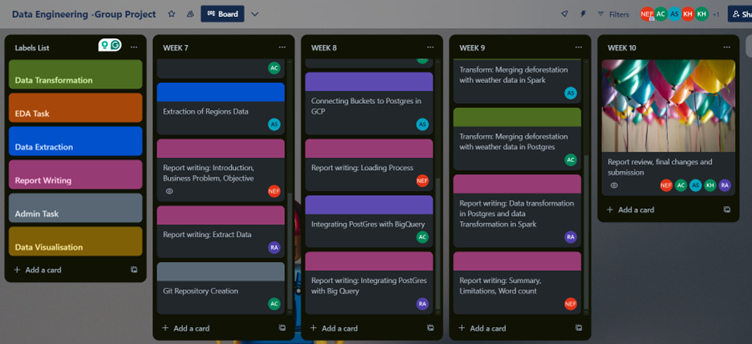![trello1.png](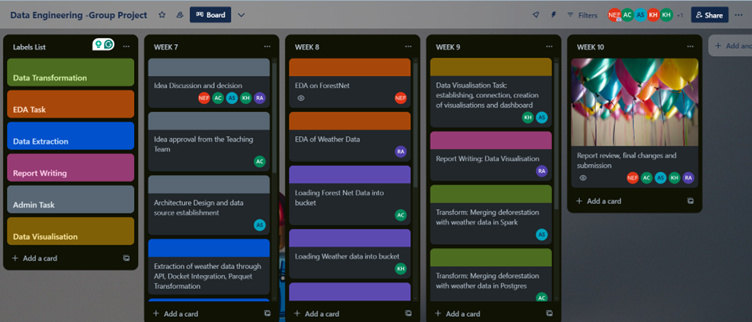![trello1.png](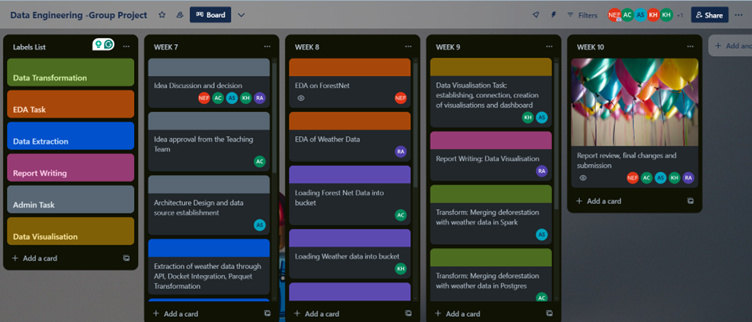![trello2.png](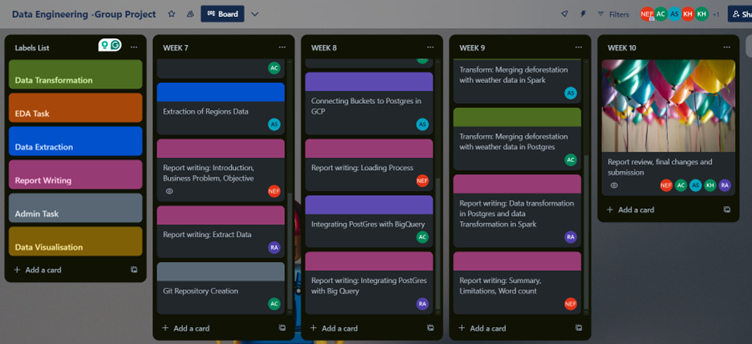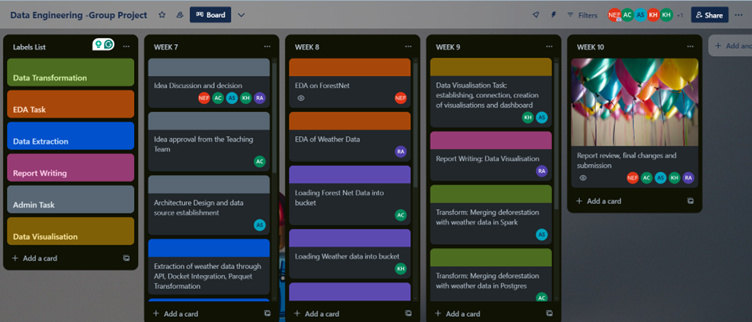)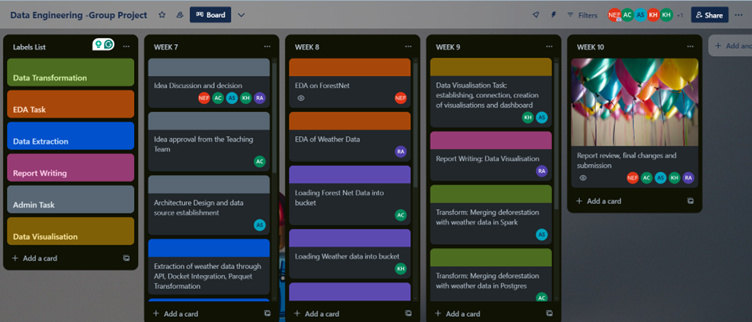)))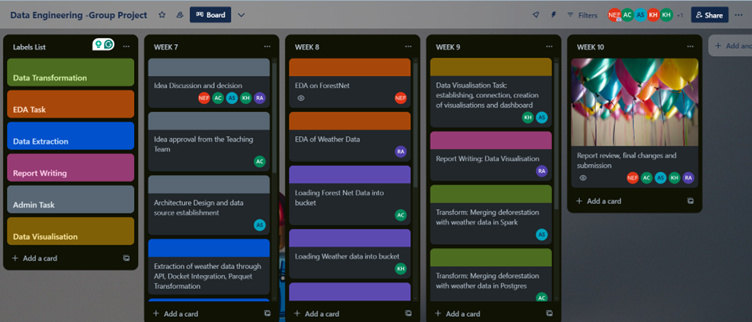)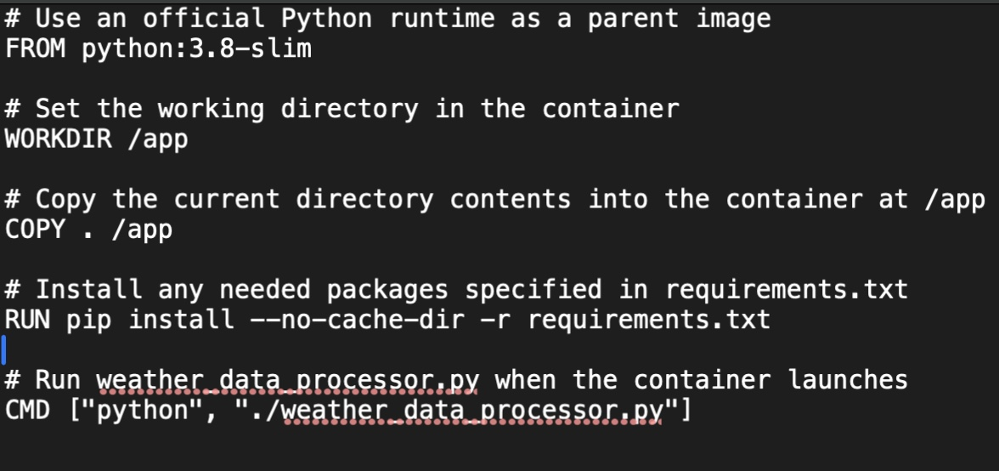

Commands were executed in the Terminal to build the Docker image and run the container. The process of building the image utilised a Docker command referencing the Dockerfile, while running the container involved setting the API key through an environment variable and mounting a volume for the CSV output.

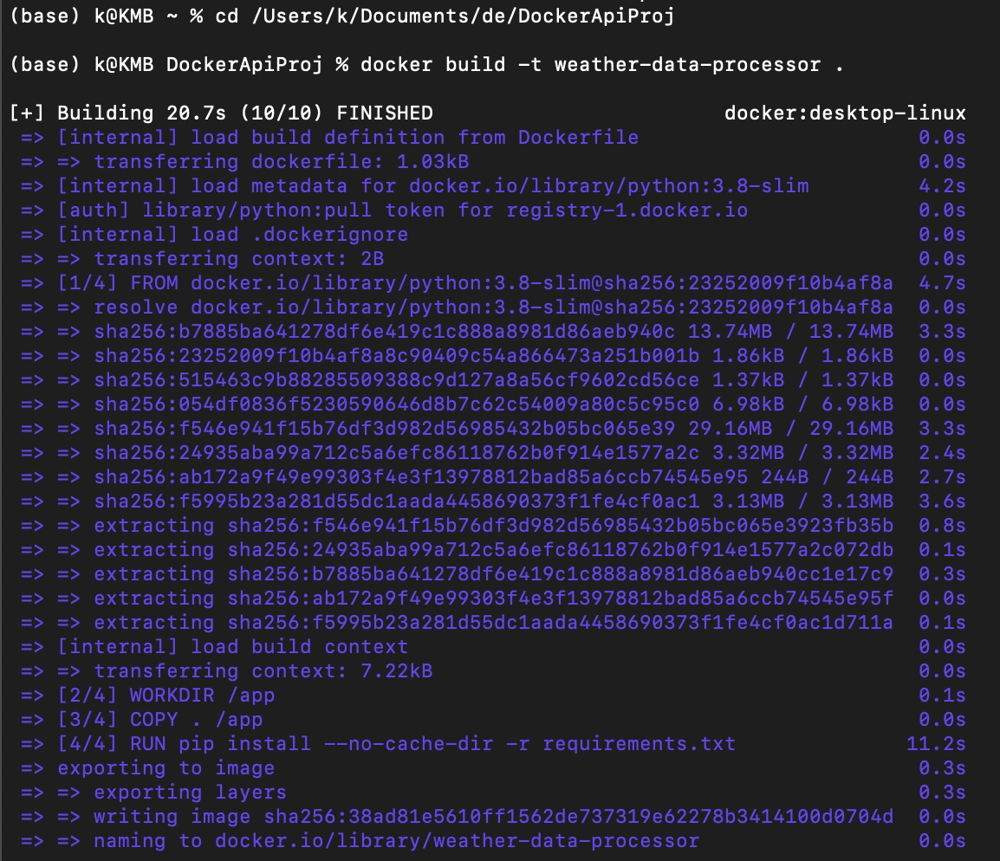

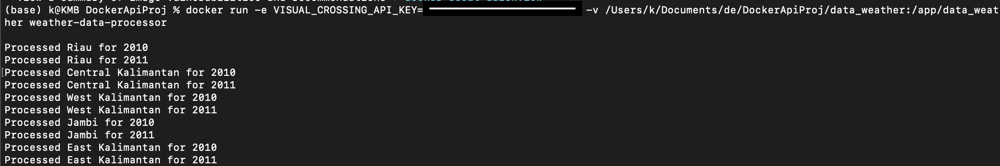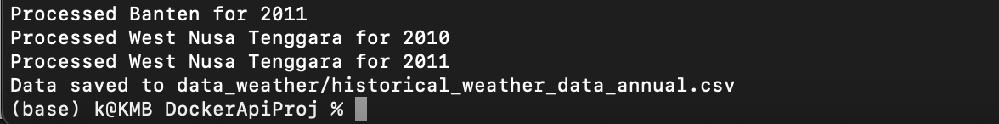

<a id="EDA"></a>
## 4. Exploratory Data Analysis

<a id="EDA-on-ForestNet"></a>
### 4.1 EDA on ForestNet

Following part is the Exploratory Data Analysis (EDA) of the forest dataset can reveal key spatial and temporal trends, aiding in the assessment of the deforestation causes.

The early EDA focused on revealing the connections between provinces, time, and deforestation causes

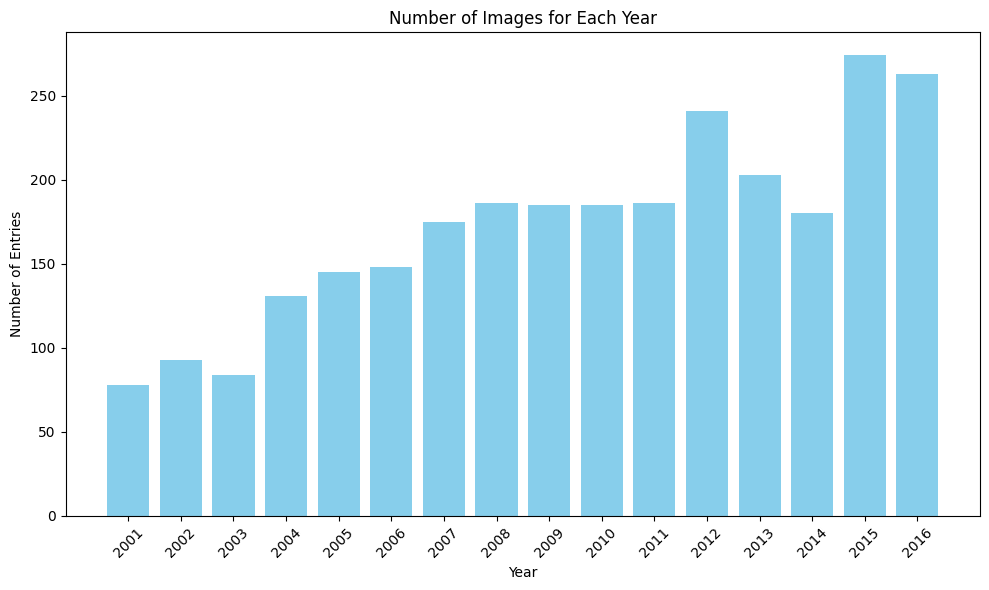

In [ ]:
# Assuming 'unique_years' is already defined
# Extract all the different datasets from the dataset
unique_years = df['year'].unique()

# Put the years in ascending order
unique_years.sort()

# Count the number of entries for each year
entry_counts = [len(df[df['year'] == year]) for year in unique_years]

# Plotting
plt.figure(figsize=(10, 6), facecolor = 'none', edgecolor='none')
plt.bar(unique_years, entry_counts, color='skyblue')
plt.xlabel('Year')
plt.ylabel('Number of Entries')
plt.title('Number of Images for Each Year')
plt.grid(False)
plt.xticks(unique_years, rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
#Calculating the total number of unique data points

# Create a set of tuples where each tuple is a unique location (latitude, longitude)
unique_locations = set(zip(df['latitude'], df['longitude']))

# Convert the set back to a list
unique_locations_list = list(unique_locations)

# Print the first few locations to verify
#print(unique_locations_list[:5])

# Count the number of unique loications on the dataframe
number_of_unique_locations = len(unique_locations)

# Display the number of unique locations
print("Total unique locations:", number_of_unique_locations)


Total unique locations: 2757


This bar graph below show the distribution of deforestation causes. Oil palm plantations are the leading cause with 599 entries, followed closely by small-scale agriculture at 576, with other factors like timber plantations, grassland shrubland, and mining contributing to a lesser extent.

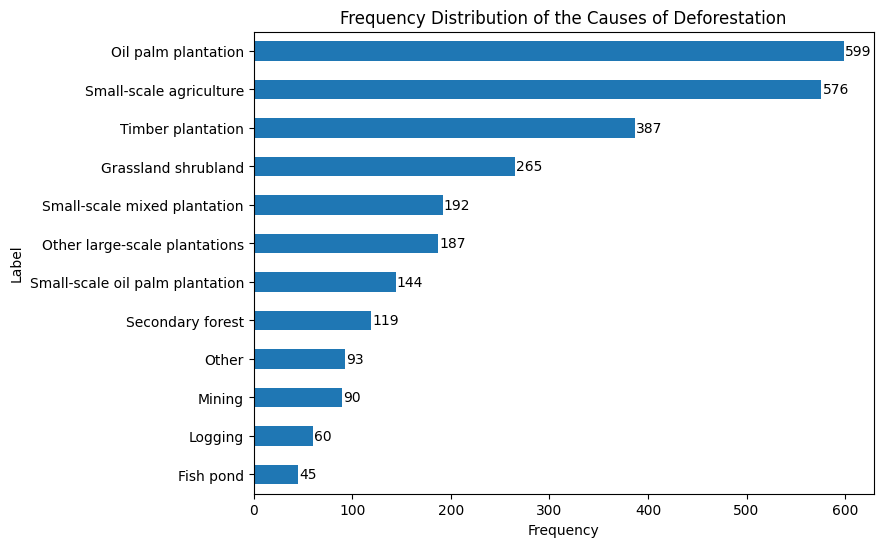

In [ ]:
# Calculate the frequency distribution of the 'label' column
label_counts = df['label'].value_counts().sort_values(ascending=True)  # Sort from smallest to largest

# Plotting the frequency distribution as a horizontal bar chart
plt.figure(figsize=(8, 6))
ax = label_counts.plot(kind='barh')  # Use 'barh' for horizontal bar chart
plt.title('Frequency Distribution of the Causes of Deforestation')
plt.xlabel('Frequency')
plt.ylabel('Label')
ax.set_facecolor('none')  # Set the axes background to transparent

# Iterate over the bars and add text labels
for i, v in enumerate(label_counts):
    ax.text(v + 1, i, str(v), color='black', va='center')

plt.show()

In [ ]:
#Causes and locations

# Create a base map
map = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=5, tiles='cartodbpositron')

# Optional: Use MarkerCluster to cluster close markers together
marker_cluster = MarkerCluster().add_to(map)

# Define a fixed list of colors
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

# Generate a color for each unique 'merged_label'
unique_labels = df['merged_label'].unique()
color_dict = {label: colors[i % len(colors)] for i, label in enumerate(unique_labels)}

# Add markers to the map, ensuring different colors for each 'merged_label'
for _, row in df.iterrows():
    icon_color = color_dict.get(row['merged_label'], 'lightgray')  # Default to 'lightgray' if no match
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Cause: {row['merged_label']}",
        icon=folium.Icon(color=icon_color)
    ).add_to(marker_cluster)

# Display the map
map


<a id="EDA-on-ForestNet"></a>


### 4.2 EDA on Weather Data





In [ ]:
# Read the CSV file into a DataFrame
weather_data = pd.read_csv("/content/drive/My Drive/ForestNetDataset/data_weather/combined_weather_data.csv")

weather_data.head()

,province,year,average_temp,average_rain
0,Aceh,2001,NaN,0.000
1,Bangka Belitung Islands,2001,26.933688,2757.200
2,Banten,2001,27.213151,2459.296
3,Bengkulu,2001,26.818207,2255.800
4,Central Kalimantan,2001,NaN,0.000


In [ ]:
weather_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 464 entries, 0 to 463
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   province      464 non-null    object 
 1   year          464 non-null    int64  
 2   average_temp  367 non-null    float64
 3   average_rain  464 non-null    float64
dtypes: float64(2), int64(1), object(1)
memory usage: 14.6+ KB


There are 29 of Indonesia's provinces in the dataset. Before 2010, there was incomplete average temperature data (as suggested by the lower non-null count).

<ipython-input-46-d70c480f6e38>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='average_temp', y='province',
<ipython-input-46-d70c480f6e38>:22: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='average_rain', y='province',


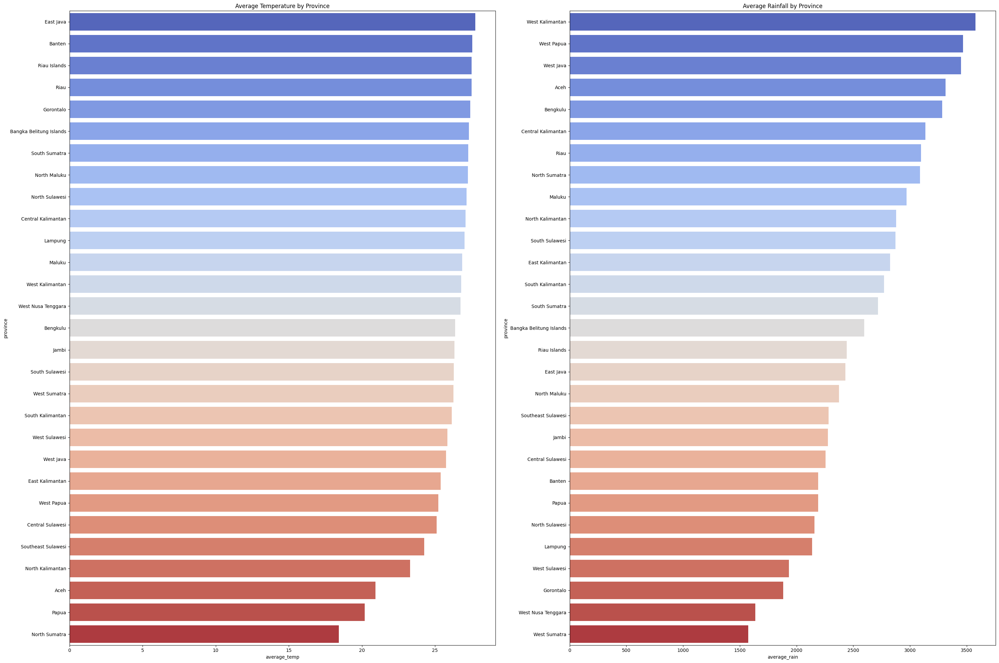

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
# Assuming weather_data is your DataFrame

# Drop rows with missing values for now
weather_data_cleaned = weather_data.dropna()

# Grouping by Province
province_grouped_temp = weather_data_cleaned.groupby('province').mean().reset_index().sort_values(by='average_temp', ascending=False)
province_grouped_rain = weather_data_cleaned.groupby('province').mean().reset_index().sort_values(by='average_rain', ascending=False)

# Visualizing average temperature and average rainfall by province
plt.figure(figsize=(30, 20))
plt.subplot(1, 2, 1)
sns.barplot(x='average_temp', y='province',
            data=province_grouped_temp, palette='coolwarm')
plt.title('Average Temperature by Province')

plt.subplot(1, 2, 2)
sns.barplot(x='average_rain', y='province',
            data=province_grouped_rain, palette='coolwarm')
plt.title('Average Rainfall by Province')

plt.rcParams.update({'font.size': 16})

plt.tight_layout()
plt.show()

The average temperatures across provinces range from 18.4 degrees in North Sumatra to 27.7 degrees in East Java, while average rainfall spans from 1574mm in West Sumatra to 3576mm in West Kalimantan.

<ipython-input-47-dfbc94172b8a>:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  year_grouped = weather_data_cleaned.groupby('year').mean().reset_index()


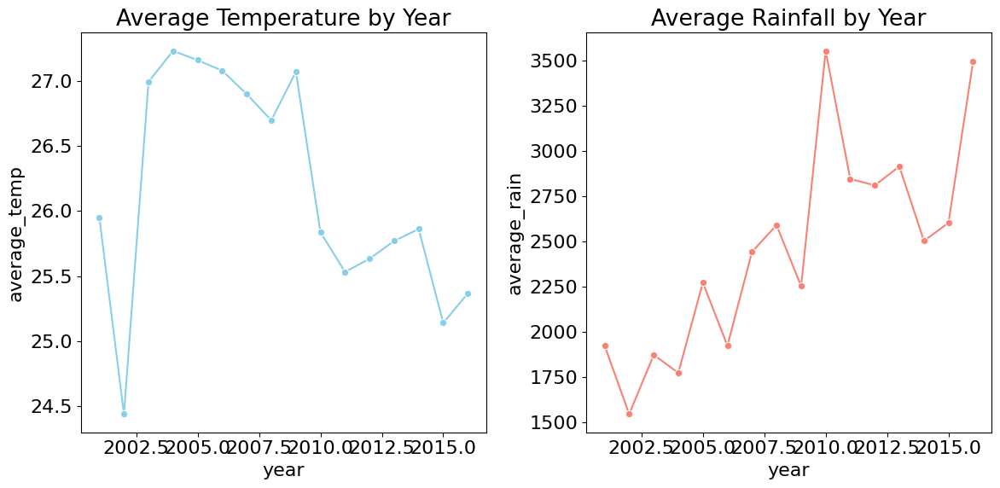

In [ ]:
# Grouping by Year
year_grouped = weather_data_cleaned.groupby('year').mean().reset_index()

# Visualising trends over the years
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.lineplot(x='year', y='average_temp', data=year_grouped, marker='o', color='skyblue')
plt.title('Average Temperature by Year')

plt.subplot(1, 2, 2)
sns.lineplot(x='year', y='average_rain', data=year_grouped, marker='o', color='salmon')
plt.title('Average Rainfall by Year')

plt.tight_layout()
plt.show()

Plotting average temperature amd rainfall for all of Indonesia provides interesting results. From 2000 to 2016, average rainfall increased from a low of 1546.78mm in 2002 to 3493.68mm in 2016. In contrast, average temperature peaks around the 27 degrees mark between 2003 and 2009 and then plummets to around 25 degrees from 2010 to 2016.

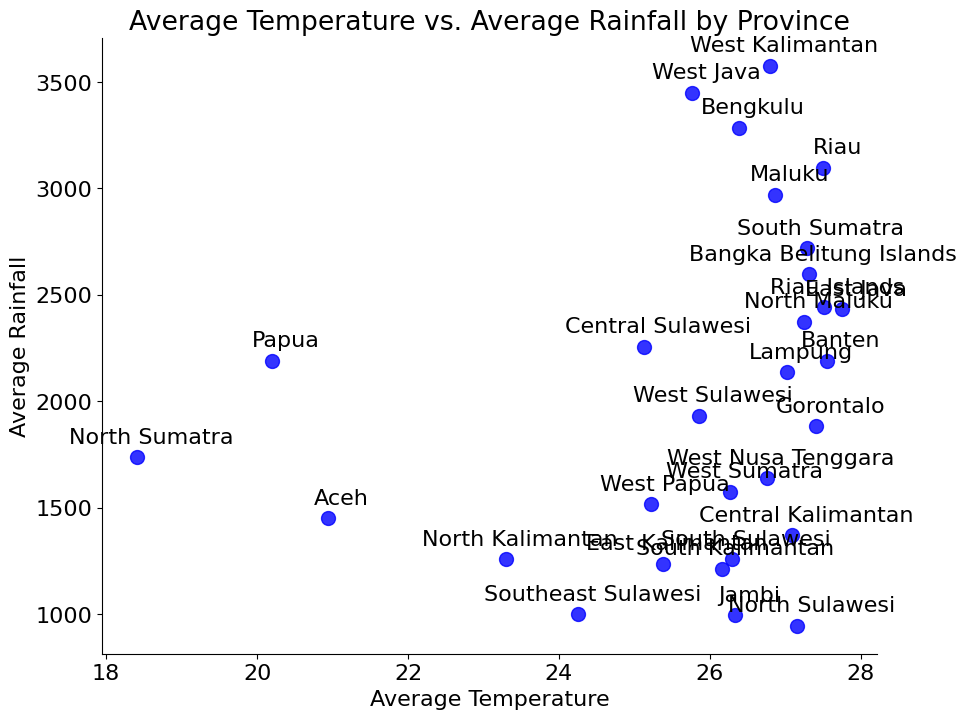

In [ ]:
from matplotlib import pyplot as plt

# Calculate the mean values for each province
province_means = weather_data.groupby('province').mean()

# Create the scatter plot with averaged values
plt.figure(figsize=(10, 8))
plt.scatter(x=province_means['average_temp'], y=province_means['average_rain'], s=100, alpha=0.8, color='blue')

# Add labels and title
plt.xlabel('Average Temperature')
plt.ylabel('Average Rainfall')
plt.title('Average Temperature vs. Average Rainfall by Province')

# Add province names as annotations
for province, temp, rain in zip(province_means.index, province_means['average_temp'], province_means['average_rain']):
    plt.annotate(province, (temp, rain), textcoords="offset points", xytext=(10, 10), ha='center')

# Remove top and right spines
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.show()

This is a scatter plot of average rainfall and temperature for all provinces. West Kalimantan stands out as a province that experiences both high temperatures and rainfall. In contrast, North Sumatra stands out as a province that experiences low rainfall and temperatures.

<a id="Load"></a>
## 5. Load

  This project utilizes the Google Cloud Platfrom(GCP) considering that it provides a wide range of effective, easy-to-implement cloud solutions with modern infrastructures(Google Cloud 2024).
  Within the GCP ecosystem, components used for the below pipeline are: Google Cloud Storage buckets and Cloud SQL for PostgreSQL. The choice of Cloud-Based Storage provides inherent scaability as it  enables an easy expansion of IT resources to meet fluctuating demands (VMWARE 2024).


<a id="Load-forest-net-csv-into-postgres"></a>
### 5.1 Load forest net and weather data  into bucket




 Google Cloud Storage buckets have been selected for storing data in the cloud. Buckets enable a centralisation of the data storage which increases the efficiency of the processes, they are a scalable solution for data storage and they ensure flexible and secure accesibility to data (LogicMonitor 2022).

The process involves creating and uploading data into cloud storage buckets in Google Cloud Platform(GCP).
Initially access had to be secured to the GCP services and storage capabilties by authenticating user's credentials.

Two buckets are created:

*   **ucl-forest** - for storing the deforestation data
*   **ucl-weather** - for storing the weather data.

 The corresponding csv files and image data are uploaded to the buckets via python script, by defining a function connecting to the bucket.  Hence after the completion of these steps the buckets serve the purpose of being repositories for storing the datasets.
The above process can be seen on the following github link: https://github.com/acerutti/ucl-forest-weather/blob/main/main.py




**Example of Function for the Bucket Creation**

```
# Instantiates a client
storage_client = storage.Client()

## WEATHER BUCKET ##
# The name for the new bucket for the weather

bucket_name = "ucl-weather"
bucket = storage_client.create_bucket(bucket_name)
print(f"Bucket {bucket.name} created.")
```






To upload files on the bucket, we created two different functions: one for uploading individual files and one for uploading pictures folders.

**Individual Files**
```
def upload_blob(bucket_name, source_file_name, destination_blob_name):
  """Uploads a file to the bucket."""
  storage_client = storage.Client()
  bucket = storage_client.get_bucket(bucket_name)
  blob = bucket.blob(destination_blob_name)

  blob.upload_from_filename(source_file_name)

  print('File {} uploaded to {}.'.format(
      source_file_name,
      destination_blob_name))
```
**Folder with Picture**

This function recursively uploads all files from a specified directory on the local filesystem to a Google Cloud Storage bucket, maintaining the directory structure.
```
def upload_directory_to_bucket(bucket_name, source_directory):
    """Uploads a directory to the bucket."""
    storage_client = storage.Client()
    bucket = storage_client.get_bucket(bucket_name)
    
    for local_dir, _, files in os.walk(source_directory):
        for file in files:
            local_file_path = os.path.join(local_dir, file)
            
            # Construct the full path for the destination blob
            # Using the folder names as the blob prefix
            relative_path = os.path.relpath(local_file_path, source_directory)
            destination_blob_name = relative_path.replace("\\", "/")  # Ensure proper path format for GCS
            
            blob = bucket.blob(destination_blob_name)
            blob.upload_from_filename(local_file_path)
            
            print(f'File {local_file_path} uploaded to {destination_blob_name}.')
```
For storage costs reasons we only uploaded five folders to the bucket (see Appendix)

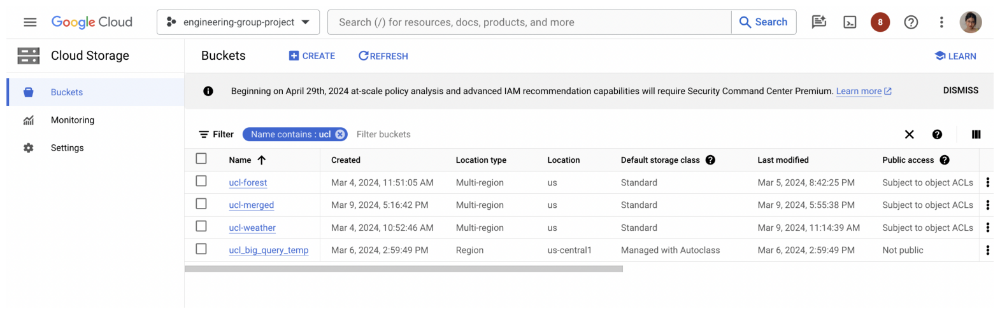

In [ ]:
# The buckets were created
image_1 = Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/buckets1.png')
# Set the figure size to a larger value to make the displayed image bigger
plt.figure(figsize=(20, 10))  # Adjust the width and height as needed
# Remove the axis for a cleaner look
plt.axis('off')
# Display the image
plt.imshow(image_1)

<a id="Load-weather-into-postgres"></a>
### 5.2 Connecting Buckets to Postgres in GCP


  Once the data has been loaded into the buckets, we can connect them to CloudSQL - Postgres to create the respective tables for forest and weather data.
  
  PostgreSQL database within GCP is a highly reliable and scalable database system.
  The initial step requires the creation of an instance in PostgreSQL, where a **forestnet-data instance** is created.



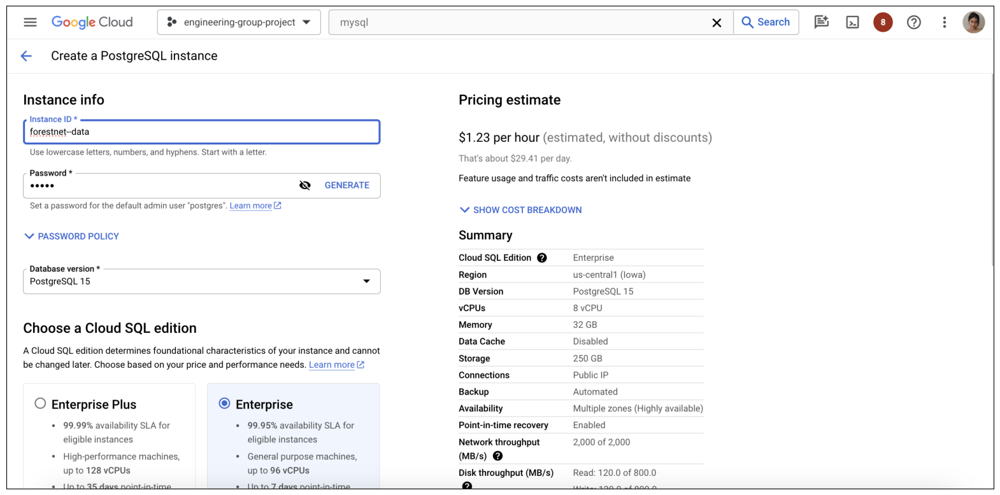

In [ ]:
# Open the image file
forestnet = Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/forestnet.png')
# Set the figure size to a larger value to make the displayed image bigger
plt.figure(figsize=(20, 10))  # Adjust the width and height as needed

plt.xticks([])
plt.yticks([])

# Display the image
plt.imshow(forestnet)

In order to minimize expenses, the us-central1(Iowa) was selected as it offers a single-zone availability. The forestnet-data instance was created.

  Storing the data in a relational database like PostgreSQL involves the creation of structured tables which supports quering operations.
  In order to achieve oraganisation and facilitate efficient quering operations the next step includes the creation of tables in the database.
  A direct Interaction with the PostgreSQL database has been achieved through the connection with the Command Line Interface(CLI), which enables a more rapid, automated and direct command execution (Abdishakur 2023).
  
  Executing the following command in CLI
  **`gcloud sql connect forestnet-data --user=postgres`**, secures access to the PostgreSQL environment, indicated by the terminal prompt changing to postgres=>, which welcomes SQL statements for direct database management. Kindly note that the database is named Postgres, which is the default database and it is authorised with the user named Postgres.




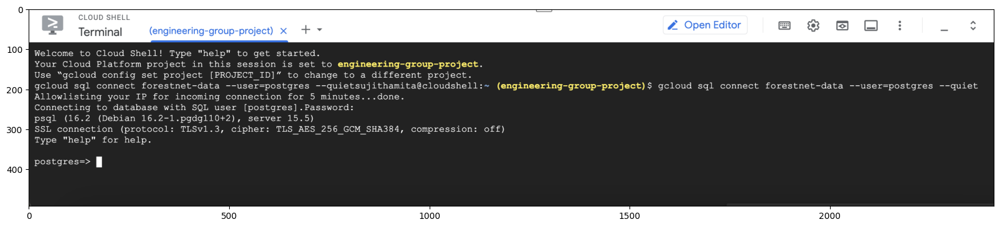

In [ ]:
image_3 = Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/Picture3.1.png')
# Set the figure size to a larger value to make the displayed image bigger
plt.figure(figsize=(20, 10))  # Adjust the width and height as needed

# Display the image
plt.imshow(image_3)

  Once the access to psql client is established, the two tables for deforestaion and weather data can be created.The schemas are designed in a manner that fits the data facilitating the load and quering of data in the environment.

* **deforestation_data:**
  CREATE TABLE deforestation_data (
  label VARCHAR(255),
  merged_label VARCHAR(255),
  latitude FLOAT,
  longitude FLOAT,
  year INT,
  example_path TEXT,
  province TEXT
);

* **weather_data:**
CREATE TABLE weather_data (
    Province VARCHAR(255),
    Year INT,
    Month INT,
    Average_Temperature_Celsius FLOAT,
    Total_Rainfall_mm FLOAT
);




The gsutil tool is being used to upload the data from the Buckets to the schemas via CLI as it is considered an efficient practice for automating tasks that are complicated to accomplish through the GoogleCloud Console (Almeida 2024).

NOTE : The commands to upload **deforestaion_causes_regions.csv** file from ucl-forest bucket to the postgres table can be observed below:

1.  Extract the relevant csv file from the bucket and remove the head row for compatatbility with the schemas.


> **gsutil cat gs://ucl-forest/deforestation_causes_regions.csv | tail -n +2 | gsutil cp - gs://ucl-forest/deforestation_causes_regions_no_header.csv**



2.  Import the clean data into the PostgreSQL database.


> **gcloud sql import csv forestnet-data gs://ucl-forest/deforestation_causes_regions_no_header.csv --database=postgres --table=deforestation_data --project=engineering-group-project**




3. The **'SELECT * FROM deforestation_data;'** output verifies the succesfull import.



It can be observed below that the tables have been loaded succesfully:

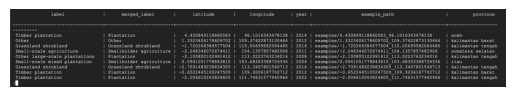

In [ ]:
#Deforestion table has been populated succesfully

deforestation_data = Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/deforestation_data.png')
# Set the figure size to a larger value to make the displayed image bigger

plt.axis('off')
# Display the image
plt.imshow(deforestation_data)

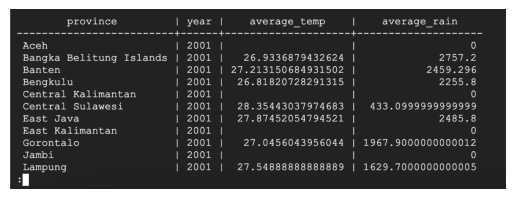

In [ ]:
#Weather table has been populated succesfully

weather_data = Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/weather_data.png')
# Set the figure size to a larger value to make the displayed image bigger

plt.axis('off')
# Display the image
plt.imshow(weather_data)

#6.Transform

<a id="Postgres to spark"></a>
### 6.1 Connect Postgres to Spark Pipeline for merging data

Connecting PostgreSQL to Spark is beneficial as it combines Spark's ability to handle large-scale data processing with PostgreSQL's robust data storage and retrieval capabilities, enabling efficient analysis of large datasets.

**Objective:**

Inorder to facilitate effeicient data analysis, the goal is to integrate the deforestation table and the weather table. Merging these 2 tables is a crucial step as it helps us build effective visualisations. This can be done via spark or directly in postgres. In this section, we are covering the steps to effectively create a spark pipeline to create a new merged table.

#### 5.3.1 Connect to Postgres via Visual Studio Code

We first connect to the postgres instance forestnet-data with the credentials. The steps can be observed in the https://github.com/acerutti/ucl-forest-weather/blob/main/spark%20and%20Postgres.py file.

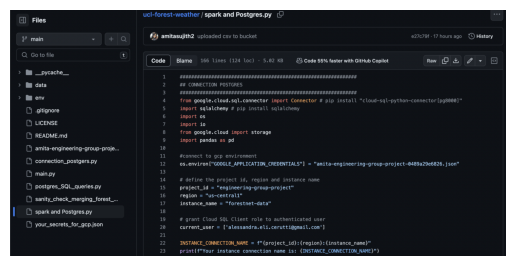

In [ ]:
spark = Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/Spark-Git.png')
# Set the figure size to a larger value to make the displayed image bigger

plt.axis('off')
# Display the image
plt.imshow(spark)

#### 5.3.2 Import SparkSession and install JDBC Driver









In this script, we establish a connection between Spark and a PostgreSQL database using SparkSession, allowing us to read data directly from PostgreSQL tables into Spark DataFrames. Specifically, we're retrieving data from two tables, 'deforestation_data' and 'weather_data', and loading them into Spark for further processing and analysis.

Here we merge the two tables and create a merged_df which can now be converted into a csv file and uploaded into postgres. The steps can be observed at https://github.com/acerutti/ucl-forest-weather/blob/main/spark%20and%20Postgres.py



#### 5.3.3 Upload the merged csv file to PostgreSQL

The spark pipeline creates a new csv file named **'merged_deforestation_weather.csv'** which can be viewed in the data tab of github.

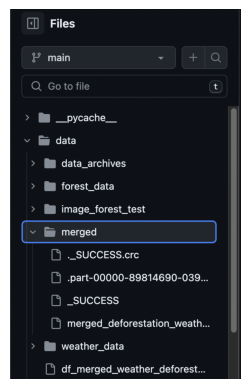

In [ ]:
data_git = Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/data-git.png')
# Set the figure size to a larger value to make the displayed image bigger

plt.axis('off')
# Display the image
plt.imshow(data_git)

This CSV file can be uploaded to Postgres following similar steps as above.


1.   Create a Bucket named **ucl-merged.**

2.   Upload CSV to bucket via VS Code, the script can be viewed at https://github.com/acerutti/ucl-forest-weather/blob/main/spark%20and%20Postgres.py

3. Create table schema in PostgreSQL for merged data:


>  CREATE TABLE merged_deforestation_weather (
            year INT,
            province TEXT,
            label VARCHAR(255),
            merged_label VARCHAR(255),
            latitude FLOAT,
            longitude FLOAT,
            example_path TEXT,
            average_temp FLOAT,
            average_rain FLOAT
        );



4. Upload from bucket to Postgres in the CLI with the following command:


> **gcloud sql import csv forestnet-data gs://ucl-merged/merged_deforestation_weather_no_header.csv --database=postgres --table=merged_deforestation_weather --project=engineering-group-project**

4. Verify the data has been succesfully uploaded via the following command: **SELECT * FROM merged_deforestation_weather**





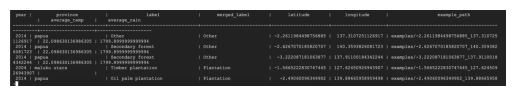

In [ ]:
# Merged table has been populated succesfully

merged_deforestation_weather= Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/merged_deforestation_weather.png')
plt.axis('off')
# Display the image
plt.imshow(merged_deforestation_weather)

The table has been succesfully populated!

<a id="Postgres"></a>
### 6.2 Alternate Method: Merge data in Postgres

We observed above the method of using spark dataframes to merge deforestation_data and weather_data tables. Alternatively, SQL Queries could be run on PostgreSQL in Google Cloud to facilitate data merging.

The script to run the same can be observed at https://github.com/acerutti/ucl-forest-weather/blob/main/postgres_SQL_queries.py



<a id="viz"></a>
#Data Visualizations

For the purpose of creating the visualisations the PostgreSQL database hosted on Google Cloud was connected to Metabase using the provided public IP address as the hostname, along with the necessary database name, username, password, and port for access.

Metabase was selected for its ease of use and approachable interface, allowing for the rapid creation of visualisations and dashboards. The key advantages of using Metabase include its simplicity in transforming data into insights, the ability to generate and share reports efficiently, and its supportive features for collaborative data exploration.

link to the dashboard can be found at https://deforestationproject.metabaseapp.com/dashboard/9-merged-deforestation-weather?tab=10-tab-1


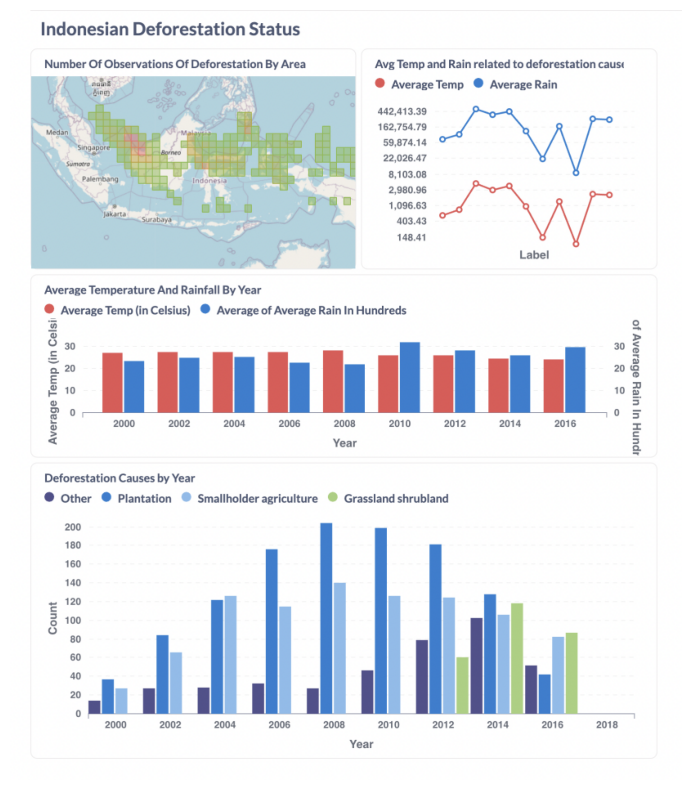

In [ ]:
# View dashboard

dashboard1= Image.open('/content/drive/MyDrive/ForestNetDataset/dashboard1.png')


# Set the figure size to a larger value to make the displayed image bigger
plt.figure(figsize=(15, 10))  # Adjust the width and height as needed

plt.axis('off')

# Display the image
plt.imshow(dashboard1)

**Observation:**

We have a heatmap that identifies which regions are most affected by deforestation by analyzing the color density on the map. Darker shades typically represent higher counts of deforestation instances.

The bar chart *'Average Temperature and Rainfall by Year'* displays the patterns of rainfall and temperature variations from the years 2000 to 2016.

Deforestation can be caused due to multiple reasons such as excess planation, smallholder agriculture , grassland shrubland etc. The bar chart *'Deforestation causes by Year'* indicates that one of the biggest contributing factors of deforestation is plantation and the effects of these were most observed from 2008 to 2012.

It is interesting to observe that in the years that sees less rainfall and higher temperature- specifically the years 2006 and 2008, the deforestation caused is seemingly high.

# Limitations


# 8.1 Exploratory Attempt: Integrating PostgreSQL with BigQuery

As part of the data transformation step, we explored the idea of using BigQuery. Google BigQuery is a serverless, fully managed enterprise data warehouse. It utilizes BigTable and the Google Cloud Platform and is able to join, query, and analyze data of any size, from a few rows to petabytes, in just a few seconds.(referenece : https://www.sprinkledata.com/blogs/5-best-practices-for-bigquery-etl#:~:text=BigQuery%20is%20a%20fast%2C%20cost,of%20data%20through%20ANSI%20SQL.)

Why use Bigquery?

BigQuery provides a highly scalable and serverless data warehouse solution. By connecting BigQuery to PostgreSQL, we can leverage BigQuery's powerful analytics and ML capabilities on the PostgreSQL data, making it ideal for running complex queries and extracting insights from large datasets near real-time.

To upload data we need to build a CDC pipeline using datastream.Building a CDC pipeline is a straightforward way to continuously pipeline our data from postgres to Google BigQuery in near real-time making it easily available for Analytics, Reporting, and Machine Learning.

The region we sleected for building our datastream was US-Central 1 Region Iowa.

Choosing a single region for all services in a project, helps us reduce latency, as data doesn't have to travel as far, leading to faster response times and a better user experience. This also reduces data transfer costs, which are often higher for inter-regional data movement and simplifies operational logistics.

8.1.1 Create a dataset and table in Bigquery

Before building the datastream to connect Postgres to BigQuery, we need to build a dataset and a table schema. A well-defined dataset and schema ensure that the data transferred from PostgreSQL is organized and stored correctly in BigQuery and helps us effectively manage relationships.

A dataset named 'forestnet_dataset' and a schema for table named 'deforestation_data' was created.

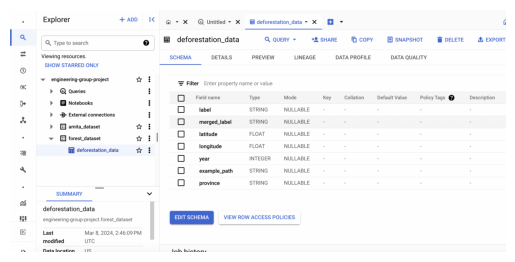

In [ ]:
from PIL import Image
bq1 = Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/bigq1.png')
# Set the figure size to a larger value to make the displayed image bigger

plt.axis('off')
# Display the image
plt.imshow(bq1)

8.1.2 Create connection profiles

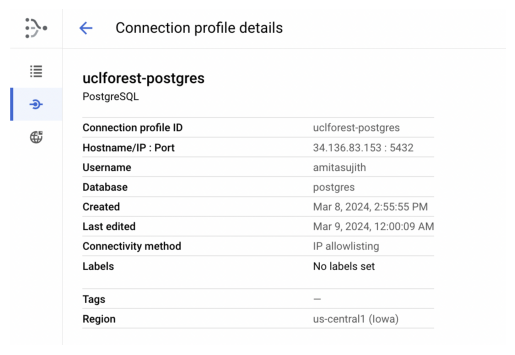

In [ ]:
#source connection profile
bq2 = Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/bigq2.png')
# Set the figure size to a larger value to make the displayed image bigger

plt.axis('off')
# Display the image
plt.imshow(bq2)

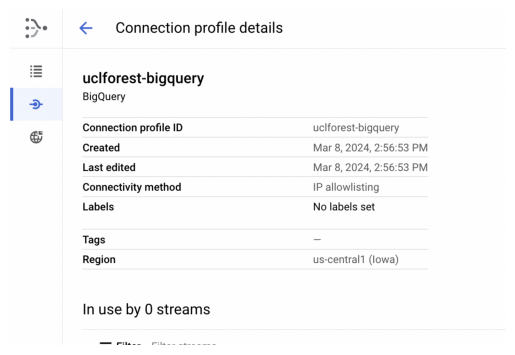

In [ ]:
#destination connection profile
bq3 = Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/bigq3.png')
# Set the figure size to a larger value to make the displayed image bigger

plt.axis('off')
# Display the image
plt.imshow(bq3)

#### 8.1.2 Create the Datastream

**Data** streams facilitate real-time or near-real-time data ingestion into BigQuery, ensuring that the data warehouse is continuously updated with the latest information

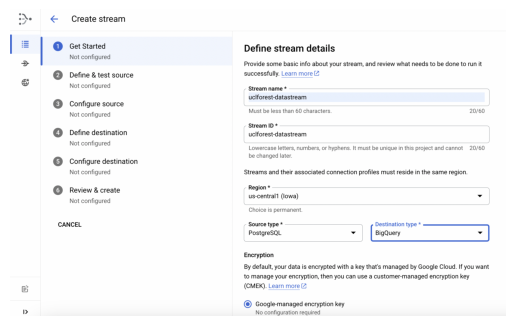

In [ ]:
#Defining stream details
bq4 = Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/bigq4.png')
# Set the figure size to a larger value to make the displayed image bigger

plt.axis('off')
# Display the image
plt.imshow(bq4)

We created a datastream named 'uclforest-datastream'. As part of this step we also created a publication and replication slot in the CLI.

**Publication:** In PostgreSQL, a publication is a set of database changes (inserts, updates, deletes) that can be replicated. We created it by running the following command:

CREATE PUBLICATION pubforest FOR ALL TABLES;


**Replication slot:** It is a feature that ensures changes to the database are not removed before they have been replicated to all subscribers. After connecting with a user with sufficient privileges, we can create a replication slot by running the following command:

SELECT PG_CREATE_LOGICAL_REPLICATION_SLOT(‘repforest’, ‘pgoutput’);

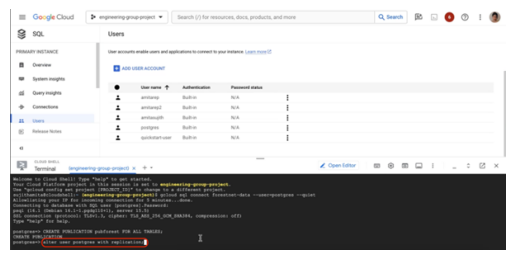

In [ ]:
#Replication slot
replication = Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/replicationslot.png')
# Set the figure size to a larger value to make the displayed image bigger

plt.axis('off')
# Display the image
plt.imshow(publication)

Followingly, a unique a user called "ucidatastream" was generated and it was granted permission to read and access objects within this schema.


> CREATE USER ucidatastream WITH REPLICATION IN ROLE cloudsqlsuperuser LOGIN PASSWORD 'bauci';

Once the role was created, we granted the user all permissions by running the command:


> GRANT SELECT ON ALL TABLES IN SCHEMA public TO ueldatastream;
GRANT USAGE ON SCHEMA public TO ucidatastream;
ALTER DEFAULT PRIVILEGES IN SCHEMA public
GRANT SELECT ON TABLES TO ucidatastream;








Subsequently, within the web interface, configurations are being made for both the data source and the destination. This involves specifying the necessary tables to be extracted from the database, as well as setting up the destination.

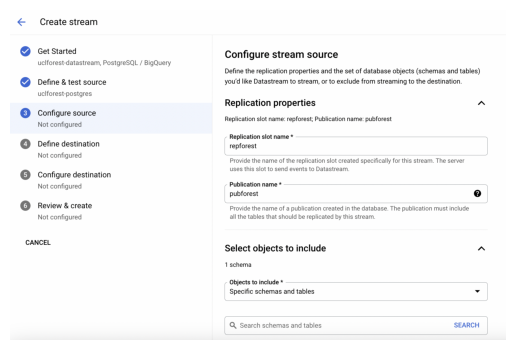

In [ ]:
#Source Configuration
source= Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/source-bq.png')
# Set the figure size to a larger value to make the displayed image bigger

plt.axis('off')
# Display the image
plt.imshow(source)

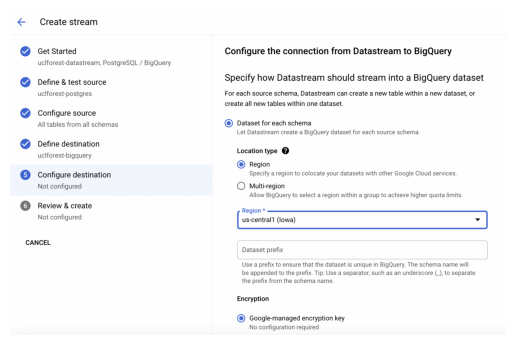

In [ ]:
#Destination Configuration
destination= Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/destination-bq.png')
# Set the figure size to a larger value to make the displayed image bigger

plt.axis('off')
# Display the image
plt.imshow(destination)


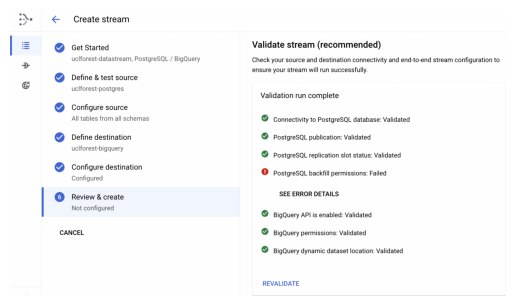

In [ ]:
#Running validation to create data stream
validation_bq = Image.open('/content/drive/MyDrive/ForestNetDataset/Screenshots/validation_bq.png')
# Set the figure size to a larger value to make the displayed image bigger

plt.axis('off')
# Display the image
plt.imshow(validation_bq)

Following this setup, the connectivity is then tested throgh the following commands :

```bash
gsutil cat gs://ucl-weather/historical_weather_data_top3.csv | tail -n +2 | gsutil cp - gs://ucl-weather/historical_weather_data_top3_no_headers.csv
gcloud sql import csv forestnet-data gs://ucl-weather/historical_weather_data_top3_no_headers.csv --database=postgres --table=weather_data --project=engineering-group-project```

Why we couldn't proceed with BigQuery

As observed above, the validation did not pass and we were unable to create the datastream due to the error: *'PostgreSQL backfill permissions: Failed'*

The error statement suggested that "One or more tables in the stream's include list weren't found or Datastream couldn't read from them. Make sure that the tables exist and that Datastream has the necessary permissions."

# Limitations for scalability

After performing transformations using Spark, data must be routed through a storage bucket prior to being loaded into the PostgreSQL database. This intermediate step may increase latency and act as a bottlneck in the pipeline especially as the volume of data scales up.

#Source Version Control(SCM)

For the operations of our project, Git has been used for version control system purposes. It was chosen based on its efficiency for collaborating, reviewing code and tracking changes (Wayne 2023). Hence a detailed view of the project's codebase can be found through the project's GitHub repository: https://github.com/acerutti/ucl-forest-weather

# Project Management

#Summary

The project successfully implemented a fully cloud-based, scalable architecture that leveraged diverse data extracting,  loading  and transformative techniques. The subsequent phase could involve creating a dynamic deforestation dashboard featuring live weather data and risk alerts, coupled with advanced analysis and machine learning for better predictions and insights to combat deforestation.

# References


•	Abdishakur H.(2023)What Is a Command-Line Interface? Built In. Available at: https://builtin.com/software-engineering-perspectives/command-line-interface (Accessed: 9 March 2024).

•	Almeida, T. A. (2024) gsutil: Command-Line Control of Google Cloud Storage, NetApp BlueXP. Available at: https://bluexp.netapp.com/blog/gsutil-command-line-control-of-google-cloud-storage (Accessed: 9 March 2024).

•	DGB Group(2024) Countries with the highest deforestation rates in the world, DGB Group. Dutch Green Business Group. Available at: https://www.green.earth/blog/countries-highest-deforestation-rates (Accessed: 10 March 2024).

•	Geodata.mit.edu. (2015). First-level Administrative Divisions, Indonesia, 2015 - GeoWeb.  Available at: https://geodata.mit.edu/catalog/stanford-ky614gm0524.
•	Hijmans and California, U. of (2015) First-level Administrative Divisions, Indonesia, 2015, GeoWeb. University of California, Berkeley. Museum of Vertebrate Zoology. Available at: https://geodata.mit.edu/catalog/stanford-ky614gm0524 (Accessed: 10 March 2024).

•	Irvin, J., Sheng, H., Ramachandran, N., Johnson-Yu, S., Zhou, S., Story, K.T., Rustowicz, R., Elsworth, C.W., Austin, K. and Ng, A.Y. (2020). ForestNet: Classifying Drivers of Deforestation in Indonesia using Deep Learning on Satellite Imagery. arXiv (Cornell University). doi:https://doi.org/10.48550/arxiv.2011.05479.

•	LogicMonitor (2023) What is a bucket in GCP? GCP buckets explained, LogicMonitor. Available at: https://www.logicmonitor.com/blog/what-is-a-bucket-in-gcp-gcp-buckets-explained (Accessed: 10 March 2024).
•	Risser MD(2024), Collins WD, Wehner MF, O’Brien TA, Huang H, Ullrich PA. Anthropogenic aerosols mask increases in US rainfall by greenhouse gases.
Nature Communications.;15(1):1318. doi: 10.1038/s41467-024-45504-8

•	Ritchie (2023) Deforestation and Forest Loss, Our World in Data. Available at: https://ourworldindata.org/deforestation#:~:text=Globally%20we%20deforest%20around%20ten%20million%20hectares%20of%20forest%20every%20year.&text=That’s%20an%20area%20the%20size,deforestation%20occurs%20in%20the%20tropics. (Accessed: 10 March 2024).
•	Stanford ML Group(2020)ForestNet: Classifying Drivers of Deforestation in Indonesia using Deep Learning on Satellite Imagery. Available at: https://stanfordmlgroup.github.io/projects/forestnet/ (Accessed: 10 March 2024).

•	VMWARE(2024). Available at: https://www.vmware.com/topics/glossary/
content/cloud-scalability.html#:~:text=Cloud%20scalability%20in%20cloud%20computing,its%20exploding%20popularity%20with%20businesses. (Accessed: 10 March 2024).

•	Wayne, R. (2023) Unlocking the Power of Git: The Benefits of Using Git for Source Code Management, Medium. Medium. Available at: https://medium.com/@rick.wayne.2022/unlocking-the-power-of-git-the-benefits-of-using-git-for-source-code-management-8e4eae6782c7#:~:text=Git%20provides%20a%20complete%20version,to%20identify%20and%20resolve%20issues. (Accessed: 10 March 2024).

•	 Google (2024) Google Cloud. Why Google Cloud?. Available at: https://cloud.google.com/why-google-cloud?hl=en (Accessed: 9 March 2024).

In [ ]:
import nbformat

# Load the current notebook
notebook_path = '/content/drive/MyDrive/ForestNetDataset/DE_Forest_Net_Draft.ipynb'  # Adjust this to the path of your notebook
with open(notebook_path, 'r', encoding='utf-8') as nb_file:
    nb_contents = nbformat.read(nb_file, as_version=4)

# Initialize word count
total_word_count = 0

# Iterate through each cell in the notebook
for cell in nb_contents['cells']:
    if cell['cell_type'] == 'markdown':
        total_word_count += len(cell['source'].split())
    elif cell['cell_type'] == 'code':
        # Count words in code comments
        comments = [line for line in cell['source'].split('\n') if line.strip().startswith('#')]
        comment_text = ' '.join(comments)
        total_word_count += len(comment_text.split())

# Print the total word count
print(f"Total Word Count: {total_word_count}")


Total Word Count: 5080


In [ ]:
import nbformat

# Load the current notebook
notebook_path = '/content/drive/MyDrive/ForestNetDataset/DE_Forest_Net_Draft.ipynb'  # Adjust this to the path of your notebook
with open(notebook_path, 'r', encoding='utf-8') as nb_file:
    nb_contents = nbformat.read(nb_file, as_version=4)

# Initialize word count
total_word_count = 0
skip_cell_content = "#skip_word_count"

# Iterate through each cell in the notebook
for cell in nb_contents['cells']:
    if cell['cell_type'] == 'markdown':
        # Check if cell contains the skip flag
        if skip_cell_content not in cell['source']:
            total_word_count += len(cell['source'].split())
    elif cell['cell_type'] == 'code':
        # Check if cell contains the skip flag
        if skip_cell_content not in cell['source']:
            # Count words in code comments
            comments = [line for line in cell['source'].split('\n') if line.strip().startswith('#')]
            comment_text = ' '.join(comments)
            total_word_count += len(comment_text.split())
total_word_count = total_word_count- 269 - 56 #references & table contetns

# Print the total word count
print(f"Total Word Count: {total_word_count}")


Total Word Count: 4705


#Appendix

In [ ]:
#The following code provides
image_names = [
    "-0.002226324002905_109.97159881327198",
    "-0.025186616919319_113.71975529073988",
    "-0.03027428009349_101.59766149324824",
    "-0.22946911191326_101.62682788208392",
    "-0.23142888714857_99.87426629402542"
]

# Function to find matching row in DataFrame for given image name
def find_matching_row(gdf, image_name):
    # Split image name into latitude and longitude
    lat_str, long_str = image_name.split('_')
    latitude = float(lat_str)
    longitude = float(long_str)

    # Find row in DataFrame where latitude and longitude match
    match = df[(df['latitude'].astype(str).str.contains(lat_str)) & (df['longitude'].astype(str).str.contains(long_str))]
    return match

# Iterate through image names and find matching rows
matches = []
for image_name in image_names:
    match = find_matching_row(df, image_name)
    if not match.empty:
        matches.append((image_name, match.index.tolist()))

matches

[('-0.002226324002905_109.97159881327198', [392]),
 ('-0.025186616919319_113.71975529073988', [2502]),
 ('-0.03027428009349_101.59766149324824', [1513]),
 ('-0.22946911191326_101.62682788208392', [162]),
 ('-0.23142888714857_99.87426629402542', [2584])]